# Forecasting the Demand for Electric Cars and Charging Stations in Washington State 

# INTRODUCTION

Climate change is a major concern globally, with transportation being the largest contributor to greenhouse gas emissions in the US.
Current US government aims to pass a bipartisan infrastructure deal focusing on clean energy and developing a nationwide electric vehicle charger network.
States like California and Washington are pushing for mandates to phase out gasoline vehicles and promote electric vehicles by 2035 and 2030, respectively.
Major car manufacturers like Ford, GM, and Volvo have announced plans to transition to fully electric vehicles in the next decade.

These changes would result in a significant increase in demand for electric vehicles.
The existing charging infrastructure in states like California and Washington needs to be assessed for its ability to support the growing demand for EVs.

## Objective
The objective of this analysis is to predict the demand for electric vehicles in each county in Washington and identify counties that require strategically positioned electric vehicle chargers. By utilizing time series modeling, we aim to recommend the top 10 counties for investment based on their high electric vehicle purchases and minimal charger availability.

## Data

We will analyze Washington state's electric vehicle title and registration activity data to track the number of electric vehicles in each county over time. Furthermore, we will examine the current charging infrastructure data provided by the National Renewable Energy Laboratory to identify counties with significant potential for financial success. 

[Electric vehicle title and registration activity data](https://data.wa.gov/Transportation/Electric-Vehicle-Title-and-Registration-Activity/rpr4-cgyd)

[Current charging infrastructure data](https://developer.nrel.gov/docs/transportation/alt-fuel-stations-v1/all/)

In [1]:
#Features details

import pandas as pd

# Set the display options

features = pd.read_excel(r'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Input_files\Data_and_Features_Details.xlsx')
features = features.style.set_properties(**{'text-align': 'left'})
features


,Column Name,Description,Type
0,Clean Alternative Fuel Vehicle Type,"This distinguishes the vehicle as all electric, plug-in hybrid, or hydrogen powered.",Plain Text
1,VIN (1-10),The 1st 10 characters of each vehicle's Vehicle Identification Number (VIN).,Plain Text
2,DOL Vehicle ID,A unique identification number for each vehicle present in Transactions dataset. Transactions done on the same vehicle will have the same DOL Vehicle ID.,Plain Text
3,Model Year,"The model year of the vehicle, determined by decoding the Vehicle Identification Number (VIN).",Number
4,Make,"The manufacturer of the vehicle, determined by decoding the Vehicle Identification Number (VIN).",Plain Text
5,Model,"The model of the vehicle, determined by decoding the Vehicle Identification Number (VIN).",Plain Text
6,Vehicle Primary Use,This describes the primary intended use of the vehicle.,Plain Text
7,Electric Range,This tells how far a vehicle can travel purely on its electric charge.,Number
8,Odometer Reading,The odometer value taken at the time of the Title Transaction.,Number
9,Odometer Code,The type of odometer value that was taken at the time of a Title Transaction.,Plain Text


### Importing the data

In [17]:
#importing the data back into the notebook
df=pd.read_csv(r'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Input_files\title_transactions-06-29-2021.csv.gz', compression='gzip', index_col=0)
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 433172 entries, 0 to 433171
Data columns (total 30 columns):
 #   Column                                                   Non-Null Count   Dtype  
---  ------                                                   --------------   -----  
 0   electric_vehicle_type                                    433172 non-null  object 
 1   vin_1_10                                                 433172 non-null  object 
 2   model_year                                               433172 non-null  int64  
 3   make                                                     433172 non-null  object 
 4   model                                                    433172 non-null  object 
 5   new_or_used_vehicle                                      433172 non-null  object 
 6   sale_price                                               433172 non-null  float64
 7   transaction_date                                         433172 non-null  object 
 8   transaction_type   

## Feature Engineering

In [18]:
#display all columns
pd.set_option('display.max_columns', None)
df.head()

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_date,transaction_type,transaction_year,electric_vehicle_fee_paid,county,city,zip,electric_range,base_msrp,non_clean_alternative_fuel,date_of_vehicle_sale,vehicle_primary_use,state_of_residence,dol_vehicle_id,legislative_district,hb_2042_clean_alternative_fuel_vehicle_cafv_eligibility,meets_2019_hb_2042_electric_range_requirement,meets_2019_hb_2042_sale_date_requirement,meets_2019_hb_2042_sale_price_value_requirement,odometer_reading,odometer_code,transportation_electrification_fee_paid,hybrid_vehicle_electrification_fee_paid
0,Battery Electric Vehicle (BEV),5YJXCBE2XG,2016,TESLA,Model X,New,102000.0,2017-01-31T00:00:00.000,Original Title,2017,Not Applicable,King,MEDINA,98039.0,200,0,CANNOT DETERMINE ELIGIBILITY: Base MSRP has no...,2016-12-27T00:00:00.000,Passenger,WA,348693390,48.0,TRANSACTION NOT ELIGIBLE: Sale before August 2...,True,False,False,50,Actual Mileage,Not Applicable,Not Applicable
1,Battery Electric Vehicle (BEV),5YJXCBE49H,2017,TESLA,Model X,New,0.0,2017-03-22T00:00:00.000,Original Registration,2017,No,King,SNOQUALMIE,98065.0,200,0,"TRANSACTION NOT ELIGIBLE: Non-sale, registrati...",NaN,Passenger,WA,329748177,5.0,"TRANSACTION NOT ELIGIBLE: Non-sale, registrati...",True,False,False,0,Odometer reading is not collected at time of r...,No,No
2,Battery Electric Vehicle (BEV),5YJXCBE49H,2017,TESLA,Model X,New,166250.0,2017-03-22T00:00:00.000,Original Title,2017,Not Applicable,King,SNOQUALMIE,98065.0,200,0,CANNOT DETERMINE ELIGIBILITY: Base MSRP has no...,2017-03-03T00:00:00.000,Passenger,WA,329748177,5.0,TRANSACTION NOT ELIGIBLE: Sale before August 2...,True,False,False,50,Actual Mileage,Not Applicable,Not Applicable
3,Plug-in Hybrid Electric Vehicle (PHEV),1G1RA6S59H,2017,CHEVROLET,Volt,New,0.0,2017-03-24T00:00:00.000,Original Registration,2017,No,Island,OAK HARBOR,98277.0,53,0,"TRANSACTION NOT ELIGIBLE: Non-sale, registrati...",NaN,Passenger,WA,242531271,10.0,"TRANSACTION NOT ELIGIBLE: Non-sale, registrati...",True,False,False,0,Odometer reading is not collected at time of r...,No,No
4,Plug-in Hybrid Electric Vehicle (PHEV),1G1RA6S59H,2017,CHEVROLET,Volt,New,32499.0,2017-03-24T00:00:00.000,Original Title,2017,Not Applicable,Island,OAK HARBOR,98277.0,53,0,CANNOT DETERMINE ELIGIBILITY: Base MSRP has no...,2017-03-11T00:00:00.000,Passenger,WA,242531271,10.0,TRANSACTION NOT ELIGIBLE: Sale before August 2019,True,False,True,99,Actual Mileage,Not Applicable,Not Applicable


### Changing data type of 'transaction_date' to datetime

In [19]:
df['transaction_date'] = pd.to_datetime(df['transaction_date'])
df.head()

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_date,transaction_type,transaction_year,electric_vehicle_fee_paid,county,city,zip,electric_range,base_msrp,non_clean_alternative_fuel,date_of_vehicle_sale,vehicle_primary_use,state_of_residence,dol_vehicle_id,legislative_district,hb_2042_clean_alternative_fuel_vehicle_cafv_eligibility,meets_2019_hb_2042_electric_range_requirement,meets_2019_hb_2042_sale_date_requirement,meets_2019_hb_2042_sale_price_value_requirement,odometer_reading,odometer_code,transportation_electrification_fee_paid,hybrid_vehicle_electrification_fee_paid
0,Battery Electric Vehicle (BEV),5YJXCBE2XG,2016,TESLA,Model X,New,102000.0,2017-01-31,Original Title,2017,Not Applicable,King,MEDINA,98039.0,200,0,CANNOT DETERMINE ELIGIBILITY: Base MSRP has no...,2016-12-27T00:00:00.000,Passenger,WA,348693390,48.0,TRANSACTION NOT ELIGIBLE: Sale before August 2...,True,False,False,50,Actual Mileage,Not Applicable,Not Applicable
1,Battery Electric Vehicle (BEV),5YJXCBE49H,2017,TESLA,Model X,New,0.0,2017-03-22,Original Registration,2017,No,King,SNOQUALMIE,98065.0,200,0,"TRANSACTION NOT ELIGIBLE: Non-sale, registrati...",NaN,Passenger,WA,329748177,5.0,"TRANSACTION NOT ELIGIBLE: Non-sale, registrati...",True,False,False,0,Odometer reading is not collected at time of r...,No,No
2,Battery Electric Vehicle (BEV),5YJXCBE49H,2017,TESLA,Model X,New,166250.0,2017-03-22,Original Title,2017,Not Applicable,King,SNOQUALMIE,98065.0,200,0,CANNOT DETERMINE ELIGIBILITY: Base MSRP has no...,2017-03-03T00:00:00.000,Passenger,WA,329748177,5.0,TRANSACTION NOT ELIGIBLE: Sale before August 2...,True,False,False,50,Actual Mileage,Not Applicable,Not Applicable
3,Plug-in Hybrid Electric Vehicle (PHEV),1G1RA6S59H,2017,CHEVROLET,Volt,New,0.0,2017-03-24,Original Registration,2017,No,Island,OAK HARBOR,98277.0,53,0,"TRANSACTION NOT ELIGIBLE: Non-sale, registrati...",NaN,Passenger,WA,242531271,10.0,"TRANSACTION NOT ELIGIBLE: Non-sale, registrati...",True,False,False,0,Odometer reading is not collected at time of r...,No,No
4,Plug-in Hybrid Electric Vehicle (PHEV),1G1RA6S59H,2017,CHEVROLET,Volt,New,32499.0,2017-03-24,Original Title,2017,Not Applicable,Island,OAK HARBOR,98277.0,53,0,CANNOT DETERMINE ELIGIBILITY: Base MSRP has no...,2017-03-11T00:00:00.000,Passenger,WA,242531271,10.0,TRANSACTION NOT ELIGIBLE: Sale before August 2019,True,False,True,99,Actual Mileage,Not Applicable,Not Applicable


### Feature Engineering "m/y" column

We will be using the m/y information to clean duplicates in section 4.5.

In [20]:
df['m/y'] = df['transaction_date'].dt.strftime("%m-%Y")
df.head()

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_date,transaction_type,transaction_year,electric_vehicle_fee_paid,county,city,zip,electric_range,base_msrp,non_clean_alternative_fuel,date_of_vehicle_sale,vehicle_primary_use,state_of_residence,dol_vehicle_id,legislative_district,hb_2042_clean_alternative_fuel_vehicle_cafv_eligibility,meets_2019_hb_2042_electric_range_requirement,meets_2019_hb_2042_sale_date_requirement,meets_2019_hb_2042_sale_price_value_requirement,odometer_reading,odometer_code,transportation_electrification_fee_paid,hybrid_vehicle_electrification_fee_paid,m/y
0,Battery Electric Vehicle (BEV),5YJXCBE2XG,2016,TESLA,Model X,New,102000.0,2017-01-31,Original Title,2017,Not Applicable,King,MEDINA,98039.0,200,0,CANNOT DETERMINE ELIGIBILITY: Base MSRP has no...,2016-12-27T00:00:00.000,Passenger,WA,348693390,48.0,TRANSACTION NOT ELIGIBLE: Sale before August 2...,True,False,False,50,Actual Mileage,Not Applicable,Not Applicable,01-2017
1,Battery Electric Vehicle (BEV),5YJXCBE49H,2017,TESLA,Model X,New,0.0,2017-03-22,Original Registration,2017,No,King,SNOQUALMIE,98065.0,200,0,"TRANSACTION NOT ELIGIBLE: Non-sale, registrati...",NaN,Passenger,WA,329748177,5.0,"TRANSACTION NOT ELIGIBLE: Non-sale, registrati...",True,False,False,0,Odometer reading is not collected at time of r...,No,No,03-2017
2,Battery Electric Vehicle (BEV),5YJXCBE49H,2017,TESLA,Model X,New,166250.0,2017-03-22,Original Title,2017,Not Applicable,King,SNOQUALMIE,98065.0,200,0,CANNOT DETERMINE ELIGIBILITY: Base MSRP has no...,2017-03-03T00:00:00.000,Passenger,WA,329748177,5.0,TRANSACTION NOT ELIGIBLE: Sale before August 2...,True,False,False,50,Actual Mileage,Not Applicable,Not Applicable,03-2017
3,Plug-in Hybrid Electric Vehicle (PHEV),1G1RA6S59H,2017,CHEVROLET,Volt,New,0.0,2017-03-24,Original Registration,2017,No,Island,OAK HARBOR,98277.0,53,0,"TRANSACTION NOT ELIGIBLE: Non-sale, registrati...",NaN,Passenger,WA,242531271,10.0,"TRANSACTION NOT ELIGIBLE: Non-sale, registrati...",True,False,False,0,Odometer reading is not collected at time of r...,No,No,03-2017
4,Plug-in Hybrid Electric Vehicle (PHEV),1G1RA6S59H,2017,CHEVROLET,Volt,New,32499.0,2017-03-24,Original Title,2017,Not Applicable,Island,OAK HARBOR,98277.0,53,0,CANNOT DETERMINE ELIGIBILITY: Base MSRP has no...,2017-03-11T00:00:00.000,Passenger,WA,242531271,10.0,TRANSACTION NOT ELIGIBLE: Sale before August 2019,True,False,True,99,Actual Mileage,Not Applicable,Not Applicable,03-2017


### Set transaction_date as the index of df

In [21]:
df.set_index('transaction_date', inplace=True)
df.head()

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_type,transaction_year,electric_vehicle_fee_paid,county,city,zip,electric_range,base_msrp,non_clean_alternative_fuel,date_of_vehicle_sale,vehicle_primary_use,state_of_residence,dol_vehicle_id,legislative_district,hb_2042_clean_alternative_fuel_vehicle_cafv_eligibility,meets_2019_hb_2042_electric_range_requirement,meets_2019_hb_2042_sale_date_requirement,meets_2019_hb_2042_sale_price_value_requirement,odometer_reading,odometer_code,transportation_electrification_fee_paid,hybrid_vehicle_electrification_fee_paid,m/y
transaction_date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-01-31,Battery Electric Vehicle (BEV),5YJXCBE2XG,2016,TESLA,Model X,New,102000.0,Original Title,2017,Not Applicable,King,MEDINA,98039.0,200,0,CANNOT DETERMINE ELIGIBILITY: Base MSRP has no...,2016-12-27T00:00:00.000,Passenger,WA,348693390,48.0,TRANSACTION NOT ELIGIBLE: Sale before August 2...,True,False,False,50,Actual Mileage,Not Applicable,Not Applicable,01-2017
2017-03-22,Battery Electric Vehicle (BEV),5YJXCBE49H,2017,TESLA,Model X,New,0.0,Original Registration,2017,No,King,SNOQUALMIE,98065.0,200,0,"TRANSACTION NOT ELIGIBLE: Non-sale, registrati...",NaN,Passenger,WA,329748177,5.0,"TRANSACTION NOT ELIGIBLE: Non-sale, registrati...",True,False,False,0,Odometer reading is not collected at time of r...,No,No,03-2017
2017-03-22,Battery Electric Vehicle (BEV),5YJXCBE49H,2017,TESLA,Model X,New,166250.0,Original Title,2017,Not Applicable,King,SNOQUALMIE,98065.0,200,0,CANNOT DETERMINE ELIGIBILITY: Base MSRP has no...,2017-03-03T00:00:00.000,Passenger,WA,329748177,5.0,TRANSACTION NOT ELIGIBLE: Sale before August 2...,True,False,False,50,Actual Mileage,Not Applicable,Not Applicable,03-2017
2017-03-24,Plug-in Hybrid Electric Vehicle (PHEV),1G1RA6S59H,2017,CHEVROLET,Volt,New,0.0,Original Registration,2017,No,Island,OAK HARBOR,98277.0,53,0,"TRANSACTION NOT ELIGIBLE: Non-sale, registrati...",NaN,Passenger,WA,242531271,10.0,"TRANSACTION NOT ELIGIBLE: Non-sale, registrati...",True,False,False,0,Odometer reading is not collected at time of r...,No,No,03-2017
2017-03-24,Plug-in Hybrid Electric Vehicle (PHEV),1G1RA6S59H,2017,CHEVROLET,Volt,New,32499.0,Original Title,2017,Not Applicable,Island,OAK HARBOR,98277.0,53,0,CANNOT DETERMINE ELIGIBILITY: Base MSRP has no...,2017-03-11T00:00:00.000,Passenger,WA,242531271,10.0,TRANSACTION NOT ELIGIBLE: Sale before August 2019,True,False,True,99,Actual Mileage,Not Applicable,Not Applicable,03-2017


## Dropping columns that are for Governmental Use

In order to address our business question, we should exclude certain columns from the dataframe as they contain information relevant to the government or vehicle owners, but not to our current purpose. 

The following columns should be excluded from the dataframe:

    'meets_2019_hb_2042_electric_range_requirement'
    'meets_2019_hb_2042_sale_date_requirement'
    'meets_2019_hb_2042_sale_price_value_requirement'
    'hb_2042_clean_alternative_fuel_vehicle_cafv_eligibility'
    'non_clean_alternative_fuel'
    'transportation_electrification_fee_paid'
    'hybrid_vehicle_electrification_fee_paid'
    'legislative_district'
    'electric_vehicle_fee_paid'

We can proceed with dropping these columns as they primarily pertain to the payment of fees or compliance with government requirements for tax credits and other related matters.

In [22]:
drop_cols = ['electric_vehicle_fee_paid',
             'hb_2042_clean_alternative_fuel_vehicle_cafv_eligibility',
             'meets_2019_hb_2042_electric_range_requirement', 
             'meets_2019_hb_2042_sale_date_requirement', 
             'meets_2019_hb_2042_sale_price_value_requirement', 
             'transportation_electrification_fee_paid', 
             'hybrid_vehicle_electrification_fee_paid', 'legislative_district', 
             'non_clean_alternative_fuel']
df.drop(drop_cols, axis=1, inplace=True)
df.head()

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_type,transaction_year,county,city,zip,electric_range,base_msrp,date_of_vehicle_sale,vehicle_primary_use,state_of_residence,dol_vehicle_id,odometer_reading,odometer_code,m/y
transaction_date,,,,,,,,,,,,,,,,,,,,,
2017-01-31,Battery Electric Vehicle (BEV),5YJXCBE2XG,2016,TESLA,Model X,New,102000.0,Original Title,2017,King,MEDINA,98039.0,200,0,2016-12-27T00:00:00.000,Passenger,WA,348693390,50,Actual Mileage,01-2017
2017-03-22,Battery Electric Vehicle (BEV),5YJXCBE49H,2017,TESLA,Model X,New,0.0,Original Registration,2017,King,SNOQUALMIE,98065.0,200,0,NaN,Passenger,WA,329748177,0,Odometer reading is not collected at time of r...,03-2017
2017-03-22,Battery Electric Vehicle (BEV),5YJXCBE49H,2017,TESLA,Model X,New,166250.0,Original Title,2017,King,SNOQUALMIE,98065.0,200,0,2017-03-03T00:00:00.000,Passenger,WA,329748177,50,Actual Mileage,03-2017
2017-03-24,Plug-in Hybrid Electric Vehicle (PHEV),1G1RA6S59H,2017,CHEVROLET,Volt,New,0.0,Original Registration,2017,Island,OAK HARBOR,98277.0,53,0,NaN,Passenger,WA,242531271,0,Odometer reading is not collected at time of r...,03-2017
2017-03-24,Plug-in Hybrid Electric Vehicle (PHEV),1G1RA6S59H,2017,CHEVROLET,Volt,New,32499.0,Original Title,2017,Island,OAK HARBOR,98277.0,53,0,2017-03-11T00:00:00.000,Passenger,WA,242531271,99,Actual Mileage,03-2017


## Remove columns that contain repetitive or duplicate information 

We can drop the 'transaction_year', 'date_of_vehicle_sale', and 'base MSRP' columns from the dataframe as they are redundant or irrelevant for our purposes. The remaining columns will be retained for exploratory data analysis (EDA).

In [23]:
df['date_of_vehicle_sale'].isna().sum()

289770

In [24]:
drop_cols = ['transaction_year', 'base_msrp', 'date_of_vehicle_sale']
df.drop(drop_cols, axis=1, inplace=True)
df.head()

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_type,county,city,zip,electric_range,vehicle_primary_use,state_of_residence,dol_vehicle_id,odometer_reading,odometer_code,m/y
transaction_date,,,,,,,,,,,,,,,,,,
2017-01-31,Battery Electric Vehicle (BEV),5YJXCBE2XG,2016,TESLA,Model X,New,102000.0,Original Title,King,MEDINA,98039.0,200,Passenger,WA,348693390,50,Actual Mileage,01-2017
2017-03-22,Battery Electric Vehicle (BEV),5YJXCBE49H,2017,TESLA,Model X,New,0.0,Original Registration,King,SNOQUALMIE,98065.0,200,Passenger,WA,329748177,0,Odometer reading is not collected at time of r...,03-2017
2017-03-22,Battery Electric Vehicle (BEV),5YJXCBE49H,2017,TESLA,Model X,New,166250.0,Original Title,King,SNOQUALMIE,98065.0,200,Passenger,WA,329748177,50,Actual Mileage,03-2017
2017-03-24,Plug-in Hybrid Electric Vehicle (PHEV),1G1RA6S59H,2017,CHEVROLET,Volt,New,0.0,Original Registration,Island,OAK HARBOR,98277.0,53,Passenger,WA,242531271,0,Odometer reading is not collected at time of r...,03-2017
2017-03-24,Plug-in Hybrid Electric Vehicle (PHEV),1G1RA6S59H,2017,CHEVROLET,Volt,New,32499.0,Original Title,Island,OAK HARBOR,98277.0,53,Passenger,WA,242531271,99,Actual Mileage,03-2017


We will not be using the registration information for this analysis and instead will be focusing on the title transactions to calculate the amount of electric vehicles on the road. Therefore we can filter out this information from our dataframe.

In [25]:
#filtering out registration information to keep vehicle purchase information
df=df[(df['transaction_type']=='Original Title') | 
      (df['transaction_type']=='Transfer Title')]
df.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 121542 entries, 2017-01-31 to 2017-05-01
Data columns (total 18 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   electric_vehicle_type  121542 non-null  object 
 1   vin_1_10               121542 non-null  object 
 2   model_year             121542 non-null  int64  
 3   make                   121542 non-null  object 
 4   model                  121542 non-null  object 
 5   new_or_used_vehicle    121542 non-null  object 
 6   sale_price             121542 non-null  float64
 7   transaction_type       121542 non-null  object 
 8   county                 121534 non-null  object 
 9   city                   121514 non-null  object 
 10  zip                    121537 non-null  float64
 11  electric_range         121542 non-null  int64  
 12  vehicle_primary_use    121542 non-null  object 
 13  state_of_residence     121540 non-null  object 
 14  dol_vehicle_id      

In [26]:
value_counts = df['transaction_type'].value_counts()
for value, count in value_counts.items():
    print(f"{value}: {count} times")


Original Title: 96961 times
Transfer Title: 24581 times


## Handling Duplicates

Now that we have a dataframe that shows only the purchases of new and used cars and none of the registration information, we can go ahead and address duplicates.

### Exact Duplicates

In [27]:
pd.set_option('display.max_rows', 5)
df[df.duplicated()]

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_type,county,city,zip,electric_range,vehicle_primary_use,state_of_residence,dol_vehicle_id,odometer_reading,odometer_code,m/y
transaction_date,,,,,,,,,,,,,,,,,,
2018-04-24,Plug-in Hybrid Electric Vehicle (PHEV),1G1RB6S51J,2018,CHEVROLET,Volt,New,33108.0,Original Title,Snohomish,EDMONDS,98020.0,53,Passenger,WA,165661520,5,Actual Mileage,04-2018
2017-03-15,Plug-in Hybrid Electric Vehicle (PHEV),1FADP5CU6E,2014,FORD,C-max,Used,15000.0,Original Title,Grant,EPHRATA,98823.0,19,Passenger,WA,154225991,18388,Actual Mileage,03-2017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-02-24,Battery Electric Vehicle (BEV),1N4AZ0CP2D,2013,NISSAN,Leaf,Used,11400.0,Original Title,Thurston,OLYMPIA,98502.0,75,Passenger,WA,253569473,13200,Actual Mileage,02-2017
2017-01-27,Battery Electric Vehicle (BEV),1N4AZ0CP0D,2013,NISSAN,Leaf,Used,9800.0,Transfer Title,Snohomish,LYNNWOOD,98036.0,75,Passenger,WA,141356687,27585,Actual Mileage,01-2017


#### Inspecting Duplicates

In [28]:
df[df['dol_vehicle_id']==165661520]

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_type,county,city,zip,electric_range,vehicle_primary_use,state_of_residence,dol_vehicle_id,odometer_reading,odometer_code,m/y
transaction_date,,,,,,,,,,,,,,,,,,
2018-04-24,Plug-in Hybrid Electric Vehicle (PHEV),1G1RB6S51J,2018,CHEVROLET,Volt,New,33108.0,Original Title,Snohomish,EDMONDS,98020.0,53,Passenger,WA,165661520,5,Actual Mileage,04-2018
2018-04-24,Plug-in Hybrid Electric Vehicle (PHEV),1G1RB6S51J,2018,CHEVROLET,Volt,New,33108.0,Original Title,Snohomish,EDMONDS,98020.0,53,Passenger,WA,165661520,5,Actual Mileage,04-2018


In [29]:
df[df['dol_vehicle_id']==154225991]

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_type,county,city,zip,electric_range,vehicle_primary_use,state_of_residence,dol_vehicle_id,odometer_reading,odometer_code,m/y
transaction_date,,,,,,,,,,,,,,,,,,
2017-03-15,Plug-in Hybrid Electric Vehicle (PHEV),1FADP5CU6E,2014,FORD,C-max,Used,15000.0,Original Title,Grant,EPHRATA,98823.0,19,Passenger,WA,154225991,18388,Actual Mileage,03-2017
2017-03-15,Plug-in Hybrid Electric Vehicle (PHEV),1FADP5CU6E,2014,FORD,C-max,Used,15000.0,Original Title,Grant,EPHRATA,98823.0,19,Passenger,WA,154225991,18388,Actual Mileage,03-2017


The data in each column for these transactions appears to be identical, so we can safely remove these rows.

In [30]:
df.drop_duplicates(inplace=True)
len(df[df.duplicated()])

0

In [31]:
df[df['dol_vehicle_id']==154225991]

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_type,county,city,zip,electric_range,vehicle_primary_use,state_of_residence,dol_vehicle_id,odometer_reading,odometer_code,m/y
transaction_date,,,,,,,,,,,,,,,,,,
2017-03-15,Plug-in Hybrid Electric Vehicle (PHEV),1FADP5CU6E,2014,FORD,C-max,Used,15000.0,Original Title,Grant,EPHRATA,98823.0,19,Passenger,WA,154225991,18388,Actual Mileage,03-2017


### Duplicates by Date/ID/County

In [32]:
pd.set_option('display.max_rows', 5)
df[df.duplicated(subset=['m/y', 'dol_vehicle_id', 'county'], keep=False)].sort_values('dol_vehicle_id')

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_type,county,city,zip,electric_range,vehicle_primary_use,state_of_residence,dol_vehicle_id,odometer_reading,odometer_code,m/y
transaction_date,,,,,,,,,,,,,,,,,,
2018-12-10,Plug-in Hybrid Electric Vehicle (PHEV),WBY1Z4C57G,2016,BMW,i3,Used,19967.0,Transfer Title,King,RENTON,98057.0,72,Passenger,WA,46112,19433,Actual Mileage,12-2018
2018-12-10,Plug-in Hybrid Electric Vehicle (PHEV),WBY1Z4C57G,2016,BMW,i3,Used,19967.0,Transfer Title,King,KIRKLAND,98033.0,72,Passenger,WA,46112,19433,Actual Mileage,12-2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-10-02,Battery Electric Vehicle (BEV),JA4J24A56K,2019,MITSUBISHI,Outlander,New,38951.0,Original Title,King,BELLEVUE,98008.0,22,Passenger,WA,478879985,36,Actual Mileage,10-2019
2019-10-02,Battery Electric Vehicle (BEV),JA4J24A56K,2019,MITSUBISHI,Outlander,New,38951.0,Original Title,King,ISSAQUAH,98029.0,22,Passenger,WA,478879985,36,Actual Mileage,10-2019


The dataframe currently contains 7241 rows of duplicated data. In this case, there are duplications for the same cars since there is different city and zipcode information shown in the transactions. Otherwise the data is exactly the same. We will be keeping the last of each of the duplicated rows.

In [33]:
df.drop_duplicates(subset=['m/y', 'dol_vehicle_id', 'county'], keep='last', inplace=True)

In [34]:
df.head()

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_type,county,city,zip,electric_range,vehicle_primary_use,state_of_residence,dol_vehicle_id,odometer_reading,odometer_code,m/y
transaction_date,,,,,,,,,,,,,,,,,,
2017-01-31,Battery Electric Vehicle (BEV),5YJXCBE2XG,2016,TESLA,Model X,New,102000.0,Original Title,King,MEDINA,98039.0,200,Passenger,WA,348693390,50,Actual Mileage,01-2017
2017-03-22,Battery Electric Vehicle (BEV),5YJXCBE49H,2017,TESLA,Model X,New,166250.0,Original Title,King,SNOQUALMIE,98065.0,200,Passenger,WA,329748177,50,Actual Mileage,03-2017
2017-03-24,Plug-in Hybrid Electric Vehicle (PHEV),1G1RA6S59H,2017,CHEVROLET,Volt,New,32499.0,Original Title,Island,OAK HARBOR,98277.0,53,Passenger,WA,242531271,99,Actual Mileage,03-2017
2017-02-15,Battery Electric Vehicle (BEV),KNDCB3LCXH,2017,KIA,Niro,New,22890.0,Original Title,King,KENT,98042.0,0,Passenger,WA,200890098,5,Actual Mileage,02-2017
2016-12-30,Battery Electric Vehicle (BEV),1N4BZ0CP2G,2016,NISSAN,Leaf,New,32500.0,Original Title,Snohomish,MILL CREEK,98012.0,84,Passenger,WA,117062585,16,Actual Mileage,12-2016


### Duplicates by Date/ID

In [35]:
pd.set_option('display.max_rows', 5)
df[df.duplicated(subset=['m/y', 'dol_vehicle_id'], 
                 keep=False)].sort_values('dol_vehicle_id')

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_type,county,city,zip,electric_range,vehicle_primary_use,state_of_residence,dol_vehicle_id,odometer_reading,odometer_code,m/y
transaction_date,,,,,,,,,,,,,,,,,,
2017-05-12,Plug-in Hybrid Electric Vehicle (PHEV),KNAGV4LDXH,2017,KIA,Optima,New,36395.0,Original Title,Walla Walla,WALLA WALLA,99362.0,29,Passenger,WA,1061763,20,Actual Mileage,05-2017
2017-05-12,Plug-in Hybrid Electric Vehicle (PHEV),KNAGV4LDXH,2017,KIA,Optima,New,36395.0,Original Title,Yakima,YAKIMA,98901.0,29,Passenger,WA,1061763,20,Actual Mileage,05-2017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-11-01,Battery Electric Vehicle (BEV),5YJSA1E10G,2016,TESLA,Model S,Used,48400.0,Original Title,Mason,BELFAIR,98528.0,210,Passenger,WA,478746467,27860,Actual Mileage,11-2019
2019-11-01,Battery Electric Vehicle (BEV),5YJSA1E10G,2016,TESLA,Model S,Used,48400.0,Original Title,Snohomish,EDMONDS,98020.0,210,Passenger,WA,478746467,27860,Actual Mileage,11-2019


Similar to the duplicates we removed in the prior section, we have duplicate transactions showing up for the same cars with exactly the same information except for the county, city and zipcode information. We will once again assume that the last transaction for each of these duplications is the accurate one, and keep it.

In [36]:
df.drop_duplicates(subset=['m/y', 'dol_vehicle_id'], keep='last', inplace=True)

In [37]:
df[df.duplicated(subset=['m/y', 'dol_vehicle_id'], keep=False)].sort_values('dol_vehicle_id')

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_type,county,city,zip,electric_range,vehicle_primary_use,state_of_residence,dol_vehicle_id,odometer_reading,odometer_code,m/y
transaction_date,,,,,,,,,,,,,,,,,,


In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 114458 entries, 2017-01-31 to 2017-05-01
Data columns (total 18 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   electric_vehicle_type  114458 non-null  object 
 1   vin_1_10               114458 non-null  object 
 2   model_year             114458 non-null  int64  
 3   make                   114458 non-null  object 
 4   model                  114458 non-null  object 
 5   new_or_used_vehicle    114458 non-null  object 
 6   sale_price             114458 non-null  float64
 7   transaction_type       114458 non-null  object 
 8   county                 114452 non-null  object 
 9   city                   114431 non-null  object 
 10  zip                    114453 non-null  float64
 11  electric_range         114458 non-null  int64  
 12  vehicle_primary_use    114458 non-null  object 
 13  state_of_residence     114456 non-null  object 
 14  dol_vehicle_id      

## Checking for and Addressing Null Values

Next, we will be checking for and addressing null values in the dataset.

In [39]:
pd.set_option('display.max_rows', 25)
df.isna().sum()

electric_vehicle_type     0
vin_1_10                  0
model_year                0
make                      0
model                     0
new_or_used_vehicle       0
sale_price                0
transaction_type          0
county                    6
city                     27
zip                       5
electric_range            0
vehicle_primary_use       0
state_of_residence        2
dol_vehicle_id            0
odometer_reading          0
odometer_code             0
m/y                       0
dtype: int64

Four columns ('county', 'city', 'zip', and 'state_of_residence') have missing values. We need to examine these columns to determine if we can fill in the null values.

In [135]:
df[df['county'].isna()]

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_type,county,city,zip,electric_range,vehicle_primary_use,state_of_residence,dol_vehicle_id,odometer_reading,odometer_code,m/y
transaction_date,,,,,,,,,,,,,,,,,,
2019-04-16,Battery Electric Vehicle (BEV),5YJXCDE46J,2018,TESLA,Model X,New,105000.0,Original Title,NaN,ALISO VIEJO,92656.0,238,Passenger,CA,229979662,1195,Actual Mileage,04-2019
2019-12-26,Plug-in Hybrid Electric Vehicle (PHEV),KMHC65LD3K,2019,HYUNDAI,Ioniq,New,24684.0,Original Title,NaN,MC GUIRE AFB,8641.0,29,Passenger,NJ,8189709,9,Actual Mileage,12-2019
2021-03-19,Plug-in Hybrid Electric Vehicle (PHEV),3FA6P0PUXG,2016,FORD,Fusion,Used,0.0,Original Title,NaN,FPO,96620.0,19,Passenger,CA,148972407,52000,Actual Mileage,03-2021
2014-09-23,Battery Electric Vehicle (BEV),JN1AZ0CP1B,2011,NISSAN,Leaf,Used,0.0,Transfer Title,NaN,NaN,NaN,73,Passenger,NaN,133789183,46005,Actual Mileage,09-2014
2017-12-18,Battery Electric Vehicle (BEV),5YJSA1S14E,2014,TESLA,MODEL S,Used,0.0,Transfer Title,NaN,WESTMONT,60559.0,208,Passenger,IL,145245145,39620,Actual Mileage,12-2017
2018-02-28,Plug-in Hybrid Electric Vehicle (PHEV),5UXKT0C38H,2017,BMW,X5,Used,55000.0,Transfer Title,NaN,NaN,NaN,14,Passenger,NaN,111058636,6919,Actual Mileage,02-2018


In [40]:
#dropping null values
df.dropna(subset=['county'], inplace=True)

In [41]:
#verifying that the null values have been dropped
df[df['county'].isna()]

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_type,county,city,zip,electric_range,vehicle_primary_use,state_of_residence,dol_vehicle_id,odometer_reading,odometer_code,m/y
transaction_date,,,,,,,,,,,,,,,,,,


Vehicles owned by non-Washington residents will be excluded from the data analysis. This will also remove any null values in the state_of_residence column.

In [43]:
df=df[df['state_of_residence']=='WA']

In [44]:
pd.set_option('display.max_rows', 5)
df[df['city'].isna()]

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_type,county,city,zip,electric_range,vehicle_primary_use,state_of_residence,dol_vehicle_id,odometer_reading,odometer_code,m/y
transaction_date,,,,,,,,,,,,,,,,,,
2013-09-10,Battery Electric Vehicle (BEV),1N4AZ0CPXD,2013,NISSAN,Leaf,New,0.00,Original Title,Whatcom,NaN,98266.0,75,Passenger,WA,162570523,16,Actual Mileage,09-2013
2017-02-21,Battery Electric Vehicle (BEV),1N4BZ0CP4G,2016,NISSAN,Leaf,New,30200.00,Original Title,San Juan,NaN,98280.0,84,Passenger,WA,119455920,100,Actual Mileage,02-2017
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-09-22,Battery Electric Vehicle (BEV),1G1FY6S05L,2020,CHEVROLET,Bolt EV,New,30204.24,Original Title,Skagit,NaN,98221.0,259,Exempt (State/County/Local/Tribal),WA,125903291,4,Actual Mileage,09-2020
2020-08-14,Battery Electric Vehicle (BEV),5YJ3E1EB8L,2020,TESLA,Model 3,New,48290.00,Original Title,Klickitat,NaN,98673.0,322,Passenger,WA,123033032,15,Actual Mileage,08-2020


Null values in the city and zip column are not a concern as we primarily focus on vehicles at the county level. To address this, we can replace the null values with the placeholder 'Unknown'.

In [45]:
#filling null values
df['city'].fillna('Unknown', inplace=True)

df[df['city'].isna()]

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_type,county,city,zip,electric_range,vehicle_primary_use,state_of_residence,dol_vehicle_id,odometer_reading,odometer_code,m/y
transaction_date,,,,,,,,,,,,,,,,,,


In [46]:
df[df['zip'].isna()]

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_type,county,city,zip,electric_range,vehicle_primary_use,state_of_residence,dol_vehicle_id,odometer_reading,odometer_code,m/y
transaction_date,,,,,,,,,,,,,,,,,,
2019-05-17,Battery Electric Vehicle (BEV),KL8CL6S03G,2016,CHEVROLET,Spark,Used,9991.0,Original Title,Whitman,PALOUSE,NaN,82,Passenger,WA,236532600,10424,Actual Mileage,05-2019
2020-06-09,Battery Electric Vehicle (BEV),5YJ3E1EC9L,2020,TESLA,Model 3,New,59290.0,Original Title,Benton,RICHLAND,NaN,308,Passenger,WA,109116017,25,Actual Mileage,06-2020
2020-02-12,Plug-in Hybrid Electric Vehicle (PHEV),KNDCC3LC8K,2019,KIA,NIRO PLUG-IN HYBRID,New,30695.0,Original Title,Lewis,ONALASKA,NaN,26,Passenger,WA,102086750,41,Actual Mileage,02-2020


In [47]:
df['zip'].fillna('Unknown', inplace=True)

In [48]:
pd.set_option('display.max_rows', 25)
df.isna().sum()

electric_vehicle_type    0
vin_1_10                 0
model_year               0
make                     0
model                    0
new_or_used_vehicle      0
sale_price               0
transaction_type         0
county                   0
city                     0
zip                      0
electric_range           0
vehicle_primary_use      0
state_of_residence       0
dol_vehicle_id           0
odometer_reading         0
odometer_code            0
m/y                      0
dtype: int64

In [49]:
pd.set_option('display.max_rows', 60)
df['county'].value_counts()

county
King            62119
Snohomish       12305
Pierce           8949
Clark            6155
Thurston         4110
Kitsap           4104
Whatcom          2963
Spokane          2575
Benton           1277
Island           1251
Skagit           1204
Clallam           708
Jefferson         692
San Juan          663
Cowlitz           537
Chelan            521
Mason             520
Yakima            508
Lewis             437
Grays Harbor      396
Franklin          347
Grant             267
Walla Walla       256
Kittitas          247
Douglas           190
Whitman           159
Klickitat         153
Pacific           136
Stevens           125
Okanogan          104
Skamania          100
Asotin             49
Adams              30
Pend Oreille       28
Wahkiakum          28
Lincoln            25
Ferry              16
Columbia           13
Garfield            2
Name: count, dtype: int64

## Data Standardization


We have columns containing detailed information about electric vehicle (EV) models. Our goal is to simplify and standardize the model details.

In [50]:
df['model'].unique()

array(['Model X', 'Volt', 'Niro', 'Leaf', 'Prius Prime', 'i3', 'Model S',
       'Fusion', 'SOUL', '500', 'Fortwo Electric Drive', 'MODEL S', 'A3',
       'C-max', 'Prius Plug-in', 'XC90', 'Optima', 'Bolt EV', 'X5',
       '530E', '330E', 'Pacifica', 'Mach-E', 'Model Y', 'Model 3', 'Q5 e',
       'F-150', 'e-tron Sportback', 'e-Golf', 'XC90 AWD', 'Clarity',
       '530E XDRIVE', 'KARMA', 'Focus', 'SONATA PLUG-IN HYBRID', 'RAV4',
       'Cayenne', 'Spark', 'Soul', 'B-Class', 'Countryman', 'ROADSTER',
       'Outlander', 'XC60 AWD', 'S90', 'LEAF', 'ELR', 'GLE-Class',
       'Ranger', 'i-MiEV', 'Transit Connect Electric', 'CT6', 'Fortwo',
       'i8', 'Sonata', 'GLC-Class', 'Panamera', 'XC60 AWD PHEV',
       'OPTIMA PLUG-IN HYBRID', 'NIRO ELECTRIC', 'City', 'I-PACE',
       'NIRO PLUG-IN HYBRID', '530e', 'Caravan', '740E XDRIVE', 'e-tron',
       'Ioniq', 'EQ Fortwo', 'Kona', 'CROSSTREK HYBRID AWD', 'S-Class',
       'Taycan', 'Hardtop', 'X3', 'ID.4', 'RAV4 Prime', 'Wrangler',
       'CA

In [51]:
len(df['model'].unique())

111

Format the model names we can use map() method. ('Panamera' and 'PANAMERA')

In [54]:
df['model']=df['model'].map(lambda x: x.title())
df['model'].unique()

array(['Model X', 'Volt', 'Niro', 'Leaf', 'Prius Prime', 'I3', 'Model S',
       'Fusion', 'Soul', '500', 'Fortwo Electric Drive', 'A3', 'C-Max',
       'Prius Plug-In', 'Xc90', 'Optima', 'Bolt Ev', 'X5', '530E', '330E',
       'Pacifica', 'Mach-E', 'Model Y', 'Model 3', 'Q5 E', 'F-150',
       'E-Tron Sportback', 'E-Golf', 'Xc90 Awd', 'Clarity', '530E Xdrive',
       'Karma', 'Focus', 'Sonata Plug-In Hybrid', 'Rav4', 'Cayenne',
       'Spark', 'B-Class', 'Countryman', 'Roadster', 'Outlander',
       'Xc60 Awd', 'S90', 'Elr', 'Gle-Class', 'Ranger', 'I-Miev',
       'Transit Connect Electric', 'Ct6', 'Fortwo', 'I8', 'Sonata',
       'Glc-Class', 'Panamera', 'Xc60 Awd Phev', 'Optima Plug-In Hybrid',
       'Niro Electric', 'City', 'I-Pace', 'Niro Plug-In Hybrid',
       'Caravan', '740E Xdrive', 'E-Tron', 'Ioniq', 'Eq Fortwo', 'Kona',
       'Crosstrek Hybrid Awd', 'S-Class', 'Taycan', 'Hardtop', 'X3',
       'Id.4', 'Rav4 Prime', 'Wrangler', '745E', 'S60', 'Kona Electric',
       'Xc60'

We notice that some models, like Niro or Sonata, include extra designations such as 'Plug-In Hybrid' or 'Electric' in their names. However, this additional information is unnecessary since we already have a designated column for the electric vehicle type ('electric_vehicle_type'). To ensure accuracy, we can cross-reference and validate the information in the 'electric_vehicle_type' column for these specific models.

In [57]:
df[df['model']=='Sonata Plug-In Hybrid']['electric_vehicle_type'].unique()

array(['Plug-in Hybrid Electric Vehicle (PHEV)'], dtype=object)

In [58]:
df[df['model']=='Prius Plug-In']['electric_vehicle_type'].unique()

array(['Plug-in Hybrid Electric Vehicle (PHEV)'], dtype=object)

In [59]:
df['model'].replace(['Niro Electric', 'Niro Plug-In Hybrid'], 'Niro', 
                    inplace=True)
df['model'].replace(['Prius Plug-In', 'Prius Plug-In Hybrid'], 'Prius', 
                    inplace=True)
df['model'].replace('Kona Electric', 'Kona', inplace=True)
df['model'].replace('Optima Plug-In Hybrid', 'Optima', inplace=True)
df['model'].replace('Sonata Plug-In Hybrid', 'Sonata', inplace=True)
df['model'].replace('Xc60 Awd Phev', 'Xc60 Awd', inplace=True)
df['model'].replace('Xc90 Awd Phev', 'Xc90 Awd', inplace=True)

In [60]:
df['model'].unique()

array(['Model X', 'Volt', 'Niro', 'Leaf', 'Prius Prime', 'I3', 'Model S',
       'Fusion', 'Soul', '500', 'Fortwo Electric Drive', 'A3', 'C-Max',
       'Prius', 'Xc90', 'Optima', 'Bolt Ev', 'X5', '530E', '330E',
       'Pacifica', 'Mach-E', 'Model Y', 'Model 3', 'Q5 E', 'F-150',
       'E-Tron Sportback', 'E-Golf', 'Xc90 Awd', 'Clarity', '530E Xdrive',
       'Karma', 'Focus', 'Sonata', 'Rav4', 'Cayenne', 'Spark', 'B-Class',
       'Countryman', 'Roadster', 'Outlander', 'Xc60 Awd', 'S90', 'Elr',
       'Gle-Class', 'Ranger', 'I-Miev', 'Transit Connect Electric', 'Ct6',
       'Fortwo', 'I8', 'Glc-Class', 'Panamera', 'City', 'I-Pace',
       'Caravan', '740E Xdrive', 'E-Tron', 'Ioniq', 'Eq Fortwo', 'Kona',
       'Crosstrek Hybrid Awd', 'S-Class', 'Taycan', 'Hardtop', 'X3',
       'Id.4', 'Rav4 Prime', 'Wrangler', '745E', 'S60', 'Xc60',
       'Range Rover', 'Aviator', 'Xc40', 'Accord', 'Life', 'Fit',
       'Range Rover Sport', 'Ps2', 'A7', 'C-Class', 'Voyager',
       'S-10 Pickup', 

In [61]:
len(df['model'].unique())

92

We successfully reduced the number of models from 111 to 92 without any loss of information.

In [77]:
#Strore df in another variable
data = df

In [78]:
data.head()

,electric_vehicle_type,vin_1_10,model_year,make,model,new_or_used_vehicle,sale_price,transaction_type,county,city,zip,electric_range,vehicle_primary_use,state_of_residence,dol_vehicle_id,odometer_reading,odometer_code,m/y
transaction_date,,,,,,,,,,,,,,,,,,
2017-01-31,Battery Electric Vehicle (BEV),5YJXCBE2XG,2016,TESLA,Model X,New,102000.0,Original Title,King,MEDINA,98039.0,200,Passenger,WA,348693390,50,Actual Mileage,01-2017
2017-03-22,Battery Electric Vehicle (BEV),5YJXCBE49H,2017,TESLA,Model X,New,166250.0,Original Title,King,SNOQUALMIE,98065.0,200,Passenger,WA,329748177,50,Actual Mileage,03-2017
2017-03-24,Plug-in Hybrid Electric Vehicle (PHEV),1G1RA6S59H,2017,CHEVROLET,Volt,New,32499.0,Original Title,Island,OAK HARBOR,98277.0,53,Passenger,WA,242531271,99,Actual Mileage,03-2017
2017-02-15,Battery Electric Vehicle (BEV),KNDCB3LCXH,2017,KIA,Niro,New,22890.0,Original Title,King,KENT,98042.0,0,Passenger,WA,200890098,5,Actual Mileage,02-2017
2016-12-30,Battery Electric Vehicle (BEV),1N4BZ0CP2G,2016,NISSAN,Leaf,New,32500.0,Original Title,Snohomish,MILL CREEK,98012.0,84,Passenger,WA,117062585,16,Actual Mileage,12-2016


# EXPLORE

## Filtering Original Title Transactions by County

Our analysis focuses on predicting the number of new electric vehicles added to the roads in each county over time. We exclude transactions related to used vehicles, except for those originally purchased in Washington State. To track the number of cars on the road, we calculate the cumulative sum of monthly "Original Title" transactions for each county and organize the data into a dataframe.

In [79]:
'''We can slice out the new car purchases for each county 
and parse the information into a dictionary. 
Next, we can modify the index to represent monthly intervals and 
calculate the cumulative sum to convert the data into the number of cars on the road.'''

county_dict = {}
for county in list(data['county'].unique()):
    county_dict[county] = data[
        (data['county']==county)&
        (data['transaction_type']=='Original Title')
    ].resample('M').size().cumsum()

In [80]:
#filling null values created by resampling with 0's.
df_cumsum = pd.DataFrame(county_dict)
df_cumsum.fillna(0, inplace=True)
df_cumsum.head()

,King,Island,Snohomish,Clark,Skagit,Thurston,Kitsap,Pierce,Cowlitz,Yakima,Whatcom,Grant,Benton,Garfield,San Juan,Skamania,Spokane,Grays Harbor,Douglas,Clallam,Walla Walla,Chelan,Mason,Stevens,Lewis,Franklin,Jefferson,Kittitas,Adams,Whitman,Pacific,Pend Oreille,Ferry,Asotin,Klickitat,Okanogan,Wahkiakum,Lincoln,Columbia
transaction_date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-02-28,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-03-31,1.0,0.0,0.0,1.0,0.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-04-30,2.0,0.0,0.0,1.0,0.0,0.0,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-05-31,2.0,0.0,1.0,1.0,0.0,1.0,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2010-06-30,3.0,0.0,1.0,1.0,0.0,1.0,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Electric Vehicles on the Road in Washington State Over Time

In [81]:
#summing each row to get monthly statewide total 
df_cumsum['State Total'] = df_cumsum.sum(axis=1)
df_cumsum.head()

,King,Island,Snohomish,Clark,Skagit,Thurston,Kitsap,Pierce,Cowlitz,Yakima,Whatcom,Grant,Benton,Garfield,San Juan,Skamania,Spokane,Grays Harbor,Douglas,Clallam,Walla Walla,Chelan,Mason,Stevens,Lewis,Franklin,Jefferson,Kittitas,Adams,Whitman,Pacific,Pend Oreille,Ferry,Asotin,Klickitat,Okanogan,Wahkiakum,Lincoln,Columbia,State Total
transaction_date,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2010-02-28,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2010-03-31,1.0,0.0,0.0,1.0,0.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0
2010-04-30,2.0,0.0,0.0,1.0,0.0,0.0,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
2010-05-31,2.0,0.0,1.0,1.0,0.0,1.0,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0
2010-06-30,3.0,0.0,1.0,1.0,0.0,1.0,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0


In [82]:
df_cumsum = df_cumsum.reset_index()
df_cumsum.head()

,transaction_date,King,Island,Snohomish,Clark,Skagit,Thurston,Kitsap,Pierce,Cowlitz,Yakima,Whatcom,Grant,Benton,Garfield,San Juan,Skamania,Spokane,Grays Harbor,Douglas,Clallam,Walla Walla,Chelan,Mason,Stevens,Lewis,Franklin,Jefferson,Kittitas,Adams,Whitman,Pacific,Pend Oreille,Ferry,Asotin,Klickitat,Okanogan,Wahkiakum,Lincoln,Columbia,State Total
0,2010-02-28,0.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,2010-03-31,1.0,0.0,0.0,1.0,0.0,0.0,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0
2,2010-04-30,2.0,0.0,0.0,1.0,0.0,0.0,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6.0
3,2010-05-31,2.0,0.0,1.0,1.0,0.0,1.0,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,8.0
4,2010-06-30,3.0,0.0,1.0,1.0,0.0,1.0,1,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9.0


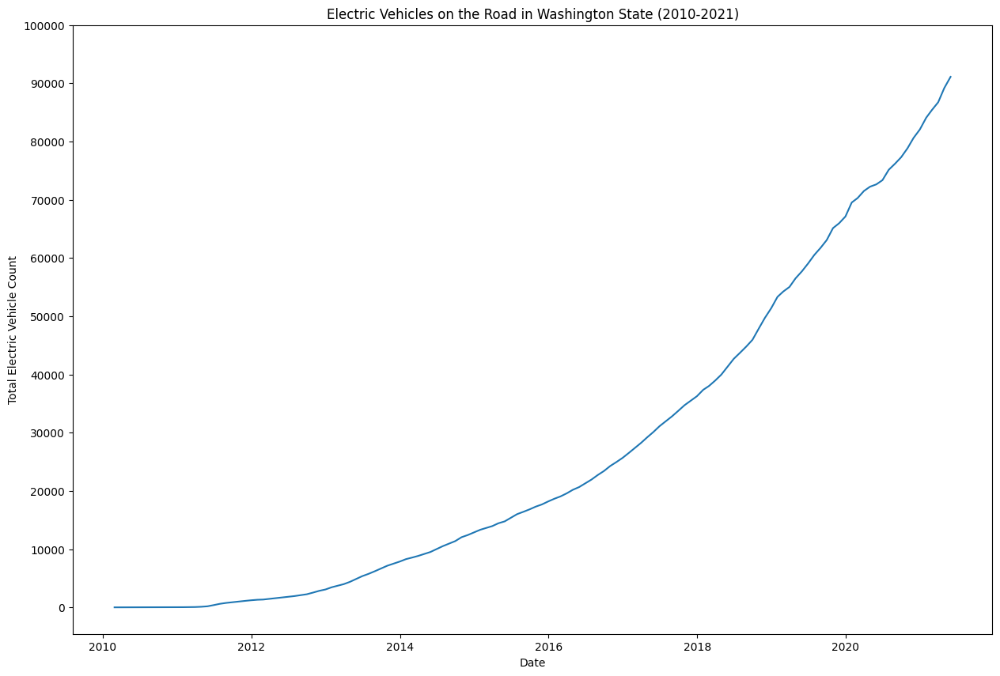

In [83]:
#plotting statewide EV Count

import matplotlib.pyplot as plt
import seaborn as sns

fig, ax = plt.subplots(figsize=(15,10))
sns.lineplot(x='transaction_date', y='State Total', data=df_cumsum, ax=ax)
ax.set_xlabel('Date')
ax.set_ylabel('Total Electric Vehicle Count')
ax.set_title('Electric Vehicles on the Road in Washington State (2010-2021)')
ax.set_yticks(range(0,110000,10000))
plt.show()

The analysis indicates an exponential growth in the number of electric vehicles on Washington State roads over the past decade. This trend confirms the favorable demand for electric vehicles in the state, making it a profitable investment opportunity for an EV charging company.


## Electric Vehicles on the Road Over Time by County

In [84]:
data['county'].value_counts()

county
King            62119
Snohomish       12305
Pierce           8949
Clark            6155
Thurston         4110
Kitsap           4104
Whatcom          2963
Spokane          2575
Benton           1277
Island           1251
Skagit           1204
Clallam           708
Jefferson         692
San Juan          663
Cowlitz           537
Chelan            521
Mason             520
Yakima            508
Lewis             437
Grays Harbor      396
Franklin          347
Grant             267
Walla Walla       256
Kittitas          247
Douglas           190
Whitman           159
Klickitat         153
Pacific           136
Stevens           125
Okanogan          104
Skamania          100
Asotin             49
Adams              30
Pend Oreille       28
Wahkiakum          28
Lincoln            25
Ferry              16
Columbia           13
Garfield            2
Name: count, dtype: int64

In [85]:
top_ten_counties = data['county'].value_counts().head(10).index.tolist()
top_ten_counties


['King',
 'Snohomish',
 'Pierce',
 'Clark',
 'Thurston',
 'Kitsap',
 'Whatcom',
 'Spokane',
 'Benton',
 'Island']

In [86]:
#filtering out counties to keep top 10
df_cumsum = df_cumsum.loc[:, ['transaction_date', *top_ten_counties]]
df_cumsum.head()

,transaction_date,King,Snohomish,Pierce,Clark,Thurston,Kitsap,Whatcom,Spokane,Benton,Island
0,2010-02-28,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0
1,2010-03-31,1.0,0.0,0.0,1.0,0.0,1,0.0,0.0,0.0,0.0
2,2010-04-30,2.0,0.0,0.0,1.0,0.0,1,1.0,1.0,0.0,0.0
3,2010-05-31,2.0,1.0,0.0,1.0,1.0,1,1.0,1.0,0.0,0.0
4,2010-06-30,3.0,1.0,0.0,1.0,1.0,1,1.0,1.0,0.0,0.0


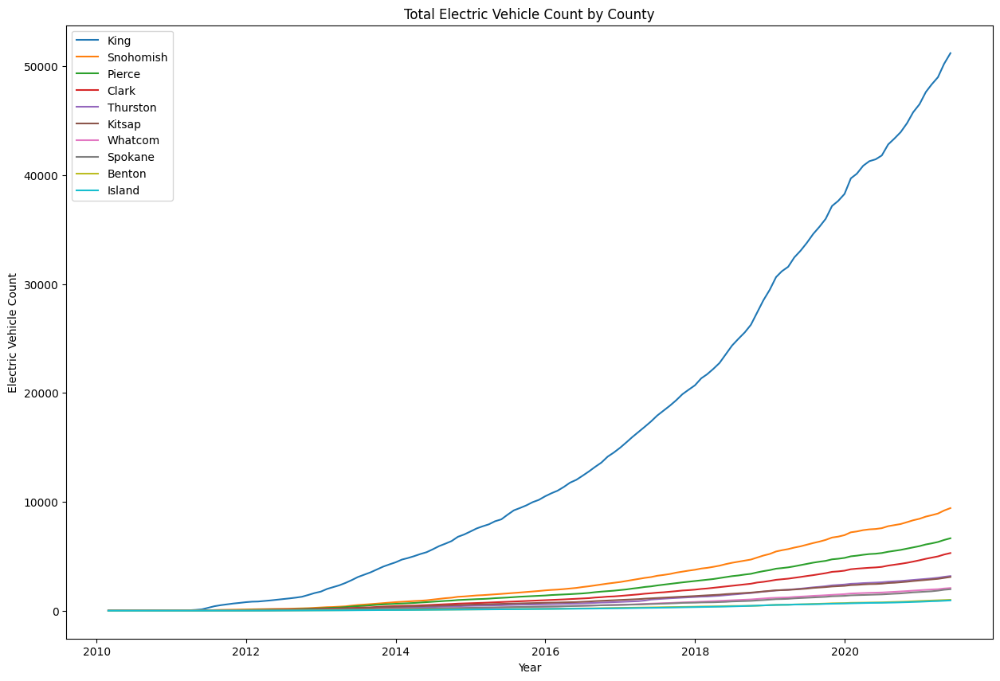

In [87]:
#plotting county trends
import matplotlib.pyplot as plt
import seaborn as sns
fig, ax = plt.subplots(figsize=(15,10))
for county in top_ten_counties:
    sns.lineplot(x='transaction_date', y=county, data=df_cumsum, ax=ax, 
                 label=county)
ax.set_xlabel('Year')
ax.set_ylabel('Electric Vehicle Count')
ax.set_title('Total Electric Vehicle Count by County')
ax.legend()
plt.show()

King County, which includes Seattle, has shown much faster EV purchase growth compared to the other top 10 counties. This is expected due to the larger population in King County. The scale difference makes it difficult to compare the growth patterns among the remaining nine counties.

## Electric Vehicles on the Road Over Time (Excluding King County)

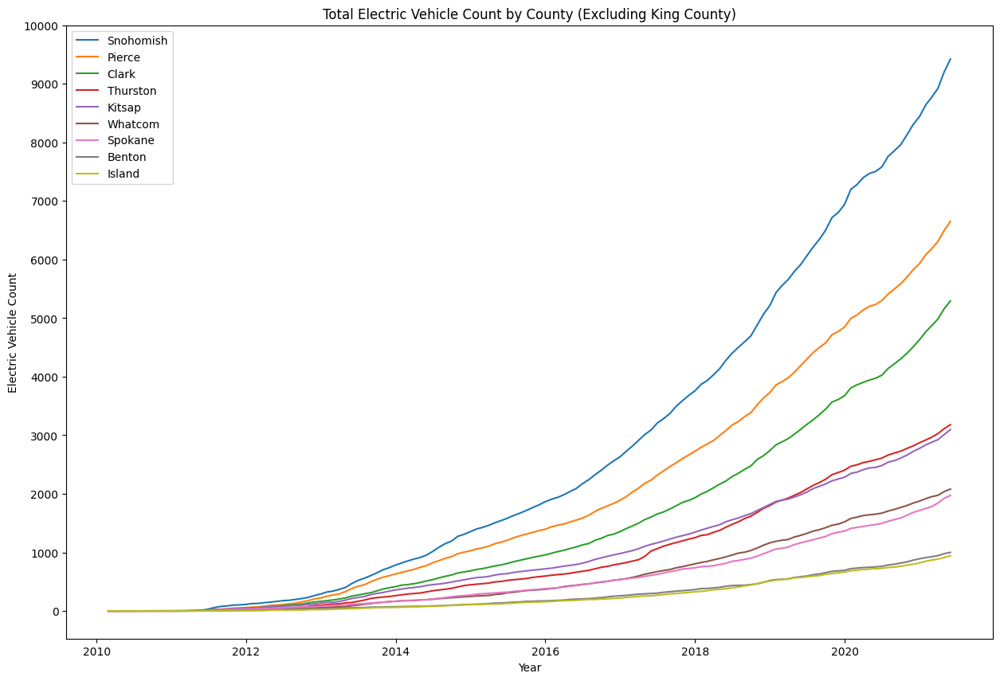

In [88]:
#plotting county trends except for King County

fig, ax = plt.subplots(figsize=(15,10))
for county in top_ten_counties:
    if county == 'King':
        pass
    else:
        sns.lineplot(x='transaction_date', y=county, data=df_cumsum, ax=ax, 
                 label=county)
ax.set_xlabel('Year')
ax.set_ylabel('Electric Vehicle Count')
ax.set_title('Total Electric Vehicle Count by County (Excluding King County)')
ax.set_yticks(range(0,11000,1000))
ax.legend()
#plt.tight_layout();
#plt.savefig('images/output_113_1.png', facecolor='white')
plt.show()

## Most Purchased Car Models by County

Another important piece of information that can be relevant for an electric charging company is what the most purchased electric vehicle models are in each of these counties to decide on additional factors. These may include: 

- Whether to include adapters for different connector types (Tesla, CCS, CHAdeMO etc.)
- What kind of charging station to build (level 1, level 2, level 3)
- Spacing of chargers based on the size of vehicles

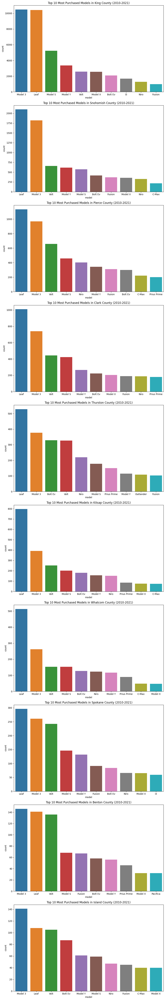

In [94]:
def model_counts_by_county(df=data, top_n=10, county_list=top_ten_counties):
    
    """
    Function: plot_top_models_by_county

    Description:
    This function generates a bar plot for each provided county, showcasing the top 'n' most purchased models.

    Arguments:
    - df: Type: pandas.DataFrame, Default: df
    Description: DataFrame containing title transactions for all counties.

    - top_n: Type: int, Default: 10
    Description: Number of most purchased models to include in the plot.

    - county_list: Type: list, Default: top_ten_counties
    Description: The list of counties to be analyzed.

    Note:
    The function assumes the availability of a DataFrame 'df' containing the relevant data.

    Example usage:
    plot_top_models_by_county(df, top_n=5, county_list=['King', 'Snohomish', 'Pierce'])

    """
    
    fig, ax = plt.subplots(figsize=(10, 60), nrows=len(county_list))
    
    for i, county in enumerate(county_list):
        df_county = data[(data['county']==county) & 
                       (data['transaction_type']=='Original Title')]
        model_count_df = pd.DataFrame(df_county['model'].value_counts()).reset_index()
        model_count_df.columns=['model', 'count']
        sns.barplot(x='model', y='count', data=model_count_df.head(top_n), 
                    ax=ax[i])
        ax[i].set_title(f'Top {top_n} Most Purchased Models in {county} County (2010-2021)')
    plt.tight_layout();

model_counts_by_county()

Observations:

The most purchased vehicles in each county are the Nissan Leaf and Tesla Model 3. The Nissan Leaf, released in December 2010, is recognized as the first mass-market electric vehicle. The Tesla Model 3, a more affordable luxury electric vehicle, targets the mass market. Given these factors, it's expected that these vehicles are the top choices in each county.

# MODEL Building

## Preprocessing/ Defining Functions

In [95]:
#store df_cumsum in to differont variable

df_cumsum_1 = df_cumsum

In [96]:
df_cumsum_1

,transaction_date,King,Snohomish,Pierce,Clark,Thurston,Kitsap,Whatcom,Spokane,Benton,Island
0,2010-02-28,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,0.0
1,2010-03-31,1.0,0.0,0.0,1.0,0.0,1,0.0,0.0,0.0,0.0
2,2010-04-30,2.0,0.0,0.0,1.0,0.0,1,1.0,1.0,0.0,0.0
3,2010-05-31,2.0,1.0,0.0,1.0,1.0,1,1.0,1.0,0.0,0.0
4,2010-06-30,3.0,1.0,0.0,1.0,1.0,1,1.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
131,2021-01-31,47641.0,8643.0,6084.0,4768.0,2920.0,2837,1918.0,1750.0,912.0,849.0
132,2021-02-28,48328.0,8769.0,6183.0,4869.0,2966.0,2880,1951.0,1782.0,926.0,869.0
133,2021-03-31,48999.0,8923.0,6311.0,4986.0,3028.0,2925,1975.0,1842.0,945.0,885.0
134,2021-04-30,50227.0,9200.0,6495.0,5158.0,3111.0,3011,2038.0,1923.0,978.0,914.0


In [97]:
df_cumsum_1 = df_cumsum_1.set_index('transaction_date').resample('M').asfreq()
#resample('M').asfreq() is used to resample the DataFrame df_cumsum at a monthly frequency.

In [99]:
df_cumsum_1.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 136 entries, 2010-02-28 to 2021-05-31
Freq: M
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   King       136 non-null    float64
 1   Snohomish  136 non-null    float64
 2   Pierce     136 non-null    float64
 3   Clark      136 non-null    float64
 4   Thurston   136 non-null    float64
 5   Kitsap     136 non-null    int64  
 6   Whatcom    136 non-null    float64
 7   Spokane    136 non-null    float64
 8   Benton     136 non-null    float64
 9   Island     136 non-null    float64
dtypes: float64(9), int64(1)
memory usage: 11.7 KB


### Separating Data for Each County

Create a user defined function to seperate data for each county (top 10)

In [100]:
def separate_data_by_county(county, data):
    """Function separates the given dataframe by county and returns the 
    separated dataframe.
    -------------------------------
    Arguments:
    county: str
    Name of county that will be separated from the dataframe. 
    
    df: class: pandas.DataFrame
    Dataframe that contains data for all counties. The specified county will 
    be separated from this DataFrame. 
    """
    
    df_county = pd.DataFrame(data.loc[:, county])
    df_county.columns=["EV's on the Road"]
    df_county.head()
    return df_county


In [101]:
#separating data by county and parsing this information to a dictionary
county_information = {}
for county in top_ten_counties:
    county_information[county] = {}
    county_information[county]['df']=separate_data_by_county(county, df_cumsum_1)

In [102]:
'''
#separating data by county and parsing this information to a dictionary
county_dfs = {}
for county in top_ten_counties:
    county_dfs[county] = separate_data_by_county(county, df_cumsum_1)
 '''   

'\n#separating data by county and parsing this information to a dictionary\ncounty_dfs = {}\nfor county in top_ten_counties:\n    county_dfs[county] = separate_data_by_county(county, df_cumsum_1)\n '

In [103]:
county_information.keys()

dict_keys(['King', 'Snohomish', 'Pierce', 'Clark', 'Thurston', 'Kitsap', 'Whatcom', 'Spokane', 'Benton', 'Island'])

In [104]:
county_information.values()

dict_values([{'df':                   EV's on the Road
transaction_date                  
2010-02-28                     0.0
2010-03-31                     1.0
2010-04-30                     2.0
2010-05-31                     2.0
2010-06-30                     3.0
...                            ...
2021-01-31                 47641.0
2021-02-28                 48328.0
2021-03-31                 48999.0
2021-04-30                 50227.0
2021-05-31                 51209.0

[136 rows x 1 columns]}, {'df':                   EV's on the Road
transaction_date                  
2010-02-28                     0.0
2010-03-31                     0.0
2010-04-30                     0.0
2010-05-31                     1.0
2010-06-30                     1.0
...                            ...
2021-01-31                  8643.0
2021-02-28                  8769.0
2021-03-31                  8923.0
2021-04-30                  9200.0
2021-05-31                  9423.0

[136 rows x 1 columns]}, {'df':     

### Evaluation of Models

In [108]:
def evaluate_model(model, county):
    """Function returns the model summary and diagnostics information to aid 
    the evaluation of the given model's performance.
    -------------------------------
    Arguments:
    model: SARIMAX or ARIMA model object
    Model variable to evaluate (Time series models for both pmdarima and 
    statsmodels are supported. 
    """
    print('evaluate_model with Forecasts for Test Data', county ,'\n')
    display(model.summary())
    model.plot_diagnostics()
    plt.tight_layout();


'''

import statsmodels.graphics.utils as sm_utils

def evaluate_model(model):
    """Function returns the model summary and diagnostics information to aid 
    the evaluation of the given model's performance.
    -------------------------------
    Arguments:
    model: SARIMAX or ARIMA model object
    Model variable to evaluate (Time series models for both pmdarima and 
    statsmodels are supported. 
    """
    
    summary_text = model.summary().tables[0].as_text()
    model.plot_diagnostics()
    
    # Display the model summary as a text annotation
    plt.annotate(summary_text, xy=(0.5, 0.85), xycoords='axes fraction',
                 fontsize=10, ha='center', va='top', bbox=dict(boxstyle='round', facecolor='white'))
    
    plt.tight_layout()
    plt.show()

    '''

'\n\nimport statsmodels.graphics.utils as sm_utils\n\ndef evaluate_model(model):\n    """Function returns the model summary and diagnostics information to aid \n    the evaluation of the given model\'s performance.\n    -------------------------------\n    Arguments:\n    model: SARIMAX or ARIMA model object\n    Model variable to evaluate (Time series models for both pmdarima and \n    statsmodels are supported. \n    """\n    \n    summary_text = model.summary().tables[0].as_text()\n    model.plot_diagnostics()\n    \n    # Display the model summary as a text annotation\n    plt.annotate(summary_text, xy=(0.5, 0.85), xycoords=\'axes fraction\',\n                 fontsize=10, ha=\'center\', va=\'top\', bbox=dict(boxstyle=\'round\', facecolor=\'white\'))\n    \n    plt.tight_layout()\n    plt.show()\n\n    '

### Creating a Function for train_test_split & plotting

We will be splitting the time series into two: a training set and a testing set. This will allow us to validate the performance of the models.

In [109]:
def train_test_split_ts (data, train_size, test_size):
    
    """Function splits a given DataFrame into two sets based on the given 
    train and test sizes so that the data can be used for validation.
    -------------------------------
    Arguments:
    df: class: pandas.DataFrame
    The base dataframe that will be getting split.
    
    train_size: float
    The size of the desired training set (for example: 0.80)
    
    test_size: float
    The size of the desired training set (for example: 0.20)
    """
    
    train_end_idx = int(round(len(data)*train_size,0))
    train_set = data.iloc[0:train_end_idx,:]["EV's on the Road"]
    test_set = data.iloc[train_end_idx:,:]["EV's on the Road"]
    return train_set, test_set

Additionally, to visualize these splits we will need a plotting function.

In [110]:
def plot_train_test_split(train_data, test_data, county):
    
    """Function plots the training and testing data for visual inspection.
    -------------------------------
    Arguments:
    train_data: pandas.Series
    The training set of data to be plotted.
    
    test_data: pandas.Series
    The test set of data to be plotted.
    
    county: str
    Name of the county that the training and testing data belongs to. This 
    string is used to set the title of the axes.
    """
    
    train_data.plot(label='Train Data')
    test_data.plot(label='Test Data')
    ax=plt.gca()
    ax.set_xlabel('Year')
    ax.set_ylabel('Electric Vehicles on the Road')
    ax.set_title(f'Electric Vehicles on the Road in {county} County')
    ax.legend();

### Creating a Function for Getting Forecasts

For validation purposes we will be getting the forecast from our model for the test period and will be plotting it against the actual test data.

In [111]:
def get_forecast(model, train_data, test_data, plot=True):
    
    """Function gets forecasted values from a given model and plots them for 
    visual inspection. The length of the forecasts are dependent on the length 
    of the test data. The forecasted values are returned in a DataFrame format.
    -------------------------------
    Arguments:
    model:  SARIMAX or ARIMA model object
    Model that the forecast is to be received from. 
    
    train_data: pandas.Series
    The training set of data used in training the model.
    
    test_data: pandas.Series
    The testing set of data used for validating the model.
    
    plot: bool, default=True
    Option to plot the forecasted values along with observed values 
    (train_data and test_data).
    """
    
    #creating a df with the forecast information
    forecast_df = model.get_forecast(steps=len(test_data)).conf_int()
    forecast_df.columns = ['Lower Confidence Interval', 
                              'Upper Confidence Interval']
    forecast_df['Forecasts'] = model.get_forecast(steps=len(test_data))\
    .predicted_mean
    #plotting
    if plot==True:
        with plt.style.context('seaborn-whitegrid'):
            fig, ax = plt.subplots(figsize=(15, 10))
            sns.lineplot(data=train_data, color='black', ax=ax)
            sns.lineplot(data=forecast_df, x=forecast_df.index, 
                         y='Forecasts', color='blue', ax=ax, 
                         label='Forecasted Data', ls='--')
            sns.lineplot(data=test_data, color='purple', ax=ax, 
                         label='Actual Data', ls='-.')
            ax.fill_between(forecast_df.index, 
                            y1=forecast_df['Lower Confidence Interval'], 
                            y2=forecast_df['Upper Confidence Interval'],
                            color = 'green', alpha=0.3, 
                            label='Confidence Interval')
            ax.set_xlabel('Year')
            ax.legend(loc=2)
            plt.show();
    return forecast_df

### Defining a Function for Getting Predictions for Future

Lastly, we will also be needing a function similar to the get_forecast function that will be used for getting predictions for the future and plotting for visualization.

In [112]:
def get_prediction(model, data, test_data, county_name, plot=True):
    
    """Function gets predicted values from a given model and plots them for 
    visual inspection. The length of the predictions are dependent on the 
    length of the test data. The forecasted values are returned in a DataFrame 
    format.
    -------------------------------
    Arguments:
    model:  SARIMAX or ARIMA model object
    Model to be used for making predictions.
    
    df: pandas.DataFrame
    DataFrame that contains all observed data.
    
    test_data: pandas.Series
    The testing set of data used for validating the model (dictates the length
    of predictions).
    
    plot: bool, default=True
    Option to plot the predicted values along with observed values.
    """
    
    #creating a df with the prediction information
    prediction_df = model.get_forecast(steps=len(test_data)).conf_int()
    prediction_df.columns = ['Lower Confidence Interval', 
                              'Upper Confidence Interval']
    prediction_df['Predictions'] = model.get_forecast(steps=len(test_data))\
    .predicted_mean
    #plotting
    if plot==True:
        with plt.style.context('seaborn-whitegrid'):
            fig, ax = plt.subplots(figsize=(15, 10))
            sns.lineplot(data=data, ax=ax)
            sns.lineplot(data=prediction_df, x=prediction_df.index, 
                         y='Predictions', color='orange', ax=ax, 
                         label='Predicted Data', ls='--')
            ax.fill_between(prediction_df.index, 
                            y1=prediction_df['Lower Confidence Interval'], 
                            y2=prediction_df['Upper Confidence Interval'],
                            color = 'green', alpha=0.3, 
                            label='Confidence Interval')
            ax.set_xlabel('Year')
            ax.set_ylabel('Electric Vehicles on the Road')
            ax.set_title(f'Predicted Electric Vehicle Count for {county_name}')
            plt.show();
    return prediction_df

## Try to save total output in pdf format 

In [113]:
'''

import statsmodels.tsa.api as tsa
import pmdarima as pm
from statsmodels.tsa.statespace.sarimax import SARIMAX
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import statsmodels.graphics.utils as sm_utils
import io
import os

# Create a directory for the PDF output
output_directory = r'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\pdf_output'
pdf_file = os.path.join(output_directory, 'combined_output.pdf')

# Create an empty list to store the plots and outputs
figures = []

with PdfPages(pdf_file) as pdf:

    for county in county_information.keys():

        # Seasonality Check
        print('Seasonality Check for:', county)
        fig_seasonality = plt.figure(figsize=(12, 10))
        decomp = tsa.seasonal_decompose(county_information[county]['df'])
        decomp.plot()
        plt.title('Seasonality Check for: ' + county)
        pdf.savefig(fig_seasonality)  # Save the figure directly to the PDF
        plt.close(fig_seasonality)
        
        # Splitting dataset into train and test sets for validation
        print('Splitting dataset into train and test sets for validation')
        train_var = 'train_' + county
        test_var = 'test_' + county
        locals()[train_var], locals()[test_var] = train_test_split_ts(county_information[county]['df'], 0.80, 0.20)

        # Plotting the split
        print('Plotting the split')
        plot_train_test_split(locals()[train_var], locals()[test_var], county)
        plt.title('train_test_split_ts: ' + county)
        pdf.savefig()
        plt.close()

        # Finding Best Parameters with Auto-Arima
        print('Finding Best Parameters with Auto-Arima')
        auto_model = pm.auto_arima(locals()[train_var], start_p=0, d=1, start_q=0, max_p=4,
                                   max_d=3, max_q=4, start_P=0, start_Q=0, max_P=3,
                                   max_D=3, max_Q=3, m=12)
        print(auto_model.summary())
        figures.append(auto_model.summary())  # Add the summary output to the figures list


        # Validate Model with Forecasts for Test Data
        print('Validate Model with Forecasts for Test Data')
        model = SARIMAX(locals()[train_var], order=(1, 1, 0),
                        seasonal_order=(0, 1, 0, 12), enforce_invertibility=False,
                        enforce_stationarity=False).fit()
        evaluate_model(model)
        pdf.savefig()
        plt.close()

        df_forecast_var = 'df_' + county + '_forecast'
        locals()[df_forecast_var] = get_forecast(model, locals()[train_var], locals()[test_var], plot=True)

        # Future Predictions
        print('Future Predictions')
        # Fitting Model to All Observed Data
        model = SARIMAX(county_information[county]['df'], order=(1, 1, 0),
                        seasonal_order=(0, 1, 0, 12), enforce_invertibility=False,
                        enforce_stationarity=False).fit()
        evaluate_model(model)
        pdf.savefig()
        plt.close()

         # Creating a df of predictions and plotting
        print('Creating a df of predictions and plotting')
        df_preds_var = 'df_' + county + '_forecast'
        locals()[df_preds_var] = get_prediction(model, county_information[county]['df'],
                                                locals()[test_var], county, plot=True)
        figures.append(locals()[df_preds_var])  # Add the predictions plot to the figures list

        # Saving predictions df to dict for later use
        print('Saving predictions df to dict for later use')
        county_information[county]['Predictions'] = locals()[df_preds_var]
        
        for fig in figures:
            if isinstance(fig, plt.Figure):
                pdf.savefig(fig)
            elif isinstance(fig, str):
                # If the item in figures is a string, it represents output or summary
                # In this case, we save it as a text in the PDF
                pdf.savefig(io.BytesIO(fig.encode()))
        figures.clear()  # Clear the figures list after saving

print('Combined PDF file saved:', pdf_file)


'''


SyntaxError: (unicode error) 'unicodeescape' codec can't decode bytes in position 328-329: truncated \UXXXXXXXX escape (1054659428.py, line 1)

Seasonality Check for :- King


<Figure size 1200x1000 with 0 Axes>

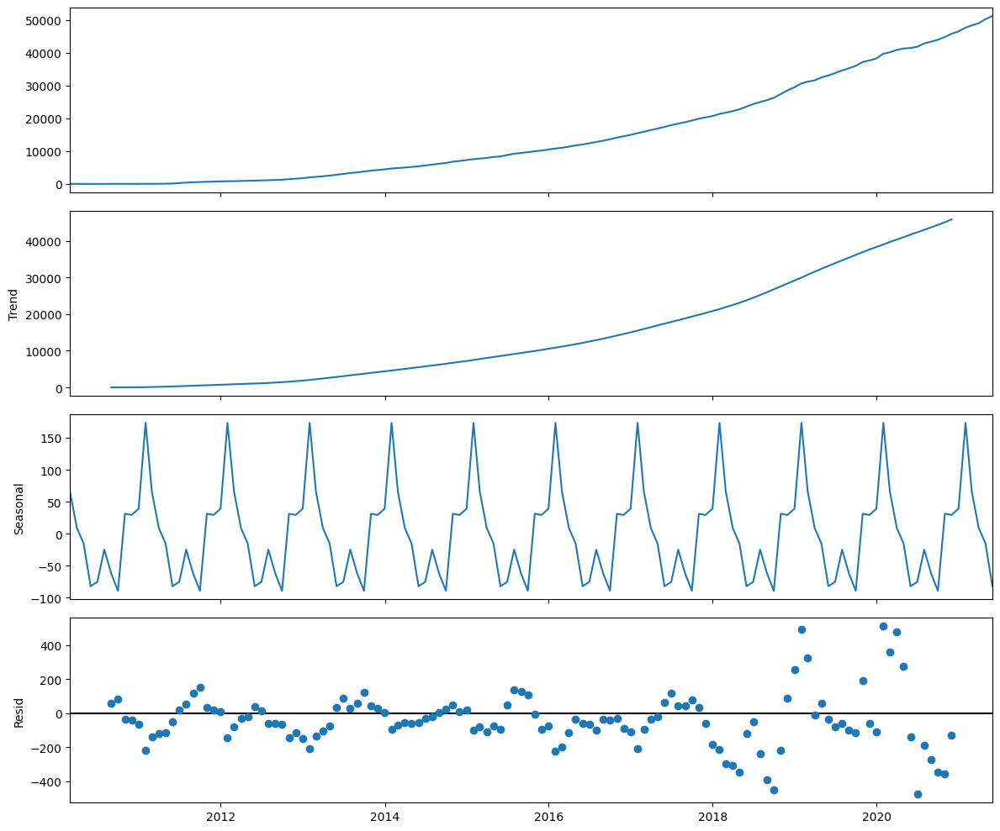

splitting dataset into train and test sets for validation 

plotting the split :- King


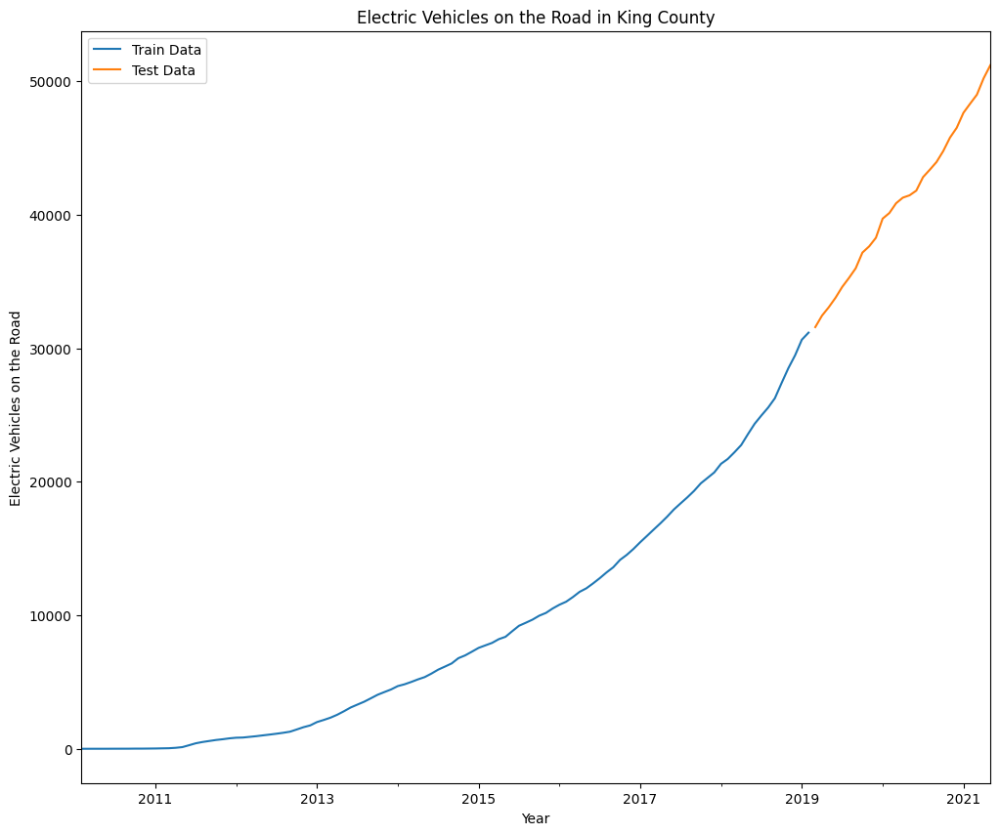

Finding Best Parameters with Auto-Arima 

Validate Model with Forecasts for Test Data 

evaluate_model with Forecasts for Test Data King 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  109
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -567.043
Date:                            Mon, 03 Jul 2023   AIC                           1138.087
Time:                                    12:30:55   BIC                           1143.195
Sample:                                02-28-2010   HQIC                          1140.151
                                     - 02-28-2019                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8305      0.042     20.002      0.000       0.749       0.912
sigma2      8954.2159    822.909     10.881      0.000    7341.344    1.06e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.66   Jarque-Bera (JB):                42.89
Prob(Q):                              0.42   Prob(JB):                         0.00
Heteroskedasticity (H):               7.52   Skew:                             0.70
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.98
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

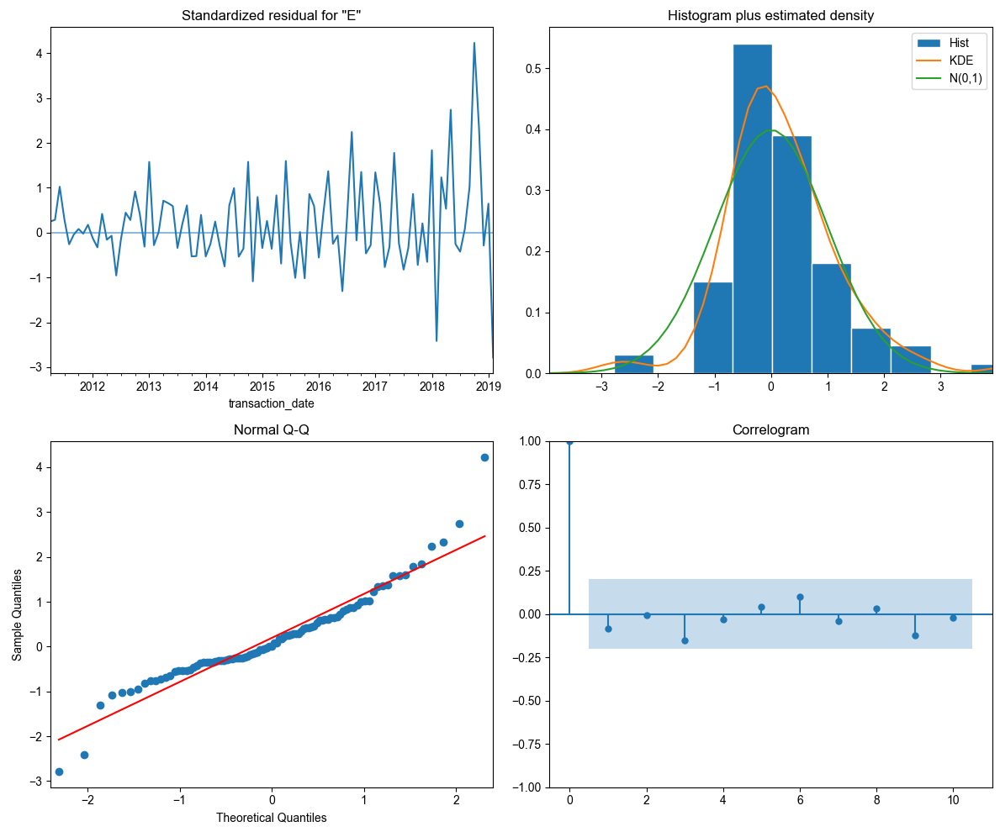

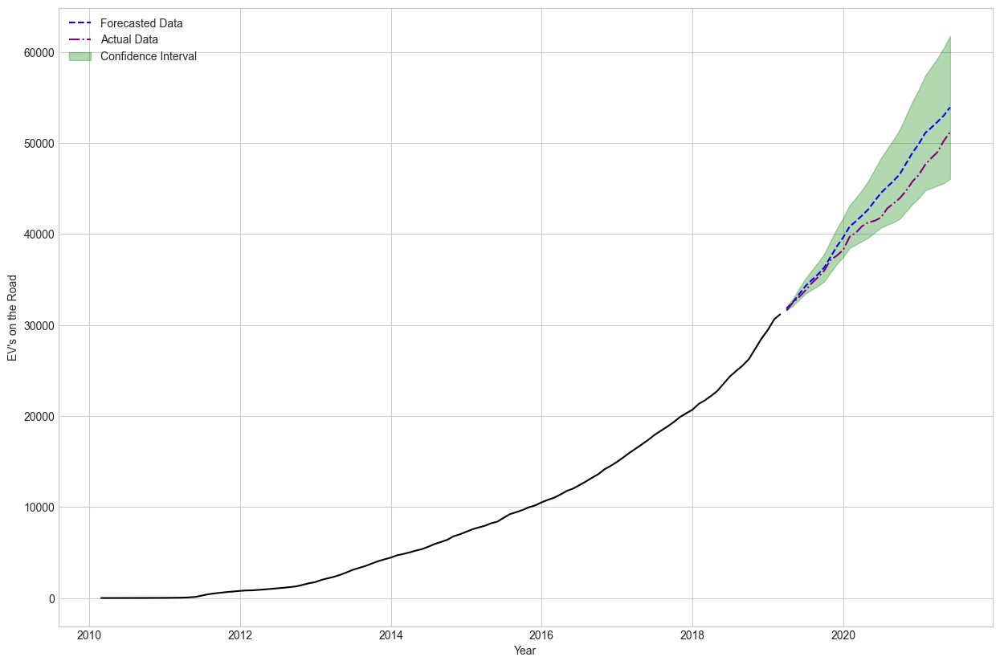

Future Predictions 

evaluate_model with Forecasts for Test Data King 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  136
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -818.139
Date:                            Mon, 03 Jul 2023   AIC                           1640.277
Time:                                    12:30:56   BIC                           1645.885
Sample:                                02-28-2010   HQIC                          1642.555
                                     - 05-31-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4919      0.062      7.989      0.000       0.371       0.613
sigma2      3.911e+04   2910.227     13.440      0.000    3.34e+04    4.48e+04
===================================================================================
Ljung-Box (L1) (Q):                   1.72   Jarque-Bera (JB):               108.03
Prob(Q):                              0.19   Prob(JB):                         0.00
Heteroskedasticity (H):              26.48   Skew:                             0.40
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.54
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

creating a df of predictions and plotting 



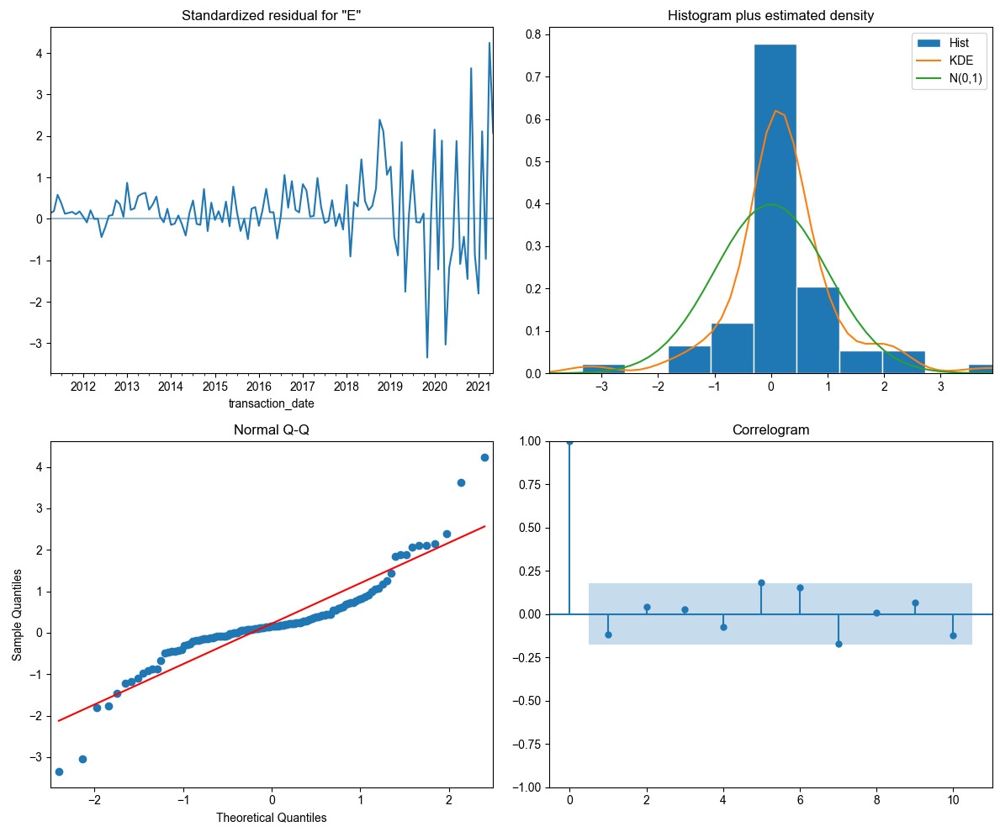

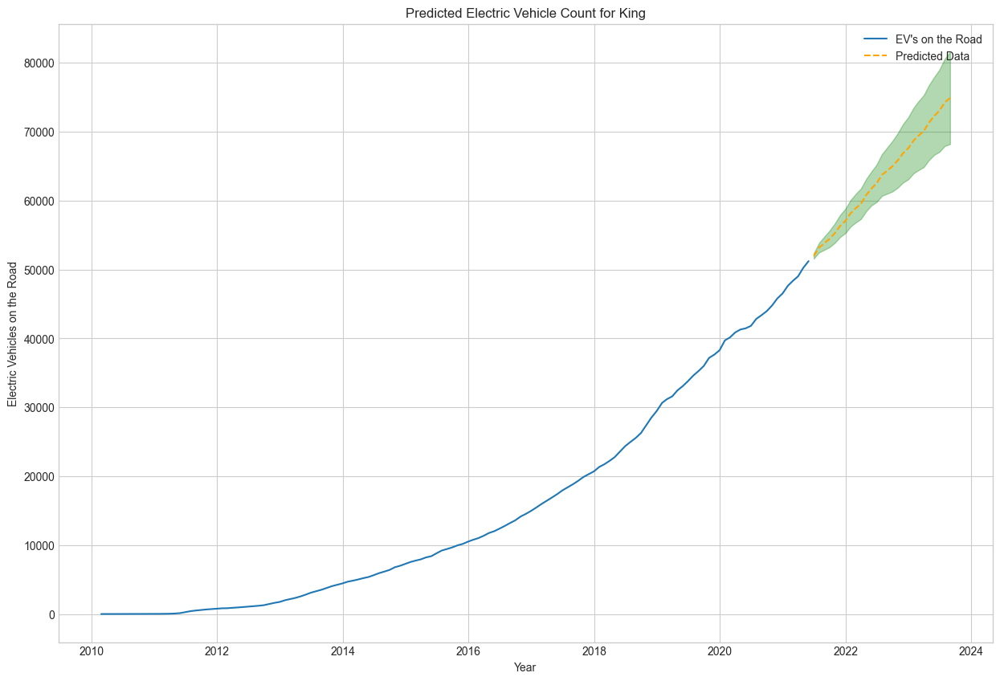

saving predictions df to dict for later use 

Output DataFrame saved to 'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\Chargers_predictions\King_Prediction.csv'
Seasonality Check for :- Snohomish


<Figure size 1200x1000 with 0 Axes>

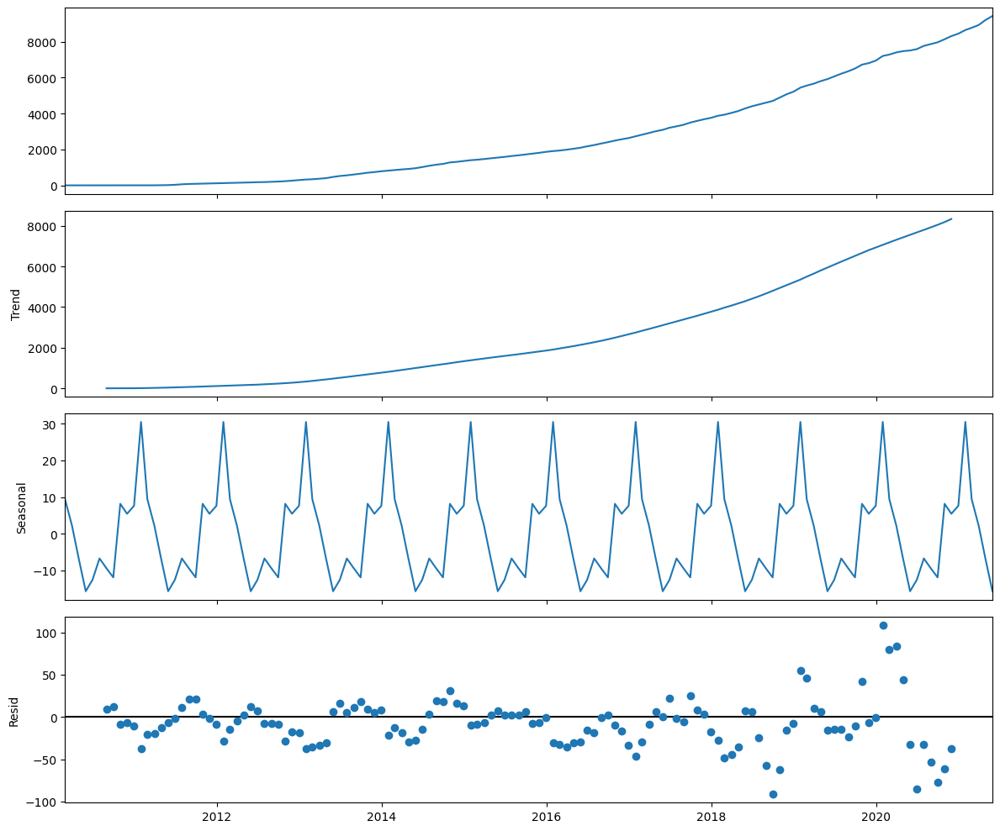

splitting dataset into train and test sets for validation 

plotting the split :- Snohomish


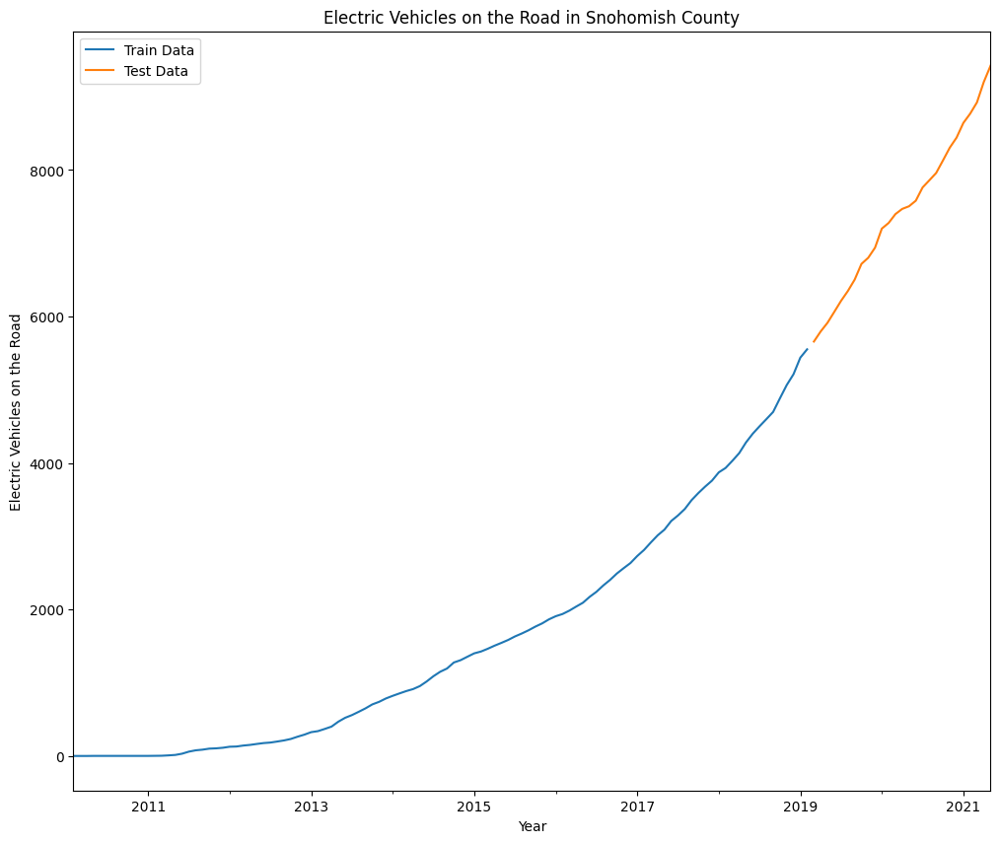

Finding Best Parameters with Auto-Arima 

Validate Model with Forecasts for Test Data 

evaluate_model with Forecasts for Test Data Snohomish 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  109
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -429.165
Date:                            Mon, 03 Jul 2023   AIC                            862.330
Time:                                    12:31:41   BIC                            867.438
Sample:                                02-28-2010   HQIC                           864.394
                                     - 02-28-2019                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6949      0.064     10.930      0.000       0.570       0.820
sigma2       491.3607     38.720     12.690      0.000     415.471     567.250
===================================================================================
Ljung-Box (L1) (Q):                   6.85   Jarque-Bera (JB):                94.83
Prob(Q):                              0.01   Prob(JB):                         0.00
Heteroskedasticity (H):               7.36   Skew:                             1.23
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.24
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

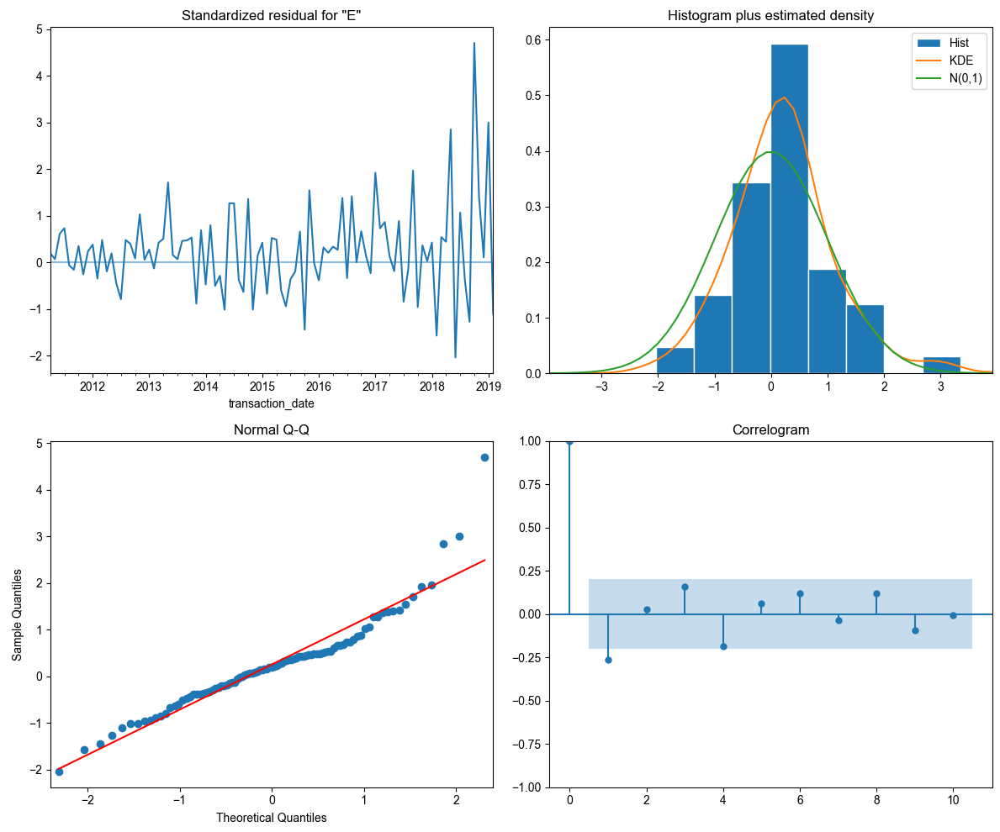

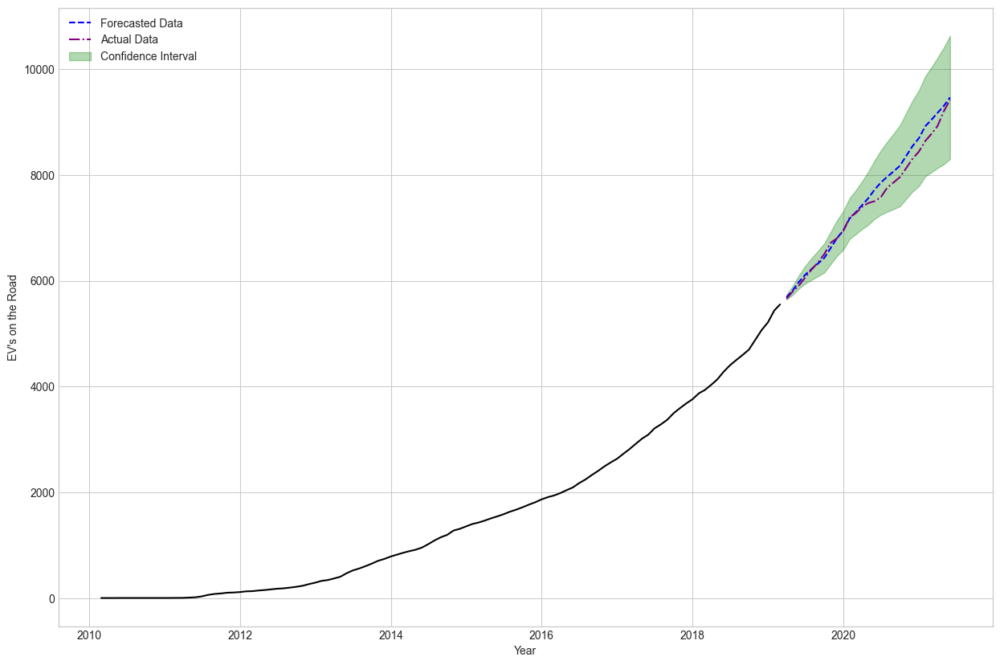

Future Predictions 

evaluate_model with Forecasts for Test Data Snohomish 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  136
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -611.312
Date:                            Mon, 03 Jul 2023   AIC                           1226.625
Time:                                    12:31:42   BIC                           1232.233
Sample:                                02-28-2010   HQIC                          1228.902
                                     - 05-31-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5864      0.062      9.450      0.000       0.465       0.708
sigma2      1317.6914     83.861     15.713      0.000    1153.326    1482.057
===================================================================================
Ljung-Box (L1) (Q):                   1.15   Jarque-Bera (JB):               195.10
Prob(Q):                              0.28   Prob(JB):                         0.00
Heteroskedasticity (H):              17.74   Skew:                             1.00
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.86
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

creating a df of predictions and plotting 



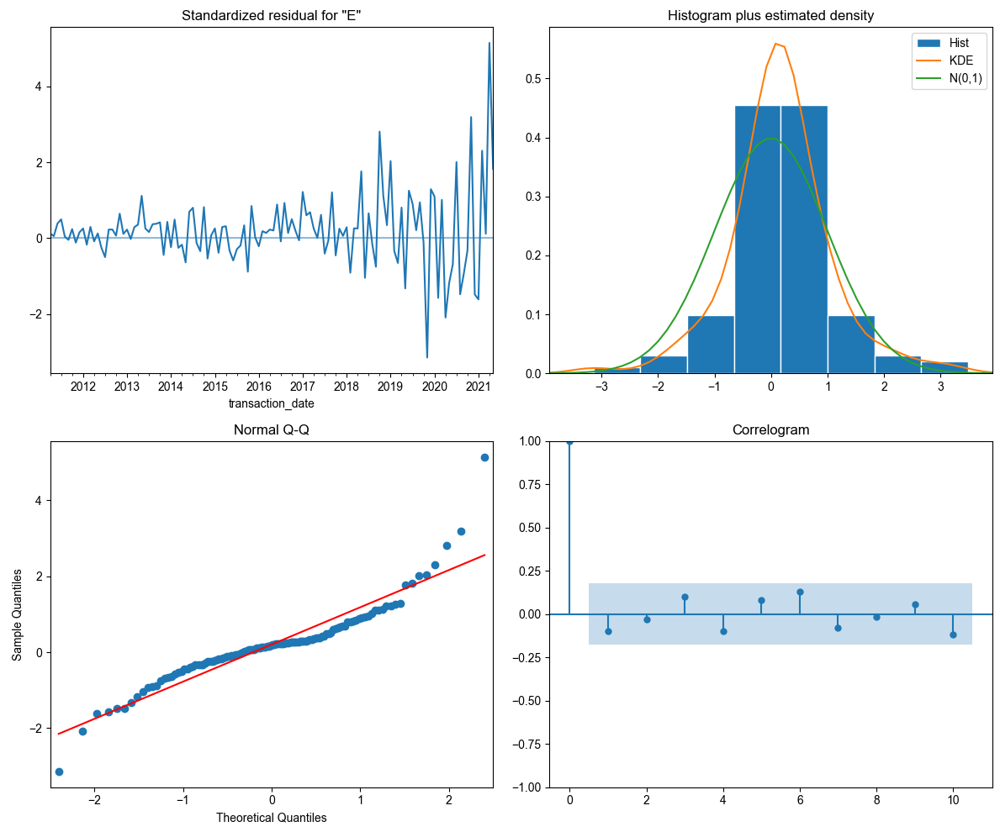

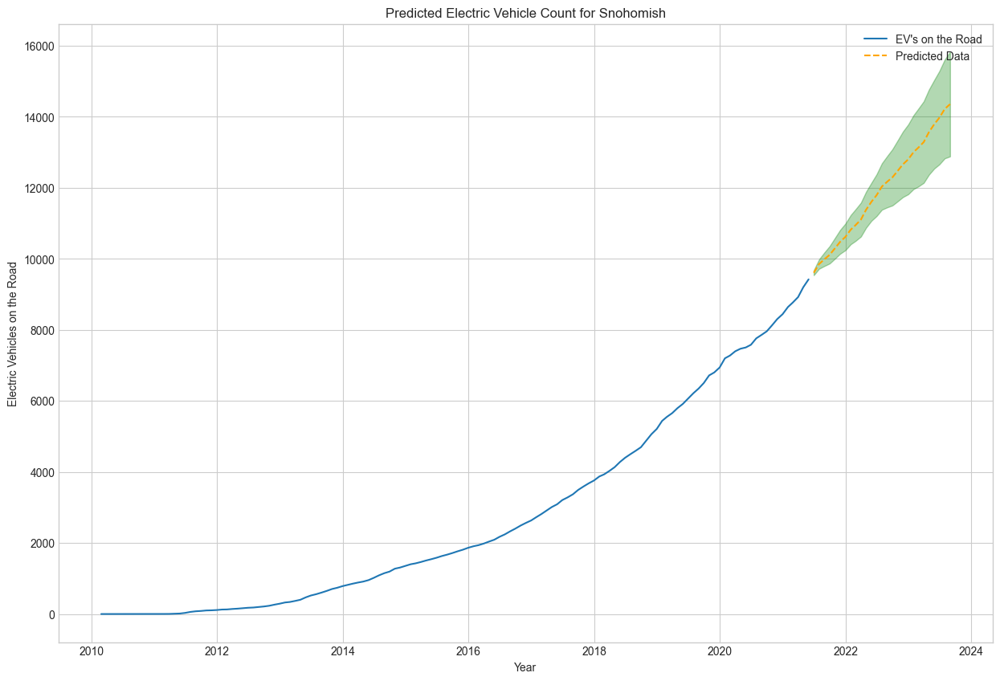

saving predictions df to dict for later use 

Output DataFrame saved to 'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\Chargers_predictions\Snohomish_Prediction.csv'
Seasonality Check for :- Pierce


<Figure size 1200x1000 with 0 Axes>

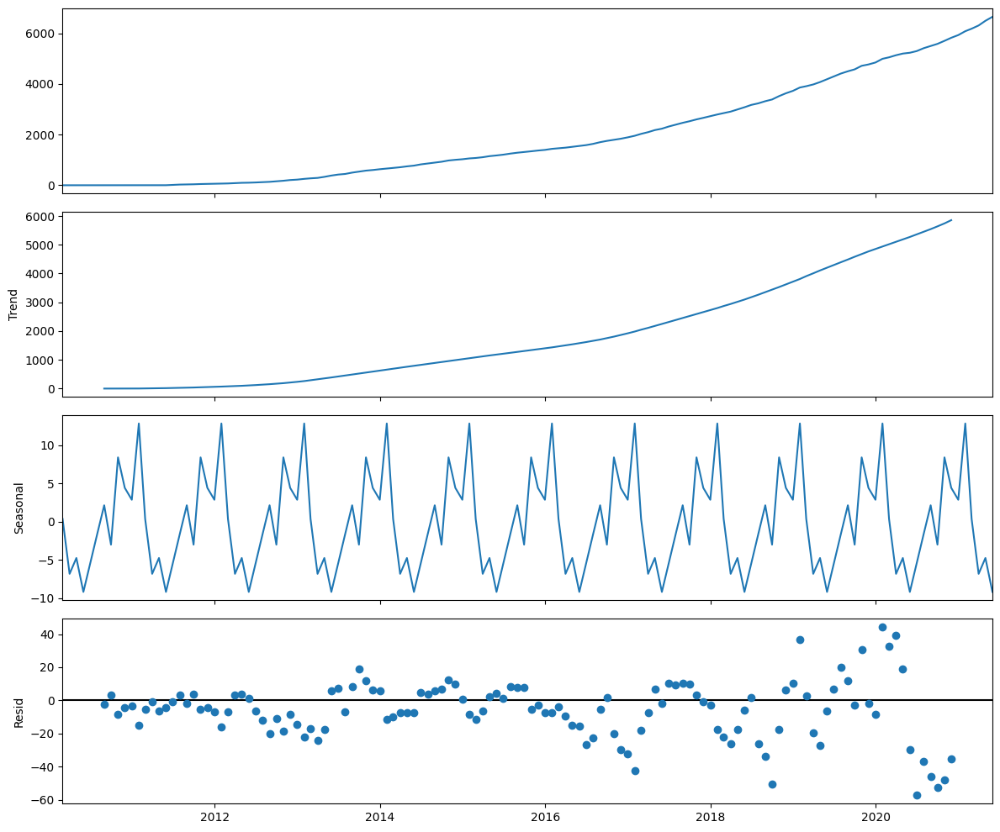

splitting dataset into train and test sets for validation 

plotting the split :- Pierce


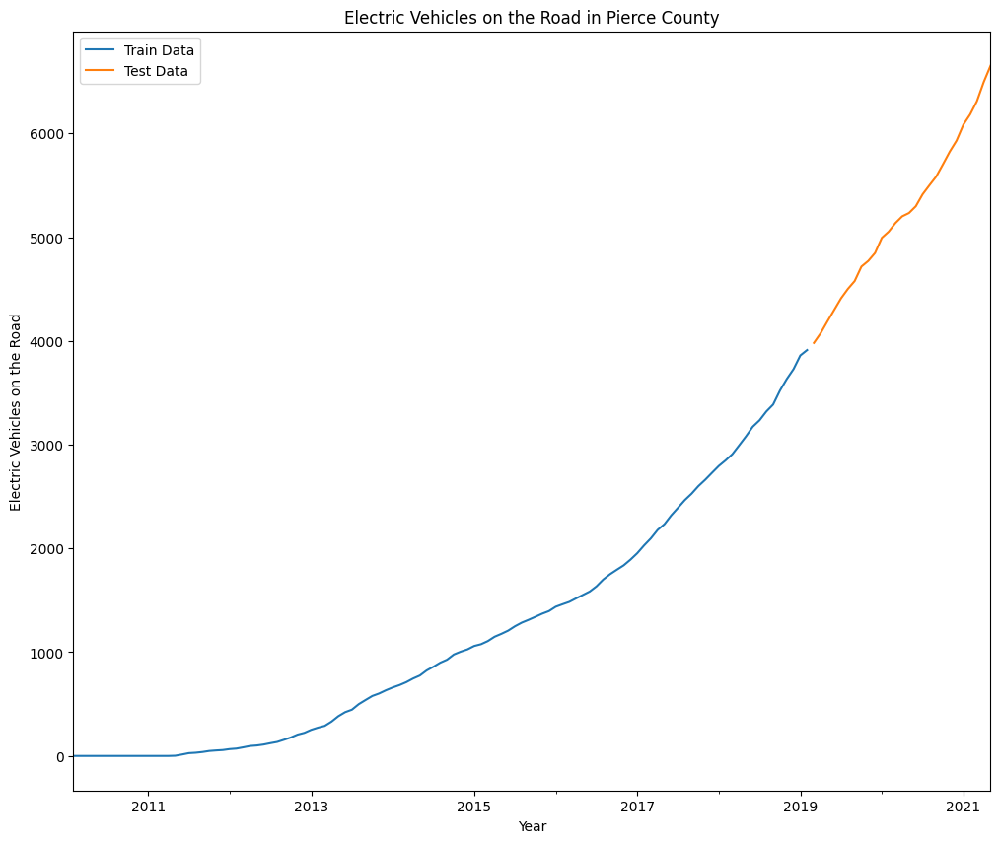

Finding Best Parameters with Auto-Arima 

Validate Model with Forecasts for Test Data 

evaluate_model with Forecasts for Test Data Pierce 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  109
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -397.383
Date:                            Mon, 03 Jul 2023   AIC                            798.766
Time:                                    12:32:09   BIC                            803.874
Sample:                                02-28-2010   HQIC                           800.830
                                     - 02-28-2019                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6426      0.063     10.258      0.000       0.520       0.765
sigma2       251.6602     25.594      9.833      0.000     201.498     301.823
===================================================================================
Ljung-Box (L1) (Q):                   4.89   Jarque-Bera (JB):                18.06
Prob(Q):                              0.03   Prob(JB):                         0.00
Heteroskedasticity (H):               3.88   Skew:                             0.56
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.81
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

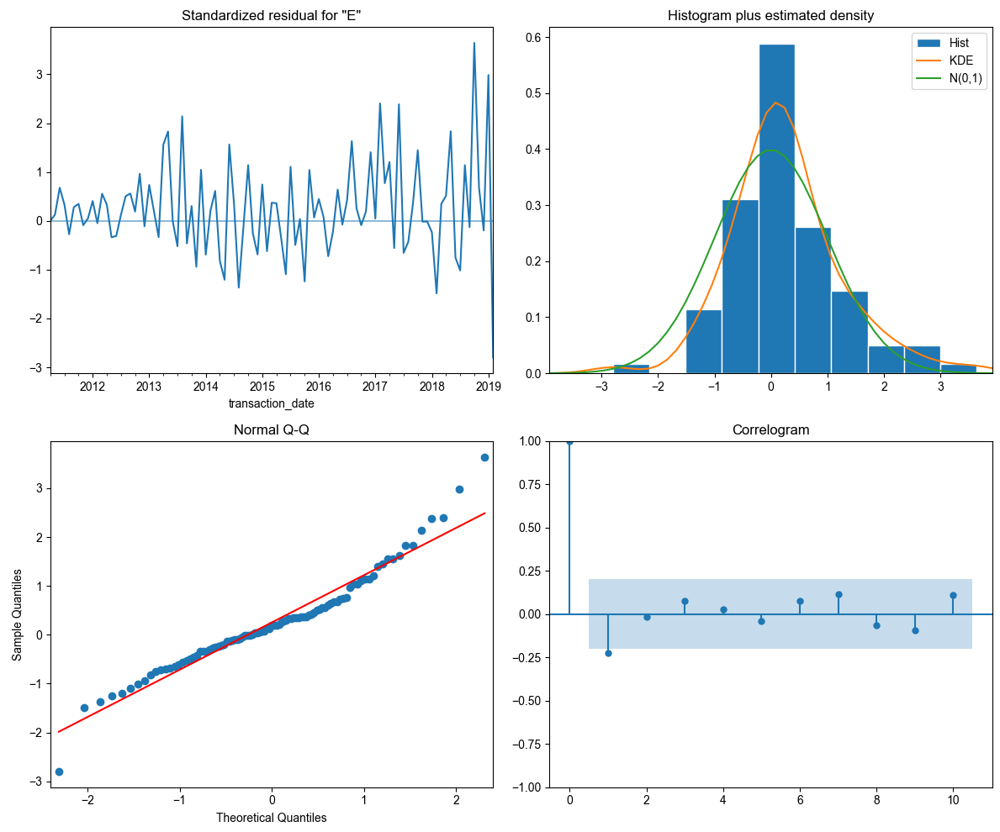

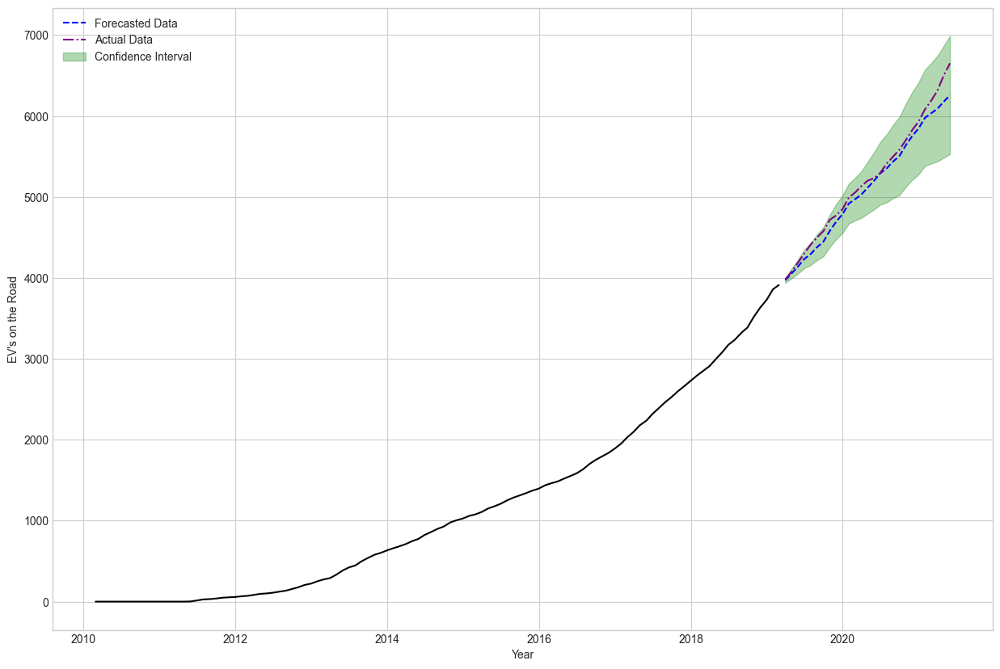

Future Predictions 

evaluate_model with Forecasts for Test Data Pierce 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  136
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -548.847
Date:                            Mon, 03 Jul 2023   AIC                           1101.695
Time:                                    12:32:10   BIC                           1107.303
Sample:                                02-28-2010   HQIC                          1103.973
                                     - 05-31-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6979      0.057     12.321      0.000       0.587       0.809
sigma2       473.2495     37.803     12.519      0.000     399.157     547.342
===================================================================================
Ljung-Box (L1) (Q):                   1.62   Jarque-Bera (JB):                63.19
Prob(Q):                              0.20   Prob(JB):                         0.00
Heteroskedasticity (H):               7.15   Skew:                             0.52
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.37
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

creating a df of predictions and plotting 



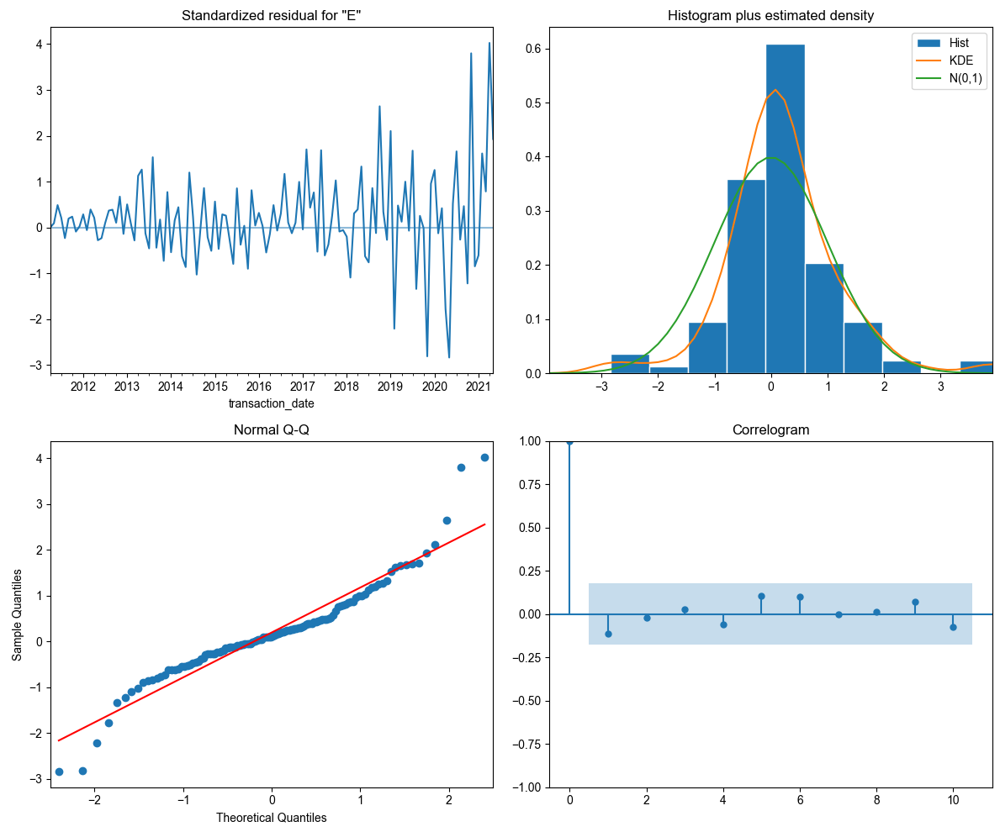

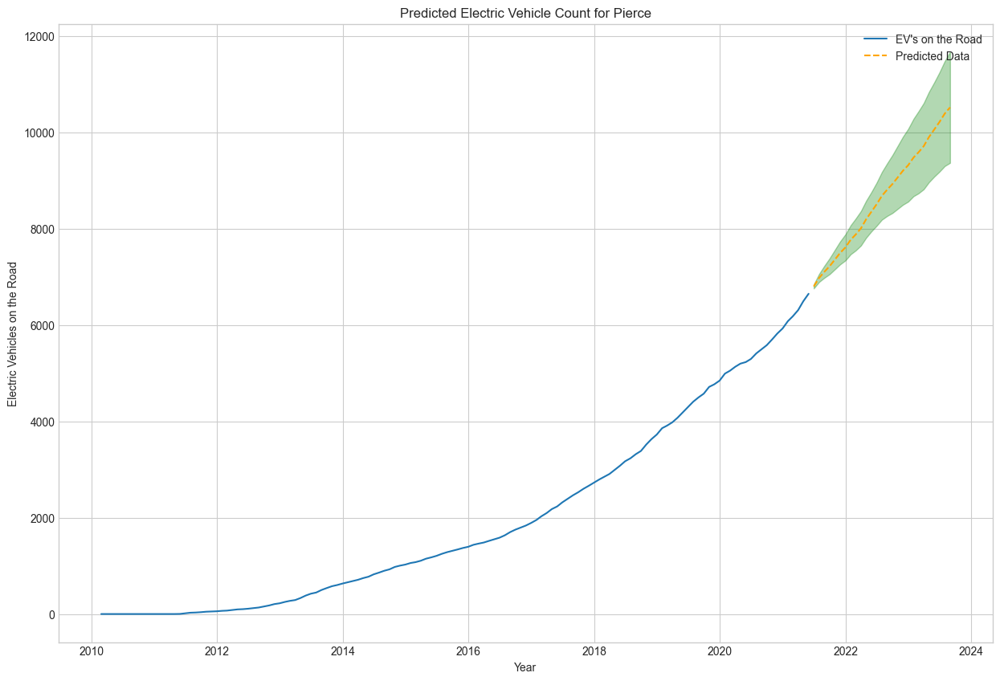

saving predictions df to dict for later use 

Output DataFrame saved to 'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\Chargers_predictions\Pierce_Prediction.csv'
Seasonality Check for :- Clark


<Figure size 1200x1000 with 0 Axes>

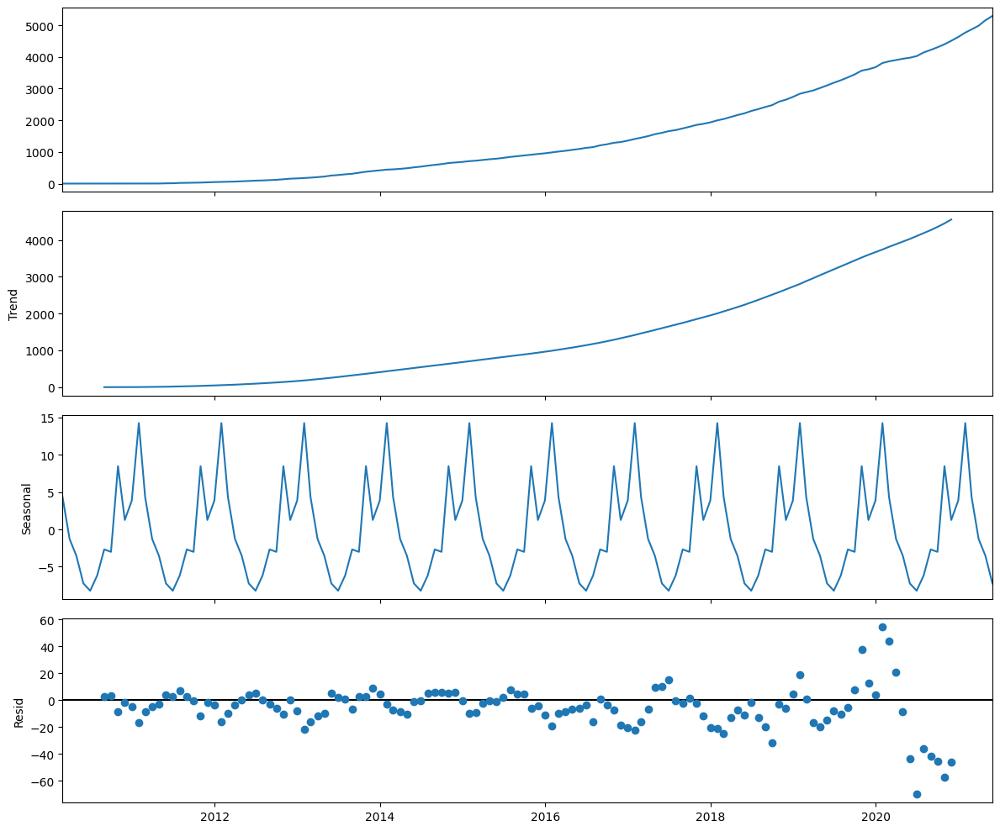

splitting dataset into train and test sets for validation 

plotting the split :- Clark


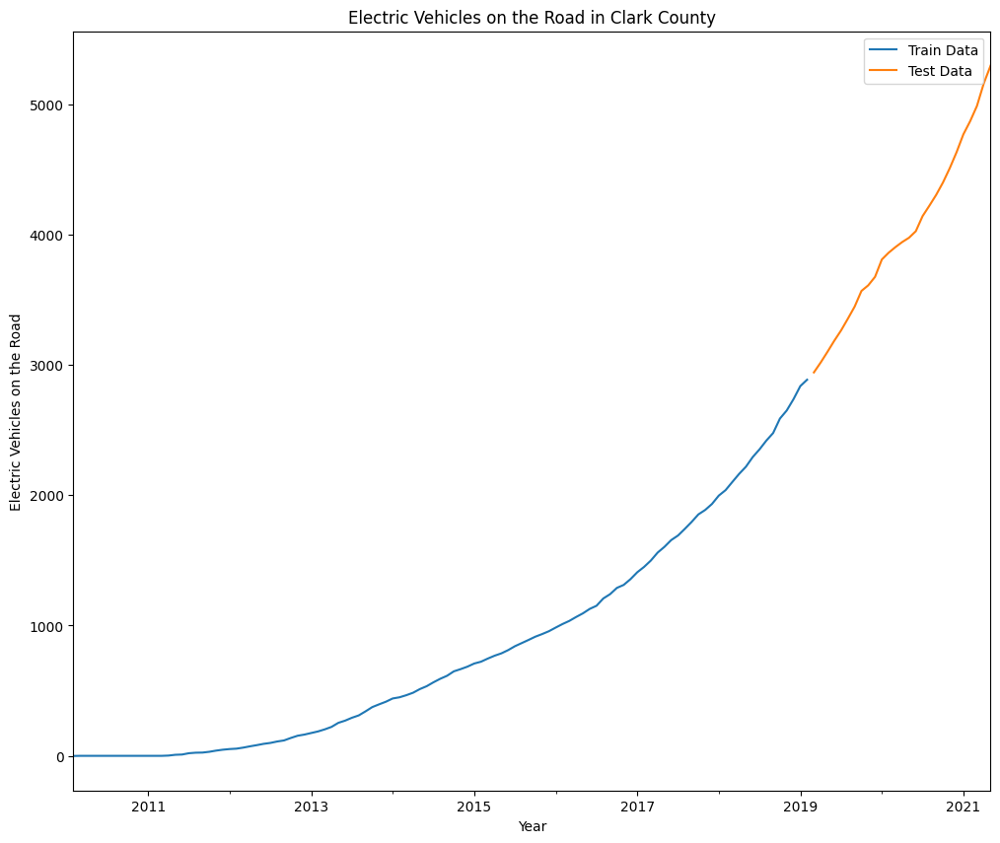

Finding Best Parameters with Auto-Arima 

Validate Model with Forecasts for Test Data 

evaluate_model with Forecasts for Test Data Clark 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  109
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -359.425
Date:                            Mon, 03 Jul 2023   AIC                            722.850
Time:                                    12:32:27   BIC                            727.958
Sample:                                02-28-2010   HQIC                           724.914
                                     - 02-28-2019                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6445      0.082      7.861      0.000       0.484       0.805
sigma2       113.1789      9.098     12.440      0.000      95.348     131.010
===================================================================================
Ljung-Box (L1) (Q):                  17.56   Jarque-Bera (JB):                92.50
Prob(Q):                              0.00   Prob(JB):                         0.00
Heteroskedasticity (H):               5.88   Skew:                             1.29
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.09
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

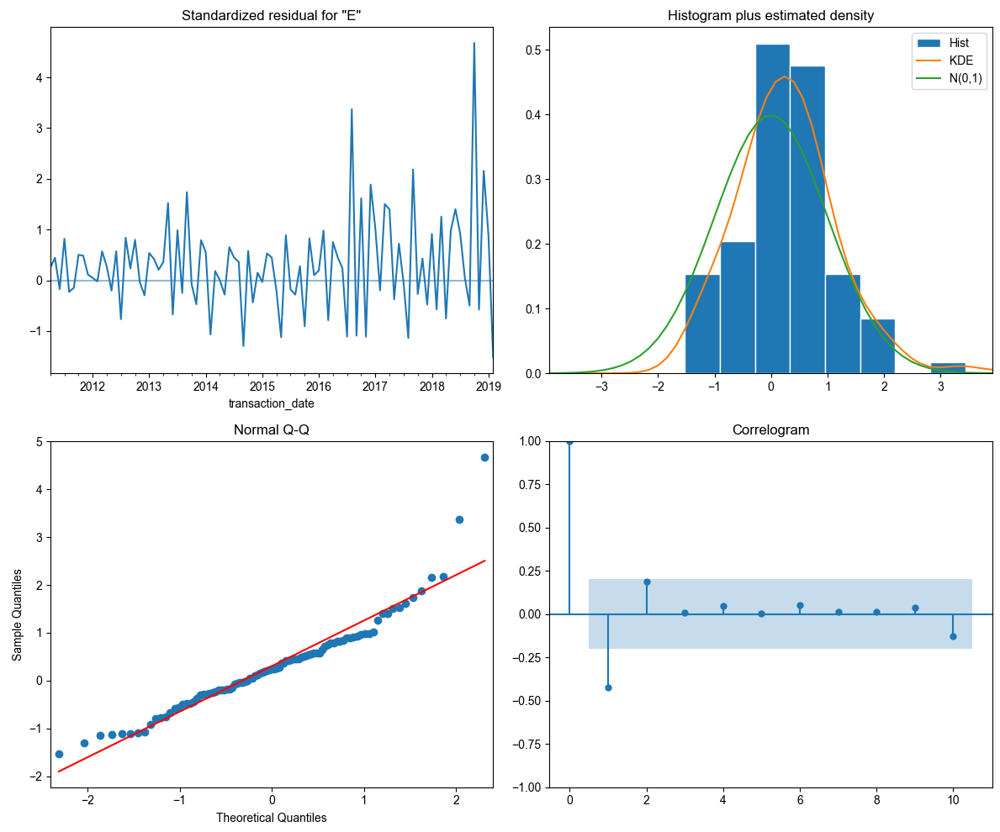

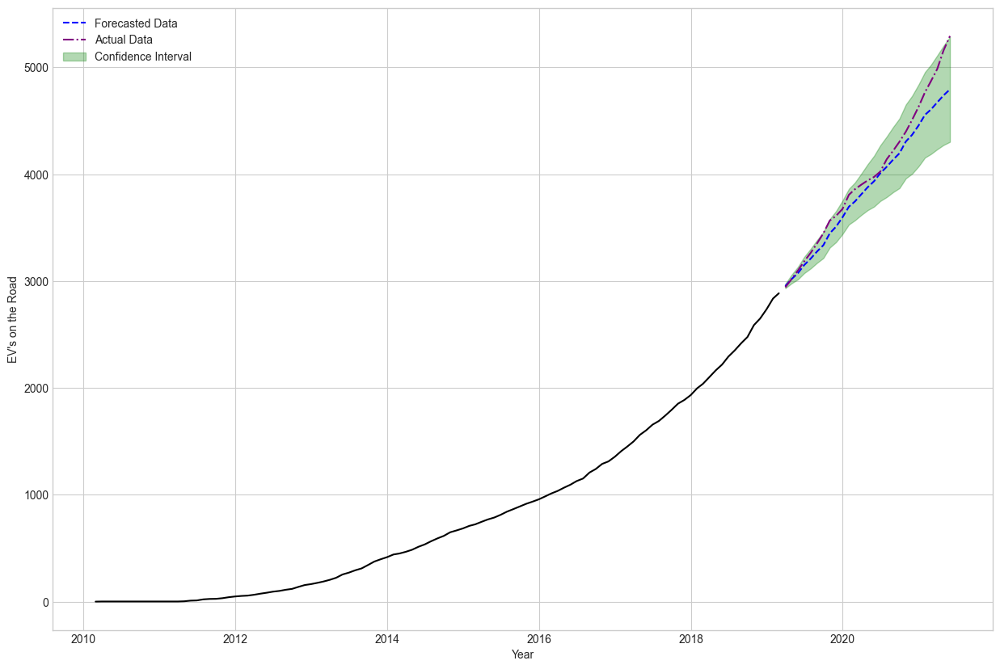

Future Predictions 

evaluate_model with Forecasts for Test Data Clark 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  136
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -529.168
Date:                            Mon, 03 Jul 2023   AIC                           1062.336
Time:                                    12:32:28   BIC                           1067.944
Sample:                                02-28-2010   HQIC                          1064.613
                                     - 05-31-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7174      0.044     16.205      0.000       0.631       0.804
sigma2       342.7512     21.549     15.905      0.000     300.515     384.987
===================================================================================
Ljung-Box (L1) (Q):                   1.62   Jarque-Bera (JB):               217.86
Prob(Q):                              0.20   Prob(JB):                         0.00
Heteroskedasticity (H):              20.77   Skew:                             1.71
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.59
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

creating a df of predictions and plotting 



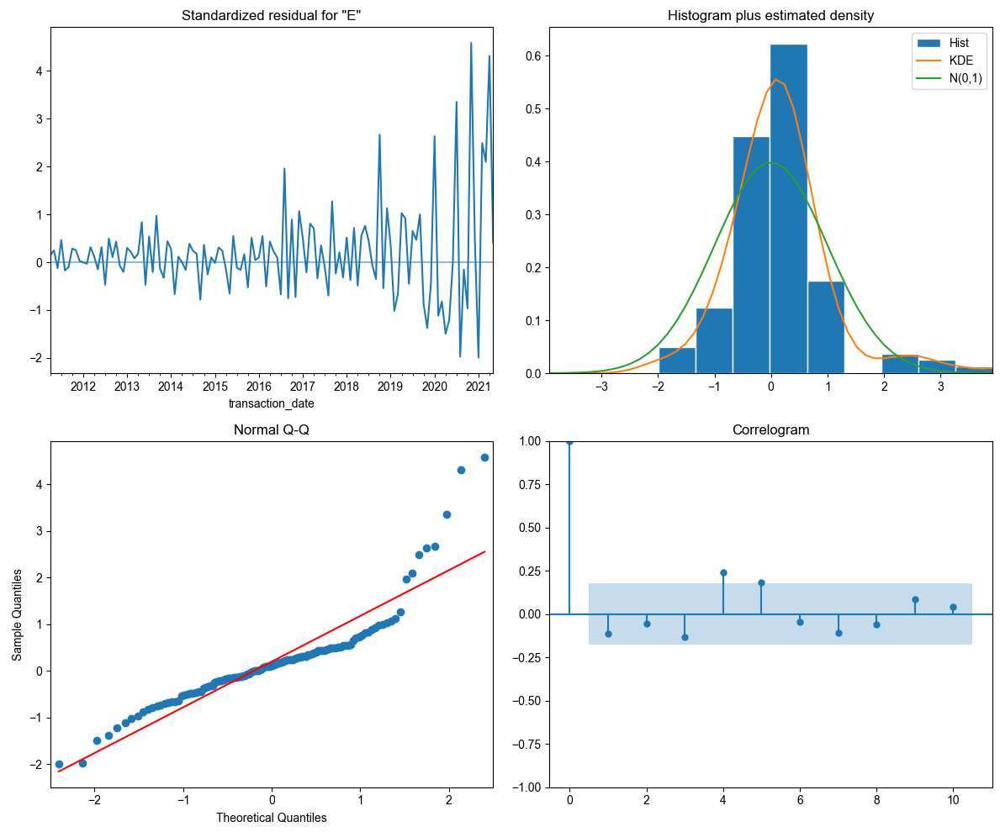

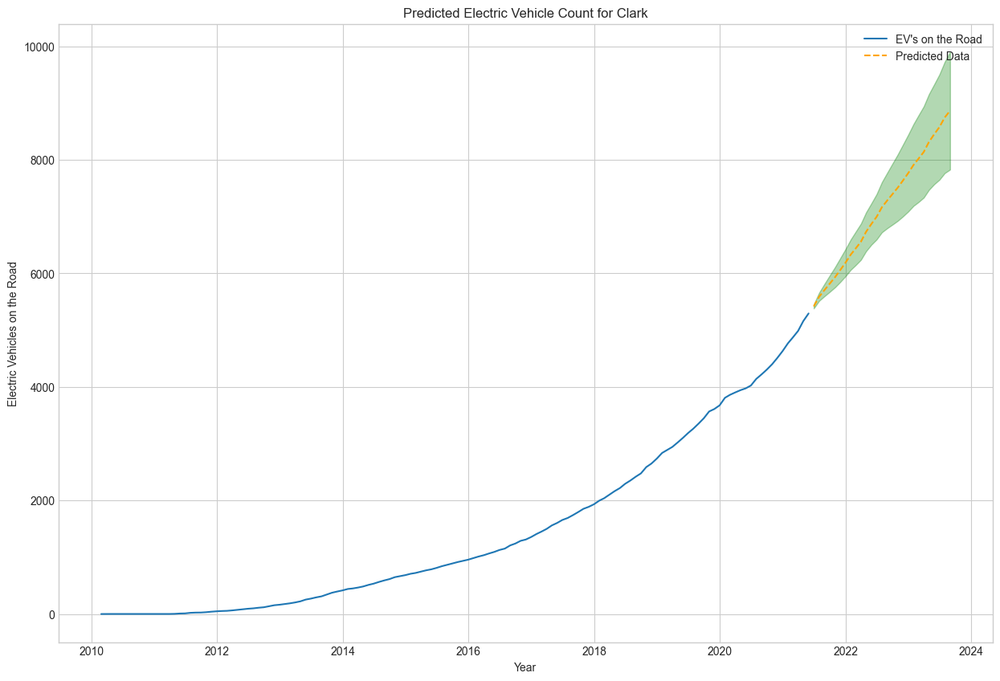

saving predictions df to dict for later use 

Output DataFrame saved to 'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\Chargers_predictions\Clark_Prediction.csv'
Seasonality Check for :- Thurston


<Figure size 1200x1000 with 0 Axes>

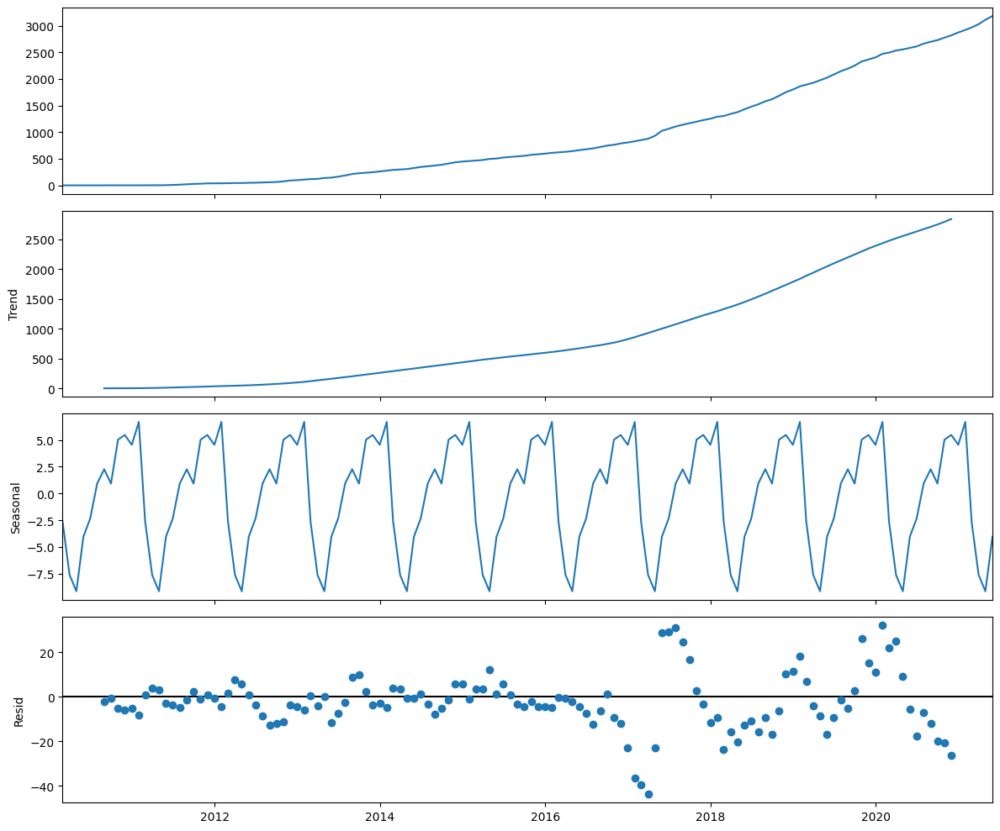

splitting dataset into train and test sets for validation 

plotting the split :- Thurston


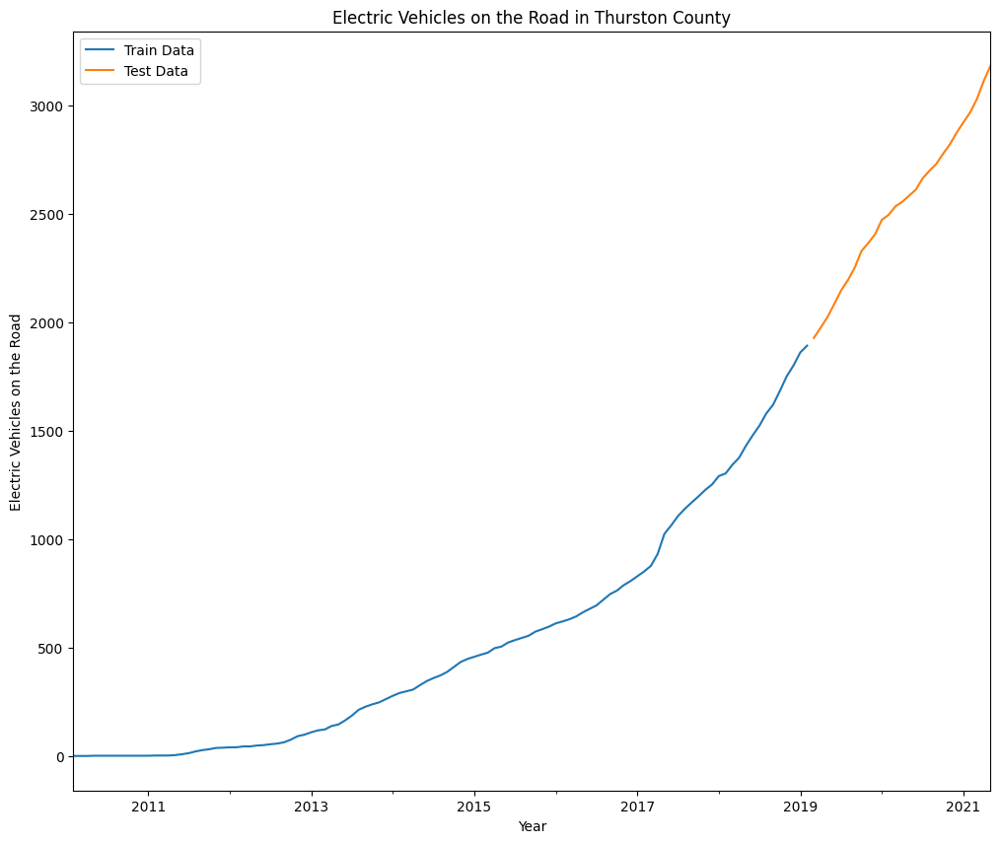

Finding Best Parameters with Auto-Arima 

Validate Model with Forecasts for Test Data 

evaluate_model with Forecasts for Test Data Thurston 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  109
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -372.009
Date:                            Mon, 03 Jul 2023   AIC                            748.017
Time:                                    12:32:38   BIC                            753.125
Sample:                                02-28-2010   HQIC                           750.081
                                     - 02-28-2019                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5914      0.050     11.736      0.000       0.493       0.690
sigma2       147.5081     15.234      9.683      0.000     117.650     177.366
===================================================================================
Ljung-Box (L1) (Q):                   3.04   Jarque-Bera (JB):                27.59
Prob(Q):                              0.08   Prob(JB):                         0.00
Heteroskedasticity (H):               8.68   Skew:                             0.56
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.39
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

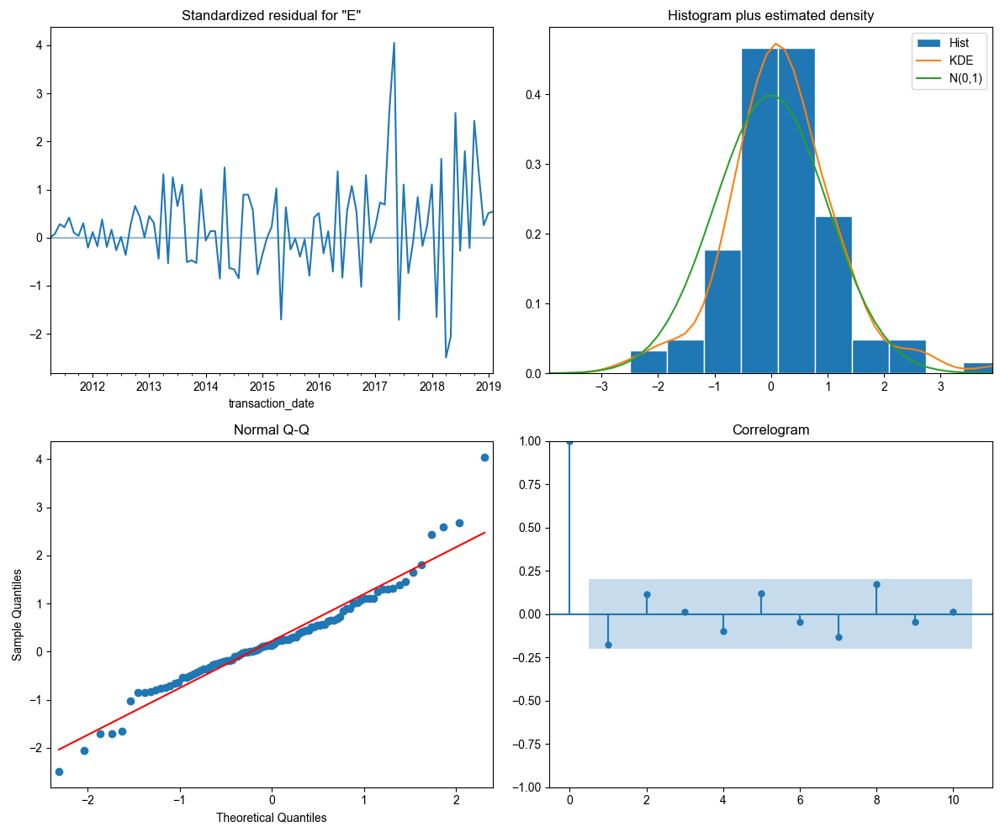

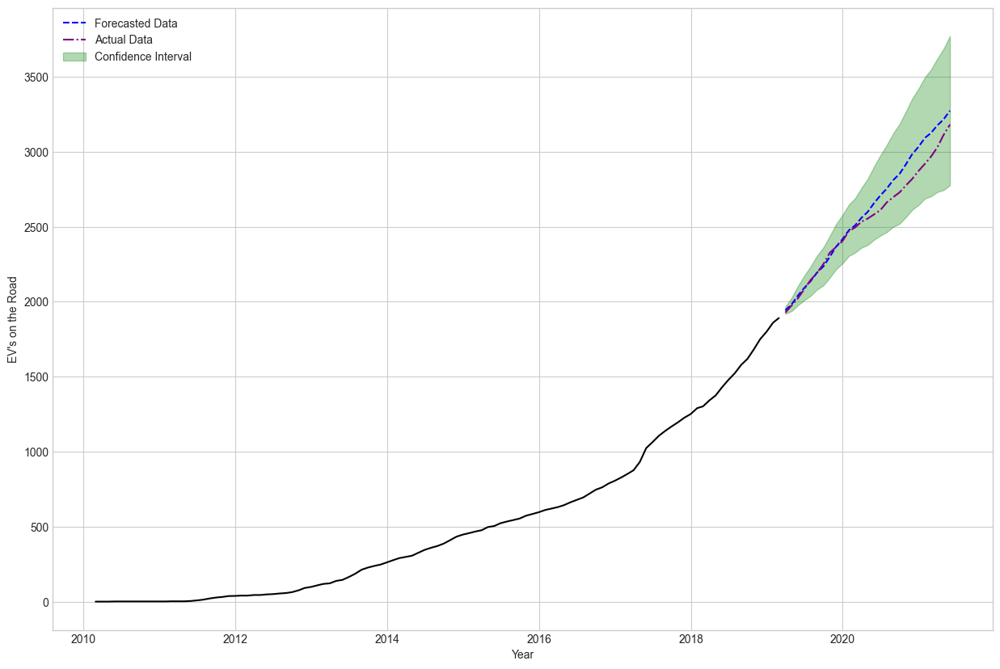

Future Predictions 

evaluate_model with Forecasts for Test Data Thurston 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  136
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -496.794
Date:                            Mon, 03 Jul 2023   AIC                            997.588
Time:                                    12:32:39   BIC                           1003.196
Sample:                                02-28-2010   HQIC                           999.866
                                     - 05-31-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5581      0.059      9.492      0.000       0.443       0.673
sigma2       201.6001     20.088     10.036      0.000     162.229     240.971
===================================================================================
Ljung-Box (L1) (Q):                   2.24   Jarque-Bera (JB):                15.71
Prob(Q):                              0.13   Prob(JB):                         0.00
Heteroskedasticity (H):               7.92   Skew:                             0.33
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.63
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

creating a df of predictions and plotting 



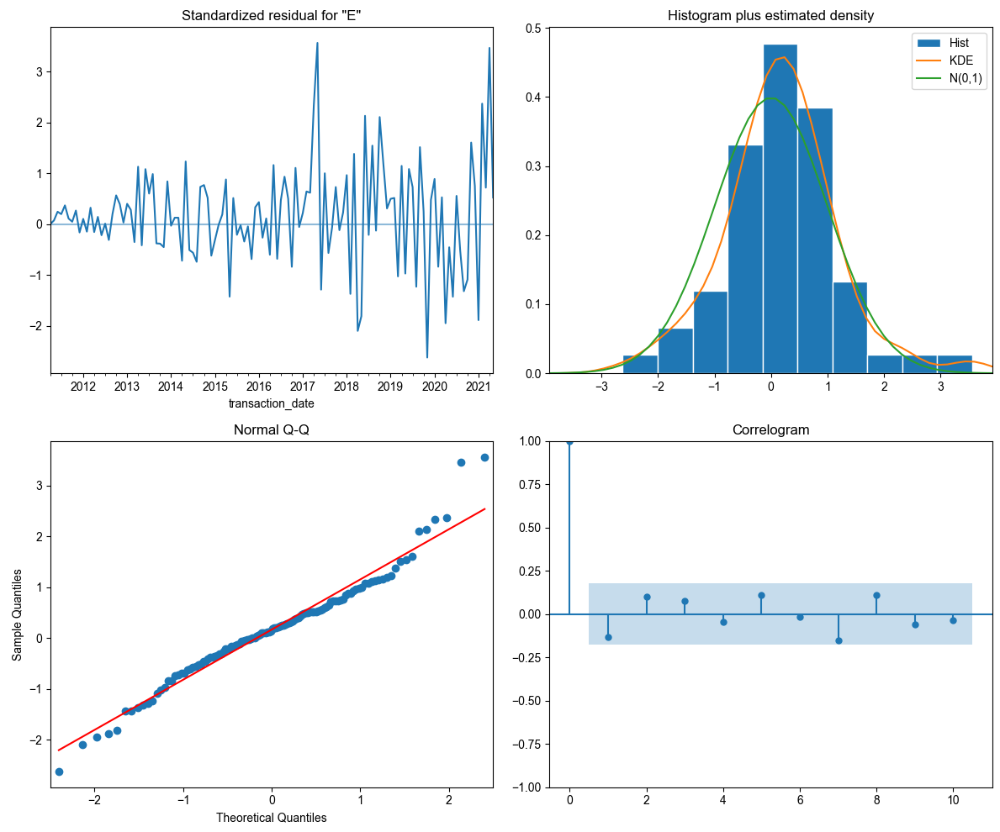

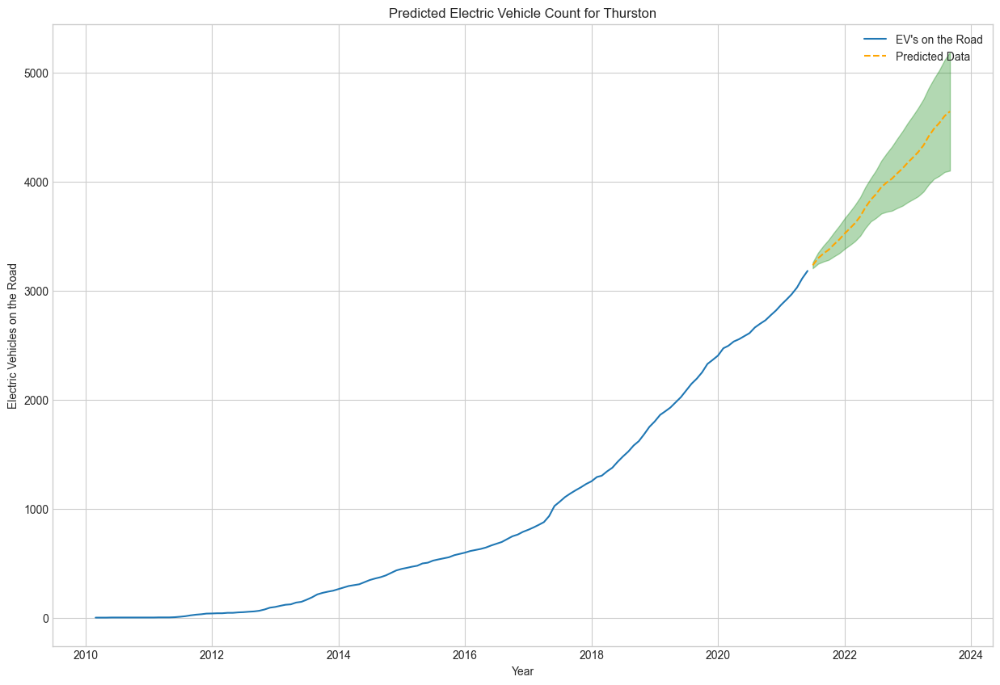

saving predictions df to dict for later use 

Output DataFrame saved to 'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\Chargers_predictions\Thurston_Prediction.csv'
Seasonality Check for :- Kitsap


<Figure size 1200x1000 with 0 Axes>

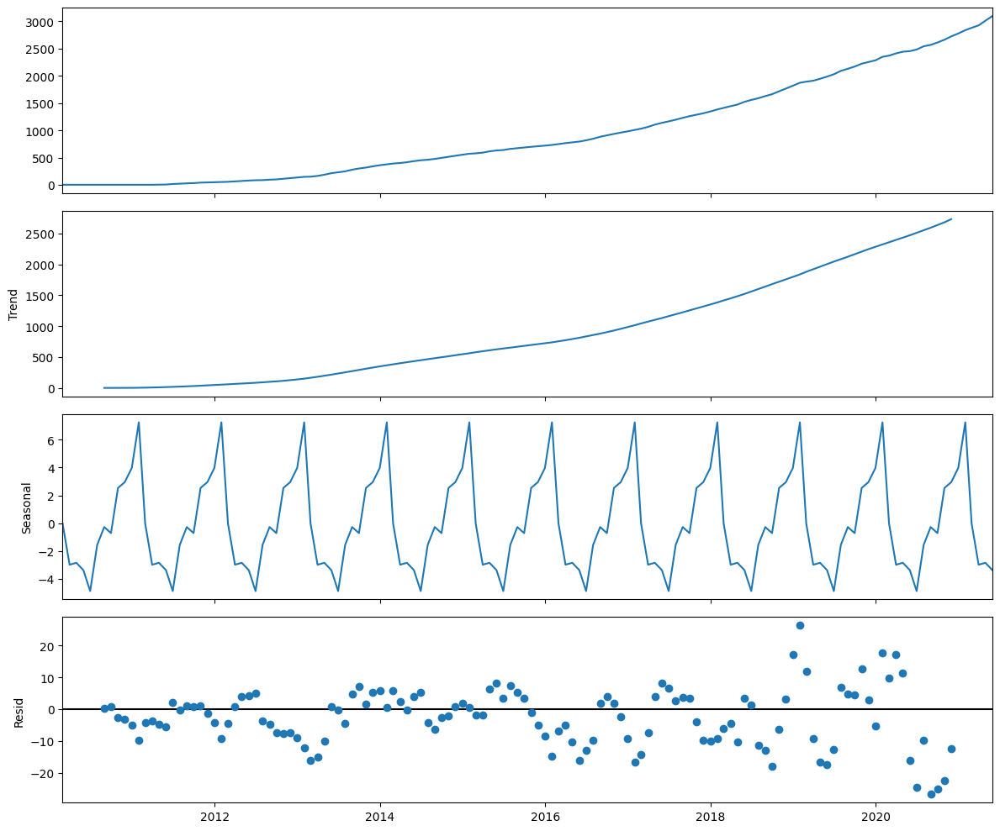

splitting dataset into train and test sets for validation 

plotting the split :- Kitsap


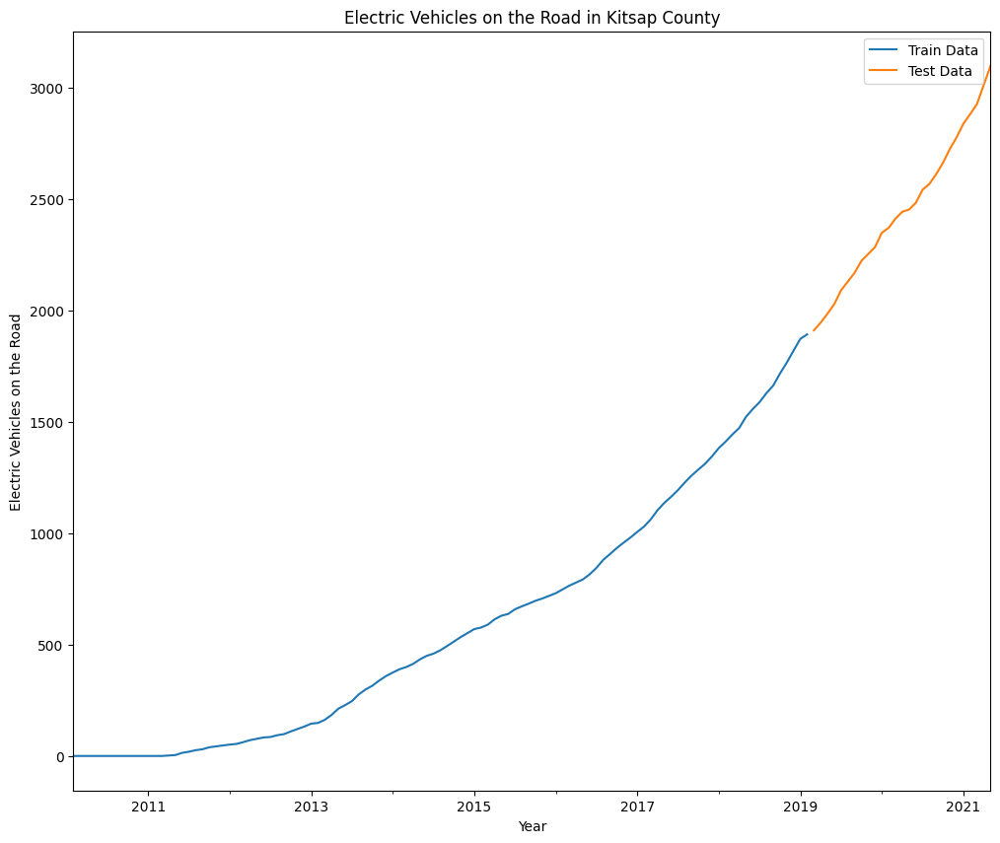

Finding Best Parameters with Auto-Arima 

Validate Model with Forecasts for Test Data 

evaluate_model with Forecasts for Test Data Kitsap 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  109
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -331.355
Date:                            Mon, 03 Jul 2023   AIC                            666.710
Time:                                    12:32:49   BIC                            671.818
Sample:                                02-28-2010   HQIC                           668.774
                                     - 02-28-2019                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6489      0.083      7.843      0.000       0.487       0.811
sigma2        62.6787      7.462      8.400      0.000      48.054      77.304
===================================================================================
Ljung-Box (L1) (Q):                   0.97   Jarque-Bera (JB):                 5.36
Prob(Q):                              0.33   Prob(JB):                         0.07
Heteroskedasticity (H):               2.97   Skew:                             0.41
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.82
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

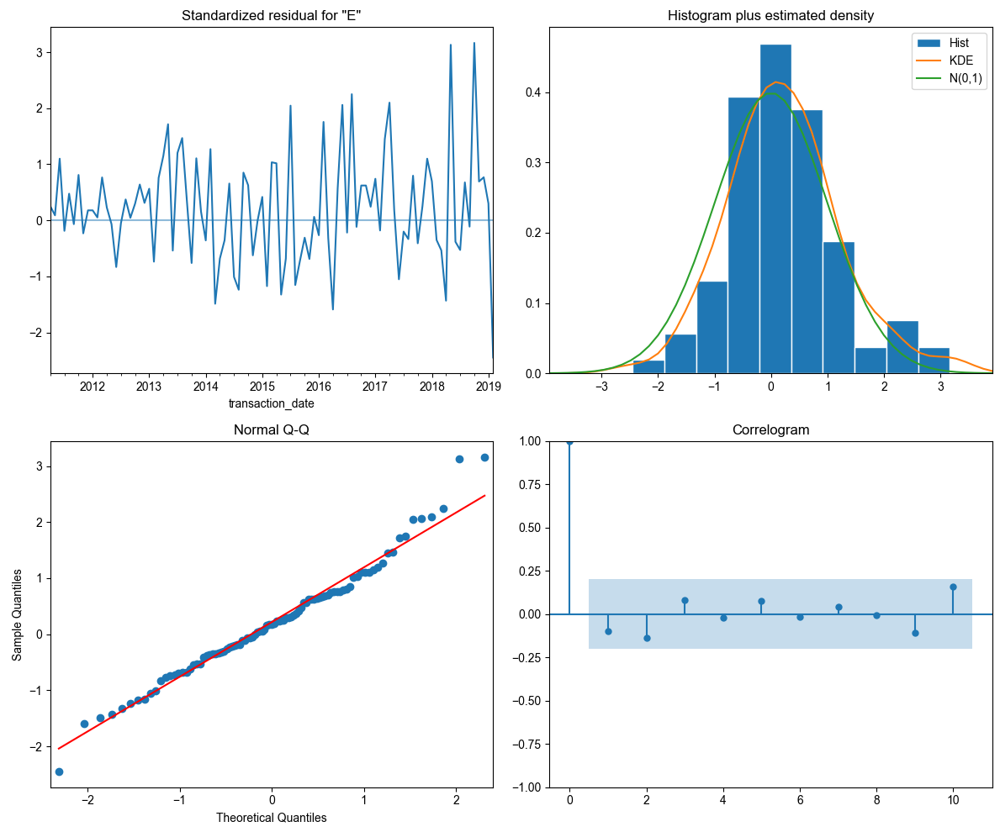

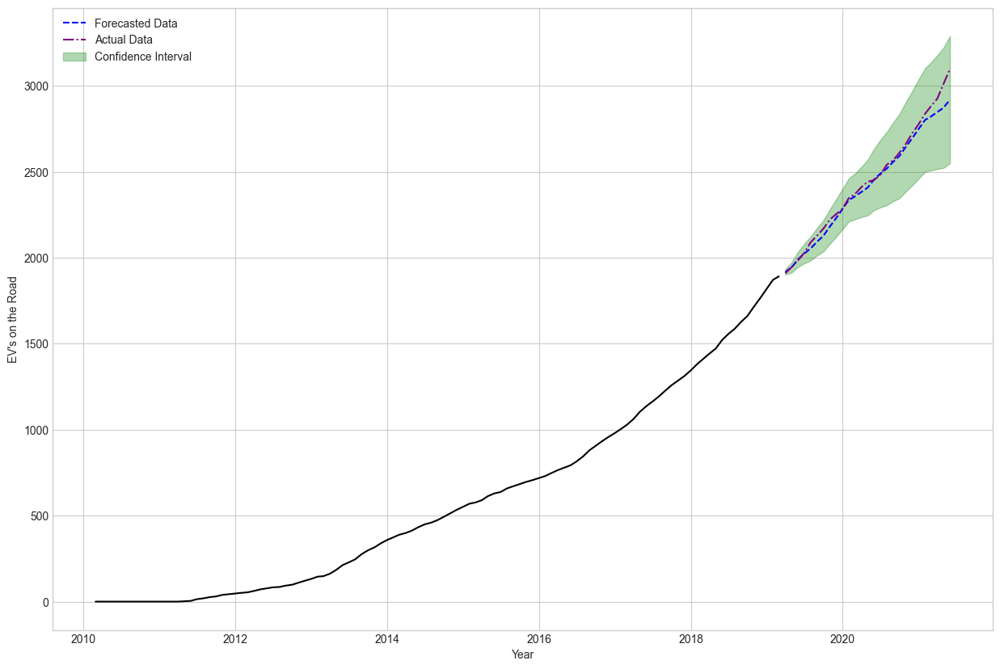

Future Predictions 

evaluate_model with Forecasts for Test Data Kitsap 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  136
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -474.913
Date:                            Mon, 03 Jul 2023   AIC                            953.827
Time:                                    12:32:50   BIC                            959.435
Sample:                                02-28-2010   HQIC                           956.104
                                     - 05-31-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6392      0.056     11.341      0.000       0.529       0.750
sigma2       140.8346     11.698     12.039      0.000     117.907     163.763
===================================================================================
Ljung-Box (L1) (Q):                   0.50   Jarque-Bera (JB):                61.76
Prob(Q):                              0.48   Prob(JB):                         0.00
Heteroskedasticity (H):               8.90   Skew:                             0.97
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.89
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

creating a df of predictions and plotting 



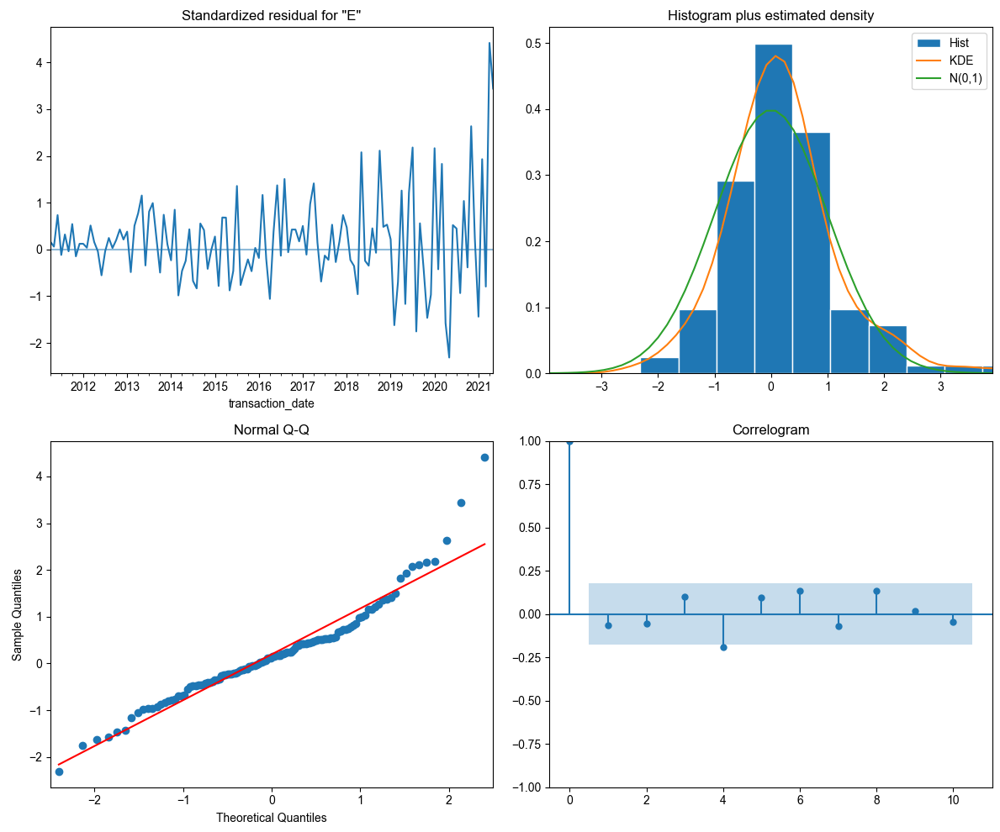

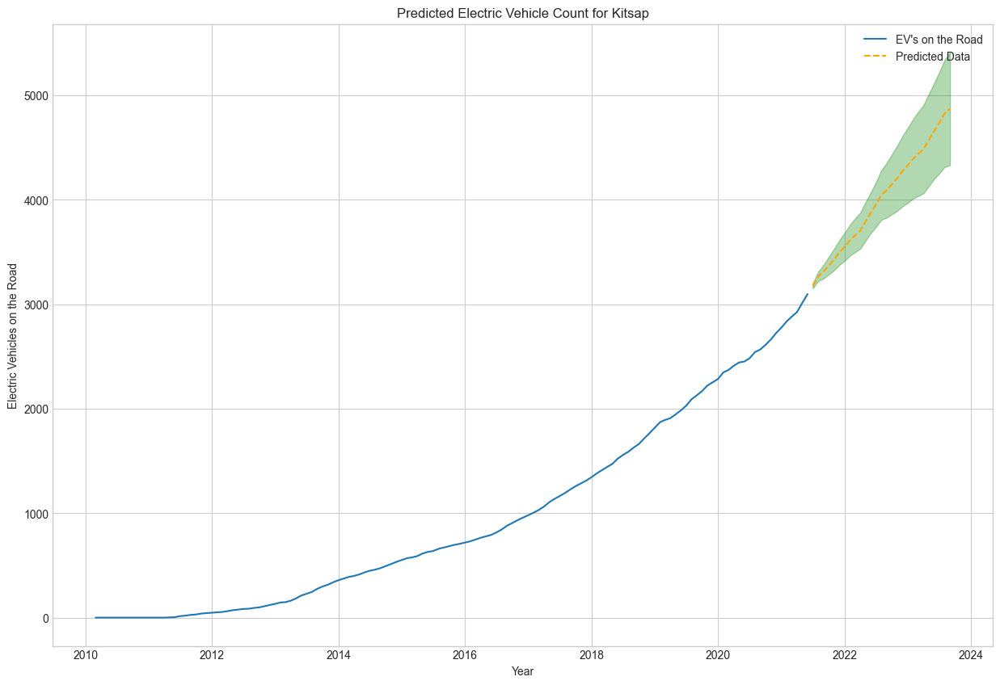

saving predictions df to dict for later use 

Output DataFrame saved to 'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\Chargers_predictions\Kitsap_Prediction.csv'
Seasonality Check for :- Whatcom


<Figure size 1200x1000 with 0 Axes>

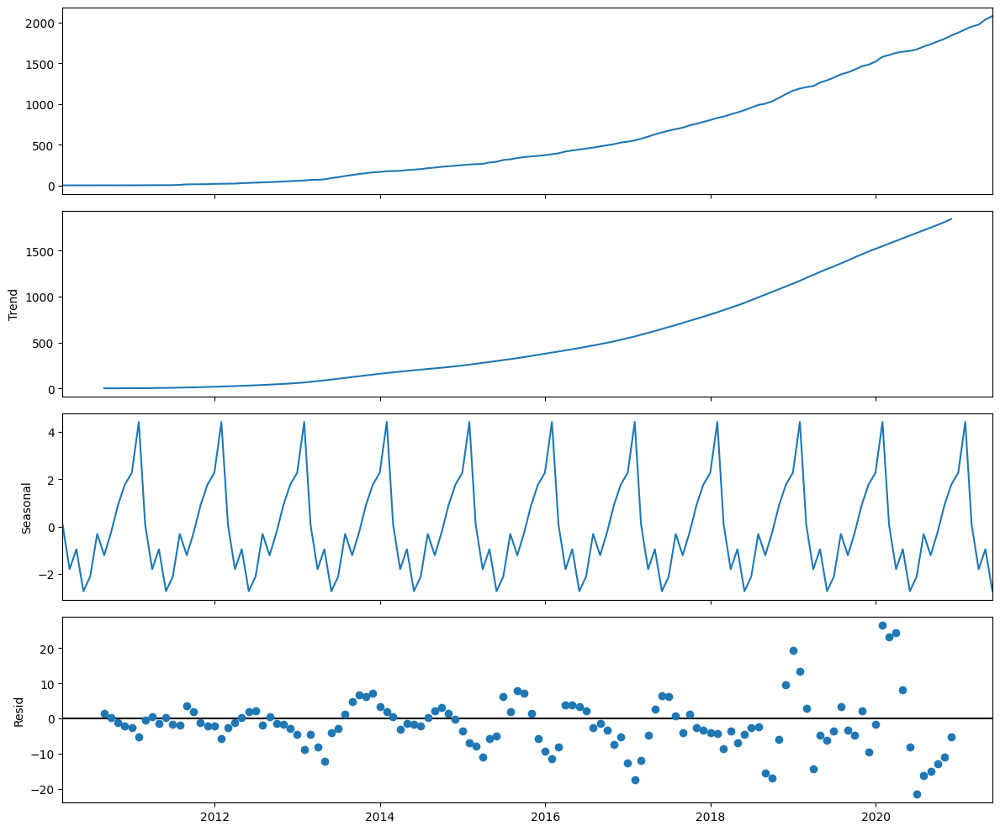

splitting dataset into train and test sets for validation 

plotting the split :- Whatcom


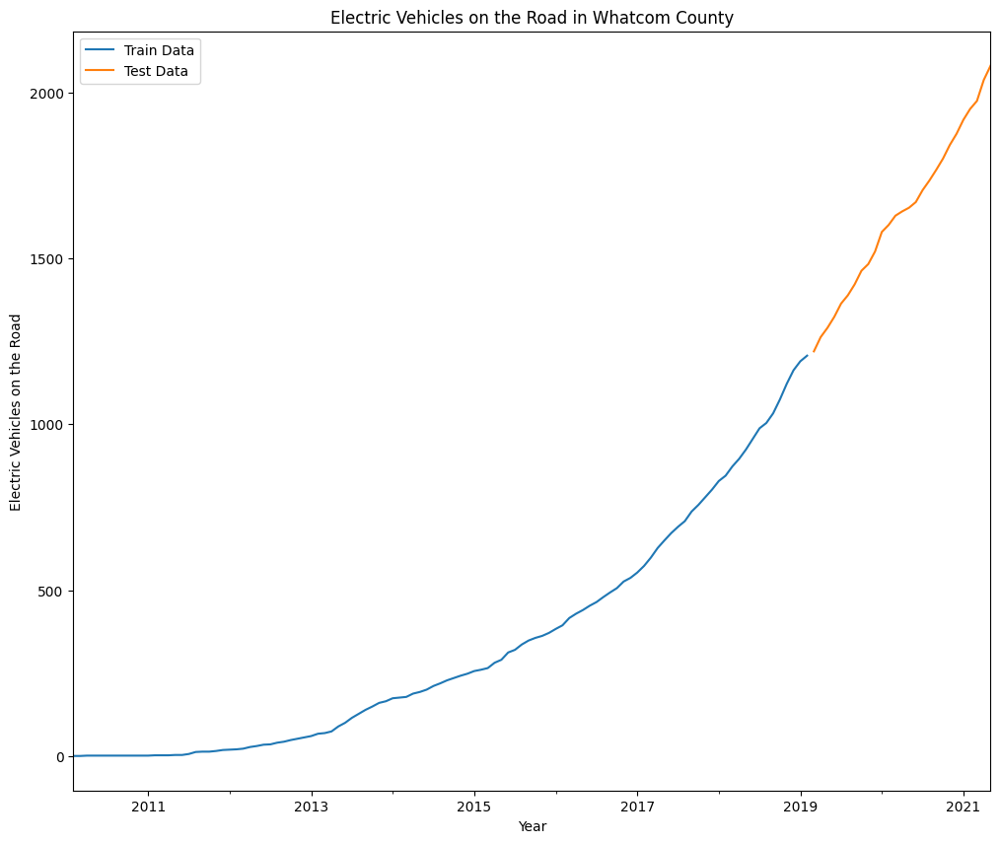

Finding Best Parameters with Auto-Arima 

Validate Model with Forecasts for Test Data 

evaluate_model with Forecasts for Test Data Whatcom 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  109
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -308.230
Date:                            Mon, 03 Jul 2023   AIC                            620.461
Time:                                    12:33:02   BIC                            625.568
Sample:                                02-28-2010   HQIC                           622.525
                                     - 02-28-2019                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5237      0.075      7.019      0.000       0.377       0.670
sigma2        38.5202      4.451      8.654      0.000      29.796      47.245
===================================================================================
Ljung-Box (L1) (Q):                   4.92   Jarque-Bera (JB):                 5.72
Prob(Q):                              0.03   Prob(JB):                         0.06
Heteroskedasticity (H):               4.51   Skew:                             0.27
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.08
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

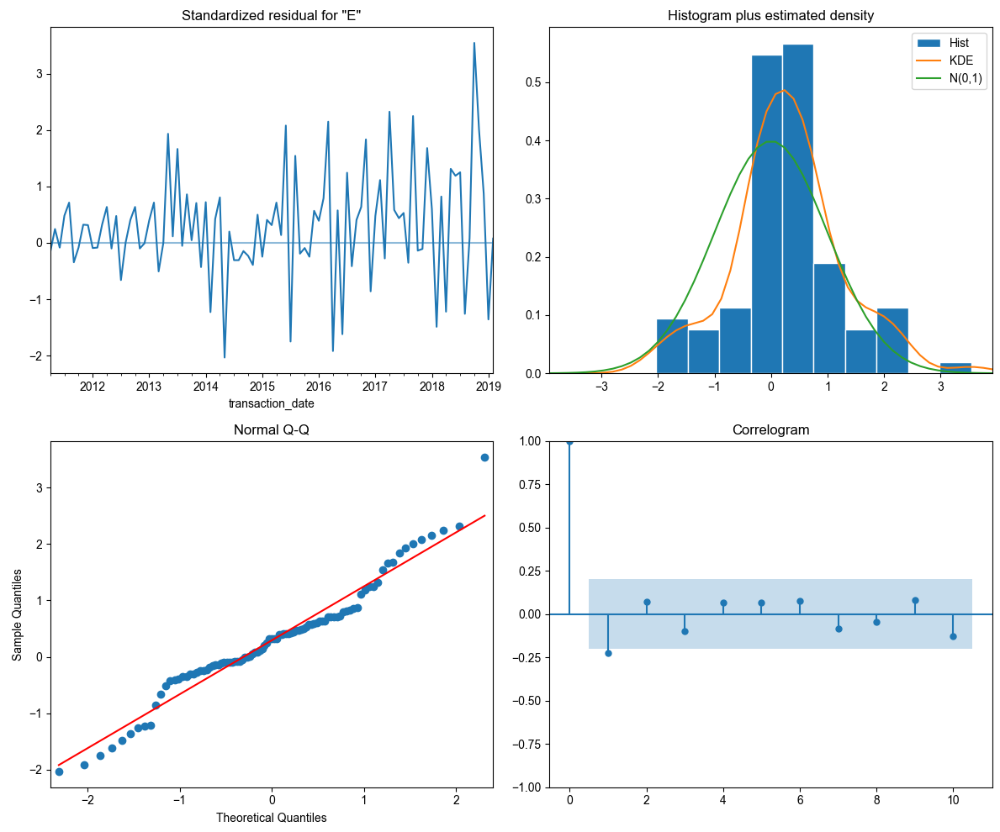

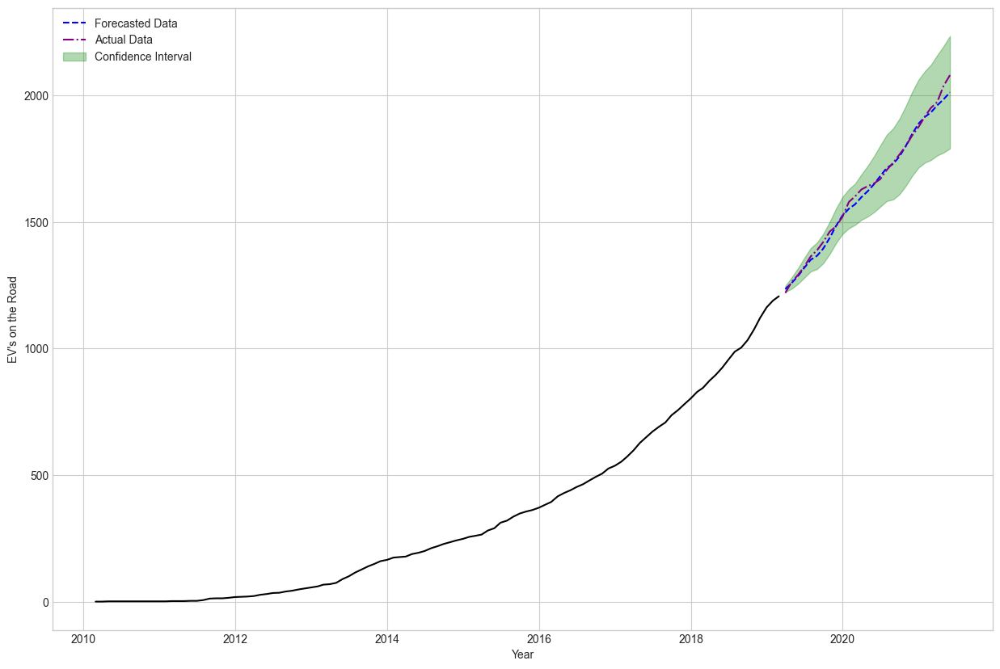

Future Predictions 

evaluate_model with Forecasts for Test Data Whatcom 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  136
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -455.671
Date:                            Mon, 03 Jul 2023   AIC                            915.342
Time:                                    12:33:03   BIC                            920.950
Sample:                                02-28-2010   HQIC                           917.620
                                     - 05-31-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3137      0.080      3.942      0.000       0.158       0.470
sigma2       102.7339      6.808     15.091      0.000      89.391     116.077
===================================================================================
Ljung-Box (L1) (Q):                   1.10   Jarque-Bera (JB):               204.79
Prob(Q):                              0.29   Prob(JB):                         0.00
Heteroskedasticity (H):              12.78   Skew:                             0.74
Prob(H) (two-sided):                  0.00   Kurtosis:                         9.17
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

creating a df of predictions and plotting 



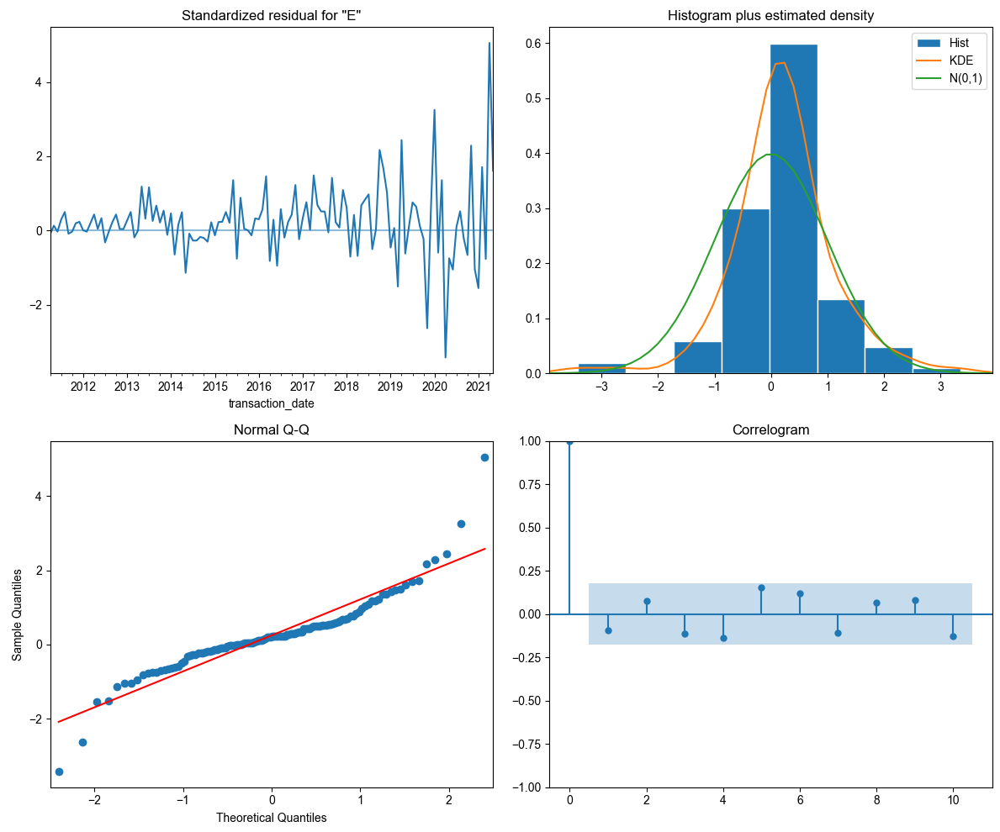

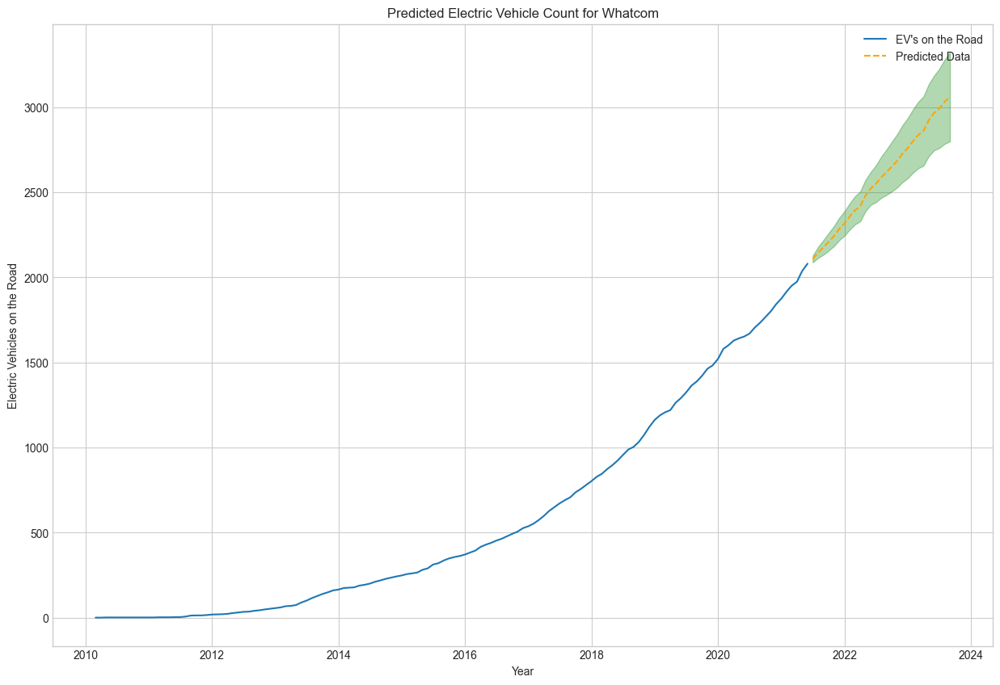

saving predictions df to dict for later use 

Output DataFrame saved to 'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\Chargers_predictions\Whatcom_Prediction.csv'
Seasonality Check for :- Spokane


<Figure size 1200x1000 with 0 Axes>

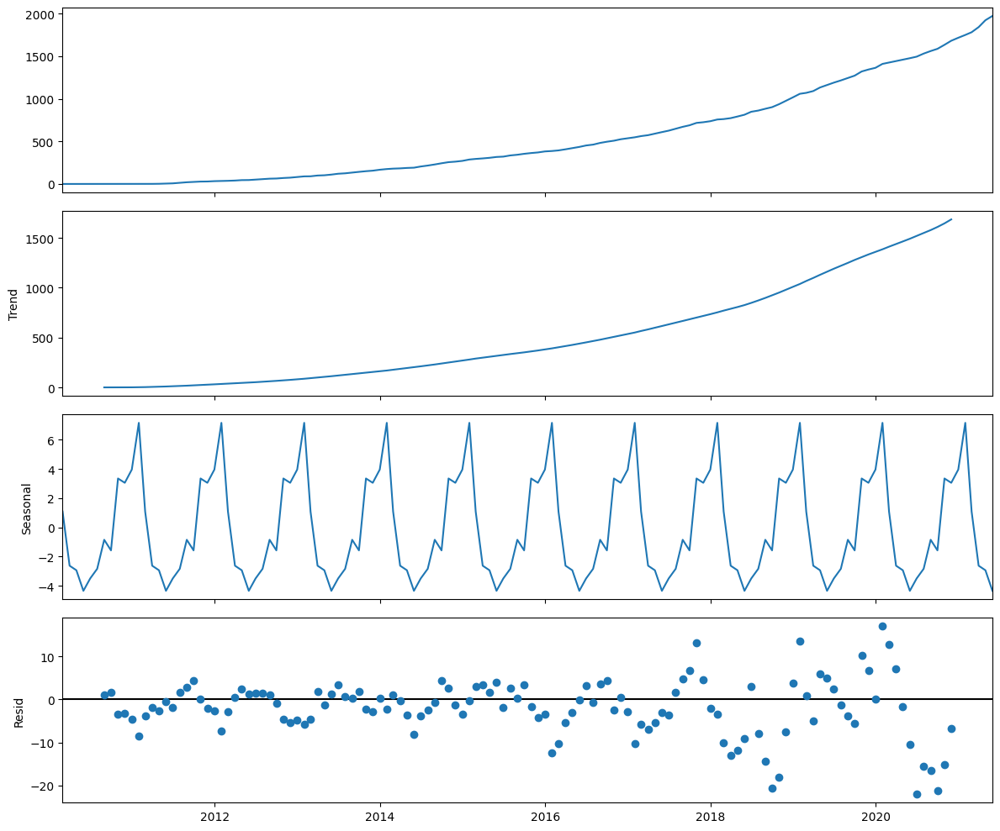

splitting dataset into train and test sets for validation 

plotting the split :- Spokane


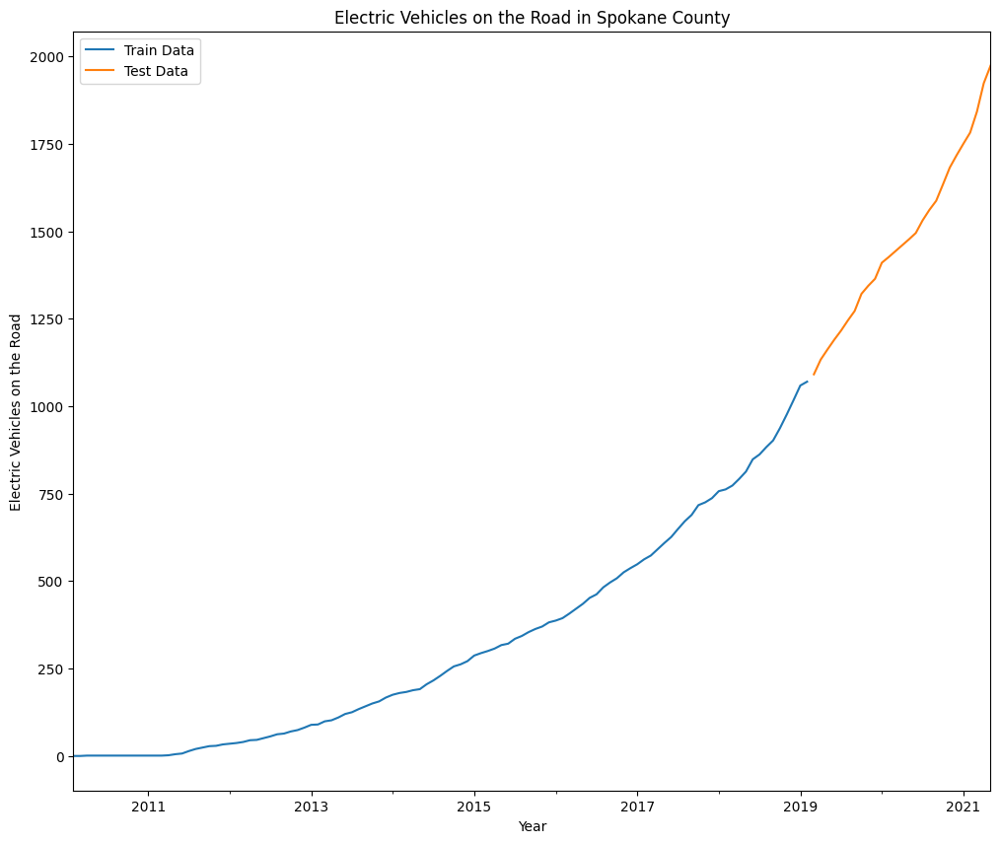

Finding Best Parameters with Auto-Arima 

Validate Model with Forecasts for Test Data 

evaluate_model with Forecasts for Test Data Spokane 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  109
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -318.193
Date:                            Mon, 03 Jul 2023   AIC                            640.385
Time:                                    12:33:11   BIC                            645.493
Sample:                                02-28-2010   HQIC                           642.449
                                     - 02-28-2019                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3726      0.061      6.080      0.000       0.252       0.493
sigma2        47.5087      4.720     10.066      0.000      38.259      56.759
===================================================================================
Ljung-Box (L1) (Q):                   3.99   Jarque-Bera (JB):                31.24
Prob(Q):                              0.05   Prob(JB):                         0.00
Heteroskedasticity (H):               9.04   Skew:                             0.33
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.73
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

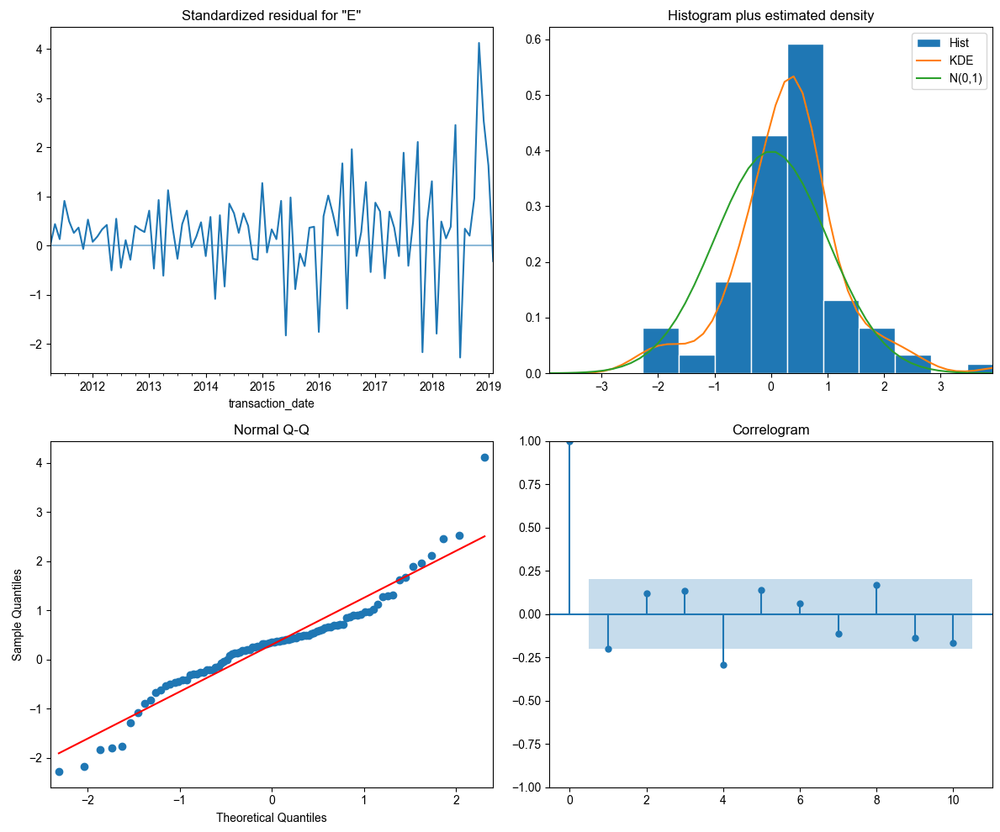

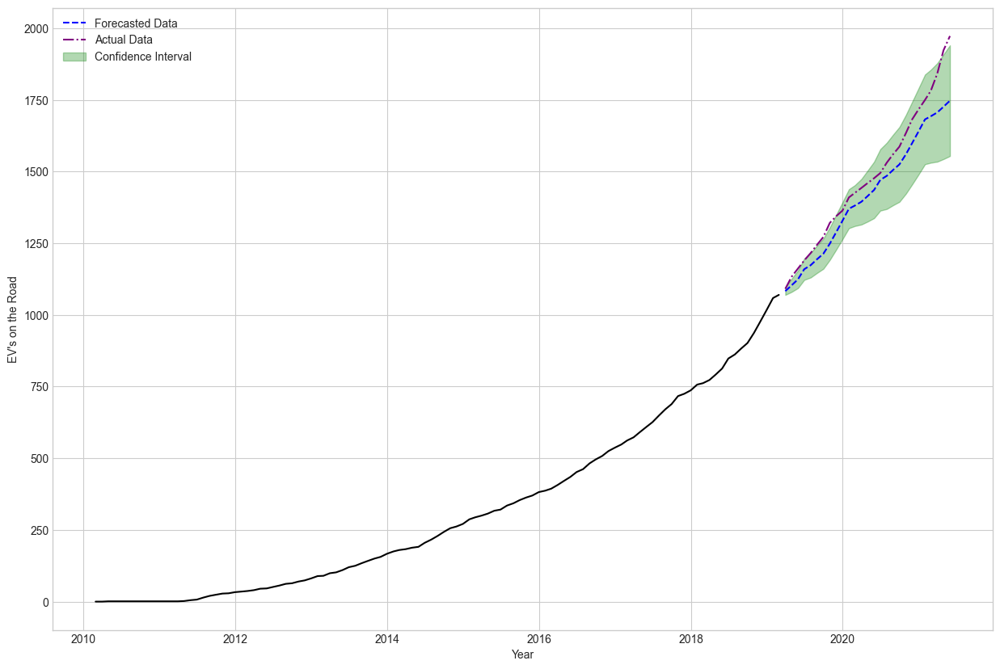

Future Predictions 

evaluate_model with Forecasts for Test Data Spokane 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  136
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -452.075
Date:                            Mon, 03 Jul 2023   AIC                            908.151
Time:                                    12:33:12   BIC                            913.759
Sample:                                02-28-2010   HQIC                           910.429
                                     - 05-31-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5506      0.055      9.941      0.000       0.442       0.659
sigma2        96.8531      9.274     10.443      0.000      78.676     115.030
===================================================================================
Ljung-Box (L1) (Q):                   0.22   Jarque-Bera (JB):                51.03
Prob(Q):                              0.64   Prob(JB):                         0.00
Heteroskedasticity (H):              15.68   Skew:                             0.60
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.93
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

creating a df of predictions and plotting 



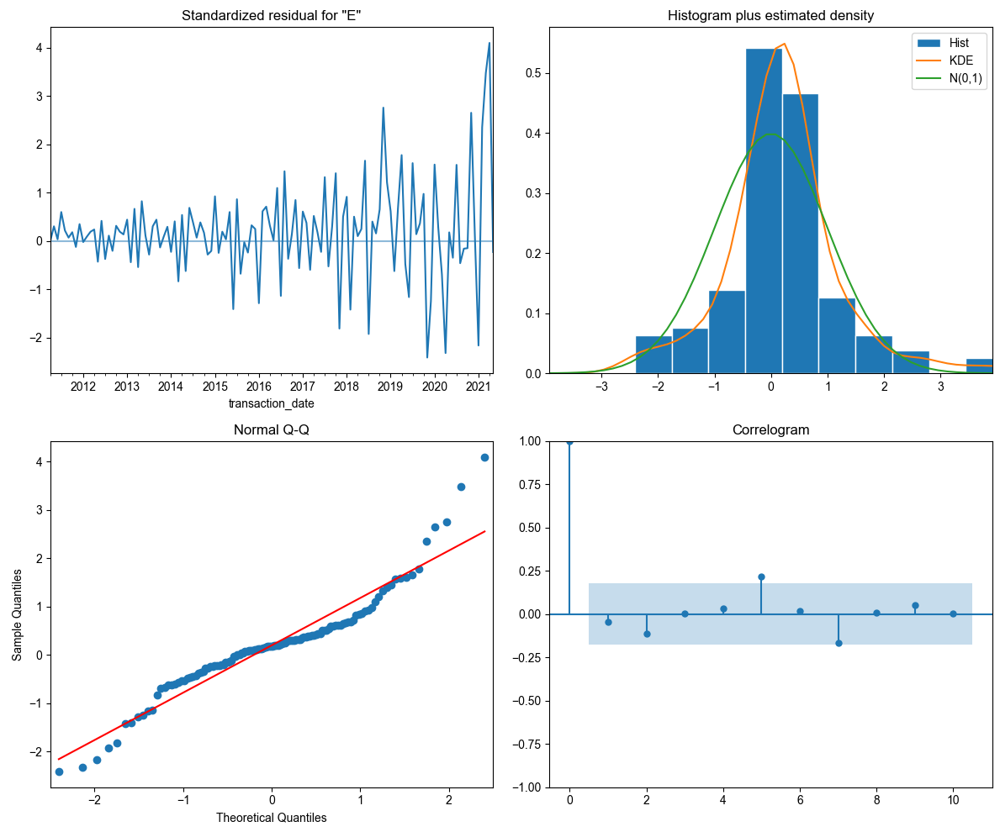

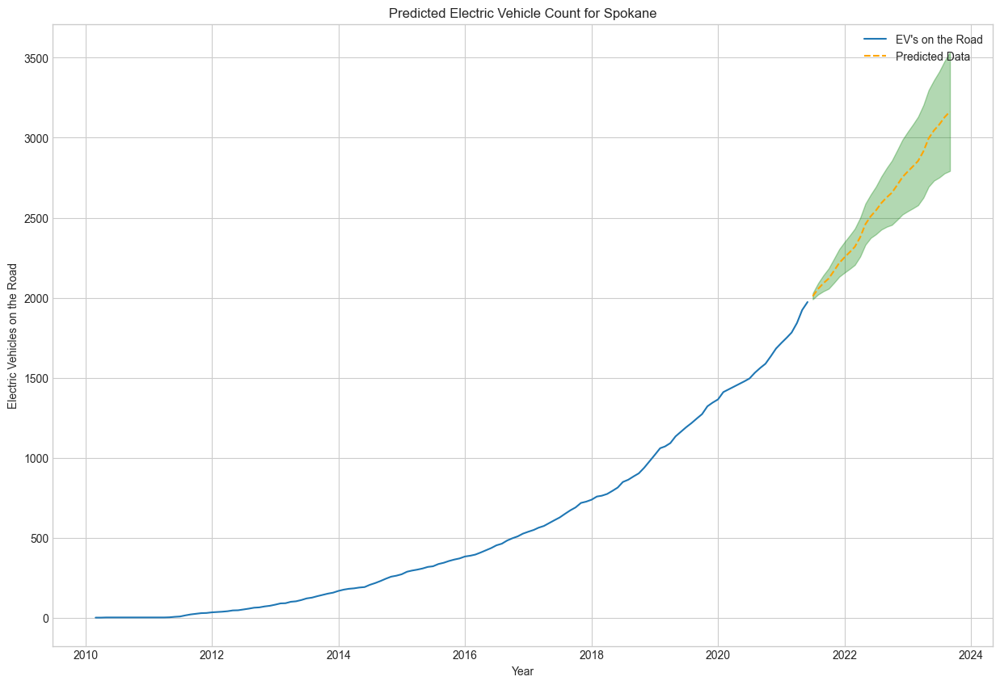

saving predictions df to dict for later use 

Output DataFrame saved to 'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\Chargers_predictions\Spokane_Prediction.csv'
Seasonality Check for :- Benton


<Figure size 1200x1000 with 0 Axes>

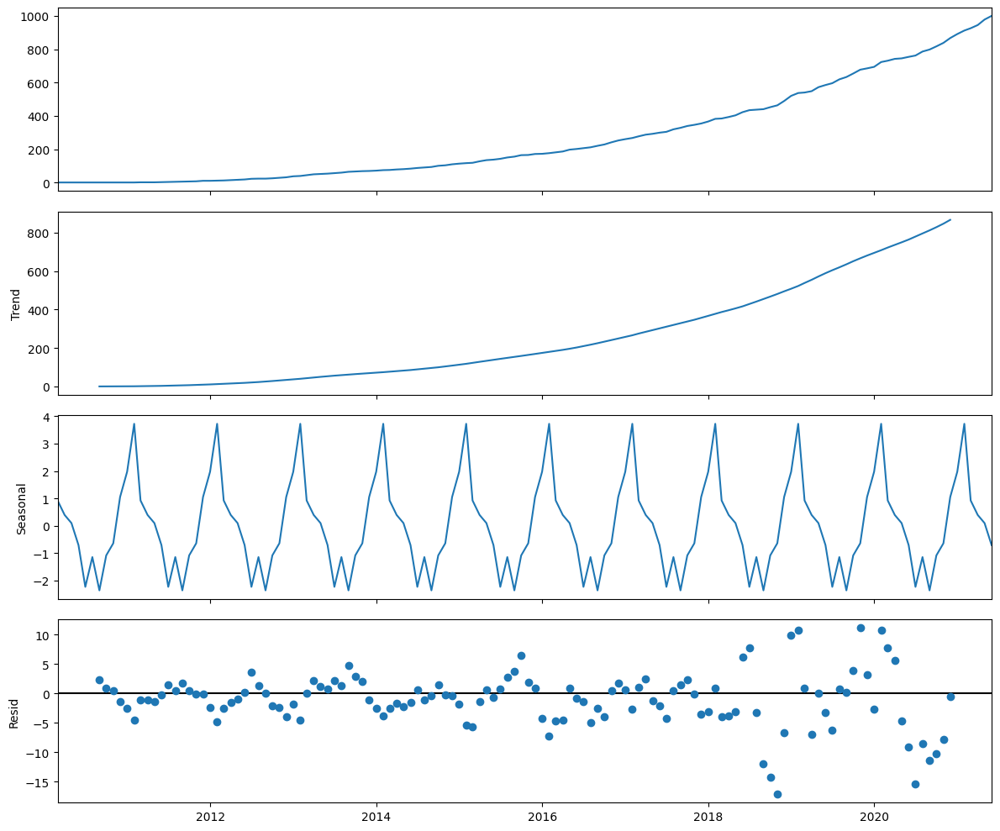

splitting dataset into train and test sets for validation 

plotting the split :- Benton


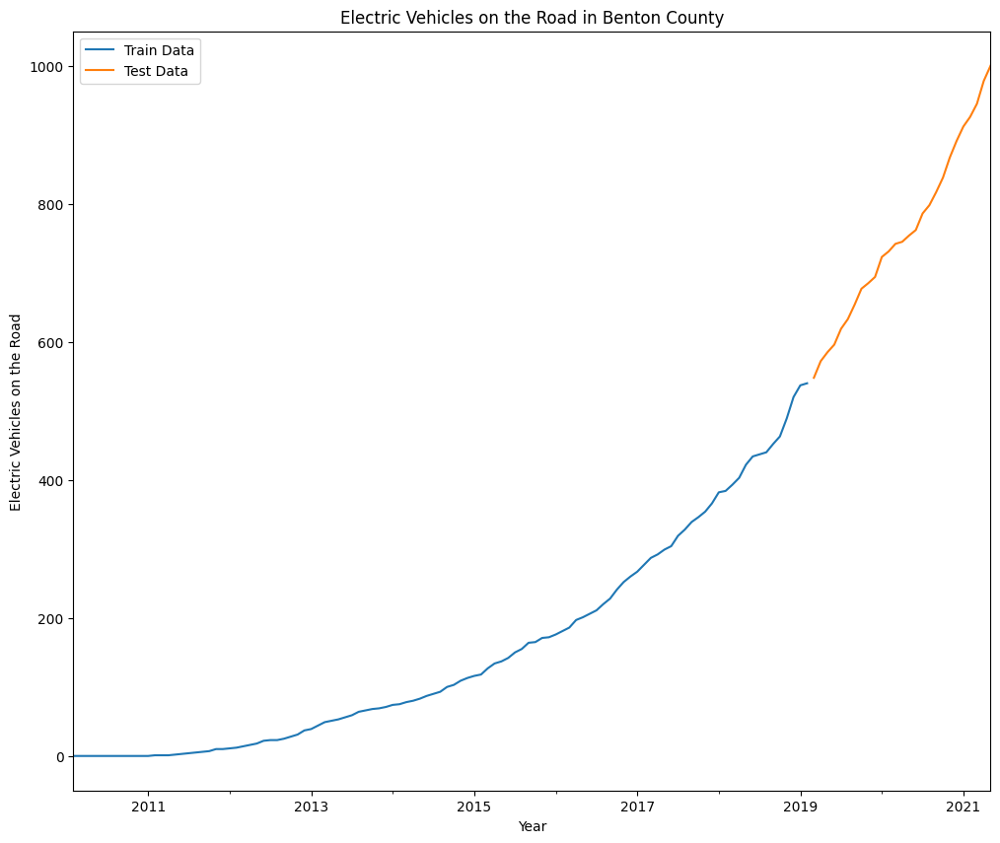

Finding Best Parameters with Auto-Arima 

Validate Model with Forecasts for Test Data 

evaluate_model with Forecasts for Test Data Benton 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  109
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -277.805
Date:                            Mon, 03 Jul 2023   AIC                            559.610
Time:                                    12:33:15   BIC                            564.717
Sample:                                02-28-2010   HQIC                           561.673
                                     - 02-28-2019                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3230      0.064      5.035      0.000       0.197       0.449
sigma2        20.3005      1.921     10.569      0.000      16.536      24.065
===================================================================================
Ljung-Box (L1) (Q):                   0.22   Jarque-Bera (JB):                37.18
Prob(Q):                              0.64   Prob(JB):                         0.00
Heteroskedasticity (H):              13.18   Skew:                             0.24
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

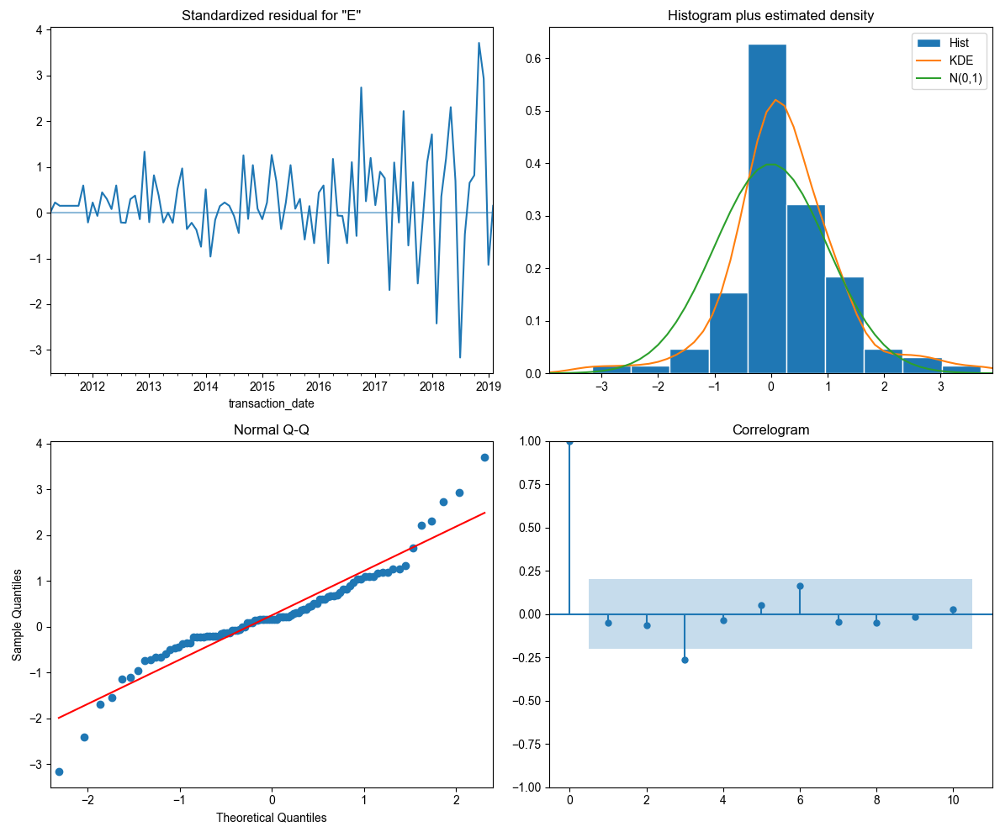

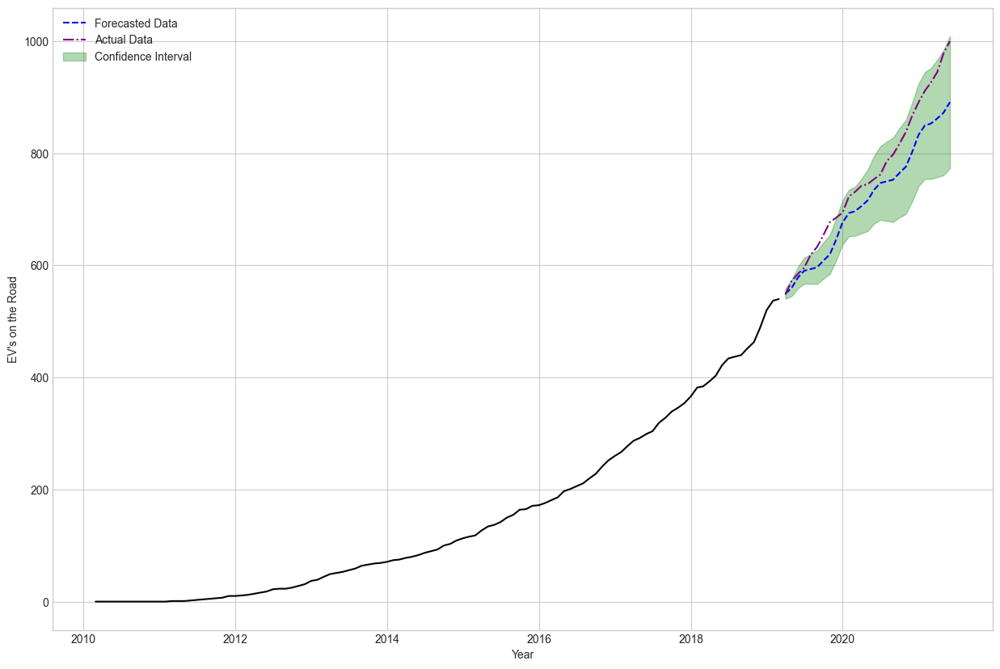

Future Predictions 

evaluate_model with Forecasts for Test Data Benton 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  136
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -410.472
Date:                            Mon, 03 Jul 2023   AIC                            824.944
Time:                                    12:33:16   BIC                            830.552
Sample:                                02-28-2010   HQIC                           827.222
                                     - 05-31-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.2875      0.062      4.620      0.000       0.166       0.409
sigma2        48.9682      3.739     13.098      0.000      41.640      56.296
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                74.88
Prob(Q):                              0.95   Prob(JB):                         0.00
Heteroskedasticity (H):              31.69   Skew:                             0.18
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.82
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

creating a df of predictions and plotting 



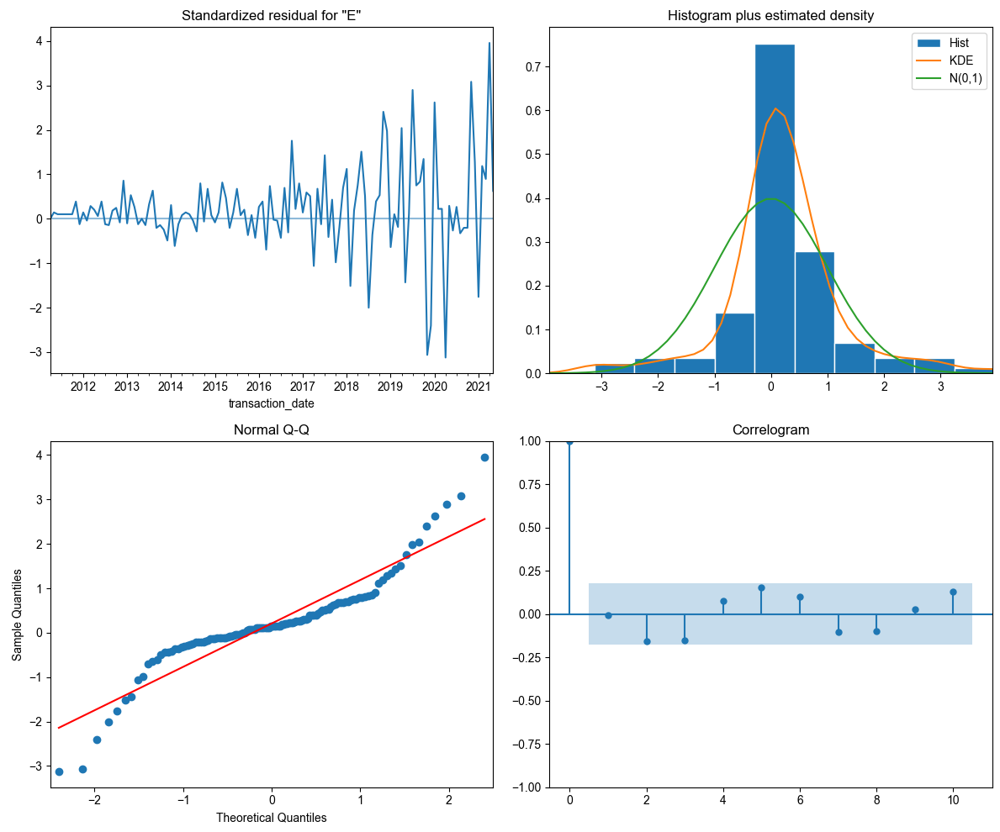

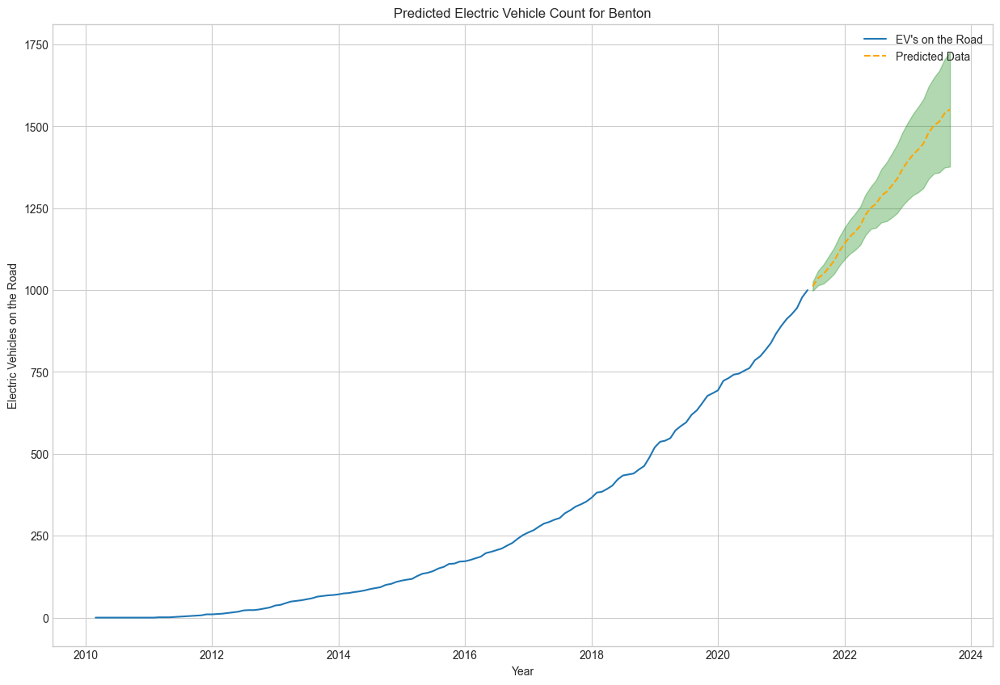

saving predictions df to dict for later use 

Output DataFrame saved to 'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\Chargers_predictions\Benton_Prediction.csv'
Seasonality Check for :- Island


<Figure size 1200x1000 with 0 Axes>

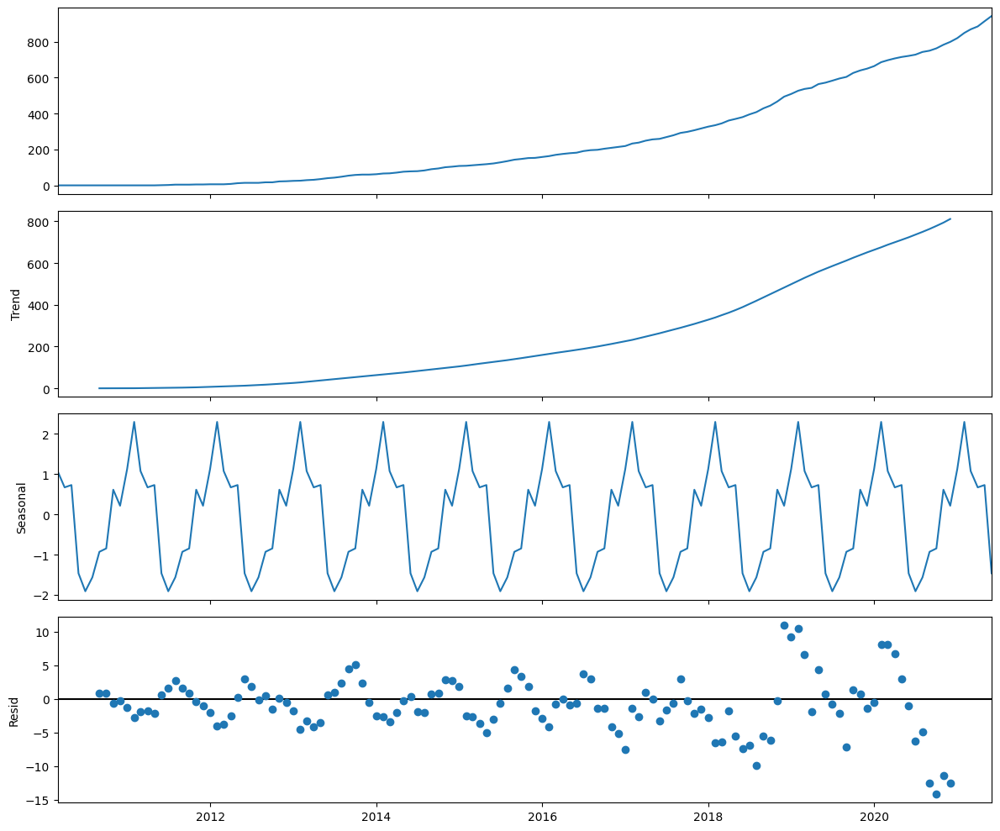

splitting dataset into train and test sets for validation 

plotting the split :- Island


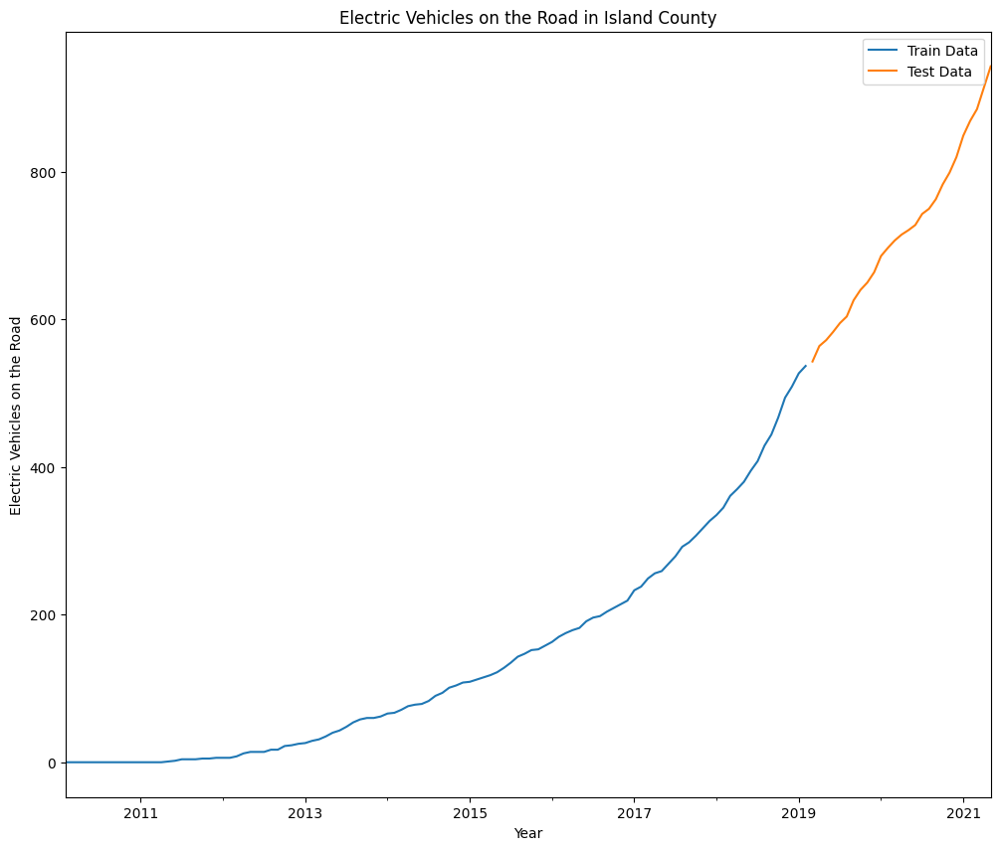

Finding Best Parameters with Auto-Arima 

Validate Model with Forecasts for Test Data 

evaluate_model with Forecasts for Test Data Island 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  109
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -256.863
Date:                            Mon, 03 Jul 2023   AIC                            517.727
Time:                                    12:33:38   BIC                            522.834
Sample:                                02-28-2010   HQIC                           519.791
                                     - 02-28-2019                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5042      0.060      8.453      0.000       0.387       0.621
sigma2        13.0628      1.751      7.459      0.000       9.630      16.495
===================================================================================
Ljung-Box (L1) (Q):                   6.73   Jarque-Bera (JB):                 1.54
Prob(Q):                              0.01   Prob(JB):                         0.46
Heteroskedasticity (H):               7.55   Skew:                             0.22
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.44
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

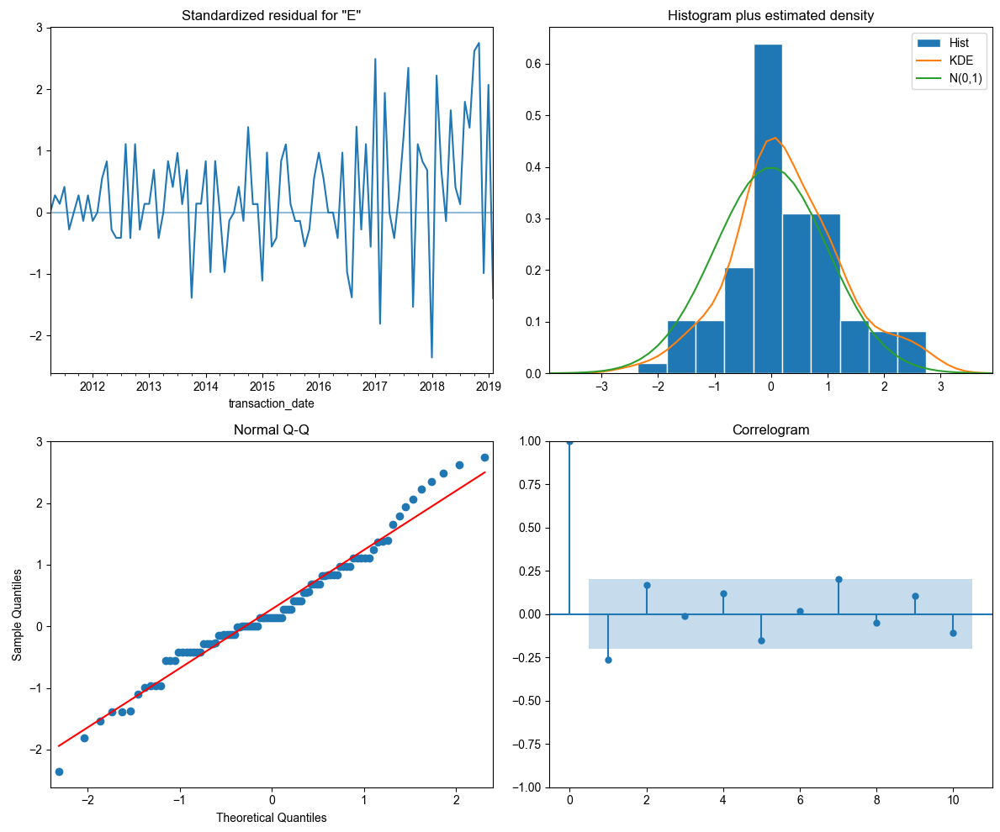

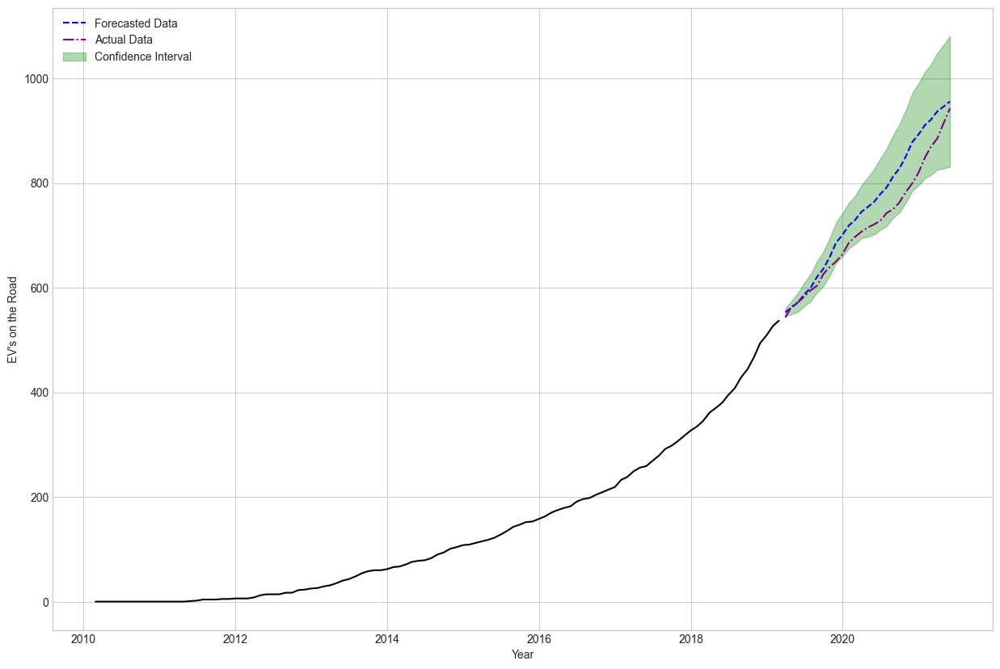

Future Predictions 

evaluate_model with Forecasts for Test Data Island 



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  136
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -376.210
Date:                            Mon, 03 Jul 2023   AIC                            756.420
Time:                                    12:33:39   BIC                            762.028
Sample:                                02-28-2010   HQIC                           758.697
                                     - 05-31-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4317      0.055      7.800      0.000       0.323       0.540
sigma2        27.9243      2.614     10.684      0.000      22.802      33.047
===================================================================================
Ljung-Box (L1) (Q):                   2.20   Jarque-Bera (JB):                19.21
Prob(Q):                              0.14   Prob(JB):                         0.00
Heteroskedasticity (H):              16.31   Skew:                             0.04
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.94
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

creating a df of predictions and plotting 



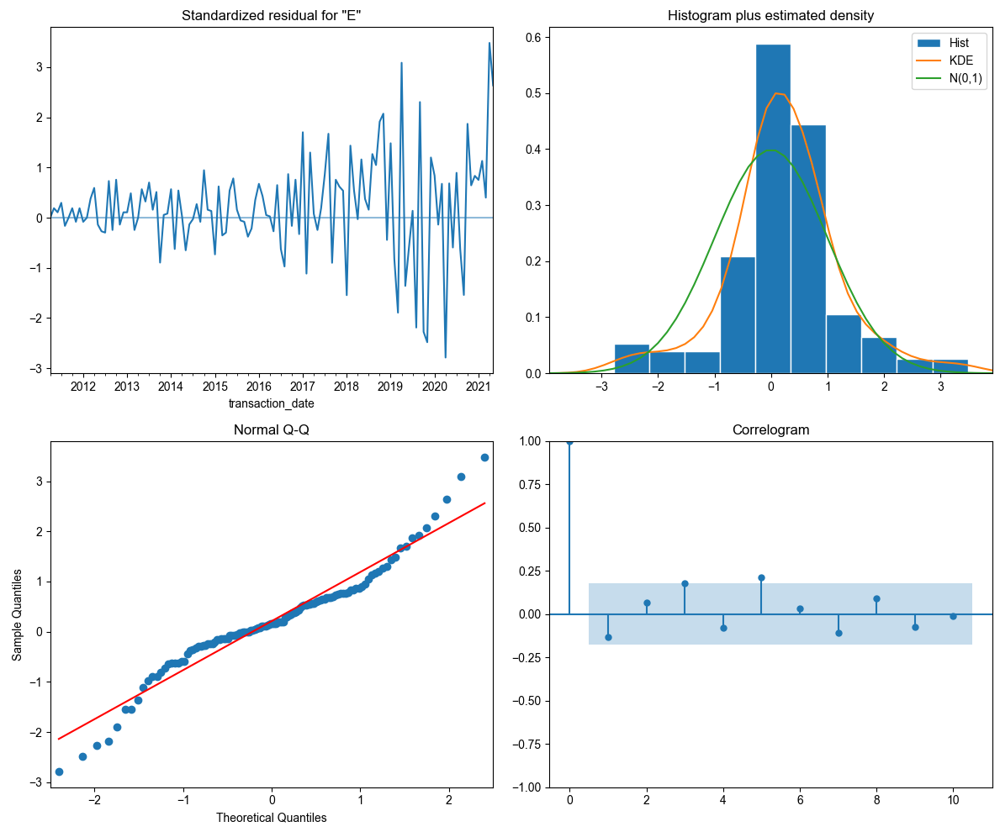

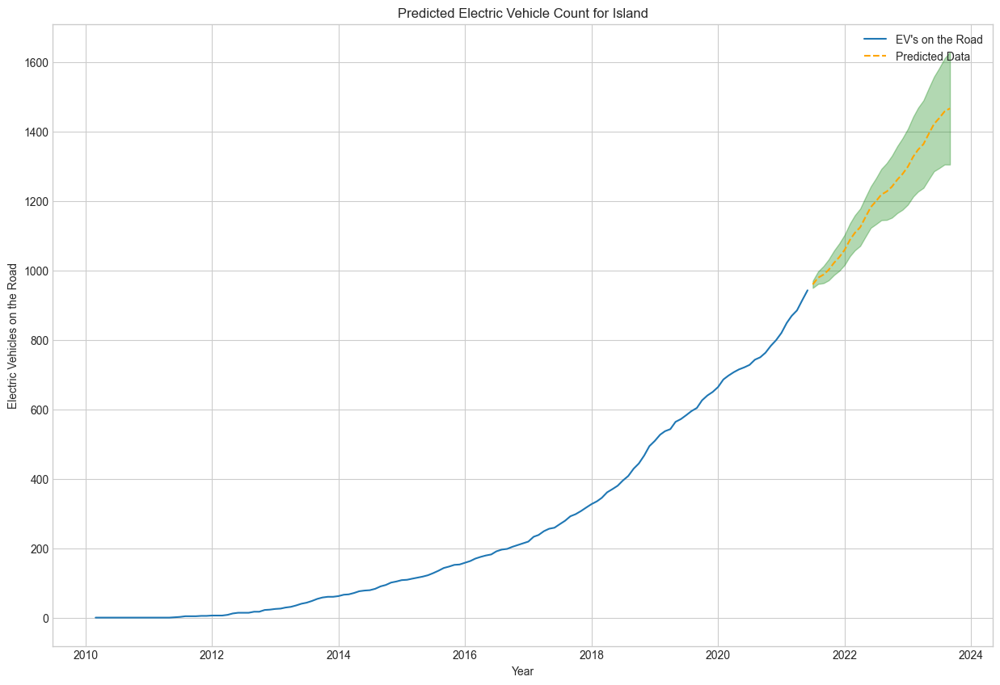

saving predictions df to dict for later use 

Output DataFrame saved to 'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\Chargers_predictions\Island_Prediction.csv'


In [253]:
import statsmodels.tsa.api as tsa
import pmdarima as pm
from statsmodels.tsa.statespace.sarimax import SARIMAX
import os


for county in county_information.keys():

    #Seasonality Check
    print('Seasonality Check for :-', county)
    plt.figure(figsize=(12, 10))
    decomp = tsa.seasonal_decompose(county_information[county]['df'])
    decomp.plot()
    plt.show()

    #splitting dataset into train and test sets for validation
    print('splitting dataset into train and test sets for validation \n')

    train_var = 'train_' + county
    test_var = 'test_' + county

    locals()[train_var], locals()[test_var] = train_test_split_ts(county_information[county]['df'], 0.80, 0.20)

    #plotting the split
    print('plotting the split :-', county)
    plt.figure(figsize=(12, 10))
    plot_train_test_split(locals()[train_var], locals()[test_var], county)
    plt.show()

    # Finding Best Parameters with Auto-Arima
    print('Finding Best Parameters with Auto-Arima \n')
    auto_model = pm.auto_arima(locals()[train_var], start_p=0, d=1, start_q=0, max_p=4, 
                            max_d=3, max_q=4, start_P=0, start_Q=0, max_P=3, 
                            max_D=3, max_Q=3, m=12)
    auto_model.summary()

    # Validate Model with Forecasts for Test Data
    print('Validate Model with Forecasts for Test Data \n')
    model = SARIMAX(locals()[train_var], order=(1,1,0), 
                    seasonal_order=(0,1,0,12), enforce_invertibility=False, 
                    enforce_stationarity=False).fit()
    evaluate_model(model, county)

    df_forecast_var = 'df_' + county + '_forecast'

    locals()[df_forecast_var] = get_forecast(model, locals()[train_var], locals()[test_var], plot=True)

    # Future Predictions
    print('Future Predictions \n')
    # Fitting Model to All Observed Data
    model = SARIMAX(county_information[county]['df'], order=(1,1,0), 
                    seasonal_order=(0,1,0,12), enforce_invertibility=False, 
                    enforce_stationarity=False).fit()
    evaluate_model(model, county)

    #creating a df of predictions and plotting
    print('creating a df of predictions and plotting \n')

    df_preds_var = 'df_' + county + '_forecast'

    locals()[df_preds_var] = get_prediction(model, county_information[county]['df'], 
                                locals()[test_var], county, plot=True)

    #saving predictions df to dict for later use
    print('saving predictions df to dict for later use \n')
    county_information[county]['Predictions'] = locals()[df_preds_var]
    
    
    #`county_information` is a dictionary containing county information

    df = round(county_information[county]['Predictions'], 0)
    folder_path = r"C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\Chargers_predictions"
    # Create the directory if it doesn't exist
    os.makedirs(folder_path, exist_ok=True)
    output_file_name = county + "_Prediction.csv"
    output_file_path = os.path.join(folder_path, output_file_name)
    # Save the output DataFrame to CSV
    df.to_csv(output_file_path, index=False)
    # Confirmation message
    print(f"Output DataFrame saved to '{output_file_path}'")
        

In [114]:
'''
import statsmodels.tsa.api as tsa


#Seasonality Check
print('Seasonality Check /n')
plt.rcParams['figure.figsize']=(12,10)
decomp = tsa.seasonal_decompose(county_information['King']['df'])
decomp.plot();

#splitting dataset into train and test sets for validation
print('splitting dataset into train and test sets for validation /n')
train_king, test_king = train_test_split_ts(county_information['King']['df'], 
                                            0.80, 0.20)

#plotting the split
print('plotting the split /n')
plot_train_test_split(train_king, test_king, 'King')

# Finding Best Parameters with Auto-Arima
print('Finding Best Parameters with Auto-Arima /n')
import pmdarima as pm
auto_model = pm.auto_arima(train_king, start_p=0, d=1, start_q=0, max_p=4, 
                           max_d=3, max_q=4, start_P=0, start_Q=0, max_P=3, 
                           max_D=3, max_Q=3, m=12)
auto_model.summary()

# Validate Model with Forecasts for Test Data
print('Validate Model with Forecasts for Test Data /n')
from statsmodels.tsa.statespace.sarimax import SARIMAX
model = SARIMAX(train_king, order=(1,1,0), 
                seasonal_order=(0,1,0,12), enforce_invertibility=False, 
                enforce_stationarity=False).fit()
evaluate_model(model)
df_king_forecast = get_forecast(model, train_king, test_king, plot=True)

# Future Predictions
print('Future Predictions /n')
# Fitting Model to All Observed Data
model = SARIMAX(county_information['King']['df'], order=(1,1,0), 
                seasonal_order=(0,1,0,12), enforce_invertibility=False, 
                enforce_stationarity=False).fit()
evaluate_model(model)

#creating a df of predictions and plotting
print('creating a df of predictions and plotting /n')
df_king_preds = get_prediction(model, county_information['King']['df'], 
                               test_king, 'King', plot=True)

#saving predictions df to dict for later use
print('saving predictions df to dict for later use /n')
county_information['King']['Predictions'] = df_king_preds
'''

"\nimport statsmodels.tsa.api as tsa\n\n\n#Seasonality Check\nprint('Seasonality Check /n')\nplt.rcParams['figure.figsize']=(12,10)\ndecomp = tsa.seasonal_decompose(county_information['King']['df'])\ndecomp.plot();\n\n#splitting dataset into train and test sets for validation\nprint('splitting dataset into train and test sets for validation /n')\ntrain_king, test_king = train_test_split_ts(county_information['King']['df'], \n                                            0.80, 0.20)\n\n#plotting the split\nprint('plotting the split /n')\nplot_train_test_split(train_king, test_king, 'King')\n\n# Finding Best Parameters with Auto-Arima\nprint('Finding Best Parameters with Auto-Arima /n')\nimport pmdarima as pm\nauto_model = pm.auto_arima(train_king, start_p=0, d=1, start_q=0, max_p=4, \n                           max_d=3, max_q=4, start_P=0, start_Q=0, max_P=3, \n                           max_D=3, max_Q=3, m=12)\nauto_model.summary()\n\n# Validate Model with Forecasts for Test Data\nprint(

## King County

### Seasonality Check

Prior to starting modeling, it is important to decompose the data to get a better sense of the trend and seasonality components of it.

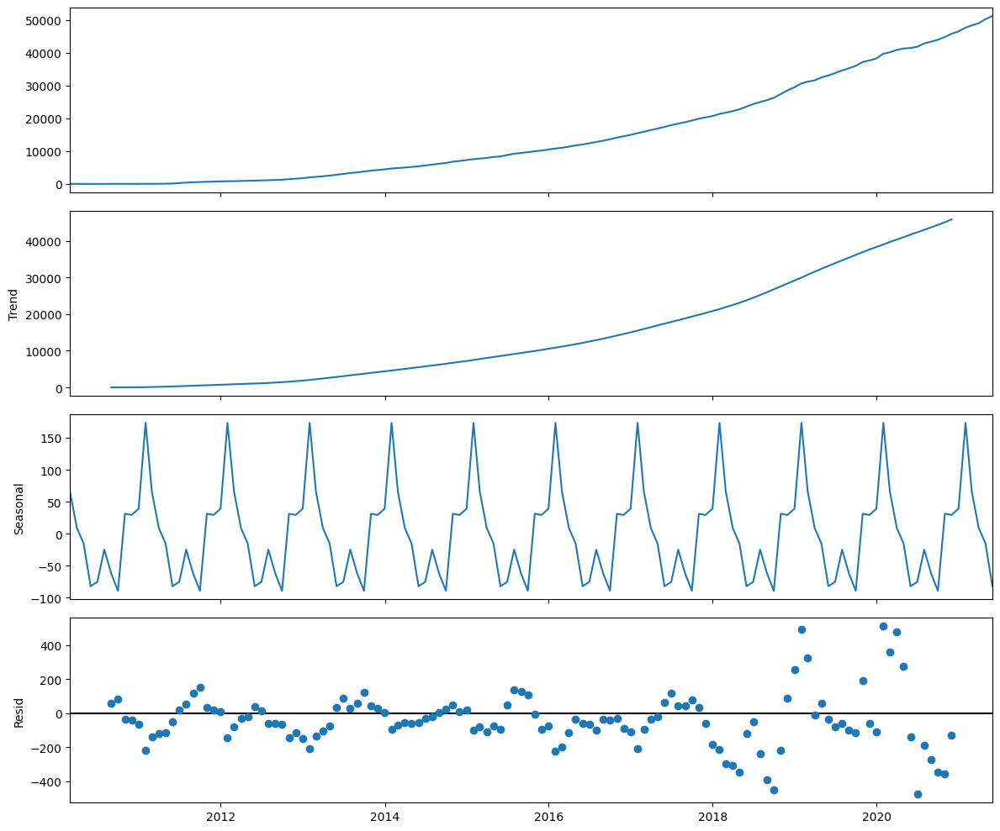

In [82]:
import statsmodels.tsa.api as tsa

plt.rcParams['figure.figsize']=(12,10)
decomp = tsa.seasonal_decompose(county_information['King']['df'])
decomp.plot();

Not surprisingly, the electric vehicle count for King County has an upward trend. Additionally, we can see that there is seasonality to the data as well. We can now move onto creating the training and testing sets for validation.

### train_test_split

After multiple iterations, we found that the 0.80-0.20 split of the data belonging to King County resulted in the best performance.

In [66]:
#splitting dataset into train and test sets for validation
train_king, test_king = train_test_split_ts(county_information['King']['df'], 
                                            0.80, 0.20)

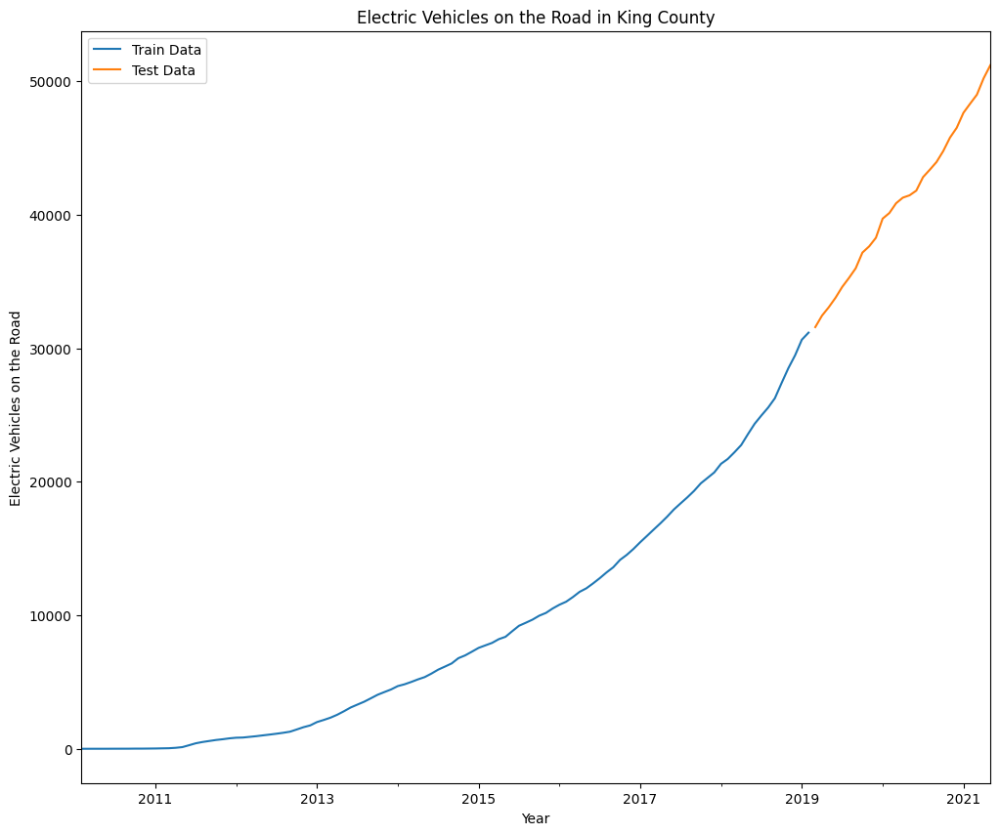

In [67]:
#plotting the split
plot_train_test_split(train_king, test_king, 'King')

### Finding Best Parameters with Auto-Arima

To have a model that can accurately predict future values, we need to optimize the p,d,q values of the models for each county and validate. In order to achieve this programmatically, we will be using the pmdarima library.

In [68]:
!pip install pmdarima

     -------------------------------------- 572.5/572.5 kB 9.1 MB/s eta 0:00:00
  Using cached Cython-0.29.35-py2.py3-none-any.whl (988 kB)


In [69]:
import pmdarima as pm

In [70]:
auto_model = pm.auto_arima(train_king, start_p=0, d=1, start_q=0, max_p=4, 
                           max_d=3, max_q=4, start_P=0, start_Q=0, max_P=3, 
                           max_D=3, max_Q=3, m=12)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  109
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -570.311
Date:                            Sun, 02 Jul 2023   AIC                           1146.622
Time:                                    09:06:17   BIC                           1154.315
Sample:                                02-28-2010   HQIC                          1149.732
                                     - 02-28-2019                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     26.5075     13.389      1.980      0.048       0.265      52.750
ar.L1          0.7305      0.051     14.288      0.000       0.630       0.831
sigma2      8406.5835    814.662     10.319      0.000    6809.875       1e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                61.47
Prob(Q):                              0.97   Prob(JB):                         0.00
Heteroskedasticity (H):               7.72   Skew:                             0.98
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.40
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

The best parameters (based on the AIC score) were (1,1,0) for the ARIMA order and (0,1,0,12) for the seasonal component. We can go ahead and plug these into a SARIMAX model to have our final model and then we can validate it by looking at the forecasts and the test set.

### Validate Model with Forecasts for Test Data

In [71]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  109
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -567.043
Date:                            Sun, 02 Jul 2023   AIC                           1138.087
Time:                                    09:06:17   BIC                           1143.195
Sample:                                02-28-2010   HQIC                          1140.151
                                     - 02-28-2019                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8305      0.042     20.002      0.000       0.749       0.912
sigma2      8954.2159    822.909     10.881      0.000    7341.344    1.06e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.66   Jarque-Bera (JB):                42.89
Prob(Q):                              0.42   Prob(JB):                         0.00
Heteroskedasticity (H):               7.52   Skew:                             0.70
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.98
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

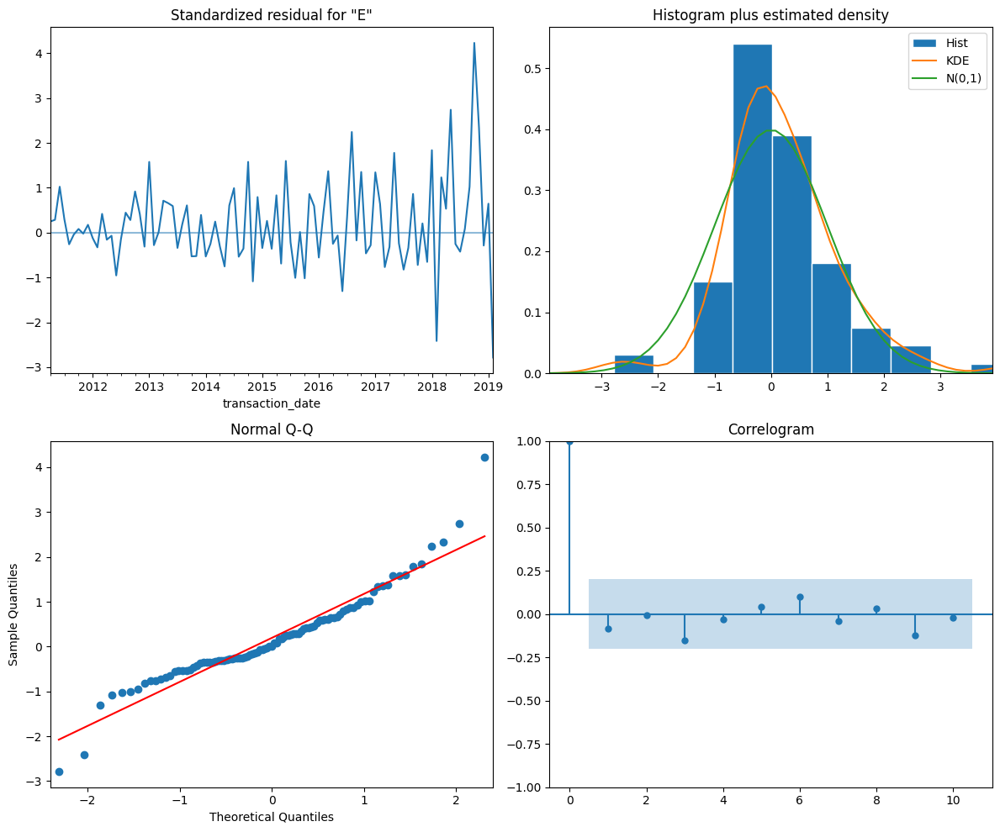

In [72]:
model = SARIMAX(train_king, order=(1,1,0), 
                seasonal_order=(0,1,0,12), enforce_invertibility=False, 
                enforce_stationarity=False).fit()
evaluate_model(model)

Here, looking at the residual information, we can see that they are very close to having a normal distribution. Additionally, there is no longer an obvious seasonality based on the correlogram and the standardized residuals. The coefficient p-values also suggest that they are statistically significant. These results suggest that the model is satisfactory to move onto validation.

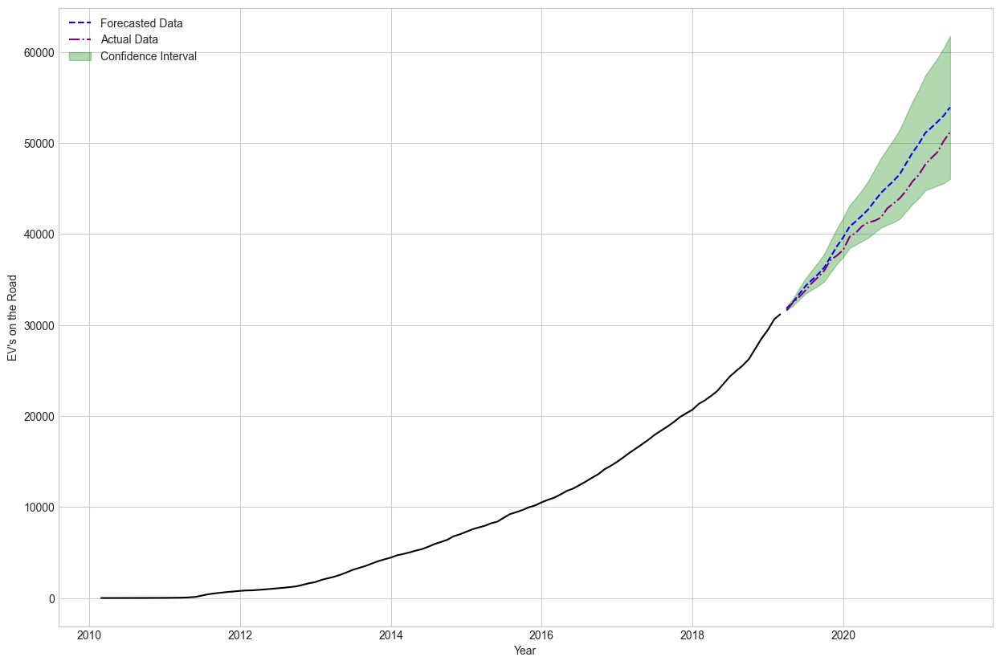

In [73]:
df_king_forecast = get_forecast(model, train_king, test_king, plot=True)

Above, we can see that the model is able to accurately forecast data into the future. The actual observed data is well within the confidence interval of our model's forecasts.

### Future Predictions

#### Fitting Model to All Observed Data

Now that we know that our model can accurately make predictions about the future electric vehicle counts in each county, we can use the same parameters to build a model on the whole observed dataset without splitting it into train/test sets.

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  136
Model:             SARIMAX(1, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -818.139
Date:                            Sun, 02 Jul 2023   AIC                           1640.277
Time:                                    09:06:19   BIC                           1645.885
Sample:                                02-28-2010   HQIC                          1642.555
                                     - 05-31-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4919      0.062      7.989      0.000       0.371       0.613
sigma2      3.911e+04   2910.227     13.440      0.000    3.34e+04    4.48e+04
===================================================================================
Ljung-Box (L1) (Q):                   1.72   Jarque-Bera (JB):               108.03
Prob(Q):                              0.19   Prob(JB):                         0.00
Heteroskedasticity (H):              26.48   Skew:                             0.40
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.54
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

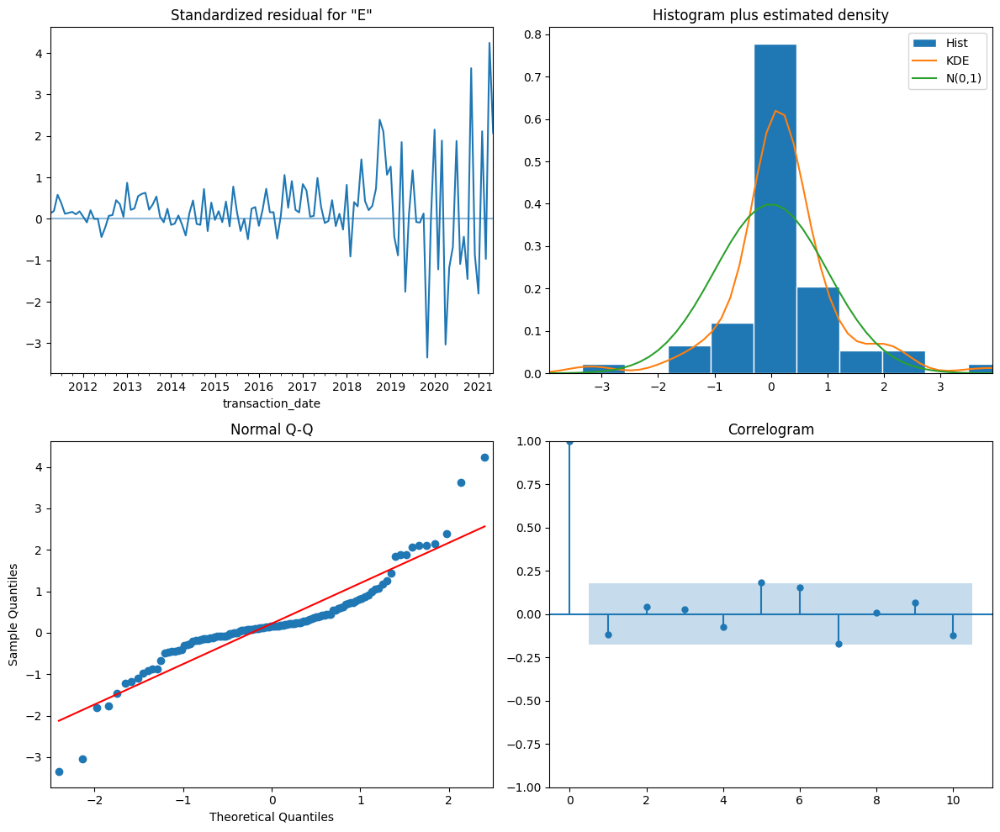

In [74]:
# Future Predictions
# Fitting Model to All Observed Data
model = SARIMAX(county_information['King']['df'], order=(1,1,0), 
                seasonal_order=(0,1,0,12), enforce_invertibility=False, 
                enforce_stationarity=False).fit()
evaluate_model(model)

Above we can see that the residuals for this model are less normally distributed compared to the test model. However, they are still fairly close to having a normal distribution. Additionally, there is no longer an obvious seasonality based on the correlogram and the standardized residuals. The coefficient p-values also suggest that they are statistically significant.

#### Plotting & Saving Predictions

Using our model, we can predict the future counts of electric vehicles in King County and plot them. 

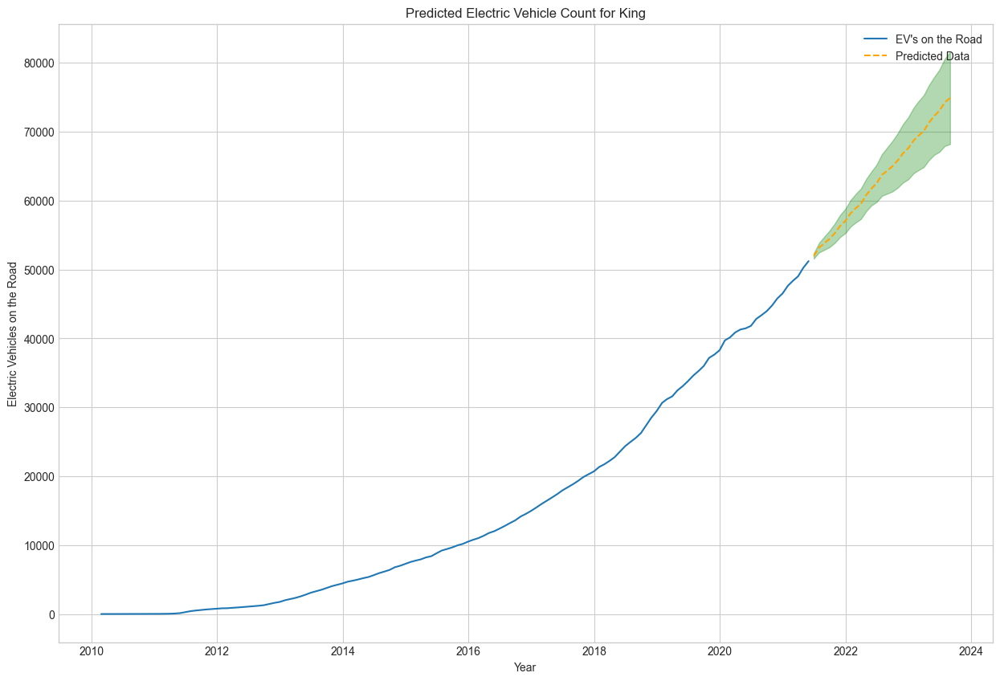

In [75]:
#creating a df of predictions and plotting
df_king_preds = get_prediction(model, county_information['King']['df'], 
                               test_king, 'King', plot=True)

The model is predicting that the amount of electric vehicles in King County are going to keep increasing almost linearly based on the mean values. If we look at the upper confidence interval though, we can see that the increase could keep an exponential pattern.

In [76]:
#saving predictions df to dict for later use
county_information['King']['Predictions'] = df_king_preds

## Snohomish County

### Seasonality Check

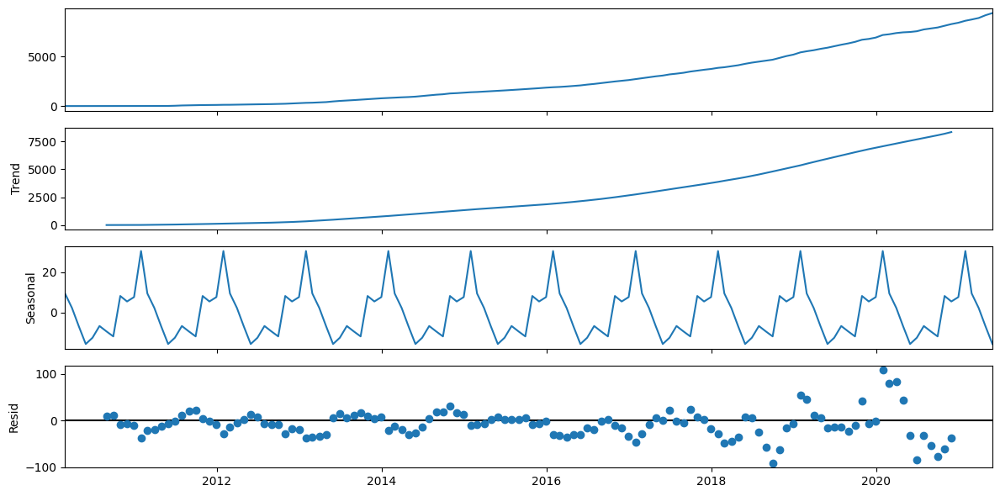

In [77]:
plt.rcParams['figure.figsize']=(12,6)
decomp = tsa.seasonal_decompose(county_information['Snohomish']['df'])
decomp.plot();

Above we can see that there is a clear trend upwards in electric vehicle counts in Snohomish county. Additionally, we can see that there is a relatively small seasonality to it.

### train_test_split

After multiple iterations, we found that the 0.75-0.25 split of the data belonging to Snohomish County resulted in the best performance.

In [78]:
#splitting dataset into train and test sets for validation
train_sno, test_sno = train_test_split_ts(county_information['Snohomish']['df'],
                                          0.75, 0.25)

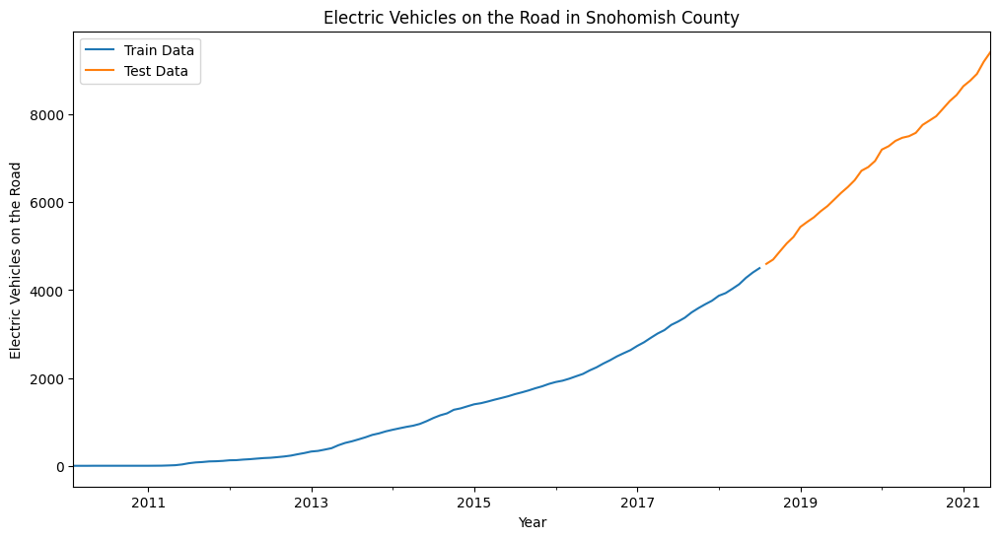

In [79]:
#plotting train and test sets
plot_train_test_split(train_sno, test_sno, 'Snohomish')

### Finding Best Parameters with Auto-Arima

In [80]:
#finding best parameters
auto_model = pm.auto_arima(train_sno, start_p=0, start_q=0, d=1, max_p=4, 
                           max_q=4, max_P=3, max_Q=3, start_P=0, start_Q=0, 
                           m=12, verbose=2)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  102
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 12)   Log Likelihood                -408.630
Date:                            Sun, 02 Jul 2023   AIC                            827.260
Time:                                    09:07:31   BIC                            840.336
Sample:                                02-28-2010   HQIC                           832.553
                                     - 07-31-2018                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9945      0.008    119.137      0.000       0.978       1.011
ma.L1         -0.6253      0.099     -6.310      0.000      -0.820      -0.431
ar.S.L12       0.8995      0.205      4.396      0.000       0.498       1.300
ma.S.L12      -0.7499      0.292     -2.571      0.010      -1.321      -0.178
sigma2       178.2387     26.275      6.784      0.000     126.741     229.737
===================================================================================
Ljung-Box (L1) (Q):                   0.40   Jarque-Bera (JB):                19.59
Prob(Q):                              0.53   Prob(JB):                         0.00
Heteroskedasticity (H):               7.73   Skew:                             0.61
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.78
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

The best parameters (based on the AIC score) were (1,1,1) for the ARIMA order and (1,0,1,12) for the seasonal component. We can go ahead and plug these into a SARIMAX model to have our final model and then we can validate it by looking at the forecasts and the test set.

### Validate Model with Forecasts for Test Data

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  102
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 12)   Log Likelihood                -356.437
Date:                            Sun, 02 Jul 2023   AIC                            722.874
Time:                                    09:07:31   BIC                            735.203
Sample:                                02-28-2010   HQIC                           727.839
                                     - 07-31-2018                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0092      0.011     93.361      0.000       0.988       1.030
ma.L1         -0.6876      0.111     -6.190      0.000      -0.905      -0.470
ar.S.L12       0.8889      0.159      5.585      0.000       0.577       1.201
ma.S.L12      -0.7052      0.291     -2.423      0.015      -1.276      -0.135
sigma2       193.1000     45.868      4.210      0.000     103.200     283.000
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 6.99
Prob(Q):                              0.90   Prob(JB):                         0.03
Heteroskedasticity (H):               3.33   Skew:                             0.47
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

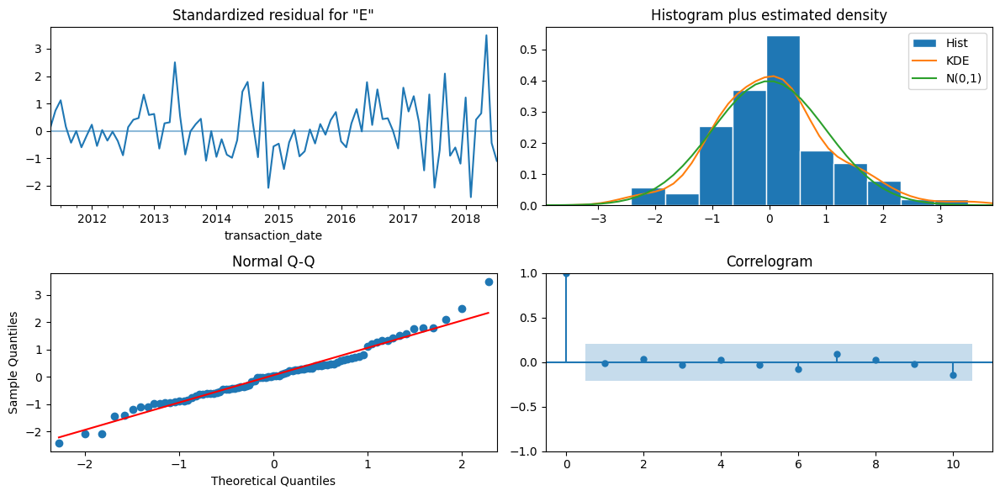

In [81]:
#fitting SARIMAX model with best params
model = SARIMAX(train_sno, order=(1,1,1), seasonal_order=(1,0,1,12), 
                enforce_invertibility=False, enforce_stationarity=False).fit()
evaluate_model(model)

Above, we can see that the residuals are almost perfectly normally distributed. This indicates that the parameters we chose worked in removing the trend and the seasonality of the data. Next, we can move onto visually validating the model.

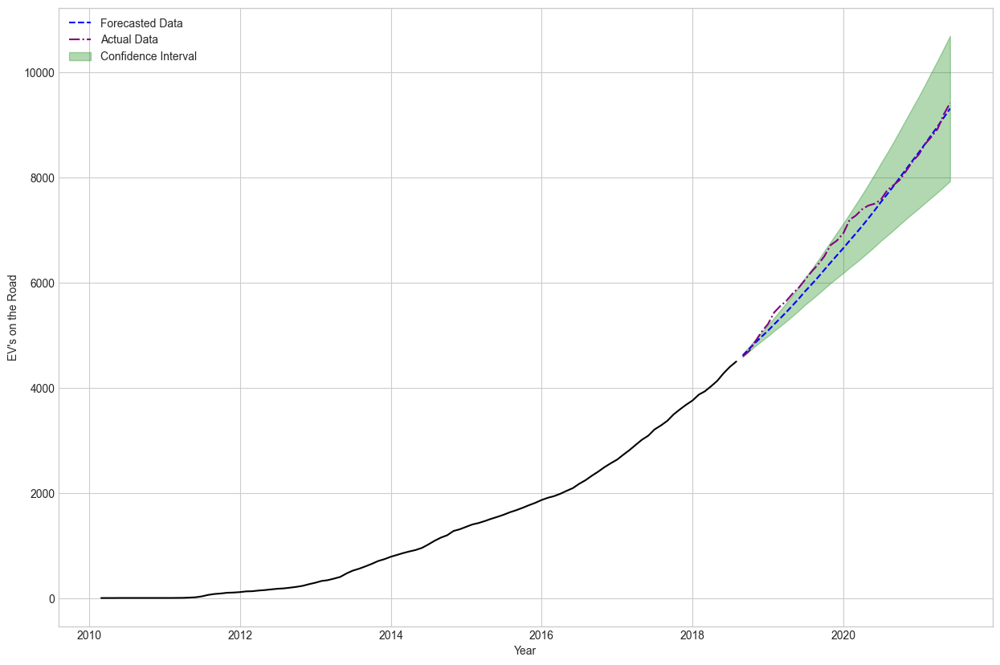

In [82]:
df_sno_forecast = get_forecast(model, train_sno, test_sno, plot=True)

The model's forecasts initially are very close to the actual observations. Even though they diverge between mid-2018 to mid-2020, the actual data stays within the confidence interval and converges back to the forecasted values almost perfectly.  

### Future Predictions

Once again, we can use the same parameters found above for the entire observed data to make predictions on future values.

#### Fitting Model to All Observed Data

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  136
Model:             SARIMAX(1, 1, 1)x(1, 0, 1, 12)   Log Likelihood                -588.502
Date:                            Sun, 02 Jul 2023   AIC                           1187.003
Time:                                    09:07:33   BIC                           1200.982
Sample:                                02-28-2010   HQIC                          1192.681
                                     - 05-31-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0134      0.012     82.920      0.000       0.989       1.037
ma.L1         -0.6489      0.056    -11.528      0.000      -0.759      -0.539
ar.S.L12       0.6429      0.362      1.777      0.076      -0.066       1.352
ma.S.L12      -0.3485      0.375     -0.930      0.352      -1.083       0.386
sigma2       971.7472     78.312     12.409      0.000     818.259    1125.236
===================================================================================
Ljung-Box (L1) (Q):                   0.28   Jarque-Bera (JB):               126.91
Prob(Q):                              0.60   Prob(JB):                         0.00
Heteroskedasticity (H):              19.64   Skew:                             0.64
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.85
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

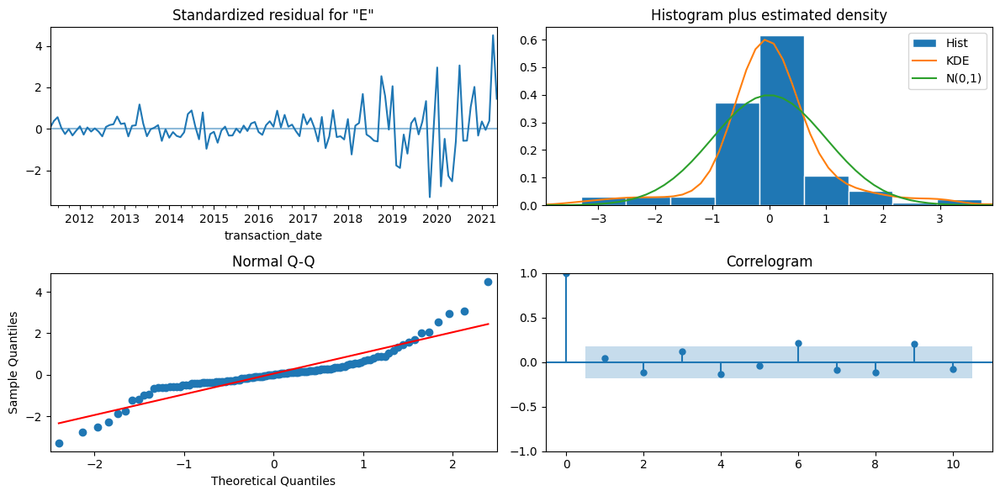

In [83]:
model = SARIMAX(county_information['Snohomish']['df'], order=(1,1,1), 
                seasonal_order=(1,0,1,12), enforce_invertibility=False, 
                enforce_stationarity=False).fit()
evaluate_model(model)

We can see that the residuals are once again fairly close to being normally distributed. We can accept this as the best model and move onto making and plotting predictions.

#### Plotting & Saving Predictions

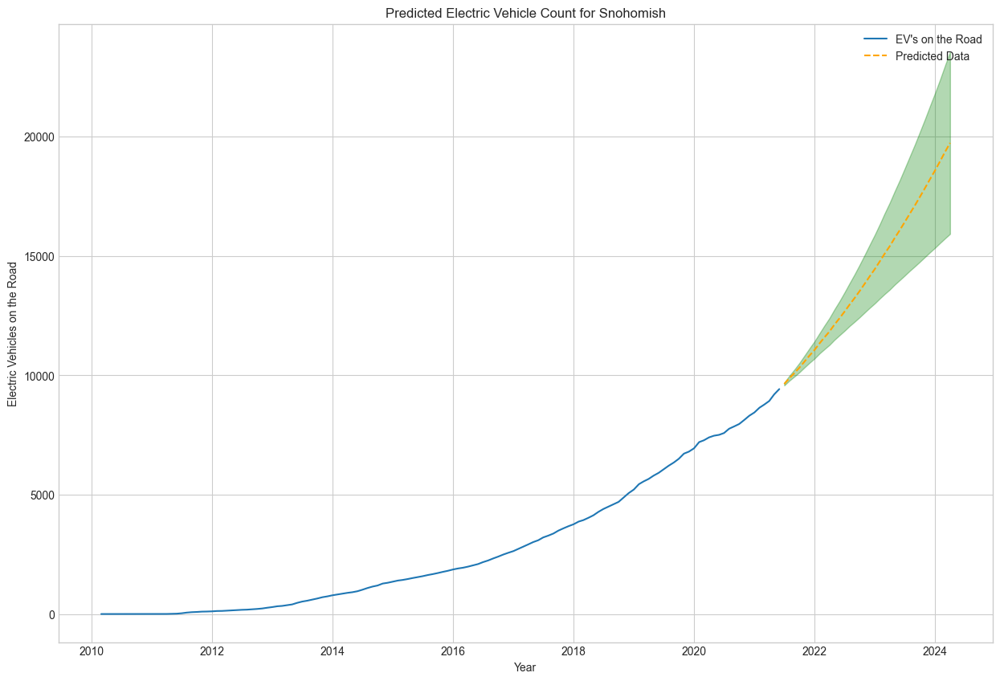

In [84]:
#getting and plotting predictions
df_sno_preds = get_prediction(model, county_information['Snohomish']['df'], 
                               test_sno, 'Snohomish', plot=True)

The model is predicting that the amount of electric vehicles in Snohomish county are going to keep rising in an exponential pattern.

In [85]:
#saving predictions
county_information['Snohomish']['Predictions'] = df_sno_preds

## Pierce County

### Seasonality Check

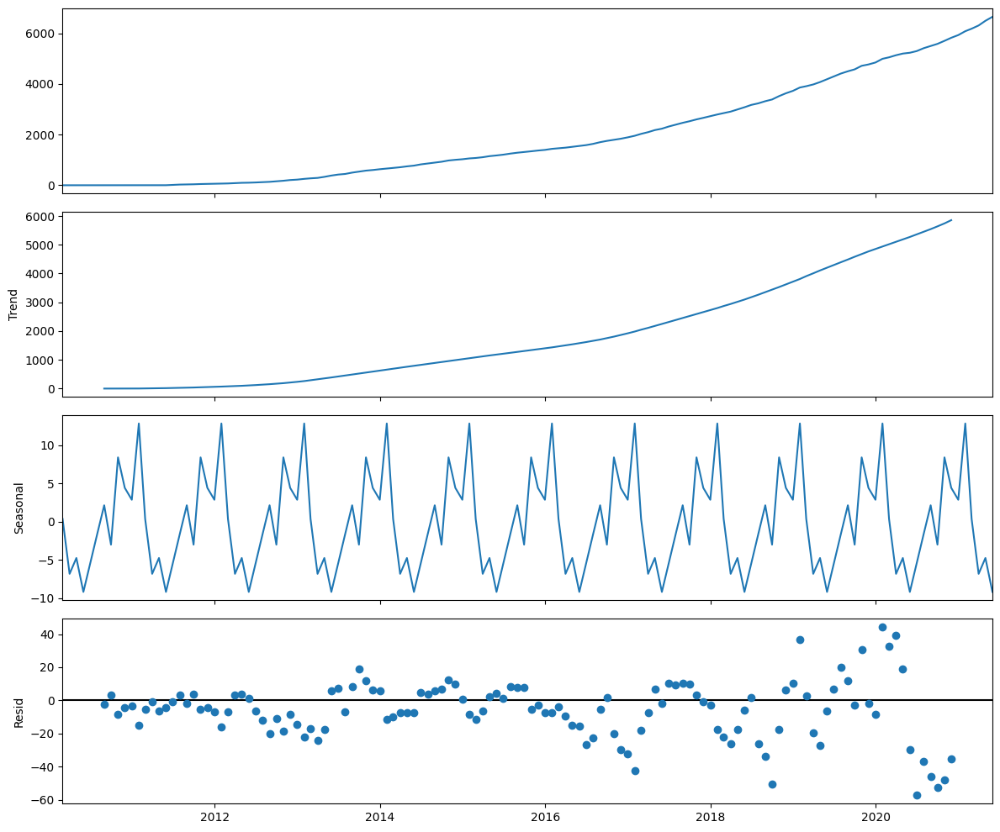

In [86]:
plt.rcParams['figure.figsize']=(12,10)
decomp = tsa.seasonal_decompose(county_information['Pierce']['df'])
decomp.plot();

We can see here that there is a clear upwards trend in the amount of electric vehicles in Pierce County. Additionally, there seems to be a relatively small seasonal component to the data as well.

### train_test_split

After multiple iterations, we found that the 0.75-0.25 split of the data belonging to Pierce County resulted in the best performance.

In [87]:
#splitting dataset into train and test sets for validation
train_pierce, test_pierce = train_test_split_ts(county_information['Pierce']['df'], 
                                            0.75, 0.25)

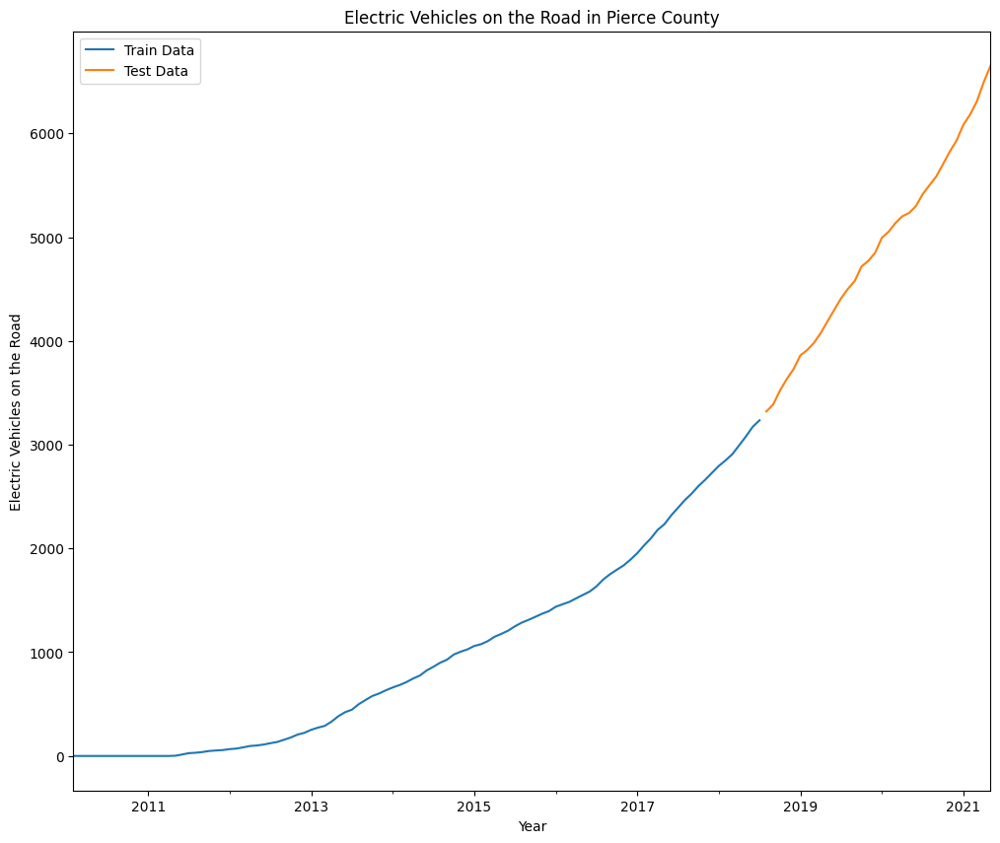

In [88]:
#plotting train and test sets
plot_train_test_split(train_pierce, test_pierce, 'Pierce')

### Finding Best Parameters with Auto-Arima

In [89]:
auto_model = pm.auto_arima(train_pierce, start_p=0, start_q=0, d=1, max_p=4, 
                           max_q=4, max_P=3, max_Q=3, start_P=0, start_Q=0, 
                           m=12, verbose=2)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  102
Model:             SARIMAX(4, 1, 1)x(1, 0, 1, 12)   Log Likelihood                -370.851
Date:                            Sun, 02 Jul 2023   AIC                            757.702
Time:                                    09:08:22   BIC                            778.623
Sample:                                02-28-2010   HQIC                           766.172
                                     - 07-31-2018                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0045      0.257     -0.018      0.986      -0.508       0.499
ar.L2          0.4164      0.166      2.510      0.012       0.091       0.742
ar.L3          0.1792      0.116      1.541      0.123      -0.049       0.407
ar.L4          0.3758      0.090      4.183      0.000       0.200       0.552
ma.L1          0.5275      0.263      2.008      0.045       0.013       1.042
ar.S.L12       0.9433      0.226      4.165      0.000       0.499       1.387
ma.S.L12      -0.8278      0.383     -2.161      0.031      -1.579      -0.077
sigma2        83.7709     12.528      6.687      0.000      59.217     108.325
===================================================================================
Ljung-Box (L1) (Q):                   0.13   Jarque-Bera (JB):                 2.82
Prob(Q):                              0.71   Prob(JB):                         0.24
Heteroskedasticity (H):               7.29   Skew:                             0.34
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.44
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

The best parameters (based on the AIC score) were (4,1,1) for the ARIMA order and (1,0,1,12) for the seasonal component. We can go ahead and plug these into a SARIMAX model to have our final model and then we can validate it by looking at the forecasts and the test set.

### Validate Model with Forecasts for Test Data

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  102
Model:             SARIMAX(4, 1, 1)x(1, 0, 1, 12)   Log Likelihood                -317.231
Date:                            Sun, 02 Jul 2023   AIC                            650.461
Time:                                    09:08:22   BIC                            670.002
Sample:                                02-28-2010   HQIC                           658.321
                                     - 07-31-2018                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0542      0.259      0.210      0.834      -0.453       0.561
ar.L2          0.3434      0.178      1.934      0.053      -0.005       0.692
ar.L3          0.1405      0.117      1.202      0.230      -0.089       0.370
ar.L4          0.4383      0.101      4.334      0.000       0.240       0.637
ma.L1          0.4723      0.281      1.678      0.093      -0.079       1.024
ar.S.L12       0.9835      0.089     11.016      0.000       0.809       1.159
ma.S.L12      -1.0000   1383.866     -0.001      0.999   -2713.328    2711.328
sigma2        75.8312   1.05e+05      0.001      0.999   -2.06e+05    2.06e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.05   Jarque-Bera (JB):                 2.57
Prob(Q):                              0.83   Prob(JB):                         0.28
Heteroskedasticity (H):               2.05   Skew:                             0.40
Prob(H) (two-sided):                  0.06   Kurtosis:                         3.30
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

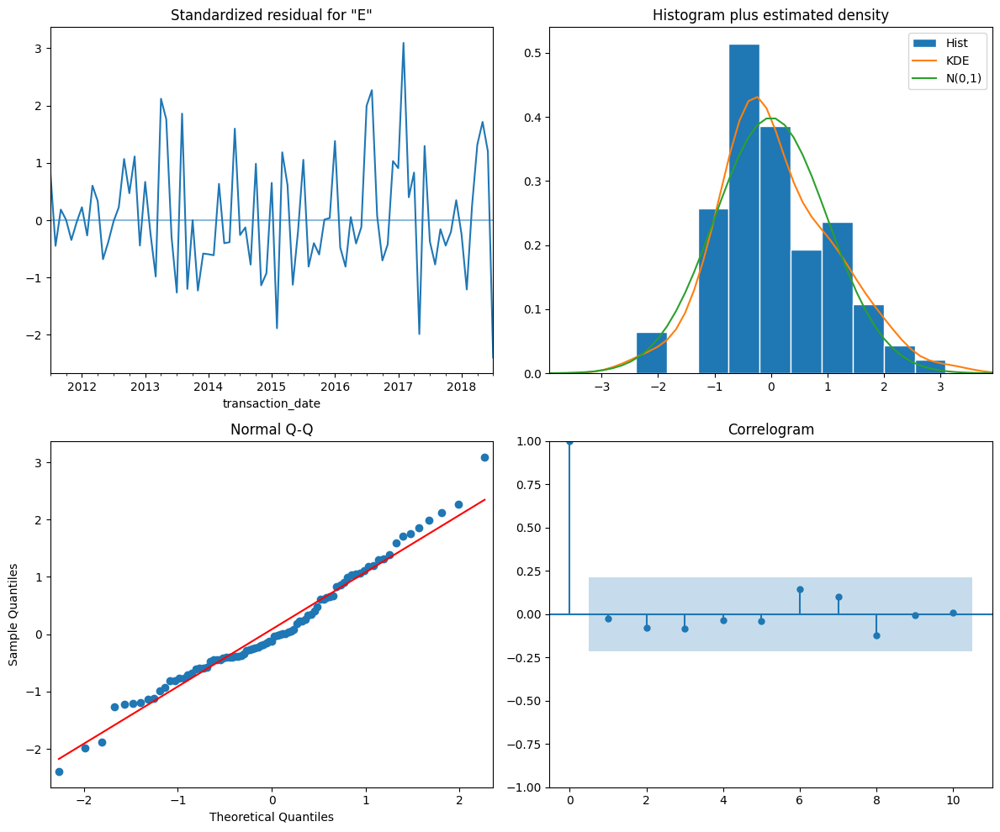

In [90]:
#fitting SARIMAX model with best params
model = SARIMAX(train_pierce, order=(4,1,1), seasonal_order=(1,0,1,12), 
                enforce_invertibility=False, enforce_stationarity=False).fit()
evaluate_model(model)

Above, we can see that the residuals are almost perfectly normally distributed. This indicates that the parameters chosen above were successful in removing the seasonality and the trend. Additionally, even though some of the coefficients have values higher than 0.05 (our chosen alpha value), based on the AIC score these parameters resulted in the best model. So we will be moving on with this model.

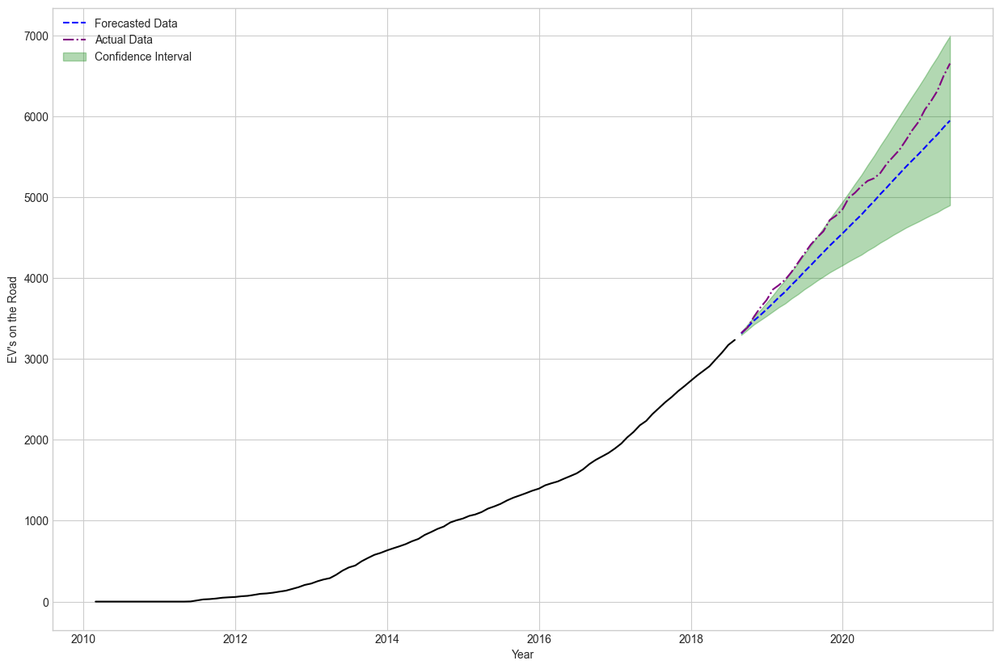

In [91]:
df_pierce_forecast = get_forecast(model, train_pierce, test_pierce, plot=True)

Here, we can see that the forecasted data stays lower than the actual observed data. However, the observed data is still within our confidence interval. Therefore, we can move onto fitting the model to all observed data.

### Future Predictions

#### Fitting Model to All Observed Data

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  136
Model:             SARIMAX(4, 1, 1)x(1, 0, 1, 12)   Log Likelihood                -517.126
Date:                            Sun, 02 Jul 2023   AIC                           1050.252
Time:                                    09:08:25   BIC                           1072.485
Sample:                                02-28-2010   HQIC                          1059.280
                                     - 05-31-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9634      0.857      1.124      0.261      -0.716       2.643
ar.L2         -0.0983      0.370     -0.265      0.791      -0.824       0.628
ar.L3         -0.0071      0.190     -0.037      0.970      -0.379       0.364
ar.L4          0.0100      0.120      0.083      0.934      -0.226       0.245
ma.L1         -0.5199      0.865     -0.601      0.548      -2.216       1.176
ar.S.L12       1.2257      0.024     51.631      0.000       1.179       1.272
ma.S.L12      -1.0000    514.241     -0.002      0.998   -1008.893    1006.893
sigma2       274.9621   1.41e+05      0.002      0.998   -2.77e+05    2.77e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                31.66
Prob(Q):                              0.90   Prob(JB):                         0.00
Heteroskedasticity (H):               8.42   Skew:                            -0.21
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.49
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

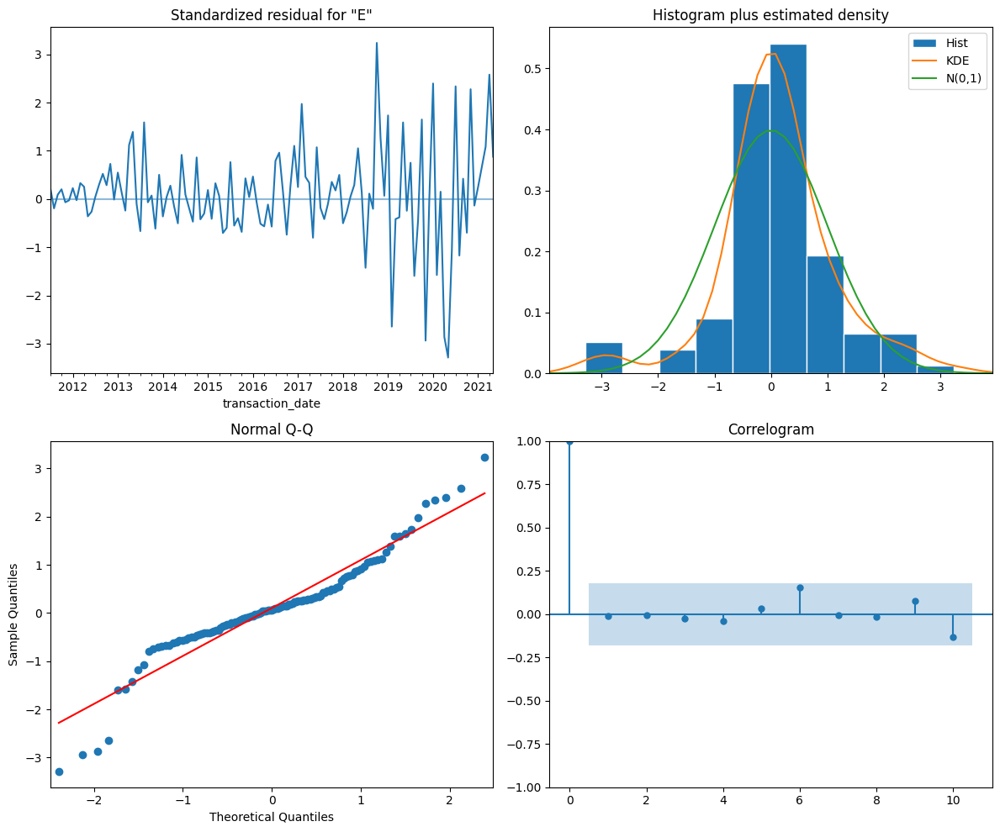

In [92]:
model = SARIMAX(county_information['Pierce']['df'], order=(4,1,1), 
                seasonal_order=(1,0,1,12), enforce_invertibility=False, 
                enforce_stationarity=False).fit()
evaluate_model(model)

Once again, looking at the residuals, we can see that they have a fairly normal distribution. Even though some of the p-values are once again higher than the 0.05 threshold, the parameters seem to generate a model that can accurately predict the future values.

#### Plotting & Saving Predictions

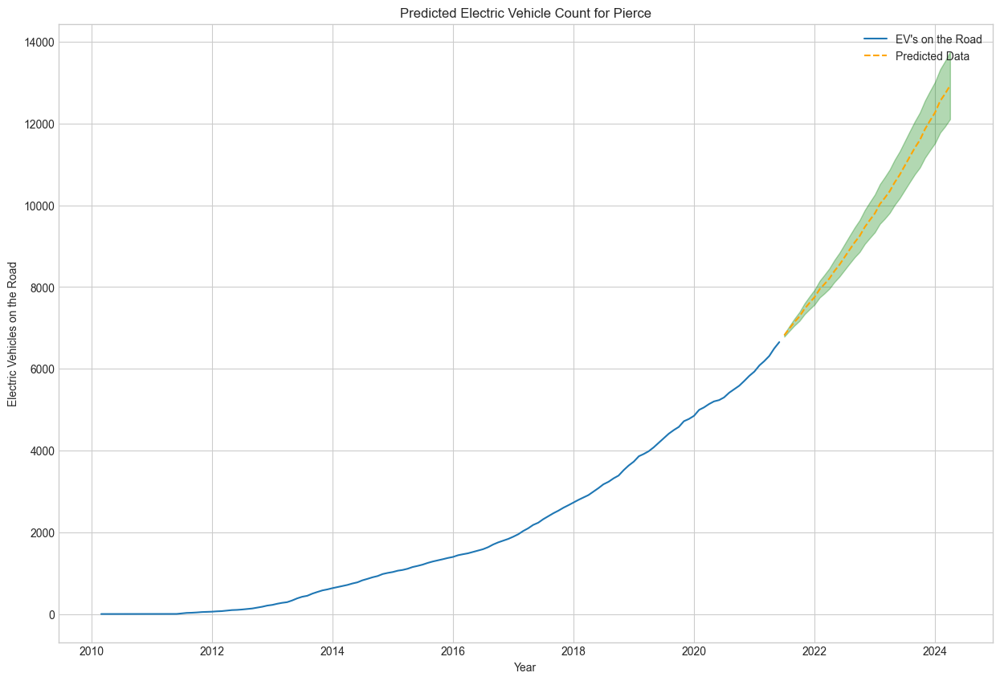

In [93]:
#getting and plotting predictions
df_pierce_preds = get_prediction(model, county_information['Pierce']['df'], 
                               test_pierce, 'Pierce', plot=True)

Our model is predicting that the growth in electric vehicles in Pierce County will keep an exponential growth pattern for the next few years.

In [94]:
#saving predictions
county_information['Pierce']['Predictions'] = df_pierce_preds

## Clark County

### Seasonality Check

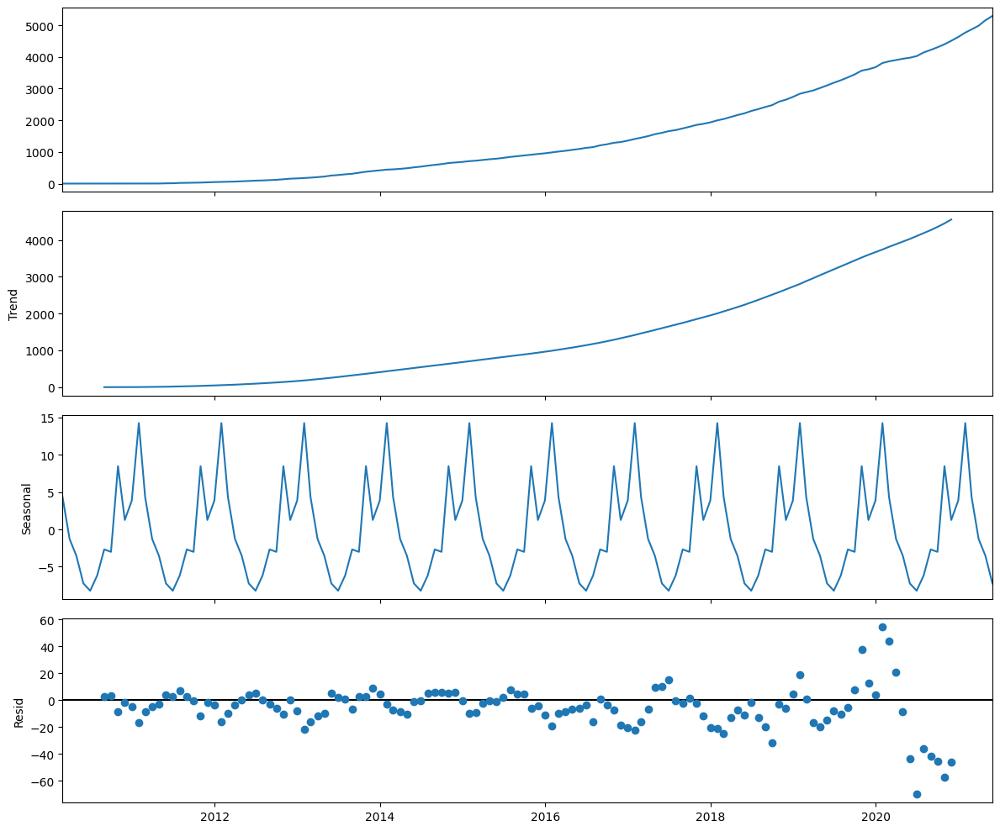

In [95]:
plt.rcParams['figure.figsize']=(12,10)
decomp = tsa.seasonal_decompose(county_information['Clark']['df'])
decomp.plot();

As is the case with the previous counties, the decomposition for Clark County's data also suggests that there is an upwards trend and a seasonal component.

### train_test_split

After multiple iterations, we found that the 0.75-0.25 split of the data belonging to Clark County resulted in the best performance.

In [96]:
#split data into train/test sets for validation
train_clark, test_clark = train_test_split_ts(county_information['Clark']['df'], 
                                            0.75, 0.25)

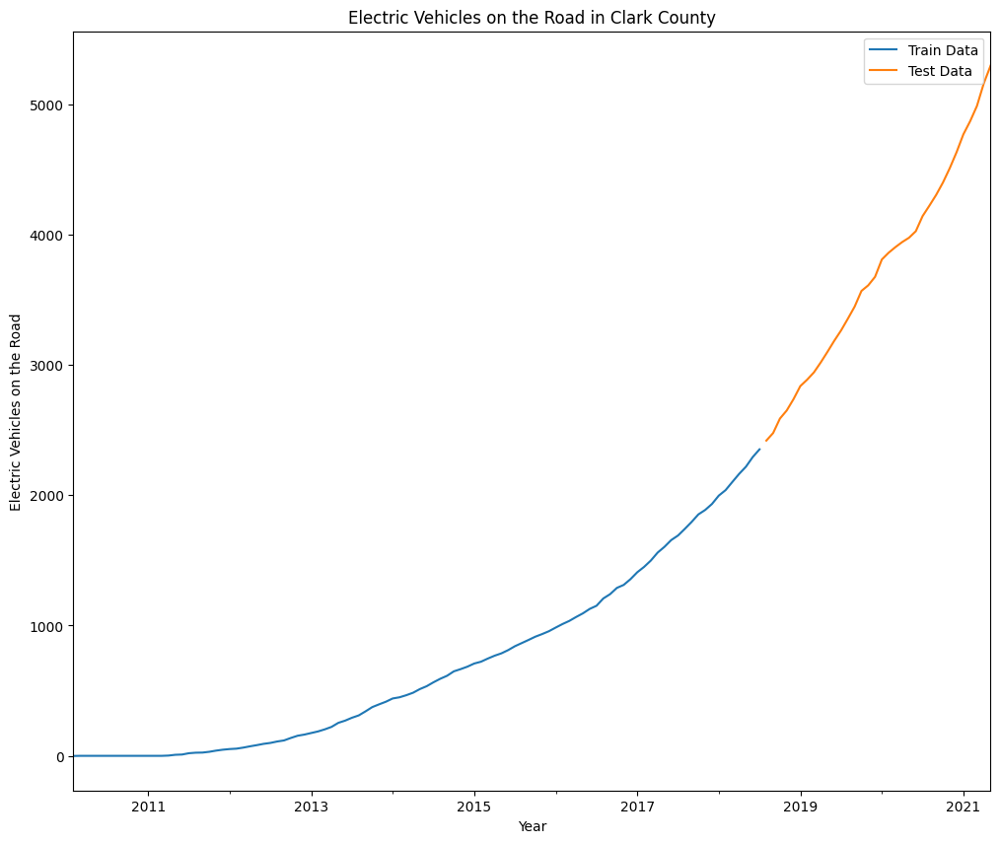

In [97]:
#plot the split
plot_train_test_split(train_clark, test_clark, 'Clark')

### Finding Best Parameters with Auto-Arima

In [98]:
auto_model = pm.auto_arima(train_clark, start_p=0, start_q=0, d=1, max_p=4, 
                           max_q=4, max_P=3, max_Q=3, start_P=0, start_Q=0, 
                           m=12, verbose=2)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  102
Model:             SARIMAX(1, 1, 2)x(1, 0, [], 12)   Log Likelihood                -336.598
Date:                             Sun, 02 Jul 2023   AIC                            683.196
Time:                                     09:09:05   BIC                            696.271
Sample:                                 02-28-2010   HQIC                           688.489
                                      - 07-31-2018                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9961      0.007    134.295      0.000       0.982       1.011
ma.L1         -0.8475      0.106     -8.005      0.000      -1.055      -0.640
ma.L2          0.2119      0.107      1.981      0.048       0.002       0.422
ar.S.L12       0.4497      0.103      4.384      0.000       0.249       0.651
sigma2        42.6803      4.978      8.573      0.000      32.923      52.437
===================================================================================
Ljung-Box (L1) (Q):                   0.14   Jarque-Bera (JB):                18.47
Prob(Q):                              0.70   Prob(JB):                         0.00
Heteroskedasticity (H):               8.08   Skew:                             0.51
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.84
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

The best parameters (based on the AIC score) were (1,1,2) for the ARIMA order and (1,0,[],12) for the seasonal component. We can go ahead and plug these into a SARIMAX model to have our final model and then we can validate it by looking at the forecasts and the test set.

### Validate Model with Forecasts for Test Data

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                    EV's on the Road   No. Observations:                  102
Model:             SARIMAX(1, 1, 2)x(1, 0, [], 12)   Log Likelihood                -294.661
Date:                             Sun, 02 Jul 2023   AIC                            599.321
Time:                                     09:09:06   BIC                            611.708
Sample:                                 02-28-2010   HQIC                           604.311
                                      - 07-31-2018                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0196      0.010    103.565      0.000       1.000       1.039
ma.L1         -0.8935      0.113     -7.916      0.000      -1.115      -0.672
ma.L2          0.1874      0.119      1.579      0.114      -0.045       0.420
ar.S.L12       0.4655      0.108      4.322      0.000       0.254       0.677
sigma2        46.9304      5.954      7.882      0.000      35.260      58.600
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 7.16
Prob(Q):                              0.88   Prob(JB):                         0.03
Heteroskedasticity (H):               4.34   Skew:                             0.26
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.29
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

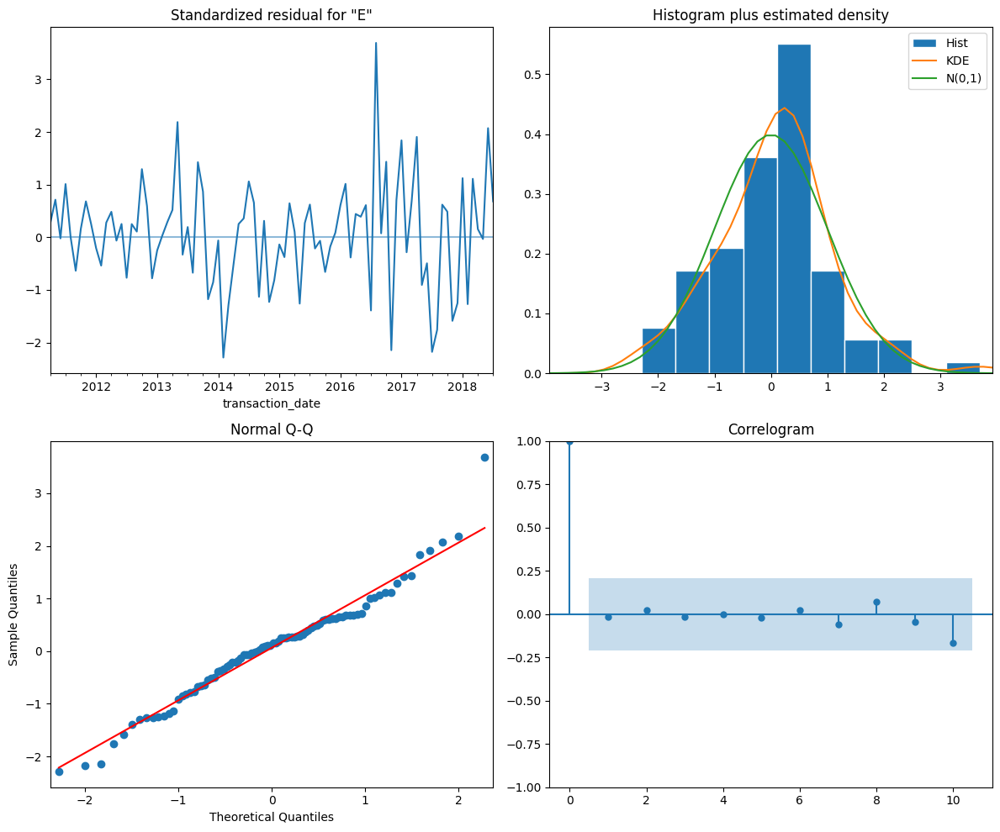

In [99]:
model = SARIMAX(train_clark, order=(1,1,2), seasonal_order=(1,0,[],12), 
                enforce_invertibility=False, enforce_stationarity=False).fit()
evaluate_model(model)

The residuals are nearly normally distributed and based on the correlogram, the model was able to remove seasonality successfully.

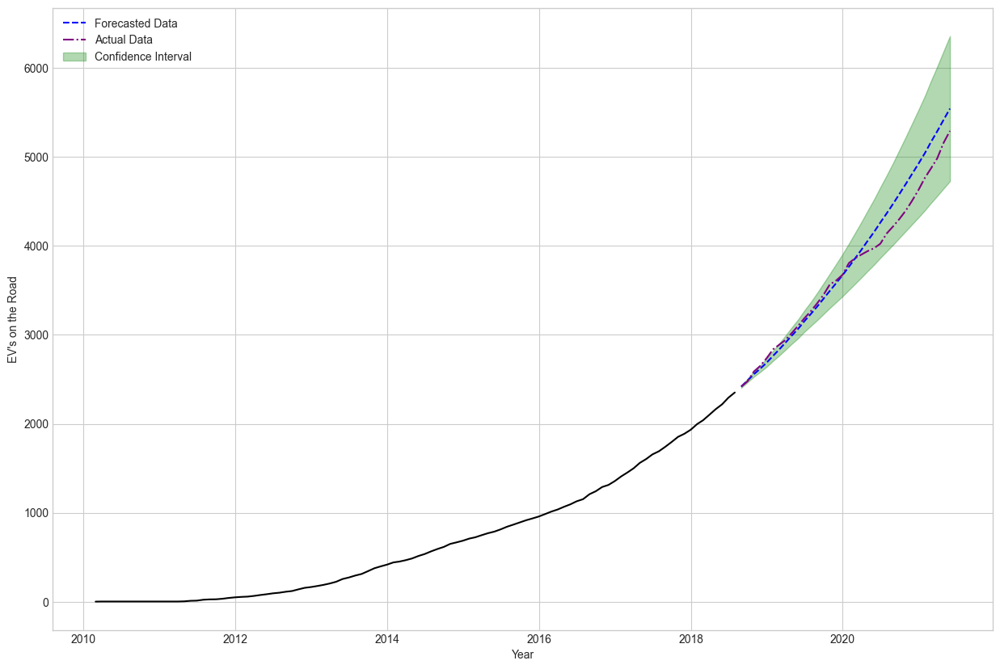

In [100]:
df_clark_forecast = get_forecast(model, train_clark, test_clark, plot=True)

The model's forecast stays inline with the observed data from mid-2018 to early 2020. Around March of 2020, the observed data is lower than the forecasts. This may be due to the COVID-19 pandemic that affected much of the US at this date. Even though this is the case, the observed data stays well within the confidence interval. This indicates that our model is performing very well and that we can move onto fitting the model to all the observed data to make predictions on future values.

### Future Predictions

#### Fitting Model to All Observed Data

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                    EV's on the Road   No. Observations:                  136
Model:             SARIMAX(1, 1, 2)x(1, 0, [], 12)   Log Likelihood                -509.882
Date:                             Sun, 02 Jul 2023   AIC                           1029.763
Time:                                     09:09:08   BIC                           1043.783
Sample:                                 02-28-2010   HQIC                          1035.458
                                      - 05-31-2021                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0295      0.013     77.107      0.000       1.003       1.056
ma.L1         -0.5404      0.076     -7.116      0.000      -0.689      -0.392
ma.L2         -0.1134      0.067     -1.700      0.089      -0.244       0.017
ar.S.L12       0.3977      0.082      4.837      0.000       0.237       0.559
sigma2       248.7244     18.054     13.777      0.000     213.340     284.109
===================================================================================
Ljung-Box (L1) (Q):                   0.04   Jarque-Bera (JB):               142.76
Prob(Q):                              0.84   Prob(JB):                         0.00
Heteroskedasticity (H):              22.20   Skew:                             0.78
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.06
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

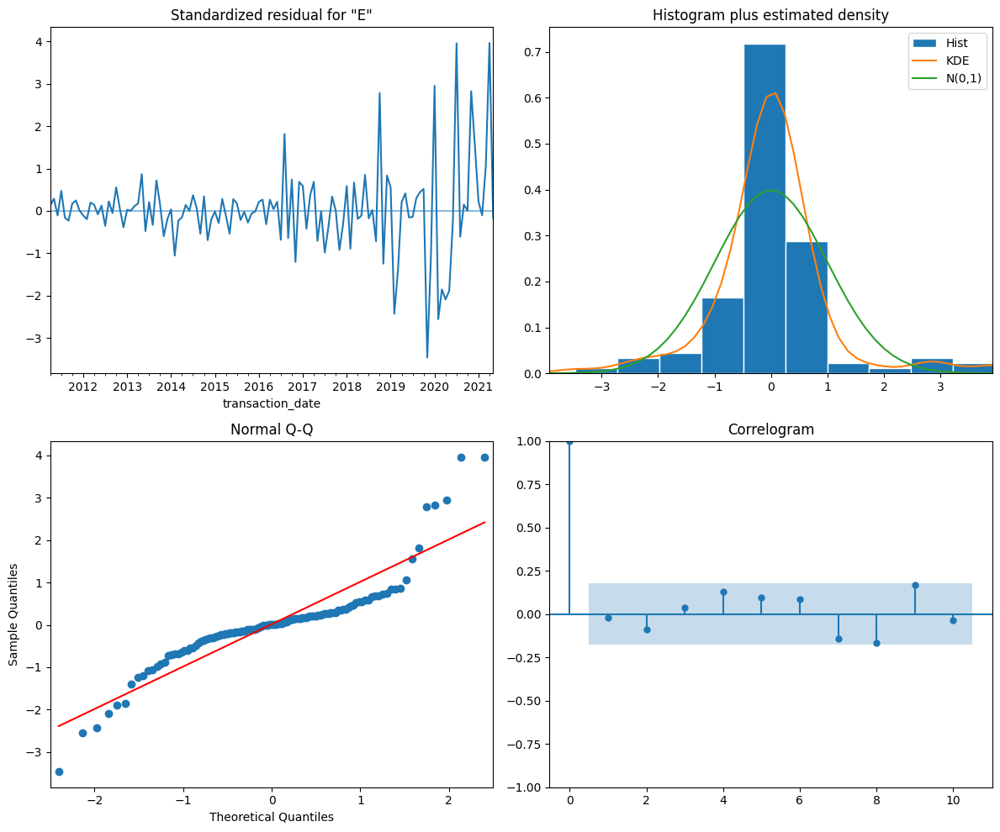

In [101]:
model = SARIMAX(county_information['Clark']['df'], order=(1,1,2), 
                seasonal_order=(1,0,[],12), enforce_invertibility=False, 
                enforce_stationarity=False).fit()
evaluate_model(model)

The residuals are once again fairly normally distributed except for the portion of early 2020 to today. As discussed above, this may be due to the COVID-19 pandemic and the shutdowns that affected almost all industries including the electric vehicle market. 

#### Plotting & Saving Predictions

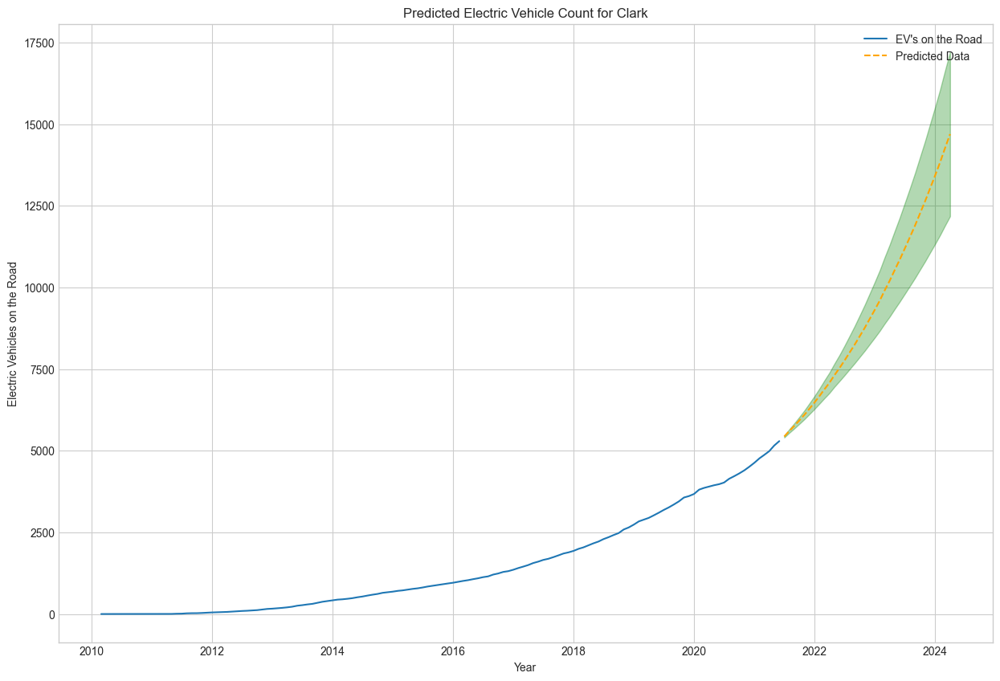

In [102]:
#getting/plotting predictions
df_clark_preds = get_prediction(model, county_information['Clark']['df'], 
                               test_clark, 'Clark', plot=True)

The model is predicting that the electric vehicle amount in Clark County will keep increasing exponentially in the coming years.

In [103]:
#saving predictions
county_information['Clark']['Predictions'] = df_clark_preds

## Thurston County

### Seasonality Check


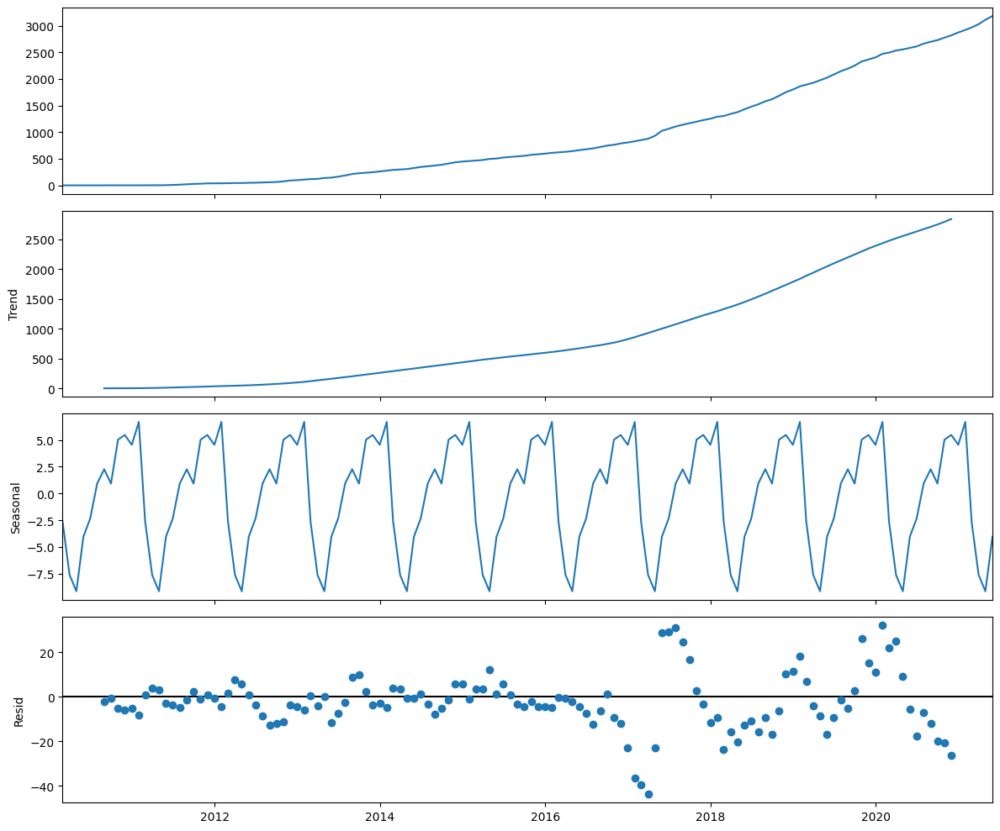

In [104]:
plt.rcParams['figure.figsize']=(12,10)
decomp = tsa.seasonal_decompose(county_information['Thurston']['df'])
decomp.plot();

Similar to the previous counties, Thurston County's electric vehicle count is also showing an upward trend along with a seasonality component.

### train_test_split

After multiple iterations, we found that the 0.80-0.20 split of the data belonging to Thurston County resulted in the best performance.

In [105]:
#splitting data into train/test sets for validation
train_thurston, test_thurston = train_test_split_ts(county_information['Thurston']['df'], 
                                            0.80, 0.20)

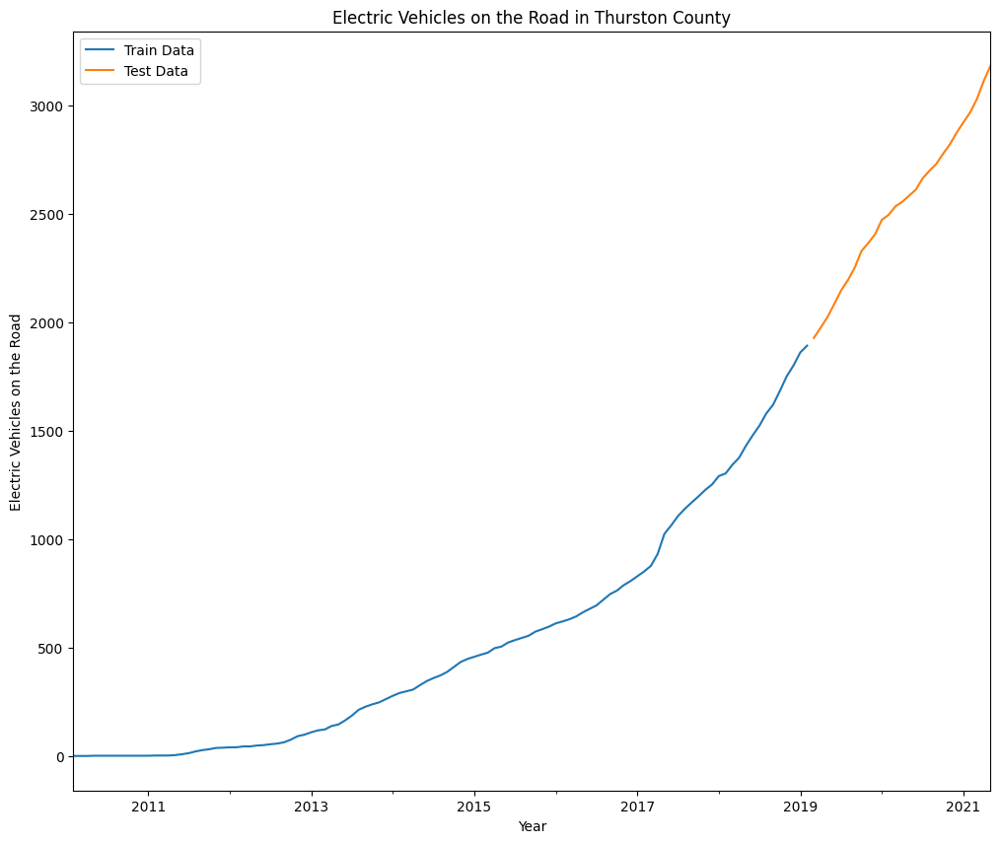

In [106]:
#plotting the split
plot_train_test_split(train_thurston, test_thurston, 'Thurston')

### Finding Best Parameters with Auto-Arima

In [107]:
#finding best parameters
auto_model = pm.auto_arima(train_thurston, start_p=0, start_q=0, d=1, max_p=4, 
                           max_q=4, max_P=3, max_Q=3, start_P=0, start_Q=0, 
                           m=12, verbose=2)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  109
Model:             SARIMAX(1, 1, 1)x(1, 0, [], 12)   Log Likelihood                -396.377
Date:                             Sun, 02 Jul 2023   AIC                            802.754
Time:                                     09:09:24   BIC                            816.165
Sample:                                 02-28-2010   HQIC                           808.192
                                      - 02-28-2019                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.9363      1.152      0.813      0.416      -1.321       3.193
ar.L1          0.9393      0.049     19.000      0.000       0.842       1.036
ma.L1         -0.4421      0.074     -5.950      0.000      -0.588      -0.296
ar.S.L12       0.1942      0.095      2.042      0.041       0.008       0.381
sigma2        88.6338      6.558     13.516      0.000      75.781     101.487
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):               397.83
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):              21.49   Skew:                             1.78
Prob(H) (two-sided):                  0.00   Kurtosis:                        11.70
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

The best parameters (based on the AIC score) were (1,1,1) for the ARIMA order and (1,0,[],12) for the seasonal component. We can go ahead and plug these into a SARIMAX model to have our final model and then we can validate it by looking at the forecasts and the test set.

### Validate Model with Forecasts for Test Data

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                    EV's on the Road   No. Observations:                  109
Model:             SARIMAX(1, 1, 1)x(1, 0, [], 12)   Log Likelihood                -354.510
Date:                             Sun, 02 Jul 2023   AIC                            717.020
Time:                                     09:09:24   BIC                            727.235
Sample:                                 02-28-2010   HQIC                           721.148
                                      - 02-28-2019                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9914      0.024     41.471      0.000       0.945       1.038
ma.L1         -0.5107      0.064     -8.020      0.000      -0.636      -0.386
ar.S.L12       0.2086      0.109      1.918      0.055      -0.005       0.422
sigma2       101.7333      8.385     12.133      0.000      85.300     118.167
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):               230.10
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               9.21   Skew:                             1.40
Prob(H) (two-sided):                  0.00   Kurtosis:                        10.09
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

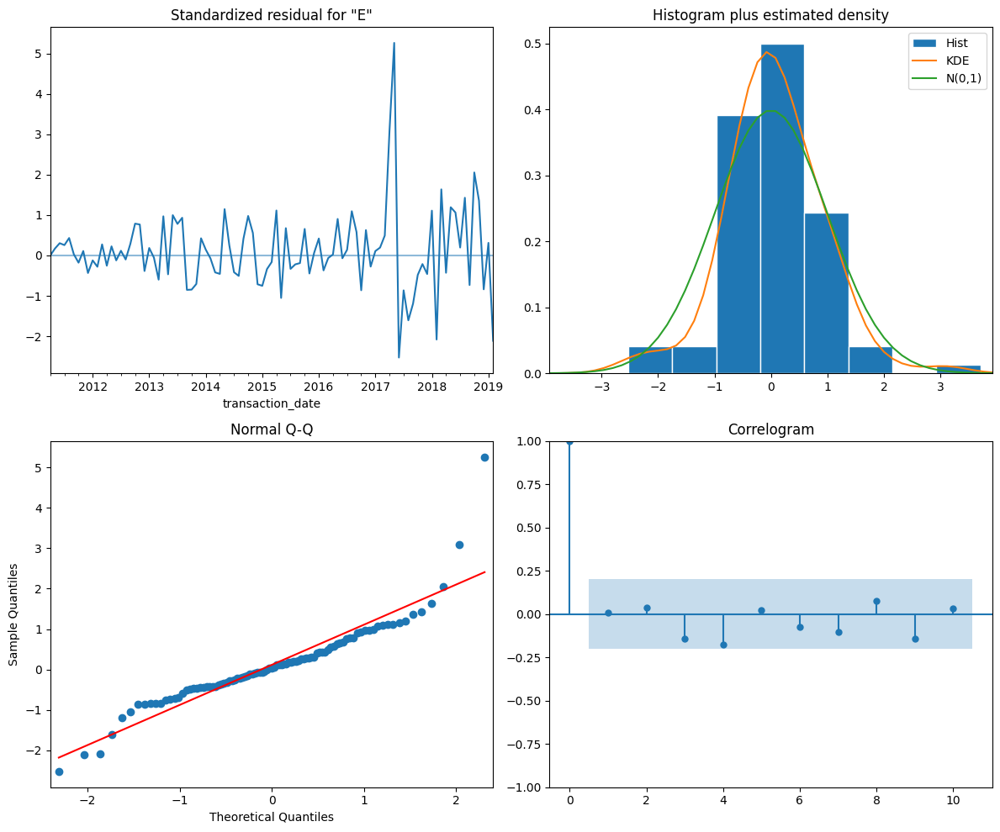

In [108]:
model = SARIMAX(train_thurston, order=(1,1,1), seasonal_order=(1,0,[],12), 
                enforce_invertibility=False, enforce_stationarity=False).fit()
evaluate_model(model)

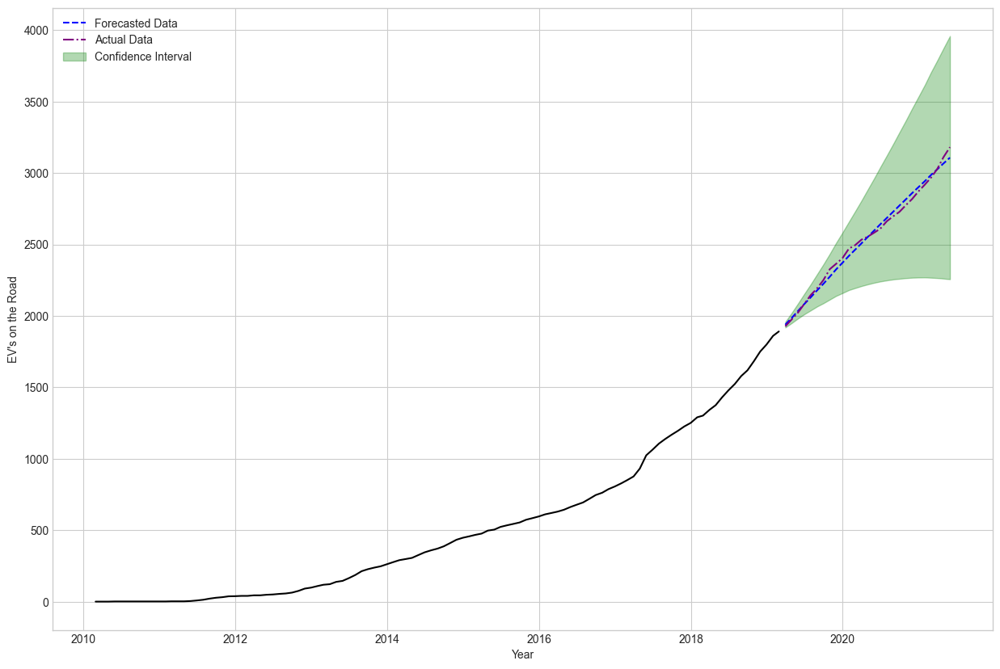

In [109]:
df_thurston_forecast = get_forecast(model, train_thurston, test_thurston, 
                                    plot=True)

The forecast and the observed data are very close to each other throughout the forecasting period. This suggests that our model's performing very well with its predictions. Therefore, we can fit the model to all observed data for Thurston County and make predictions for the future electric vehicle counts.

### Future Predictions

#### Fitting Model to All Observed Data

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                    EV's on the Road   No. Observations:                  136
Model:             SARIMAX(1, 1, 1)x(1, 0, [], 12)   Log Likelihood                -468.628
Date:                             Sun, 02 Jul 2023   AIC                            945.256
Time:                                     09:09:26   BIC                            956.472
Sample:                                 02-28-2010   HQIC                           949.811
                                      - 05-31-2021                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0045      0.015     65.644      0.000       0.974       1.034
ma.L1         -0.5389      0.058     -9.336      0.000      -0.652      -0.426
ar.S.L12       0.1574      0.078      2.007      0.045       0.004       0.311
sigma2       126.6981     10.219     12.398      0.000     106.669     146.727
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):                89.96
Prob(Q):                              0.91   Prob(JB):                         0.00
Heteroskedasticity (H):               7.80   Skew:                             0.66
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.00
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

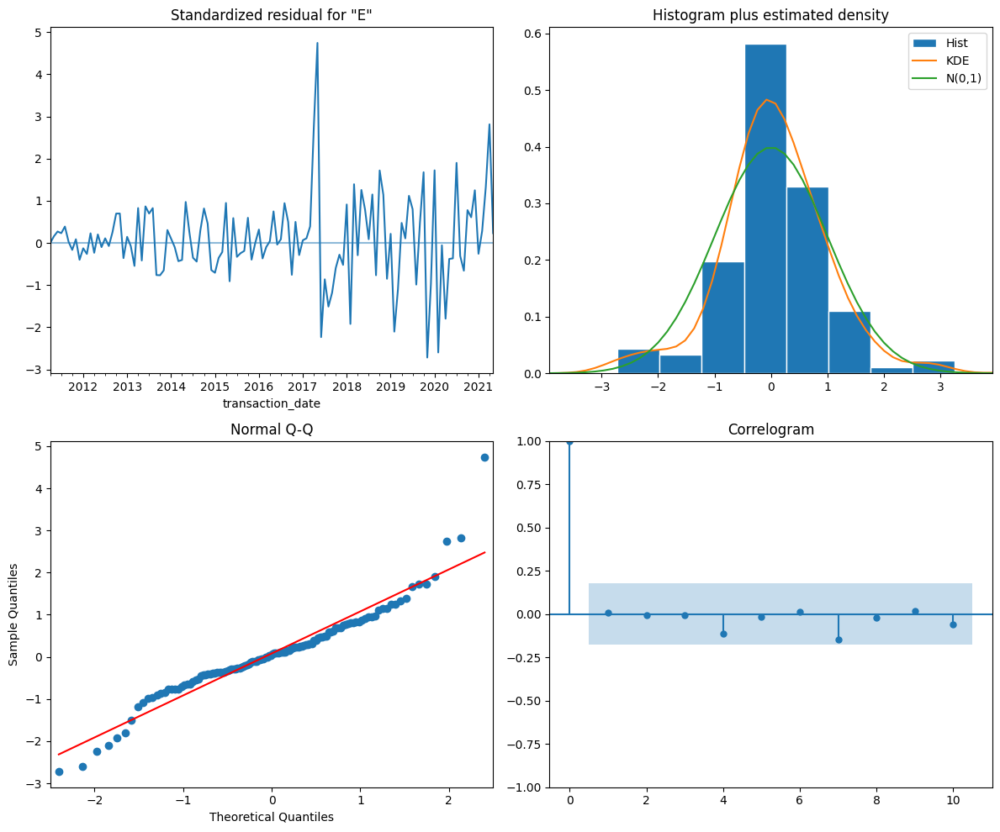

In [110]:
model = SARIMAX(county_information['Thurston']['df'], order=(1,1,1), 
                seasonal_order=(1,0,[],12), enforce_invertibility=False, 
                enforce_stationarity=False).fit()
evaluate_model(model)

The p-values for all the coefficients in the model are statistically significant based on an alpha value of 0.05. Additionally, the residuals are nearly normally distributed with seasonality successfully removed. Next, we can make predictions on the electric vehicle counts for future dates.

#### Plotting & Saving Predictions

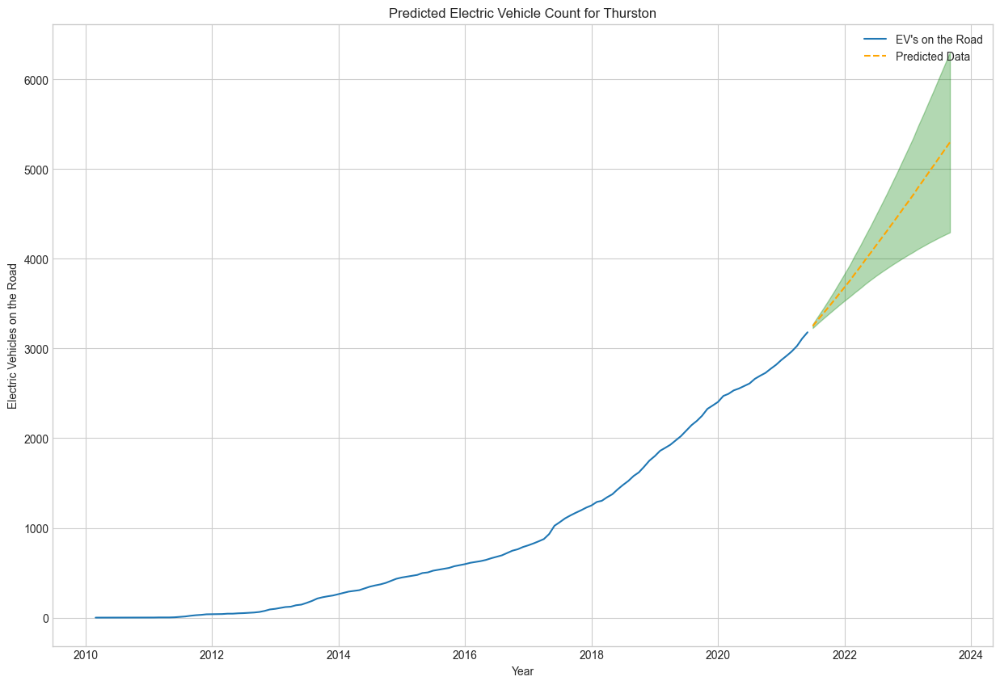

In [111]:
#getting and plotting predictions
df_thurston_preds = get_prediction(model, county_information['Thurston']['df'], 
                               test_thurston, 'Thurston', plot=True)

The model is predicting that the amount of electric vehicles in Thurston County are going to keep increasing at a linear rate (based on the mean prediction). However, if we look at the upper and lower confidence intervals we also see the possibilities of an exponential increase and a leveling off.

In [112]:
#saving predictions
county_information['Thurston']['Predictions'] = df_thurston_preds

## Kitsap County

### Seasonality Check

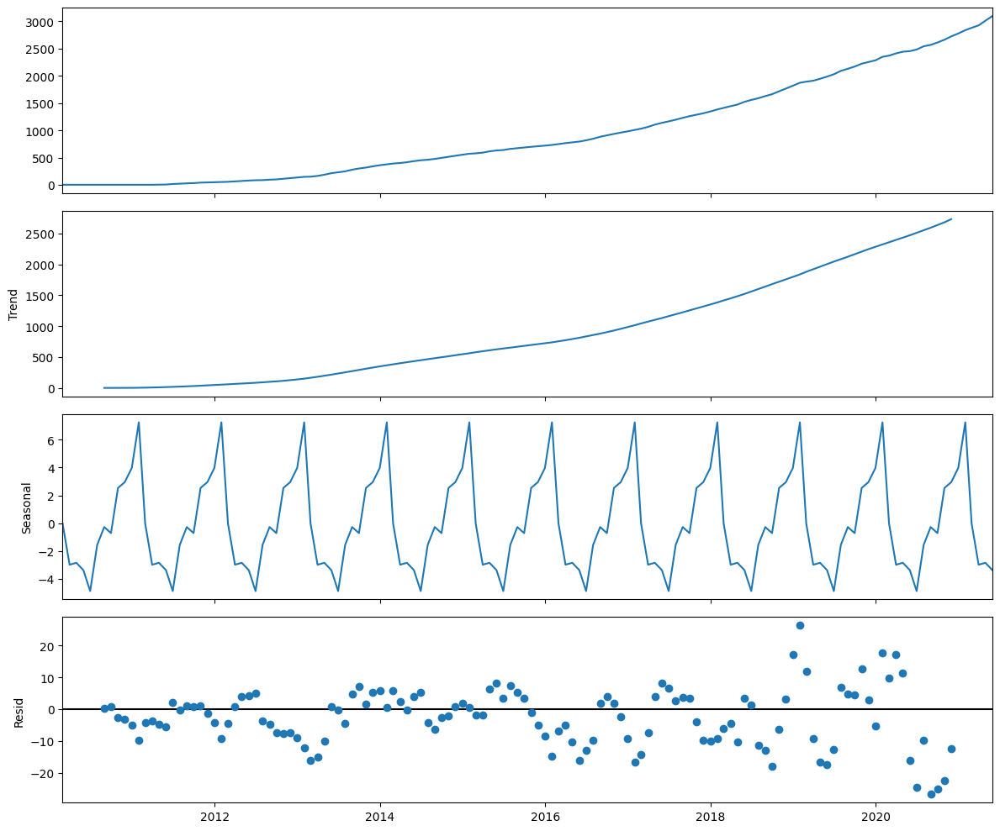

In [113]:
plt.rcParams['figure.figsize']=(12,10)
decomp = tsa.seasonal_decompose(county_information['Kitsap']['df'])
decomp.plot();

Electric vehicle count in Kitsap County, similar to previous counties, has an upward trend. It also is showing a seasonal pattern but it is relatively smaller compared to other counties.

### train_test_split

After multiple iterations, we found that the 0.75-0.25 split of the data belonging to Kitsap County resulted in the best performance.

In [114]:
#splitting data into train/test sets for validation
train_kitsap, test_kitsap = train_test_split_ts(county_information['Kitsap']['df'], 
                                            0.75, 0.25)

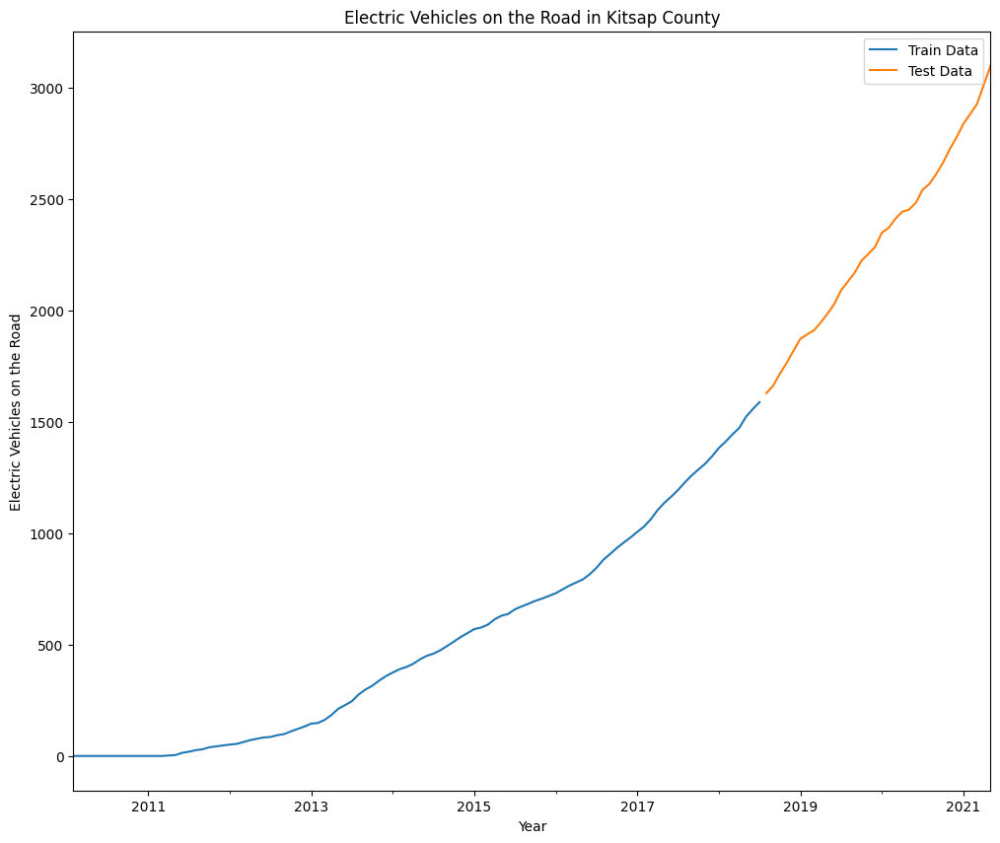

In [115]:
#plotting the split
plot_train_test_split(train_kitsap, test_kitsap, 'Kitsap')

### Finding Best Parameters with Auto-Arima

In [116]:
#finding best parameters
auto_model = pm.auto_arima(train_kitsap, start_p=0, start_q=0, d=1, max_p=4, 
                           max_q=4, max_P=3, max_Q=3, start_P=0, start_Q=0, 
                           m=12, verbose=2)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  102
Model:               SARIMAX(4, 1, 0)   Log Likelihood                -308.084
Date:                Sun, 02 Jul 2023   AIC                            628.169
Time:                        09:09:37   BIC                            643.859
Sample:                    02-28-2010   HQIC                           634.521
                         - 07-31-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.5274      1.047      0.504      0.614      -1.524       2.579
ar.L1          0.5553      0.085      6.507      0.000       0.388       0.722
ar.L2         -0.0079      0.116     -0.068      0.946      -0.236       0.220
ar.L3          0.1746      0.115      1.525      0.127      -0.050       0.399
ar.L4          0.2467      0.108      2.285      0.022       0.035       0.458
sigma2        25.4651      3.396      7.500      0.000      18.810      32.120
===================================================================================
Ljung-Box (L1) (Q):                   0.08   Jarque-Bera (JB):                21.43
Prob(Q):                              0.77   Prob(JB):                         0.00
Heteroskedasticity (H):               4.19   Skew:                             0.83
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.53
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

The best parameters (based on the AIC score) were (4,1,0) for the ARIMA order with no parameters for seasonality. This shows us that the models that had a seasonality order specified performed worse than this model. As discussed above, considering the relatively lower seasonality trend for Kitsap County this is not exactly a surprise. We can go ahead and plug these into a SARIMAX model to have our final model and then we can validate it by looking at the forecasts and the test set.

### Validate Model with Forecasts for Test Data

c:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\venv\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:       EV's on the Road   No. Observations:                  102
Model:               SARIMAX(4, 1, 0)   Log Likelihood                -295.958
Date:                Sun, 02 Jul 2023   AIC                            601.916
Time:                        09:09:37   BIC                            614.789
Sample:                    02-28-2010   HQIC                           607.121
                         - 07-31-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5533      0.084      6.581      0.000       0.388       0.718
ar.L2         -0.0069      0.119     -0.058      0.954      -0.240       0.226
ar.L3          0.1931      0.116      1.658      0.097      -0.035       0.421
ar.L4          0.2846      0.108      2.629      0.009       0.072       0.497
sigma2        26.1630      3.753      6.972      0.000      18.808      33.518
===================================================================================
Ljung-Box (L1) (Q):                   0.05   Jarque-Bera (JB):                10.46
Prob(Q):                              0.83   Prob(JB):                         0.01
Heteroskedasticity (H):               3.09   Skew:                             0.63
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.00
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

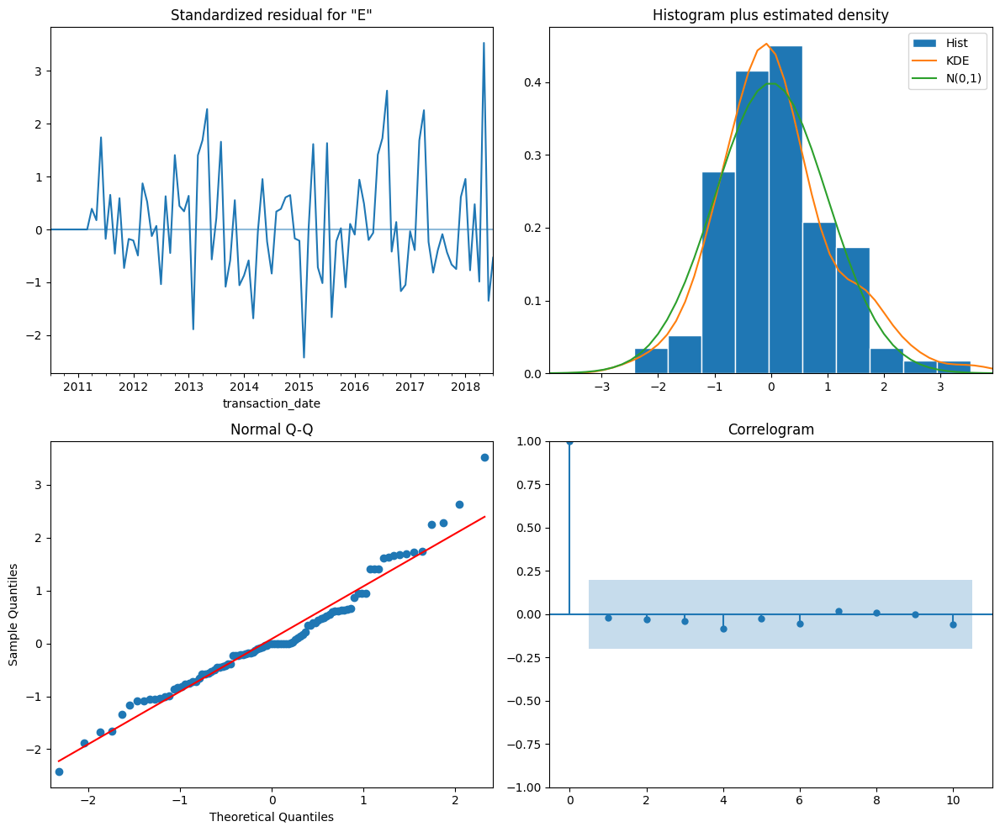

In [117]:
model = SARIMAX(train_kitsap, order=(4,1,0), enforce_invertibility=False, 
                enforce_stationarity=False).fit()
evaluate_model(model)

Even though not all p-values for the coefficients are statistically significant based on an alpha of 0.05, the residuals from the model are normally distributed and based on the correlogram, we can once again see that there is no seasonality.

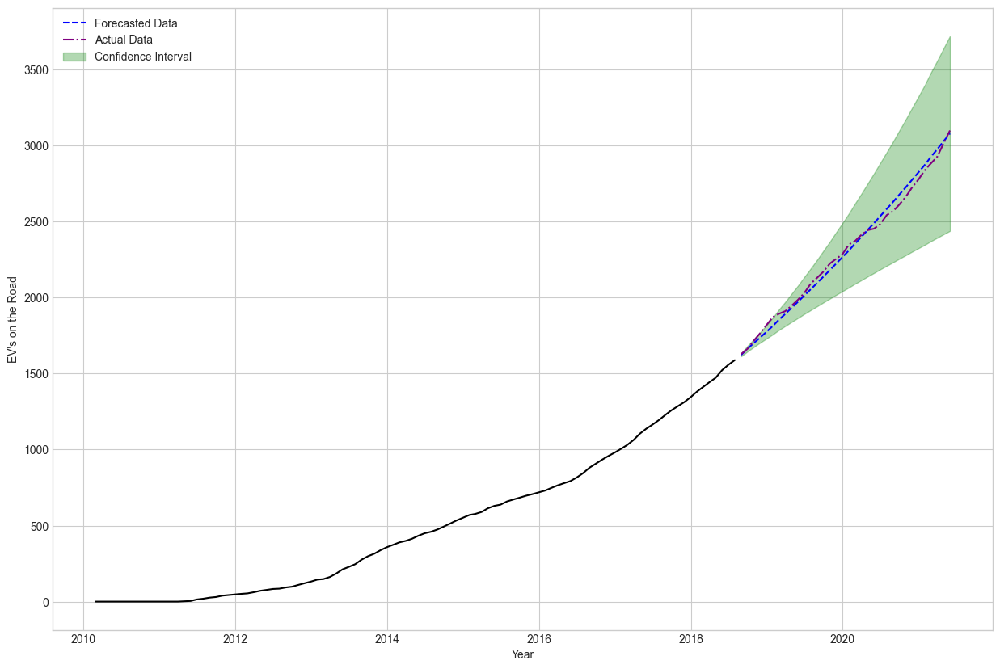

In [118]:
df_kitsap_forecast = get_forecast(model, train_kitsap, test_kitsap, plot=True)

The forecast and the observed data seem to be very close to each other which validates that the model is ready to be fitted to all observed data to make future predictions.

### Future Predictions

#### Fitting Model to All Observed Data

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:       EV's on the Road   No. Observations:                  136
Model:               SARIMAX(4, 1, 0)   Log Likelihood                -479.485
Date:                Sun, 02 Jul 2023   AIC                            968.970
Time:                        09:09:39   BIC                            983.346
Sample:                    02-28-2010   HQIC                           974.812
                         - 05-31-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5168      0.064      8.083      0.000       0.391       0.642
ar.L2          0.0764      0.071      1.080      0.280      -0.062       0.215
ar.L3          0.4291      0.066      6.537      0.000       0.300       0.558
ar.L4          0.0050      0.071      0.070      0.944      -0.134       0.144
sigma2        88.4561      7.534     11.740      0.000      73.689     103.223
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                35.20
Prob(Q):                              0.97   Prob(JB):                         0.00
Heteroskedasticity (H):              10.80   Skew:                             0.16
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.52
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

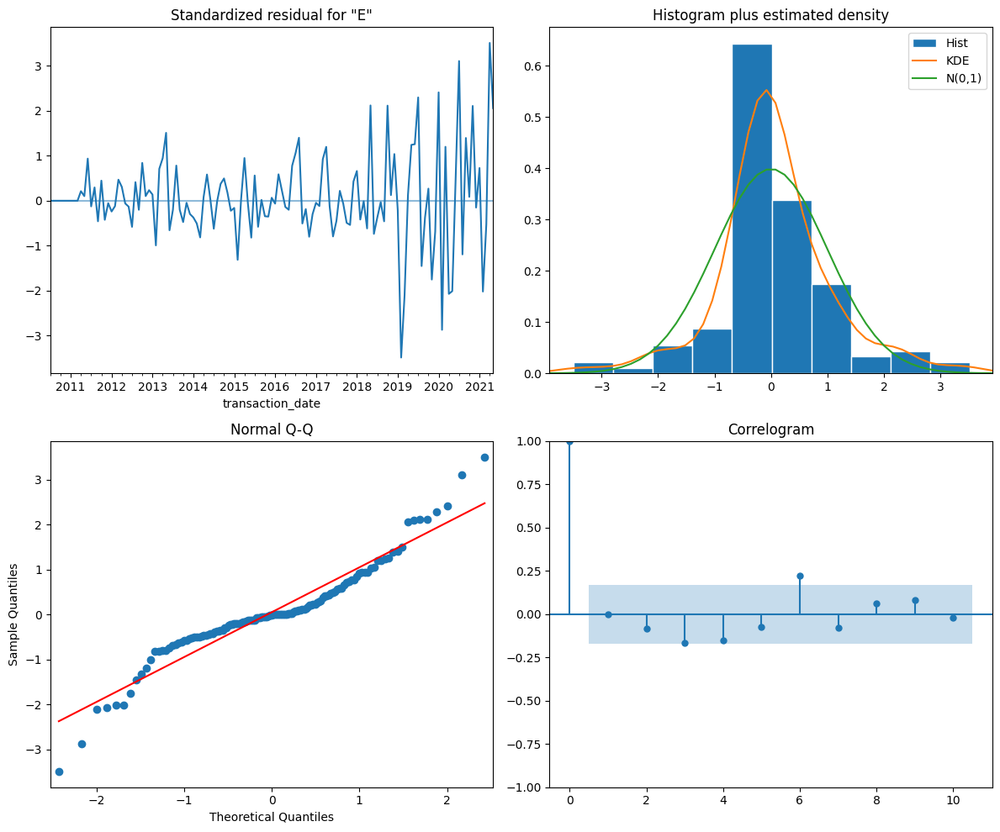

In [119]:
model = SARIMAX(county_information['Kitsap']['df'], order=(4,1,0), 
                enforce_invertibility=False, enforce_stationarity=False).fit()
evaluate_model(model)

The residuals for the model seem to be mostly normally distributed once again with the tails of the Q-Q plot not being ideal. However, these results are based on the best parameters that we could find in our gridsearch so we'll continue using this model.

#### Plotting & Saving Predictions

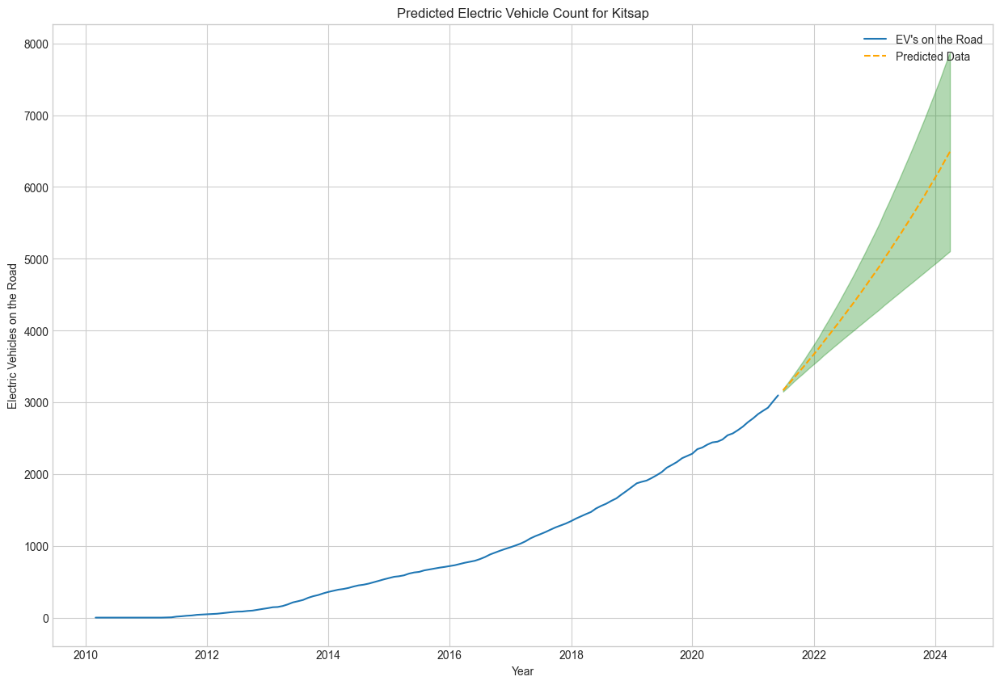

In [120]:
#getting and plotting predictions
df_kitsap_preds = get_prediction(model, county_information['Kitsap']['df'], 
                               test_kitsap, 'Kitsap', plot=True)

Above, we can see that the model is predicting the amount of electric vehicles in Kitsap County to keep increasing exponentially. 

In [121]:
#saving predictions
county_information['Kitsap']['Predictions'] = df_kitsap_preds

## Whatcom County

### Seasonality Check

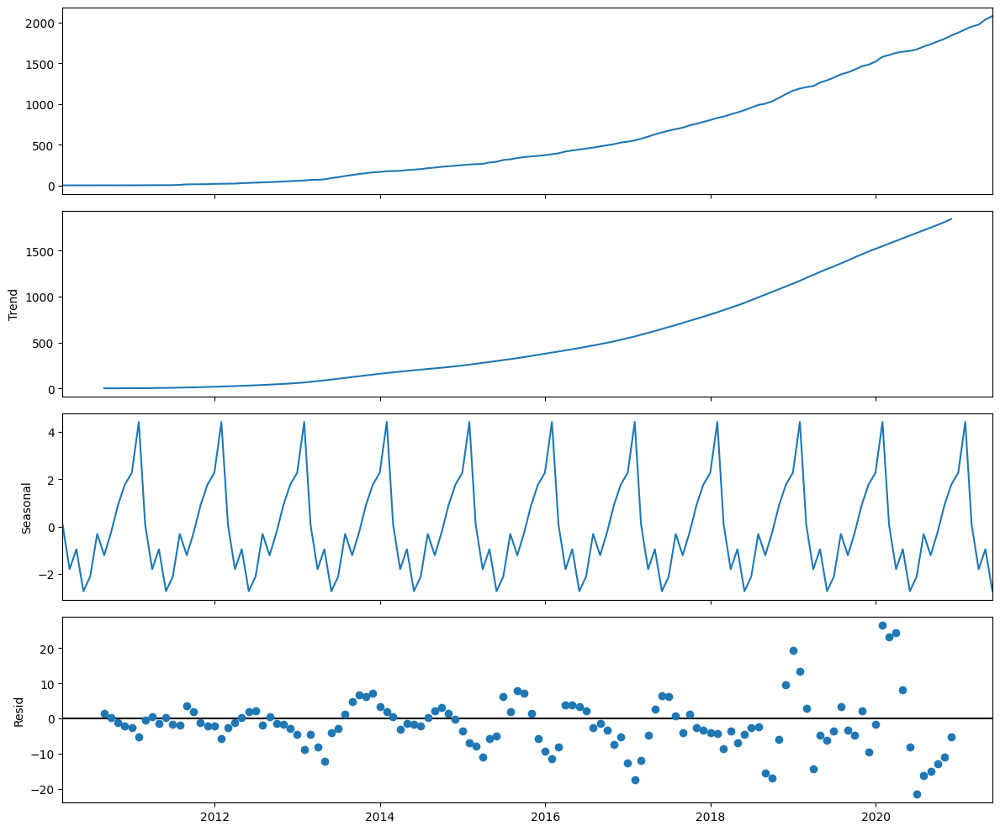

In [122]:
plt.rcParams['figure.figsize']=(12,10)
decomp = tsa.seasonal_decompose(county_information['Whatcom']['df'])
decomp.plot();

Above, we can see that the electric vehicle amount in Whatcom, as is the case with all the prior counties, has an upward trend. The seasonality component seems to be relatively smaller compared to the previous counties.

### train_test_split

After multiple iterations, we found that the 0.75-0.25 split of the data belonging to Whatcom County resulted in the best performance.

In [123]:
#splitting data into train/test sets for validation
train_whatcom, test_whatcom = train_test_split_ts(county_information['Whatcom']['df'], 
                                            0.75, 0.25)

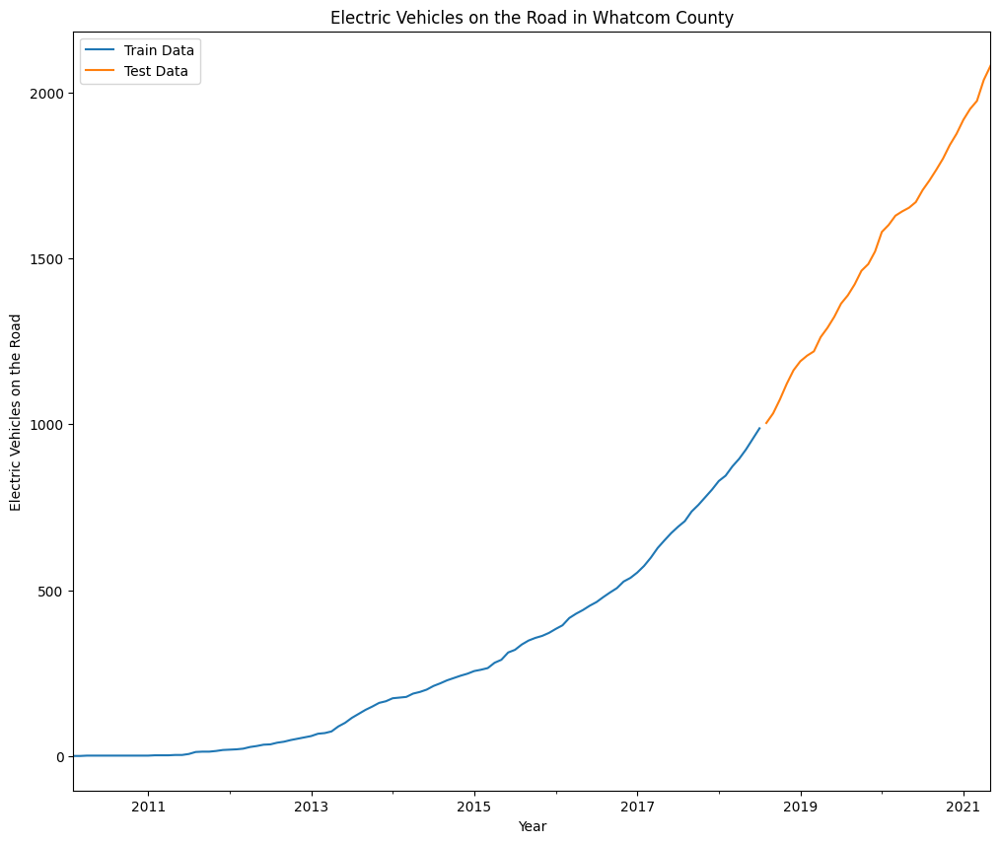

In [124]:
#plotting the split
plot_train_test_split(train_whatcom, test_whatcom, 'Whatcom')

### Finding Best Parameters with Auto-Arima

In [125]:
#finding best parameters
auto_model = pm.auto_arima(train_whatcom, start_p=0, start_q=0, d=1, max_p=4, 
                           max_q=4, max_P=3, max_Q=3, start_P=0, start_Q=0, 
                           m=12, verbose=2)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  102
Model:               SARIMAX(2, 1, 0)   Log Likelihood                -282.444
Date:                Sun, 02 Jul 2023   AIC                            572.887
Time:                        09:09:46   BIC                            583.348
Sample:                    02-28-2010   HQIC                           577.122
                         - 07-31-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.4947      0.742      0.667      0.505      -0.959       1.949
ar.L1          0.4297      0.086      5.014      0.000       0.262       0.598
ar.L2          0.5308      0.085      6.250      0.000       0.364       0.697
sigma2        15.3398      1.913      8.017      0.000      11.590      19.090
===================================================================================
Ljung-Box (L1) (Q):                   0.54   Jarque-Bera (JB):                16.24
Prob(Q):                              0.46   Prob(JB):                         0.00
Heteroskedasticity (H):               7.70   Skew:                             0.86
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.93
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

The best parameters (based on the AIC score) were (2,1,0) for the ARIMA order with no parameters for seasonality. This shows us that the models that had a seasonality order specified performed worse than this model. As discussed above, considering the relatively lower seasonality trend for Whatcom County this is not exactly a surprise. We can go ahead and plug these into a SARIMAX model to have our final model and then we can validate it by looking at the forecasts and the test set.

### Validate Model with Forecasts for Test Data

c:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\venv\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:       EV's on the Road   No. Observations:                  102
Model:               SARIMAX(2, 1, 0)   Log Likelihood                -276.273
Date:                Sun, 02 Jul 2023   AIC                            558.545
Time:                        09:09:46   BIC                            566.331
Sample:                    02-28-2010   HQIC                           561.695
                         - 07-31-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4475      0.082      5.468      0.000       0.287       0.608
ar.L2          0.5725      0.084      6.857      0.000       0.409       0.736
sigma2        15.5395      1.810      8.588      0.000      11.993      19.086
===================================================================================
Ljung-Box (L1) (Q):                   0.77   Jarque-Bera (JB):                11.79
Prob(Q):                              0.38   Prob(JB):                         0.00
Heteroskedasticity (H):               8.45   Skew:                             0.70
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.95
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

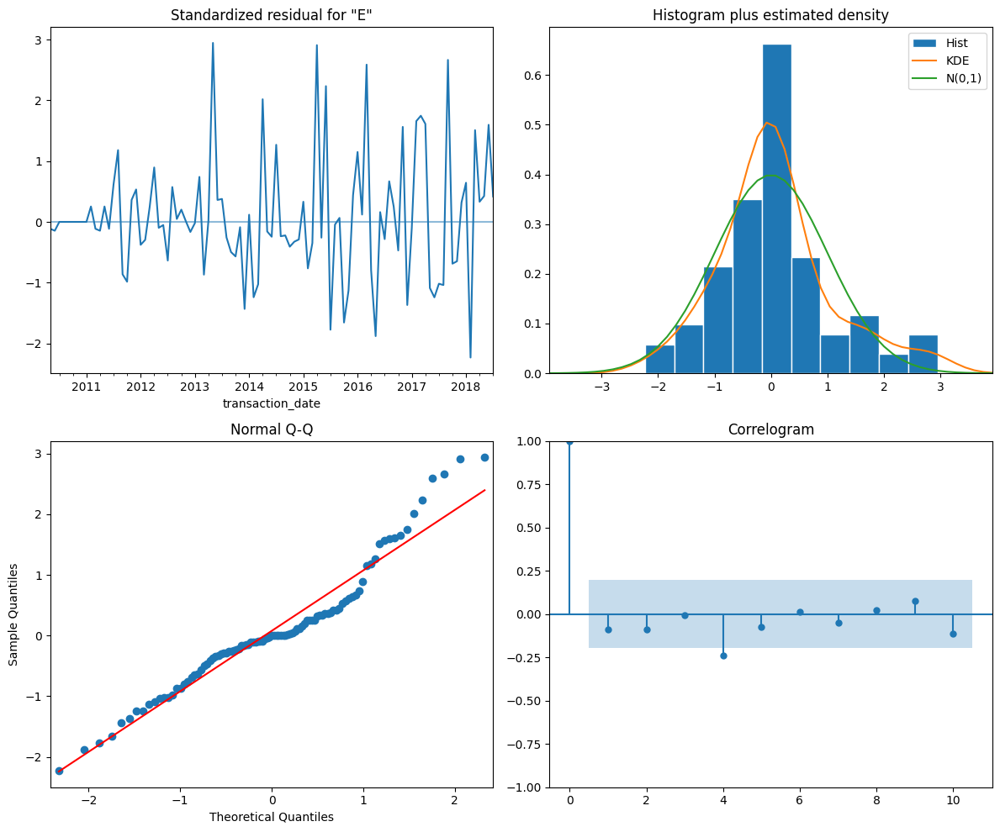

In [126]:
model = SARIMAX(train_whatcom, order=(2,1,0), enforce_invertibility=False, 
                enforce_stationarity=False).fit()
evaluate_model(model)

Once again, we can see here that the residuals are nearly normally distributed and the residuals over time don't show any seasonality and appear to be white noise.

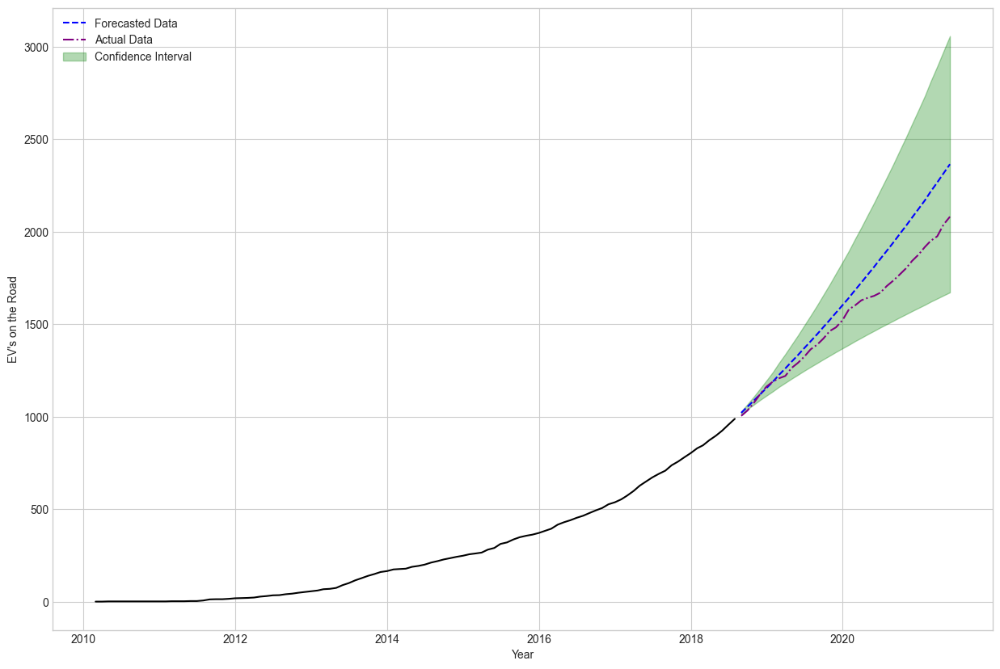

In [127]:
df_whatcom_forecast = get_forecast(model, train_whatcom, test_whatcom, plot=True)

Above, we can see that the forecasted values and the observed values are very close from mid-2018 to 2020. In early 2020, the forecasted values seem to be higher than the actual observed values which may be due to the COVID-19 pandemic and the many supply chain issues it caused. These issues may have affected the electric vehicle sales in Whatcom County causing this discrepancy. Additionally, the observed data is still well within the confidence interval so we can move onto fitting the model to all observed data.

### Future Predictions

#### Fitting Model to All Observed Data

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:       EV's on the Road   No. Observations:                  136
Model:               SARIMAX(2, 1, 0)   Log Likelihood                -465.099
Date:                Sun, 02 Jul 2023   AIC                            936.198
Time:                        09:09:48   BIC                            944.869
Sample:                    02-28-2010   HQIC                           939.721
                         - 05-31-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5595      0.060      9.354      0.000       0.442       0.677
ar.L2          0.4159      0.068      6.088      0.000       0.282       0.550
sigma2        63.8216      4.284     14.897      0.000      55.425      72.219
===================================================================================
Ljung-Box (L1) (Q):                   2.04   Jarque-Bera (JB):               161.66
Prob(Q):                              0.15   Prob(JB):                         0.00
Heteroskedasticity (H):              25.22   Skew:                             0.92
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.07
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

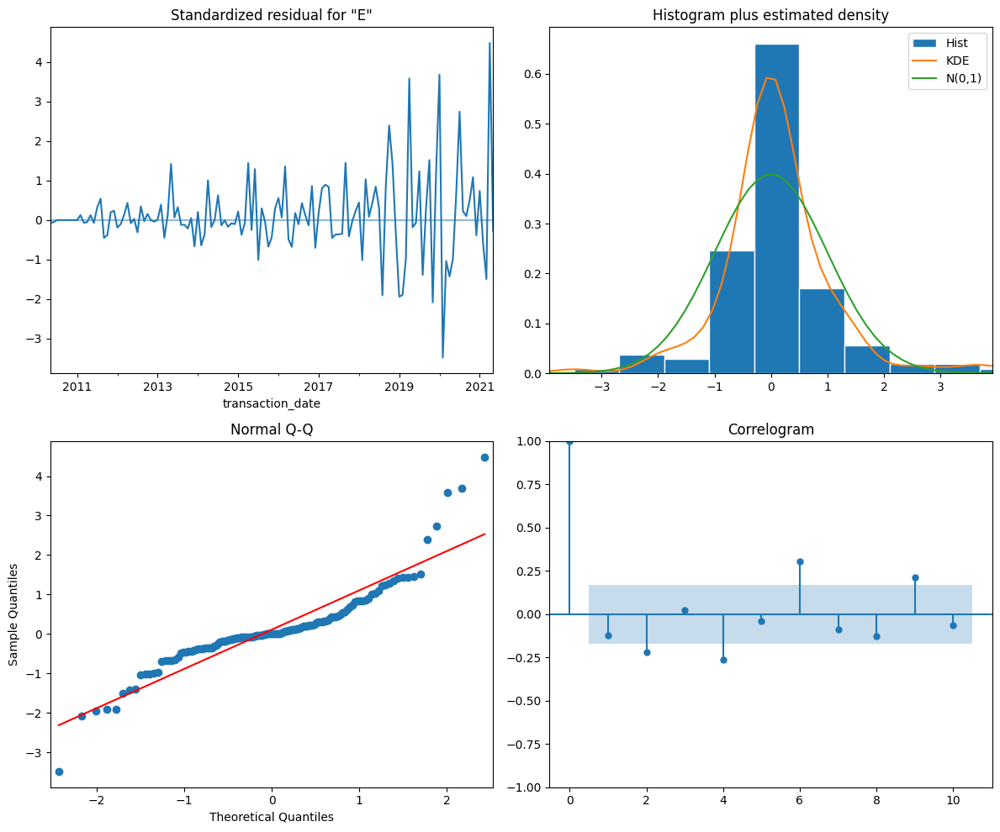

In [128]:
model = SARIMAX(county_information['Whatcom']['df'], order=(2,1,0), 
                enforce_invertibility=False, enforce_stationarity=False).fit(maxiter=125)
evaluate_model(model)

The p-values for the coefficients are all statistically significant based on an alpha of 0.05. Additionally, the residuals are nearly normally distributed with the far right tail of the Q-Q plot being an exception. Looking at the residuals over time, there doesn't seem to be any apparent seasonality.

#### Plotting & Saving Predictions

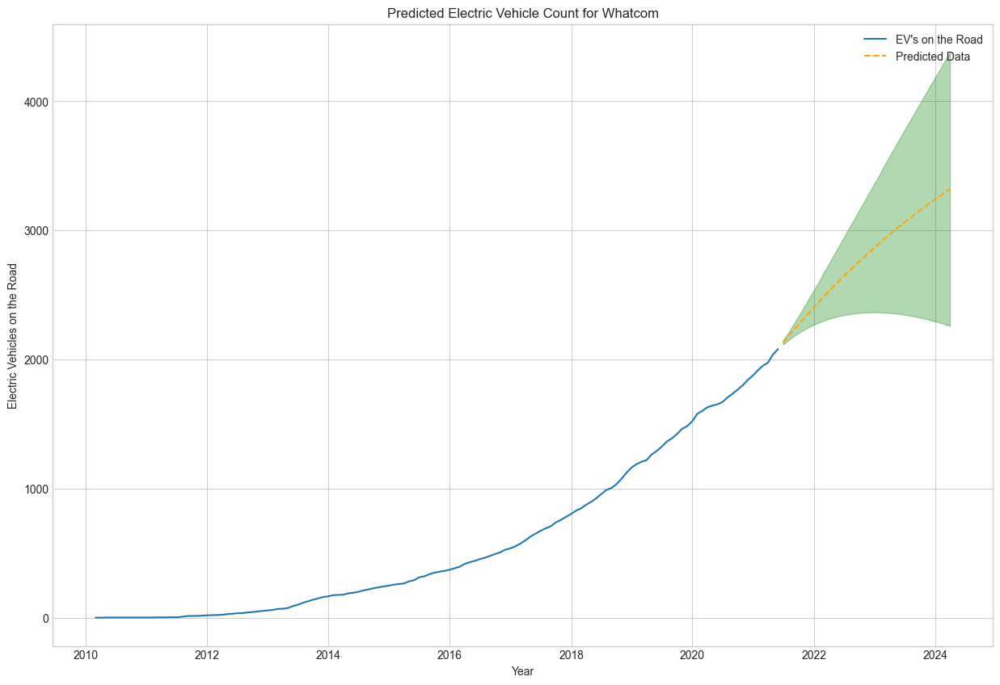

In [129]:
#getting and plotting predictions
df_whatcom_preds = get_prediction(model, county_information['Whatcom']['df'], 
                               test_whatcom, 'Whatcom', plot=True)

The mean predicted values of the model seem to suggest that the amount of electric vehicles are going to level off in the future. However, looking at the upper confidence interval we can see that it may also keep increasing exponentially. The mean is heavily affected by the dropping nature of the lower confidence interval in this case.

In [130]:
#saving predictions
county_information['Whatcom']['Predictions'] = df_whatcom_preds

## Spokane County

### Seasonality Check

### train_test_split

After multiple iterations, we found that the 0.75-0.25 split of the data belonging to Spokane County resulted in the best performance.

In [131]:
#splitting data to train/test set for validation
train_spokane, test_spokane = train_test_split_ts(county_information['Spokane']['df'], 
                                            0.75, 0.25)

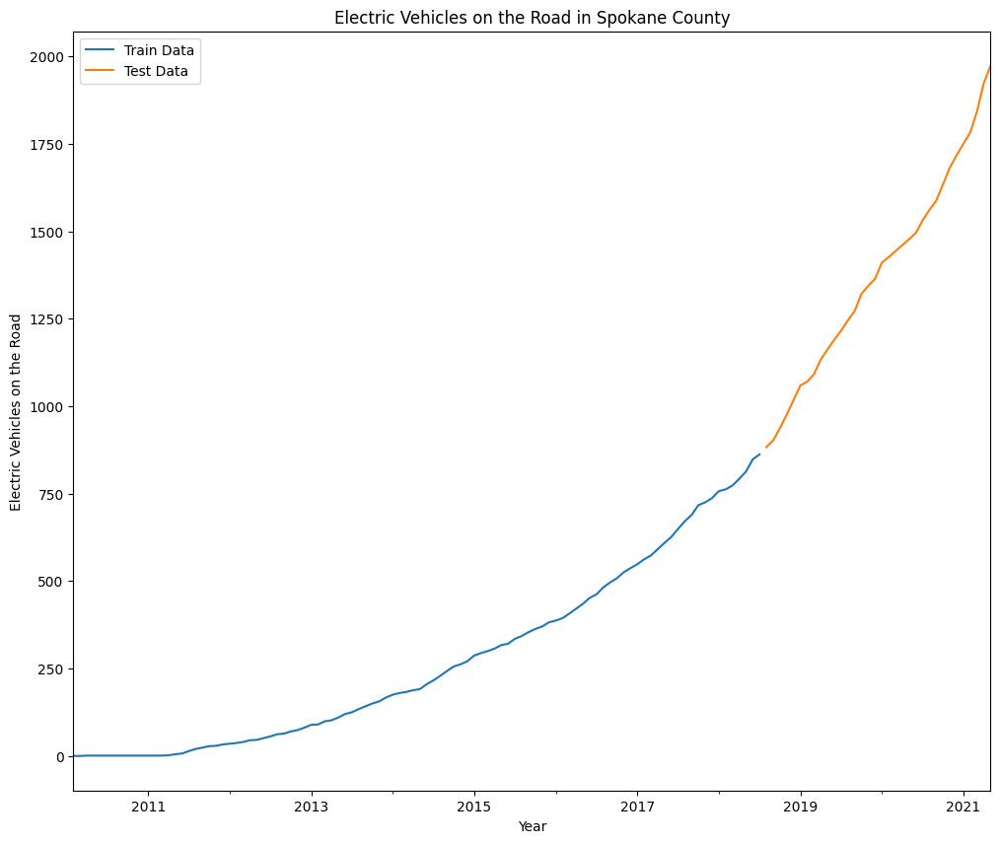

In [132]:
#plotting the split
plot_train_test_split(train_spokane, test_spokane, 'Spokane')

### Finding Best Parameters with Auto-Arima

In [133]:
auto_model = pm.auto_arima(train_spokane, start_p=0, start_q=0, d=1, max_p=4, 
                           max_q=4, max_P=3, max_Q=3, start_P=0, start_Q=0, 
                           m=12, verbose=2)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                    y   No. Observations:                  102
Model:             SARIMAX(3, 1, 0)x(1, 0, [1], 12)   Log Likelihood                -289.399
Date:                              Sun, 02 Jul 2023   AIC                            590.798
Time:                                      09:10:10   BIC                            606.489
Sample:                                  02-28-2010   HQIC                           597.150
                                       - 07-31-2018                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.1725      0.070      2.465      0.014       0.035       0.310
ar.L2          0.3672      0.097      3.768      0.000       0.176       0.558
ar.L3          0.4097      0.095      4.308      0.000       0.223       0.596
ar.S.L12       0.9301      0.259      3.587      0.000       0.422       1.438
ma.S.L12      -0.8061      0.405     -1.990      0.047      -1.600      -0.012
sigma2        16.9750      2.407      7.052      0.000      12.257      21.693
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                44.06
Prob(Q):                              0.96   Prob(JB):                         0.00
Heteroskedasticity (H):              11.36   Skew:                             0.53
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.06
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

The best parameters (based on the AIC score) were (3,1,0) for the ARIMA order with (1,0,[1],12) for the seasonality order. We can go ahead and plug these into a SARIMAX model to have our final model and then we can validate it by looking at the forecasts and the test set.

### Validate Model with Forecasts for Test Data

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                     EV's on the Road   No. Observations:                  102
Model:             SARIMAX(3, 1, 0)x(1, 0, [1], 12)   Log Likelihood                -250.653
Date:                              Sun, 02 Jul 2023   AIC                            513.306
Time:                                      09:10:11   BIC                            528.032
Sample:                                  02-28-2010   HQIC                           519.233
                                       - 07-31-2018                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0946      0.109     -0.869      0.385      -0.308       0.119
ar.L2          0.1775      0.130      1.362      0.173      -0.078       0.433
ar.L3          0.3463      0.109      3.177      0.001       0.133       0.560
ar.S.L12       1.2587      0.033     37.744      0.000       1.193       1.324
ma.S.L12      -0.8718      0.315     -2.764      0.006      -1.490      -0.254
sigma2        16.5747      4.429      3.742      0.000       7.894      25.255
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 3.59
Prob(Q):                              0.88   Prob(JB):                         0.17
Heteroskedasticity (H):               4.33   Skew:                            -0.08
Prob(H) (two-sided):                  0.00   Kurtosis:                         3.99
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

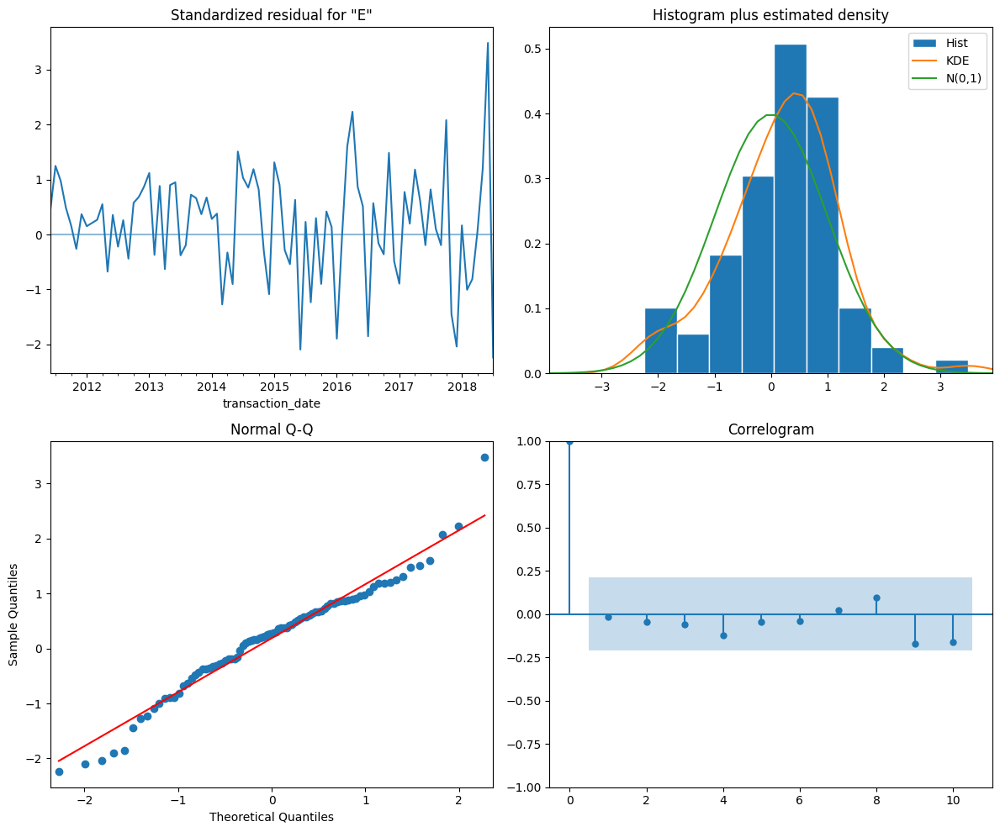

In [134]:
model = SARIMAX(train_spokane, order=(3,1,0), seasonal_order=(1,0,[1],12), 
                enforce_invertibility=False, 
                enforce_stationarity=False).fit()
evaluate_model(model)

The residuals are once again normally distributed for the most part. The correlogram and the residuals over time show that there is no seasonality. Some of the p-values for the coefficients seem to be statistically insignificant (based on an alpha value of 0.05); however, since these parameters ended up having the lowest AIC score from our gridsearch, we will continue with this model.

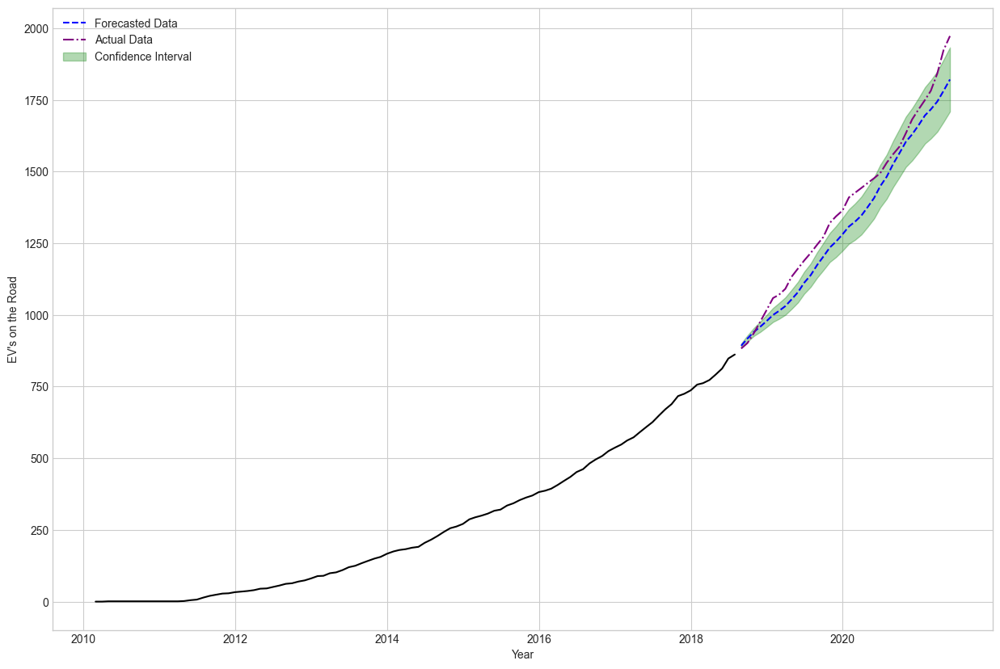

In [135]:
df_spokane_forecast = get_forecast(model, train_spokane, test_spokane, plot=True)

We can see here that the forecasted values are lower compared to the observed data with the observed data alternating between being inside and outside of the confidence interval. However, the values are close enough that we will be moving ahead with this model.

### Future Predictions

#### Fitting Model to All Observed Data

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                     EV's on the Road   No. Observations:                  136
Model:             SARIMAX(3, 1, 0)x(1, 0, [1], 12)   Log Likelihood                -423.077
Date:                              Sun, 02 Jul 2023   AIC                            858.155
Time:                                      09:10:13   BIC                            874.879
Sample:                                  02-28-2010   HQIC                           864.947
                                       - 05-31-2021                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4888      0.072      6.772      0.000       0.347       0.630
ar.L2         -0.1047      0.089     -1.182      0.237      -0.278       0.069
ar.L3          0.0815      0.081      1.005      0.315      -0.078       0.241
ar.S.L12       1.2619      0.029     43.720      0.000       1.205       1.318
ma.S.L12      -0.9461      0.383     -2.471      0.013      -1.697      -0.196
sigma2        55.8860     20.098      2.781      0.005      16.495      95.277
===================================================================================
Ljung-Box (L1) (Q):                   0.07   Jarque-Bera (JB):                19.93
Prob(Q):                              0.79   Prob(JB):                         0.00
Heteroskedasticity (H):              13.87   Skew:                             0.58
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.63
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

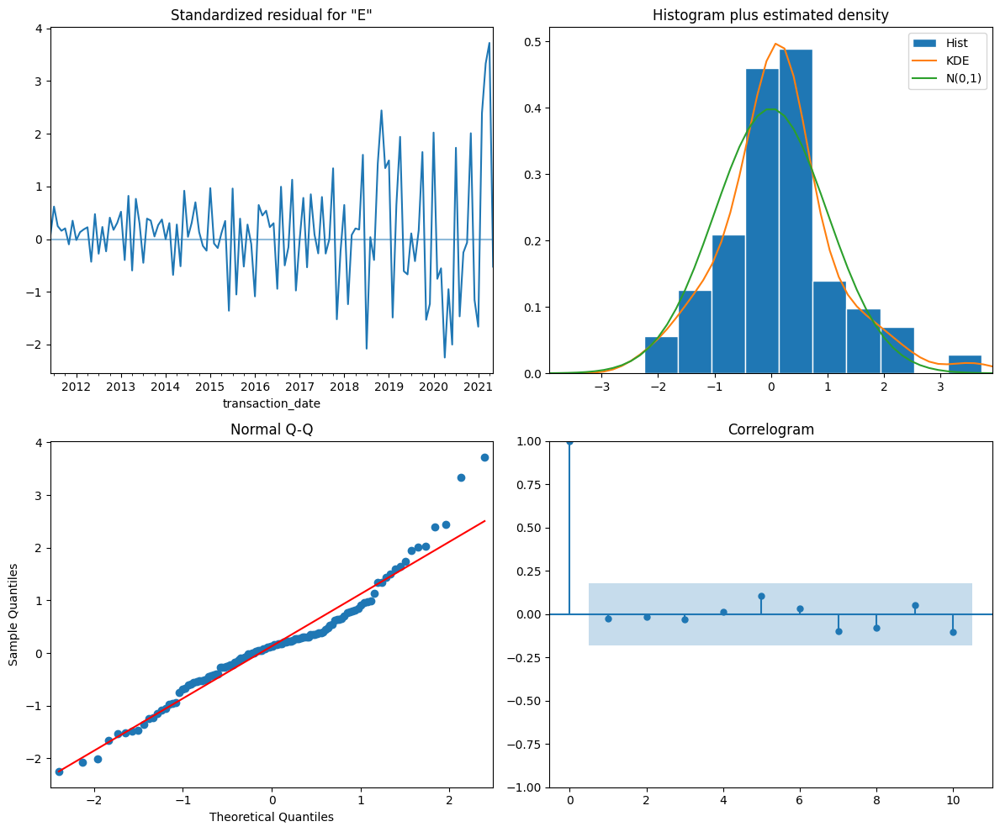

In [136]:
model = SARIMAX(county_information['Spokane']['df'], order=(3,1,0), 
                seasonal_order=(1,0,[1],12), enforce_invertibility=False, 
                enforce_stationarity=False).fit(maxiter=125)
evaluate_model(model)

Once again, we can see that the residuals are nearly normally distributed with the correlogram showing no obvious seasonality. Even though some of the p-values for the coefficients are above the chosen alpha threshold of 0.05, we consider these results to be acceptable.

#### Plotting & Saving Predictions

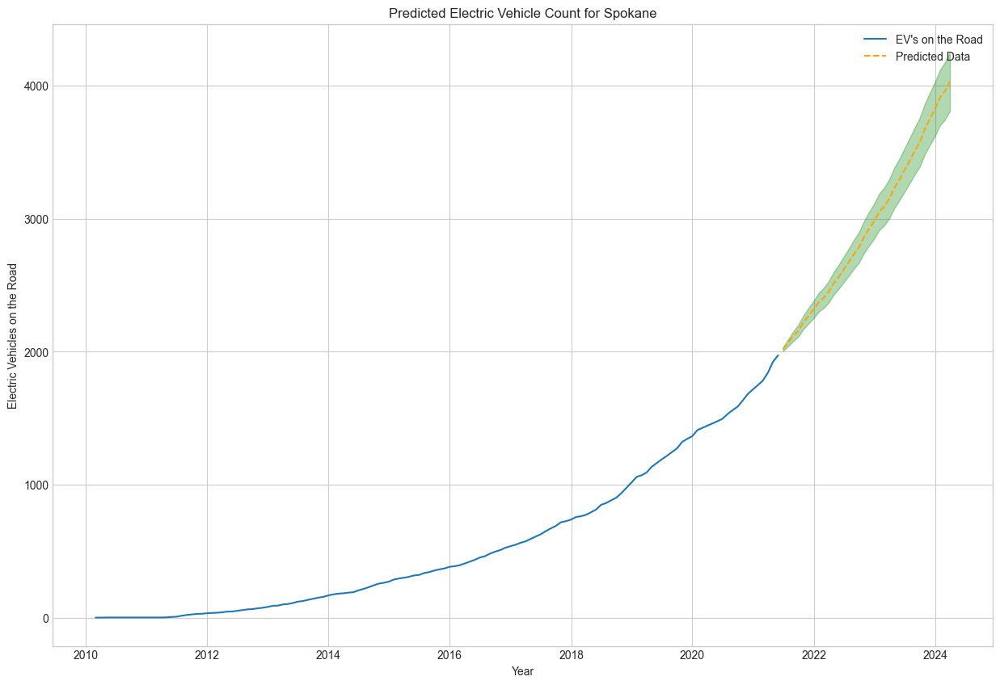

In [137]:
#getting and plotting predictions
df_spokane_preds = get_prediction(model, county_information['Spokane']['df'], 
                               test_spokane, 'Spokane', plot=True)

Above, we can see that the model is predicting the electric vehicle count in Spokane County to keep increasing exponentially.

In [138]:
#saving predictions
county_information['Spokane']['Predictions'] = df_spokane_preds

## Benton County

### Seasonality Check

### train_test_split

After multiple iterations, we found that the 0.75-0.25 split of the data belonging to Benton County resulted in the best performance.

In [139]:
#splitting the data to train/test sets for validation
train_benton, test_benton = train_test_split_ts(county_information['Benton']['df'], 
                                            0.75, 0.25)

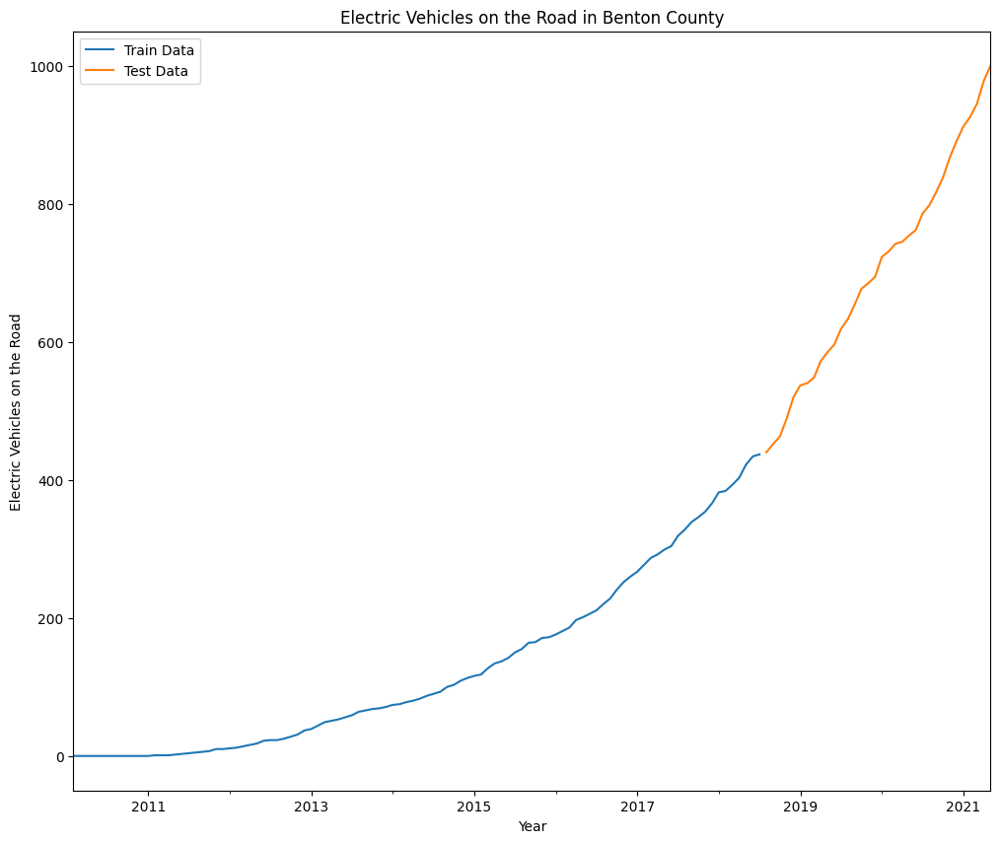

In [140]:
#plotting the split
plot_train_test_split(train_benton, test_benton, 'Benton')

### Finding Best Parameters with Auto-Arima

In [141]:
auto_model = pm.auto_arima(train_benton, start_p=0, start_q=0, d=1, max_p=4, 
                           max_q=4, max_P=3, max_Q=3, start_P=0, start_Q=0, 
                           m=12, verbose=2)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  102
Model:             SARIMAX(4, 1, 1)x(0, 0, 1, 12)   Log Likelihood                -236.267
Date:                            Sun, 02 Jul 2023   AIC                            486.534
Time:                                    09:10:43   BIC                            504.840
Sample:                                02-28-2010   HQIC                           493.945
                                     - 07-31-2018                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6927      0.168      4.130      0.000       0.364       1.022
ar.L2         -0.0063      0.135     -0.047      0.963      -0.271       0.258
ar.L3         -0.1135      0.115     -0.985      0.324      -0.339       0.112
ar.L4          0.4223      0.091      4.625      0.000       0.243       0.601
ma.L1         -0.5331      0.173     -3.086      0.002      -0.872      -0.195
ma.S.L12      -0.2079      0.108     -1.928      0.054      -0.419       0.003
sigma2         6.0478      0.705      8.583      0.000       4.667       7.429
===================================================================================
Ljung-Box (L1) (Q):                   0.80   Jarque-Bera (JB):                15.27
Prob(Q):                              0.37   Prob(JB):                         0.00
Heteroskedasticity (H):               9.82   Skew:                             0.12
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.89
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

The best parameters (based on the AIC score) were (4,1,1) for the ARIMA order with (0,0,1,12) for the seasonality order. We can go ahead and plug these into a SARIMAX model to have our final model and then we can validate it by looking at the forecasts and the test set.

### Validate Model with Forecasts for Test Data

c:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\venv\lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  102
Model:             SARIMAX(4, 1, 1)x(0, 0, 1, 12)   Log Likelihood                -204.443
Date:                            Sun, 02 Jul 2023   AIC                            422.886
Time:                                    09:10:44   BIC                            440.147
Sample:                                02-28-2010   HQIC                           429.836
                                     - 07-31-2018                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9184      0.115      7.962      0.000       0.692       1.144
ar.L2         -0.0304      0.178     -0.171      0.864      -0.379       0.319
ar.L3         -0.1112      0.155     -0.718      0.473      -0.415       0.192
ar.L4          0.2598      0.128      2.030      0.042       0.009       0.511
ma.L1         -0.9979      1.109     -0.900      0.368      -3.171       1.175
ma.S.L12      -0.3341      0.138     -2.421      0.015      -0.605      -0.064
sigma2         6.1580      6.848      0.899      0.369      -7.264      19.580
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 7.14
Prob(Q):                              0.95   Prob(JB):                         0.03
Heteroskedasticity (H):               4.75   Skew:                            -0.37
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.19
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

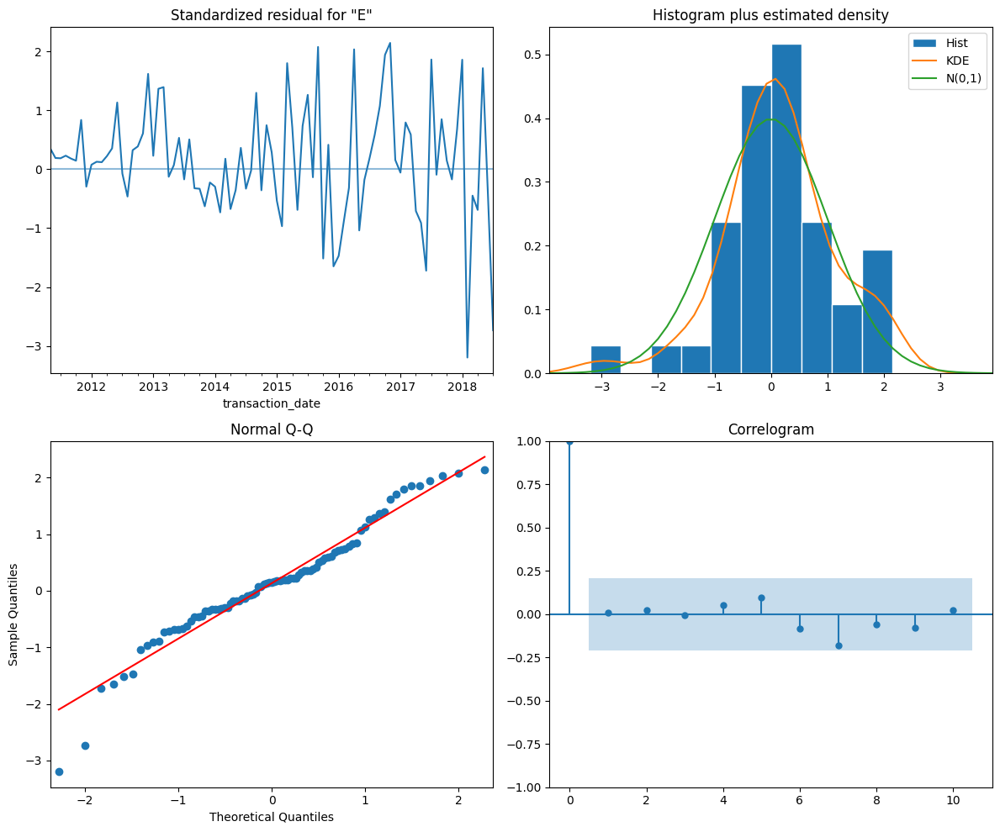

In [142]:
model = SARIMAX(train_benton, order=(4,1,1), seasonal_order=(0,0,1,12), 
                enforce_invertibility=False, enforce_stationarity=False).fit()
evaluate_model(model)

Looking at the residuals for the model, we can see that the residuals don't show and obvious seasonality over time and that they are nearly normally distributed. Even though some of the coefficients don't seem to be statistically significant based on an alpha level of 0.05, since these were the best parameters our gridsearch could find, we will move onto validating the model.

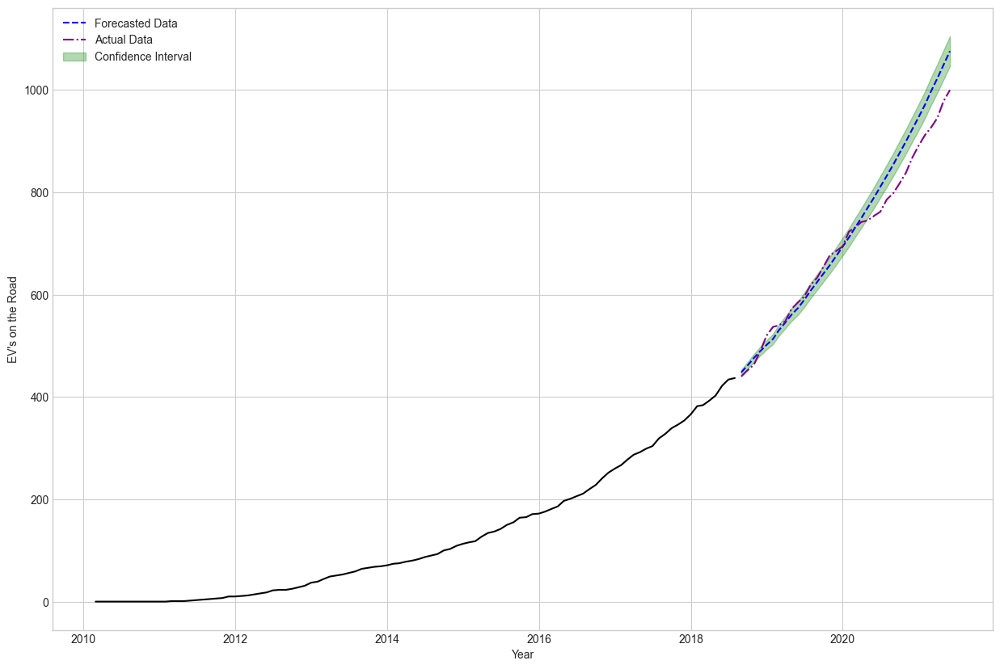

In [143]:
df_benton_forecast = get_forecast(model, train_benton, test_benton, plot=True)

Above, we can see that the forecasted values and the observed values are very close from mid-2018 to 2020. In early 2020, the forecasted values seem to be higher than the actual observed values which may be due to the COVID-19 pandemic and the many supply chain issues it caused. These issues may have affected the electric vehicle sales in Benton County causing this discrepancy. 

### Future Predictions

#### Fitting Model to All Observed Data

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                   EV's on the Road   No. Observations:                  136
Model:             SARIMAX(4, 1, 1)x(0, 0, 1, 12)   Log Likelihood                -361.515
Date:                            Sun, 02 Jul 2023   AIC                            737.030
Time:                                    09:10:47   BIC                            756.600
Sample:                                02-28-2010   HQIC                           744.978
                                     - 05-31-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.1713      0.061     19.283      0.000       1.052       1.290
ar.L2         -0.2680      0.110     -2.437      0.015      -0.484      -0.052
ar.L3          0.0351      0.106      0.329      0.742      -0.174       0.244
ar.L4          0.0837      0.065      1.283      0.199      -0.044       0.211
ma.L1         -1.0000      0.092    -10.874      0.000      -1.180      -0.820
ma.S.L12      -0.0691      0.072     -0.957      0.338      -0.211       0.072
sigma2        22.2423      0.004   5379.799      0.000      22.234      22.250
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                21.15
Prob(Q):                              0.97   Prob(JB):                         0.00
Heteroskedasticity (H):              31.79   Skew:                             0.17
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.02
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 7.19e+18. Standard errors may be unstable.
"""

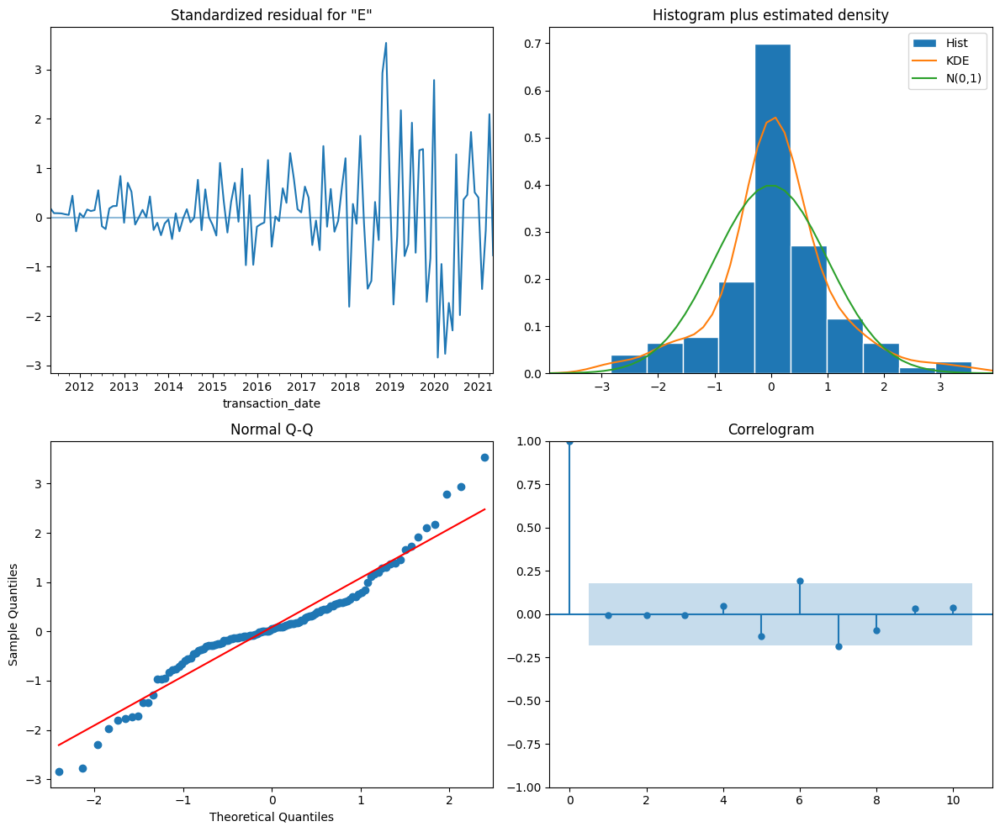

In [144]:
model = SARIMAX(county_information['Benton']['df'], order=(4,1,1), 
                seasonal_order=(0,0,1,12), enforce_invertibility=False, 
                enforce_stationarity=False).fit(maxiter=125)
evaluate_model(model)

For this model, we see that the residuals almost normally distributed with the two tail ends of the Q-Q plot showing a variance. The residuals over time don't show a clear seasonality and look like white noise. Even though some of the p-values are once again above the 0.05 alpha threshold, we will be using this model to predict the future EV counts in Benton County.

#### Plotting & Saving Predictions

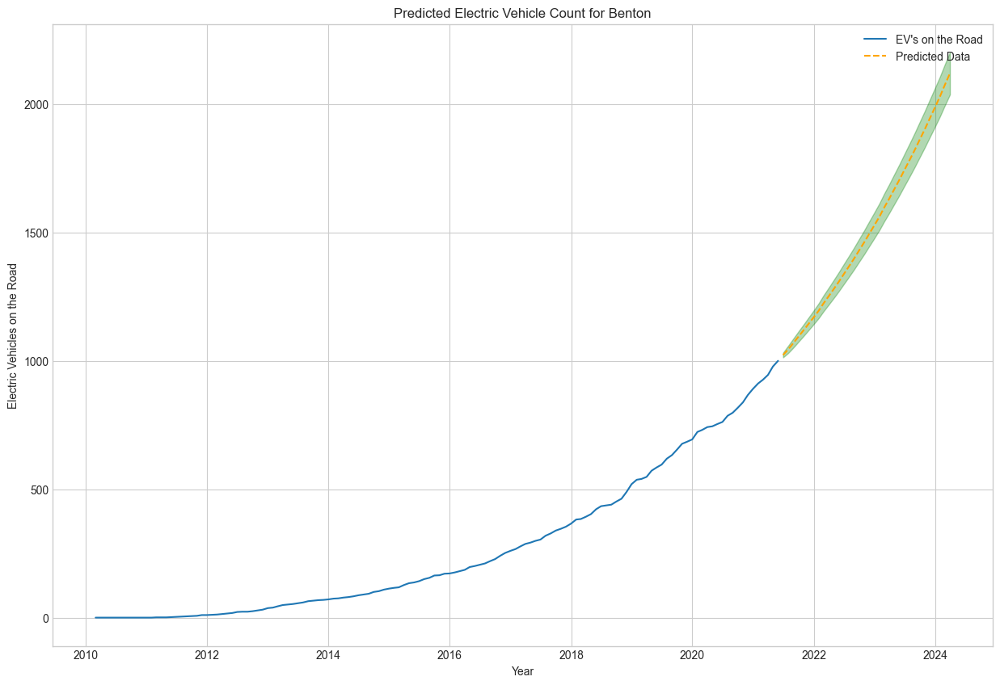

In [145]:
#getting and plotting predictions
df_benton_preds = get_prediction(model, county_information['Benton']['df'], 
                               test_benton, 'Benton', plot=True)

From the predictions, we can see that the EV counts in Benton County are expected to keep increasing exponentially in the coming years.

In [146]:
county_information['Benton']['Predictions'] = df_benton_preds

## Island County

### Seasonality Check


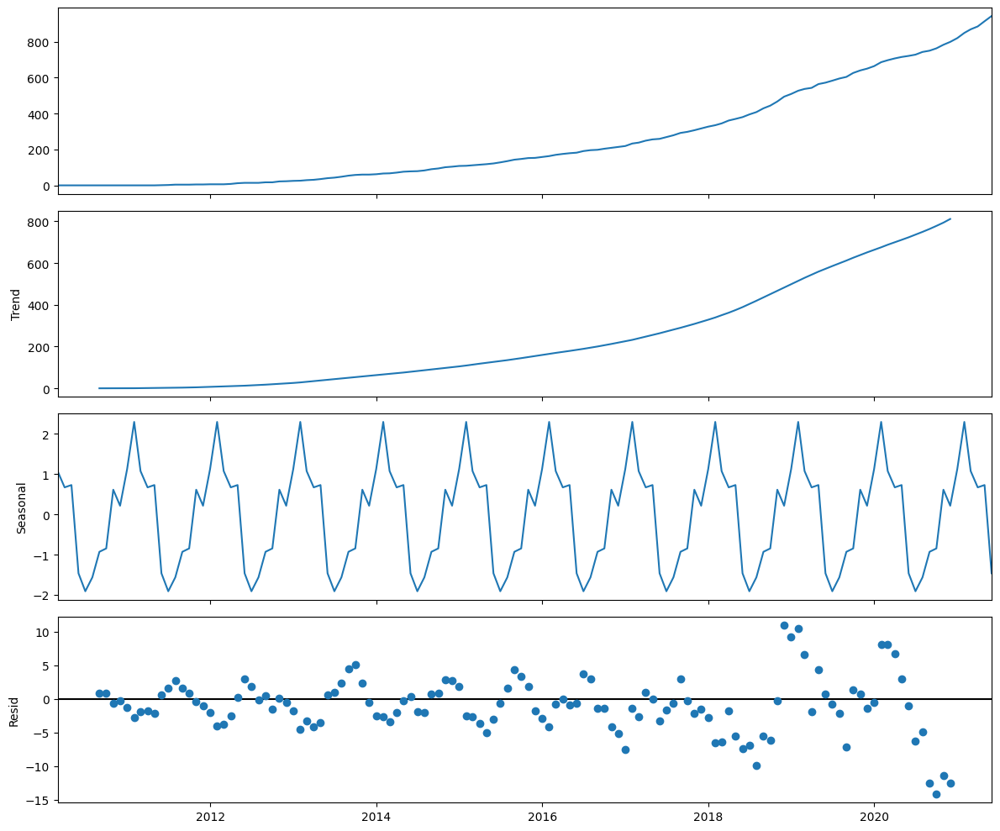

In [147]:
plt.rcParams['figure.figsize']=(12,10)
decomp = tsa.seasonal_decompose(county_information['Island']['df'])
decomp.plot();

The seasonal component of the time series for Island county is relatively small compared to some of the other counties that we've looked at so far. Similar to other counties, it has an upward trend line.

### train_test_split

After multiple iterations, we found that the 0.70-0.30 split of the data belonging to Island County resulted in the best performance.

In [148]:
#splitting dataset to train/test sets for validation
train_island, test_island = train_test_split_ts(county_information['Island']['df'], 
                                            0.70, 0.30)

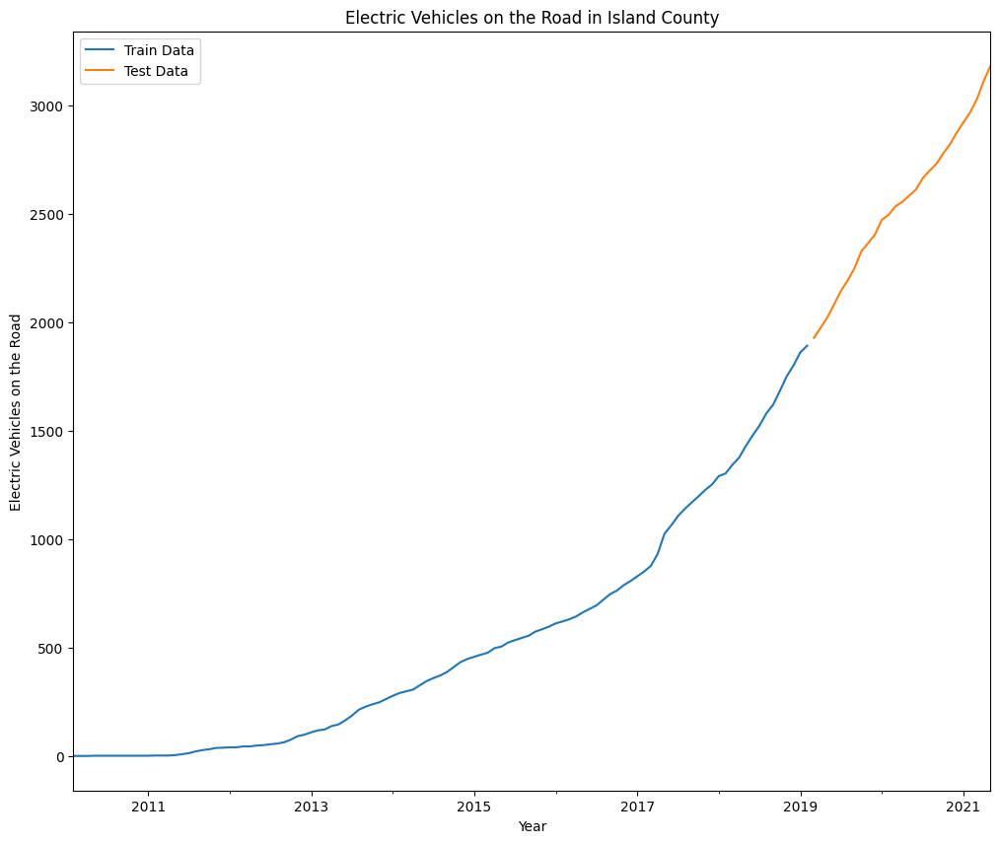

In [149]:
#plotting the split
plot_train_test_split(train_thurston, test_thurston, 'Island')

### Finding Best Parameters with Auto-Arima

In [150]:
#finding best parameters
auto_model = pm.auto_arima(train_island, start_p=0, start_q=0, d=1, max_p=4, 
                           max_q=4, max_P=3, max_Q=3, start_P=0, start_Q=0, 
                           m=12, verbose=2)
auto_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                   95
Model:               SARIMAX(1, 1, 1)   Log Likelihood                -206.406
Date:                Sun, 02 Jul 2023   AIC                            418.812
Time:                        09:11:06   BIC                            426.442
Sample:                    02-28-2010   HQIC                           421.894
                         - 12-31-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9972      0.007    142.474      0.000       0.983       1.011
ma.L1         -0.7891      0.073    -10.787      0.000      -0.932      -0.646
sigma2         4.5777      0.461      9.923      0.000       3.674       5.482
===================================================================================
Ljung-Box (L1) (Q):                   0.56   Jarque-Bera (JB):                30.39
Prob(Q):                              0.45   Prob(JB):                         0.00
Heteroskedasticity (H):               9.25   Skew:                             0.79
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.29
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

The best parameters (based on the AIC score) were (1,1,1) for the ARIMA order with no parameters for seasonality. This shows us that the models that had a seasonality order specified performed worse than this model. As discussed above, considering the relatively lower seasonality trend for Island County this is not exactly a surprise. We can go ahead and plug these into a SARIMAX model to have our final model and then we can validate it by looking at the forecasts and the test set.

### Validate Model with Forecasts for Test Data

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:       EV's on the Road   No. Observations:                   95
Model:               SARIMAX(1, 1, 1)   Log Likelihood                -196.957
Date:                Sun, 02 Jul 2023   AIC                            399.913
Time:                        09:11:07   BIC                            407.479
Sample:                    02-28-2010   HQIC                           402.967
                         - 12-31-2017                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0269      0.003    322.237      0.000       1.021       1.033
ma.L1         -1.0553      0.041    -25.487      0.000      -1.136      -0.974
sigma2         3.7369      0.455      8.219      0.000       2.846       4.628
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 7.95
Prob(Q):                              0.89   Prob(JB):                         0.02
Heteroskedasticity (H):               5.01   Skew:                             0.37
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.24
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

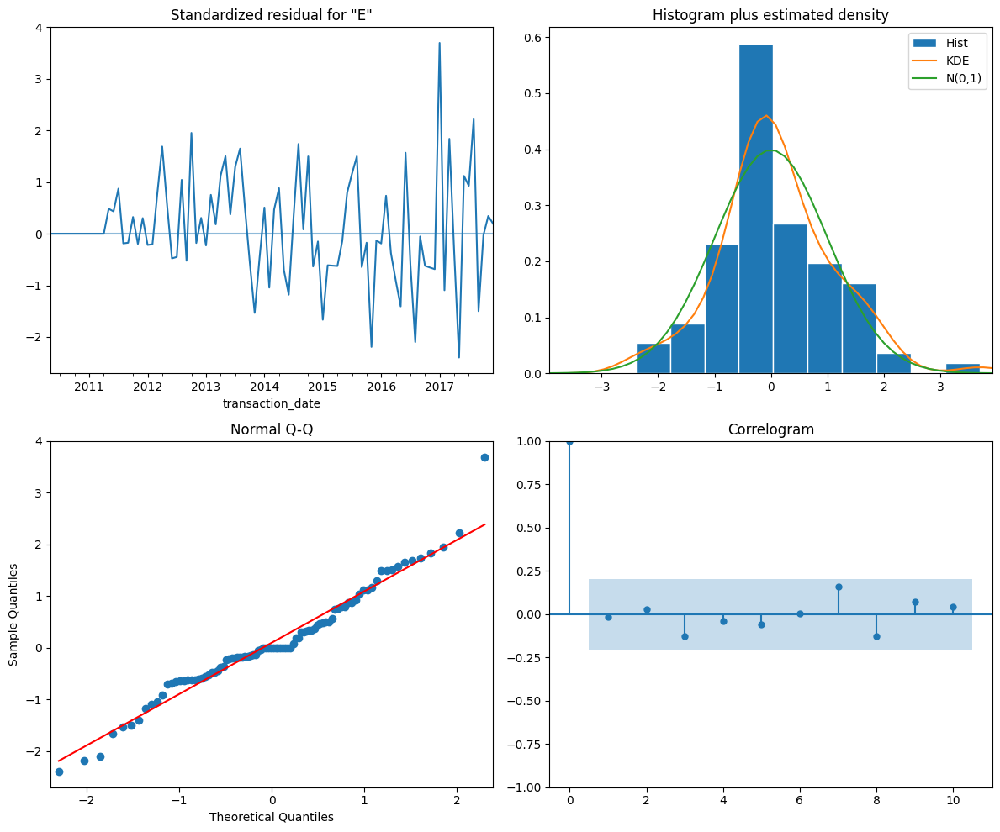

In [151]:
model = SARIMAX(train_island, order=(1,1,1), enforce_invertibility=False, 
                enforce_stationarity=False).fit()
evaluate_model(model)

The residuals for this model are almost perfectly normally distributed with no signs of seasonality. Additionally, all coefficients have statistically significant p-values.

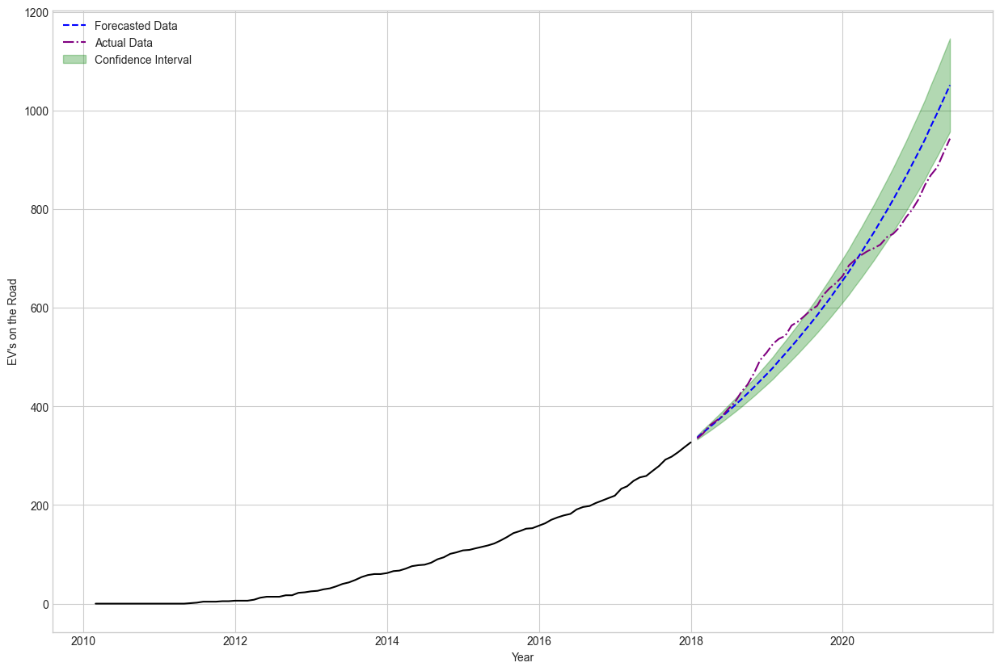

In [152]:
df_island_forecast = get_forecast(model, train_island, test_island, plot=True)

Above, we can see that the forecast of our model was fairly close to the observed data until around early 2020. As discussed for other county forecasts, this may be due to the COVID-19 pandemic affecting the electric vehicle market with supply chain issues starting in March 2020.

### Future Predictions

#### Fitting Model to All Observed Data

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:       EV's on the Road   No. Observations:                  136
Model:               SARIMAX(1, 1, 1)   Log Likelihood                -365.272
Date:                Sun, 02 Jul 2023   AIC                            736.543
Time:                        09:11:09   BIC                            745.214
Sample:                    02-28-2010   HQIC                           740.067
                         - 05-31-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0198      0.008    128.419      0.000       1.004       1.035
ma.L1         -0.6773      0.045    -15.009      0.000      -0.766      -0.589
sigma2        14.1986      1.440      9.860      0.000      11.376      17.021
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 8.09
Prob(Q):                              0.97   Prob(JB):                         0.02
Heteroskedasticity (H):              16.27   Skew:                             0.31
Prob(H) (two-sided):                  0.00   Kurtosis:                         4.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

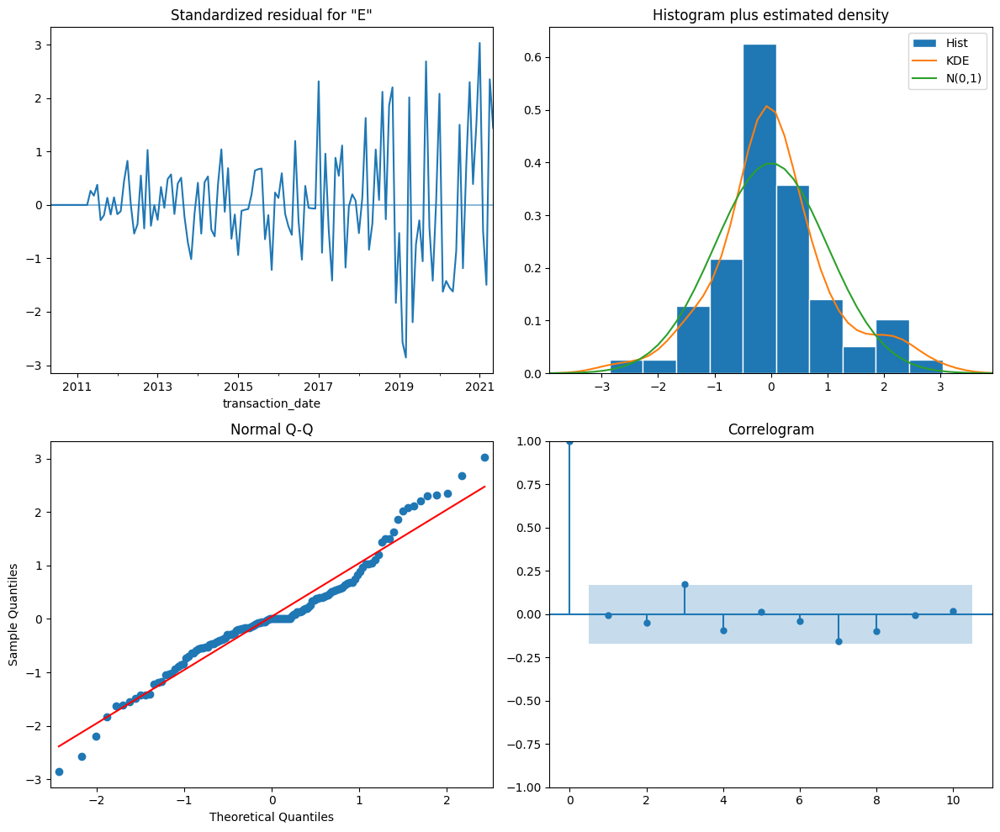

In [153]:
model = SARIMAX(county_information['Island']['df'], order=(1,1,1), 
                enforce_invertibility=False, 
                enforce_stationarity=False).fit()
evaluate_model(model)

Once again, above we can see that the residuals are normally distributed and there is no obvious seasonality that can be seen. The p-values of the coefficients are also all statistically significant based on an alpha of 0.05.

#### Plotting & Saving Predictions

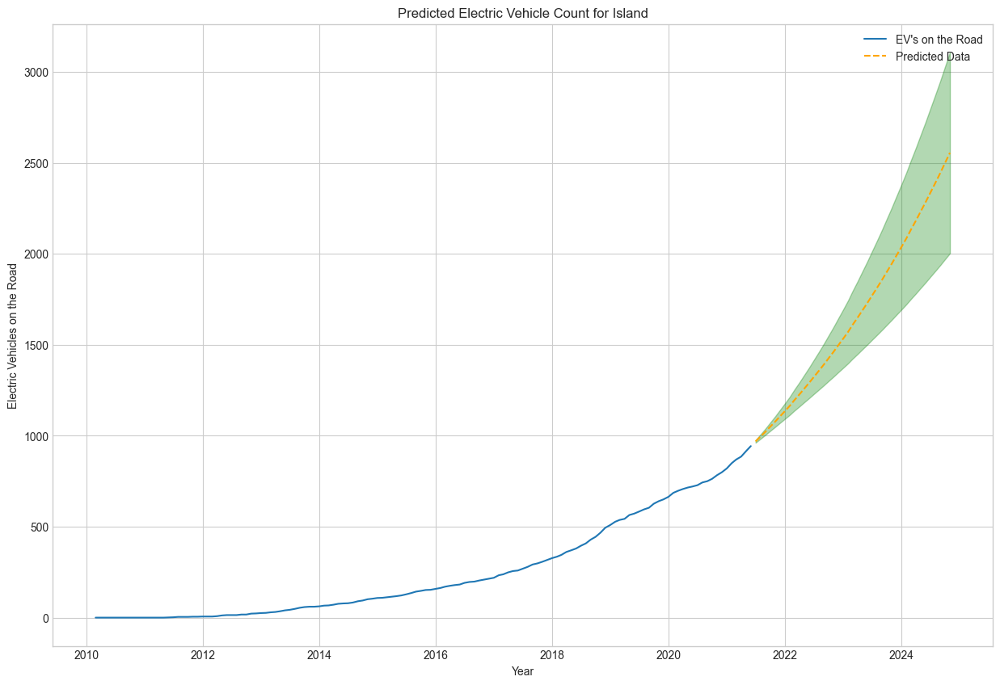

In [154]:
#getting and plotting predictions
df_island_preds = get_prediction(model, county_information['Island']['df'], 
                               test_island, 'Island', plot=True)

As we can see above, the model is predicting that the electric vehicle counts in Island County will keep growing exponentially in the coming years.

In [155]:
#saving predictions
county_information['Island']['Predictions'] = df_island_preds

# iNTERPRET

To be able to interpret our results correctly and find the counties with the most potential for investment, we need to take into account the existing charging infrastructure. As discussed in the introduction section, we will be gathering this information from the National Renewable Energy Laboratory's (NREL) API.

## Current Charger Infrastructure by County

### Importing the data

In [157]:
df_chargers=pd.read_csv(r'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Input_files\charging_infrastructure-07-13-2021.csv.gz')
df_chargers.head()

,access_code,access_days_time,access_detail_code,cards_accepted,date_last_confirmed,expected_date,fuel_type_code,groups_with_access_code,id,open_date,owner_type_code,status_code,station_name,station_phone,updated_at,facility_type,geocode_status,latitude,longitude,city,intersection_directions,plus4,state,street_address,zip,country,bd_blends,cng_dispenser_num,cng_fill_type_code,cng_psi,cng_renewable_source,cng_total_compression,cng_total_storage,cng_vehicle_class,e85_blender_pump,e85_other_ethanol_blends,ev_connector_types,ev_dc_fast_num,ev_level1_evse_num,ev_level2_evse_num,ev_network,ev_network_web,ev_other_evse,ev_pricing,ev_renewable_source,hy_is_retail,hy_pressures,hy_standards,hy_status_link,lng_renewable_source,lng_vehicle_class,lpg_primary,lpg_nozzle_types,ng_fill_type_code,ng_psi,ng_vehicle_class,access_days_time_fr,intersection_directions_fr,bd_blends_fr,groups_with_access_code_fr,ev_pricing_fr,ev_network_ids,federal_agency
0,public,24 hours daily,NaN,NaN,2021-01-14,NaN,ELEC,Public,33351,2018-01-15,LG,E,City of Lacey - City Hall Parking,360-491-3214,2021-03-11T23:22:17Z,MUNI_GOV,200-9,47.044011,-122.822404,Lacey,"At 3rd Ave SE, next to police station",NaN,WA,420 College St,98503,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,['J1772'],NaN,NaN,4.0,Non-Networked,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Public,NaN,NaN,NaN
1,public,24 hours daily; pay lot,NaN,NaN,2020-07-13,NaN,ELEC,Public,33717,2010-03-01,P,E,Seattle-Tacoma International Airport - General...,206-787-5388,2021-03-11T23:22:17Z,AIRPORT,200-8,47.443377,-122.296229,Seattle,"5th floor parking garage; rows D, G, and I",NaN,WA,17801 Pacific Hwy S,98188,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,['NEMA520'],NaN,36.0,NaN,Non-Networked,NaN,NaN,Free,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Public,NaN,NaN,NaN
2,public,24 hours daily,NaN,NaN,2020-09-03,NaN,ELEC,Public,35337,2009-08-15,P,E,Haggen Food & Pharmacy,360-754-1428,2021-03-11T23:22:17Z,GROCERY,200-8,47.035421,-122.938962,Olympia,In front of the building on the left hand side,NaN,WA,1313 Cooper Point Rd SW,98502,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,['NEMA520'],NaN,2.0,NaN,Non-Networked,NaN,NaN,Free,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Public,NaN,NaN,NaN
3,public,24 hours daily,NaN,NaN,2021-02-15,NaN,ELEC,Public,35620,2010-04-15,P,E,Avista Corp,509-489-0500,2021-03-11T23:22:17Z,OFFICE_BLDG,GPS,47.673347,-117.388933,Spokane,NaN,NaN,WA,1411 E Mission Ave,99252,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"['J1772', 'NEMA520']",NaN,1.0,2.0,Non-Networked,NaN,NaN,Free,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Public,NaN,NaN,NaN
4,public,24 hours daily,NaN,NaN,2021-02-15,NaN,ELEC,Public,35621,2010-04-15,P,E,Steam Plant Grill,509-777-3900,2021-03-11T23:22:17Z,RESTAURANT,200-8,47.654998,-117.425025,Spokane,NaN,NaN,WA,159 S Lincoln St,99201,US,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,['J1772'],NaN,NaN,1.0,Non-Networked,NaN,NaN,Free,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Public,NaN,NaN,NaN


In [158]:
len(df_chargers)

1686

In [159]:
#getting planned charger count
df_chargers['status_code'].value_counts()

status_code
E    1684
T       1
P       1
Name: count, dtype: int64

In our charger dataframe we have a total of 1686 charging stations (1 planned). To be able to compare the existing infrastructure in each county, we need to figure out how many stations there are in each county. Unfortunately, the data that we have does not have county information but has the zipcode of each station. We can use these zipcodes to figure out in which county each of these stations are.

### Creating Zipcode Map to Find Counties

In [160]:
!pip install --upgrade uszipcode


  Using cached uszipcode-1.0.1-py2.py3-none-any.whl (35 kB)
  Using cached attrs-23.1.0-py3-none-any.whl (61 kB)
  Using cached pathlib_mate-1.2.1-py2.py3-none-any.whl (121 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Using cached fuzzywuzzy-0.18.0-py2.py3-none-any.whl (18 kB)
  Using cached haversine-2.8.0-py2.py3-none-any.whl (7.7 kB)
     ---------------------------------------- 2.0/2.0 MB 9.1 MB/s eta 0:00:00
  Using cached sqlalchemy_mate-1.4.28.4-py2.py3-none-any.whl (77 kB)
     ------------------------------------- 192.1/192.1 kB 11.4 MB/s eta 0:00:00
     ---------------------------------------- 1.6/1.6 MB 10.1 MB/s eta 0:00:00
  Using cached prettytable-3.8.0-py3-none-any.whl (27 kB)
  Created wheel for atomicwrites: filename=atomicwrites-1.4.1-py2.py3-none-any.whl size=6973 sha256=f97ee43262aba7198343048c54555aefbcd7a68a6904c837e952b7ae7b484f37
  Stored in directory: c:\users\pmoff\appdata\local\pip\cache\wheels\

In [161]:
from uszipcode import SearchEngine

c:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\venv\lib\site-packages\fuzzywuzzy\fuzz.py:11: UserWarning: Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning
  warnings.warn('Using slow pure-python SequenceMatcher. Install python-Levenshtein to remove this warning')


In [162]:
#Creating a dictionary that shows which county each zipcode is in
zipcodes_to_search = list(df_chargers['zip'].unique())
search = SearchEngine(simple_or_comprehensive=SearchEngine.SimpleOrComprehensiveArgEnum.simple)
zip_map = {}
for zipcode in zipcodes_to_search:
    zip_info = search.by_zipcode(zipcode)
    zip_map[zipcode] = zip_info.values()[5].split()[0]

zip_map

{98503: 'Thurston',
 98188: 'King',
 98502: 'Thurston',
 99252: 'Spokane',
 99201: 'Spokane',
 98004: 'King',
 98506: 'Thurston',
 98505: 'Thurston',
 98501: 'Thurston',
 98027: 'King',
 98052: 'King',
 98011: 'King',
 98072: 'King',
 98002: 'King',
 98229: 'Whatcom',
 98312: 'Kitsap',
 98148: 'King',
 98026: 'Snohomish',
 98204: 'Snohomish',
 99301: 'Franklin',
 98362: 'Clallam',
 98371: 'Pierce',
 98058: 'King',
 99218: 'Spokane',
 99212: 'Spokane',
 98409: 'Pierce',
 98662: 'Clark',
 99362: 'Walla',
 98201: 'Snohomish',
 98104: 'King',
 98402: 'Pierce',
 98006: 'King',
 98007: 'King',
 98075: 'King',
 98032: 'King',
 98055: 'King',
 98056: 'King',
 98057: 'King',
 98134: 'King',
 98133: 'King',
 98124: 'King',
 98109: 'King',
 98103: 'King',
 98106: 'King',
 98901: 'Yakima',
 98272: 'Snohomish',
 98296: 'Snohomish',
 98283: 'Skagit',
 98277: 'Island',
 98684: 'Clark',
 98108: 'King',
 98801: 'Chelan',
 98273: 'Skagit',
 98101: 'King',
 98382: 'Clallam',
 98424: 'Pierce',
 98366: 'Ki

### Feature Engineering 'county' Column for df_chargers

In [163]:
#mapping county information for each charger based on zipcode
df_chargers['county'] = df_chargers['zip'].map(zip_map)
df_chargers['county'].head()

0    Thurston
1        King
2    Thurston
3     Spokane
4     Spokane
Name: county, dtype: object

### Saving Total Electrical Charger Count in Each County

Now that we know in which county each charging station is, we can see how many stations there are in each county and save this information.

In [164]:
df_charger_counts = pd.DataFrame(df_chargers['county'].value_counts())
df_charger_counts.reset_index(inplace=True)
df_charger_counts.columns=['County', 'Charger Count']
df_charger_counts

,County,Charger Count
0,King,846
1,Pierce,123
2,Snohomish,104
3,Spokane,70
4,Clark,66
5,Thurston,62
6,Kitsap,61
7,Benton,61
8,Chelan,37
9,Whatcom,32


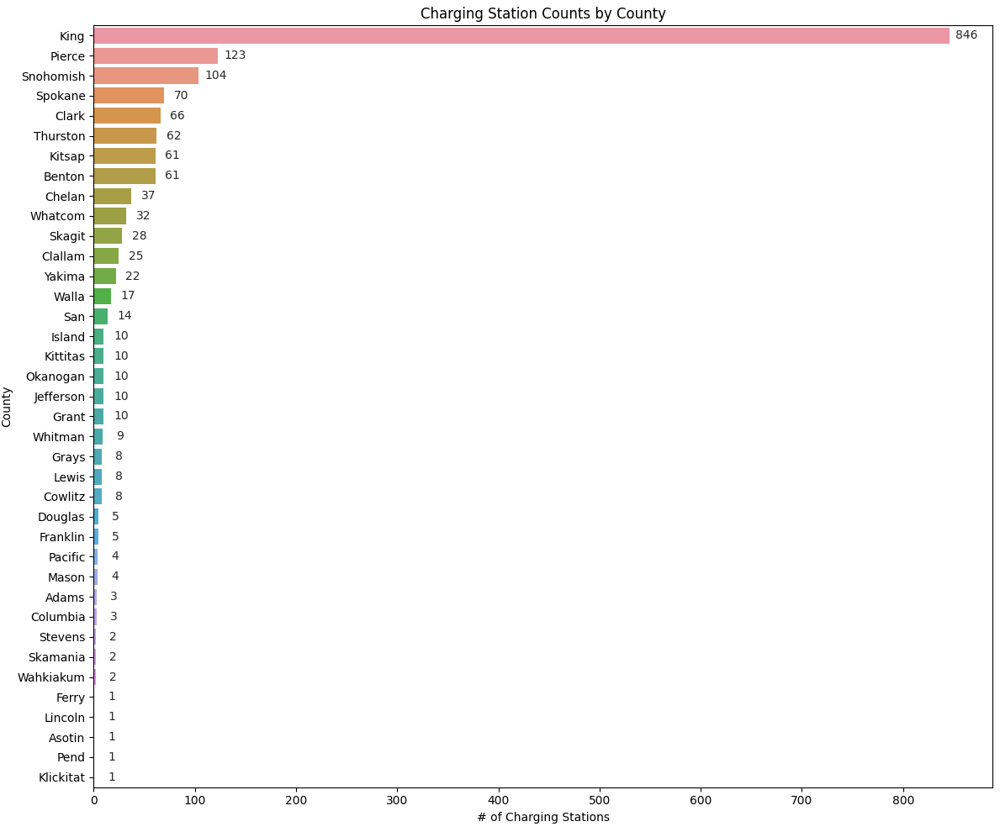

In [165]:
fig, ax = plt.subplots()
with plt.style.context('seaborn-whitegrid'):
    sns.barplot(x='Charger Count', y='County', data=df_charger_counts, orient='h', ax=ax)
    ax.set_title('Charging Station Counts by County')
    ax.set_xlabel('# of Charging Stations')
    x_labels = list(df_charger_counts['Charger Count'])
    rects = ax.patches

    for rect, label in zip(rects, x_labels):
        width = rect.get_width()
        ax.text(rect.get_width()+17, rect.get_y()+0.5*rect.get_height(),
                 '%d' % int(width),
                 ha='center', va='center')
    plt.tight_layout();
#plt.savefig('images/charger_counts.png', facecolor='white')

Above, we can see that King County has by far the most amount of chargers compared to other counties followed by Pierce and Snohomish.

## County Comparison

### Creating a DataFrame for Comparison

To be able to accurately compare each county, we need to put all of the information we have been gathering together in one dataframe. For each county, we will be looking at how many electric vehicles there are today (May 31, 2021) and in August 31, 2023 to find how many cars will be getting added over the next 2 years as well as what the ratios of these counts are to the number of existing charging stations.

In [166]:
comparison_df=pd.DataFrame()
i=0
for county in top_ten_counties:
    comparison_df.loc[i, 'County']=county
    
    comparison_df.loc[i, 'EV Count for 2021-05-31']= \
    county_information[county]['df']["EV's on the Road"][-1]
    
    comparison_df.loc[i, 'EV Prediction for 2023-08-31'] = \
    round(county_information[county]['Predictions']['Predictions'][26],0)
    
    comparison_df.loc[i, 'Existing Charger Count'] = \
    int(df_charger_counts[df_charger_counts['County']==county]['Charger Count'])
    i+=1

comparison_df['Chargers per EV'] = \
round(comparison_df['Existing Charger Count']/\
      comparison_df['EV Prediction for 2023-08-31'],3)

comparison_df['EVs per Charger'] = \
round(comparison_df['EV Prediction for 2023-08-31']/\
      comparison_df['Existing Charger Count'],0)

comparison_df['EVs Added (Today-2023)'] = \
comparison_df['EV Prediction for 2023-08-31'] - comparison_df['EV Count for 2021-05-31']

comparison_df.sort_values('EV Prediction for 2023-08-31', ascending=False, 
                          inplace=True)
comparison_df.set_index('County', inplace=True)
comparison_df

C:\Users\pmoff\AppData\Local\Temp\ipykernel_20424\1001678714.py:13: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  int(df_charger_counts[df_charger_counts['County']==county]['Charger Count'])
C:\Users\pmoff\AppData\Local\Temp\ipykernel_20424\1001678714.py:13: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  int(df_charger_counts[df_charger_counts['County']==county]['Charger Count'])


,EV Count for 2021-05-31,EV Prediction for 2023-08-31,Existing Charger Count,Chargers per EV,EVs per Charger,EVs Added (Today-2023)
County,,,,,,
King,51209.0,74875.0,846.0,0.011,89.0,23666.0
Snohomish,9423.0,17117.0,104.0,0.006,165.0,7694.0
Clark,5294.0,11887.0,66.0,0.006,180.0,6593.0
Pierce,6652.0,11407.0,123.0,0.011,93.0,4755.0
Kitsap,3097.0,5653.0,61.0,0.011,93.0,2556.0
Thurston,3181.0,5299.0,62.0,0.012,85.0,2118.0
Spokane,1973.0,3507.0,70.0,0.020,50.0,1534.0
Whatcom,2081.0,3122.0,32.0,0.010,98.0,1041.0
Island,943.0,1855.0,10.0,0.005,186.0,912.0


As we can see above, according to our models, we are predicting that most amount of electric vehicles will be joining the roads in King County. However, the most amount of charging stations are also in King County. This is not exactly unexpected since the largest city in Washington State, Seattle, is in King County as well. 

Therefore, instead of looking at raw counts, calculating the ratio between electric vehicles to charging stations will allow us to find the best counties for investing. The "EVs per Charger" column contains the ratio between the count of future electric vehicles to the count of chargers that exist today. For each county, a large value in this column would suggest that there will be more of a demand for chargers in this county compared to others.

In [167]:
col_list = list(comparison_df.columns)
col_list.remove('Chargers per EV')

In [168]:
for col in col_list:
    comparison_df[col] = comparison_df[col].astype('int64')

In [169]:
comparison_df.sort_values('EVs per Charger', ascending=False, inplace=True)
comparison_df.style.background_gradient(axis=0, subset=['EVs per Charger'], 
                                        cmap='RdYlGn_r')


,EV Count for 2021-05-31,EV Prediction for 2023-08-31,Existing Charger Count,Chargers per EV,EVs per Charger,EVs Added (Today-2023)
County,,,,,,
Island,943,1855,10,0.005000,186,912
Clark,5294,11887,66,0.006000,180,6593
Snohomish,9423,17117,104,0.006000,165,7694
Whatcom,2081,3122,32,0.010000,98,1041
Pierce,6652,11407,123,0.011000,93,4755
Kitsap,3097,5653,61,0.011000,93,2556
King,51209,74875,846,0.011000,89,23666
Thurston,3181,5299,62,0.012000,85,2118
Spokane,1973,3507,70,0.020000,50,1534


### Other Factors to Consider

When we sort by "EVs per Charger" column, we see that Island County followed by Clark and Snohomish counties have by far the highest values. This suggests that these counties will have more demand for charging stations in the future. 

However, this does not show us the full picture. From our discussions with a electric charging company representative, we learned that additional factors such as the ones below may affect the decision to establish a charging station:

- Proximity to airports
- Proximity to highway entrances
- Proximity to commercial centers/office buildings

Airports generate a lot of traffic with a lot of people using rideshare services such as Uber or Lyft to get to or leave the airport. Charging stations close to airports tend to attract drivers who are working as rideshare drivers while they are waiting for their next passenger. 

Highway entrances are also important since highways inherently have a lot of traffic on them and people travelling long distances may need to charge up (sometimes multiple times) along the highway corridor. Additionally, drivers may want to charge their vehicles prior to getting on the highway.

According to Forbes, "80% of EV charging is done at home —almost always overnight— or while a car is parked during the workday"[³](https://www.forbes.com/wheels/news/jd-power-study-electric-vehicle-owners-prefer-dedicated-home-charging-stations/). This makes it incredibly important for public charging stations to be in close proximity to commercial centers and office buildings so that people shopping or working can charge their cars in the meantime.

Our analysis is at the county level and therefore we are not looking at specific locations within the counties to properly take these factors into account (see Limitations & Next Steps section). However, at a high level, we can still factor these into our analysis (see below).

### Top 4 County Comparison

Even though Island County is leading the EVs per Charger ratio discussed above, when we look at additional factors, this county seems less than ideal for establishing chargers. Firstly, Island County consists of a series of islands and has mostly residential buildings and state parks. The electric vehicle owners living in this county will most likely be charging their vehicles at their own homes instead of using commercial charging stations. There are no airports in this county. Additionally, due to the limitations of the land, the population in this county may stagnate in the future which may translate into the demand stagnating as well. Therefore, we do not recommend Island County to be one of the investment counties.

Looking at Clark County, it is located right outside of Portland, OR and has many commercial districts. This not only means that the EV owners in Clark County would be using commercial chargers when they are at these commercial centers but also vehicles coming from outside of the county would be creating demand as well. Portland Airport (PDX) is also right across Columbia river which makes Whatcom County the perfect place for rideshare vehicles to charge up.

Snohomish County contains Everett (which is the 7th largest city in WA State) and is located north of Seattle. In addition to many commercial centers, it also contains the tail-end of Highway 2 and the Paine Field Airport (PAE). Therefore, Snohomish County could be a profitable place to invest in for an EV charging company.

Lastly, when we look at Whatcom County, it is located right outside of Vancouver. This makes Whatcom County the last stop prior to leaving the US or first stop when entering the US, which could incentivize travelers to charge up prior to leaving or after entering. Bellingham (12th largest city in WA State) and Bellingham Airport (BLI) are both located in Whatcom County as well. This means that there are various commercial centers/offices around western Whatcom County. Additionally, one of the major highways of the West Coast, Highway 5, also runs through the county and connects Bellingham to Seattle and beyond.

# CONCLUSIONS & RECOMMENDATIONS

To sum up, the momentum behind electric vehicles - generated by the recent advancements in technology and policy - makes today an ideal time to invest in charging infrastructure. As one of the states that is leading the charge in electrifying transportation, Washington State is one of the best places in the United States to build new charging stations. Below are our takeaways and recommendations:

- The electric vehicle counts in each county has been increasing exponentially for the past 10 years. Our models predicted that this trend will continue for at least the next few years. 

- Nissan Leaf and Tesla Model 3 were the most preferred electric vehicles in each county.

As discussed in the Interpret section, there are many factors at play when trying to find the optimum locations for EV charging stations. Based on our discussion of these factors above and predictions on the electrical vehicle counts in each county for August, 2023, we believe that the following counties have great potential in being highly profitable for an electric vehicle charging company:

**1.** Clark County

**2.** Snohomish County

**3.** Whatcom County

Therefore, we recommend electric vehicle charging companies invest in these counties.

## Electric Vehicle Predictions for Clark, Snohomish and Whatcom Counties

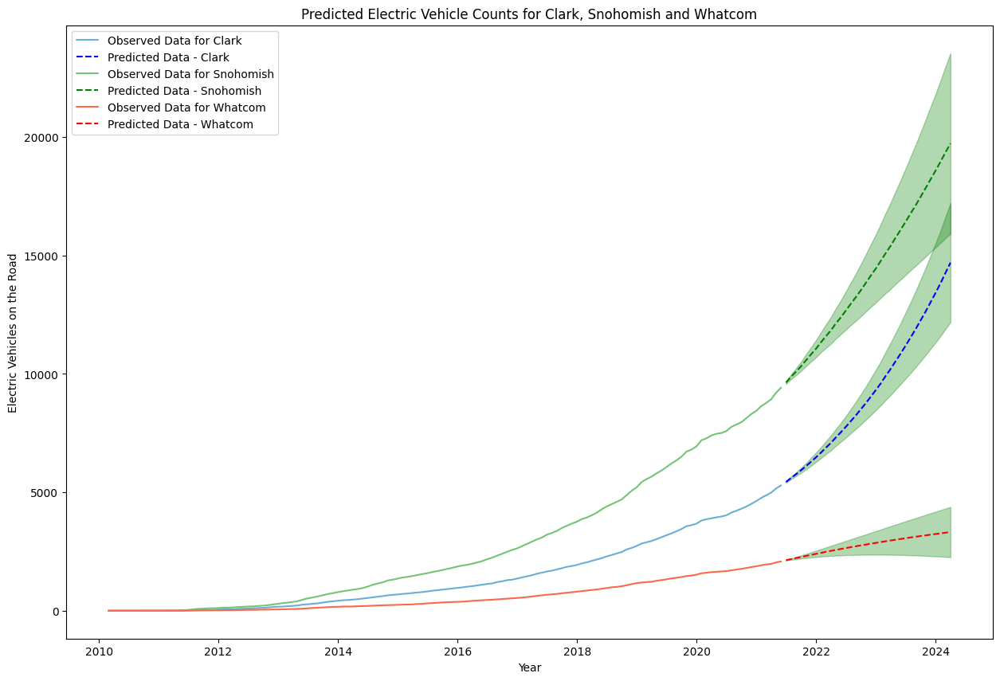

In [170]:
fig, ax = plt.subplots(figsize=(15, 10))
ax.set_xlabel('Year')
ax.set_ylabel('Electric Vehicles on the Road')
ax.set_title(f'Predicted Electric Vehicle Counts for Clark, Snohomish and Whatcom')

for county in ['Clark', 'Snohomish', 'Whatcom']:
    prediction_df = county_information[county]['Predictions']
    
    if county == 'Clark':
        palette = 'Blues'
        color='blue'
    elif county == 'Snohomish':
        palette='Greens'
        color='green'
    else:
        palette='Reds'
        color='red'
    with plt.style.context('seaborn-whitegrid'):
                county_df = county_information[county]['df']
                county_df.columns=[f'Observed Data for {county}']
                sns.lineplot(data=county_df, ax=ax, 
                             palette=palette)
                sns.lineplot(data=prediction_df, x=prediction_df.index, 
                             y='Predictions', color=color, ax=ax,  
                             label=f'Predicted Data - {county}', ls='--')
                ax.fill_between(prediction_df.index, 
                                y1=prediction_df['Lower Confidence Interval'], 
                                y2=prediction_df['Upper Confidence Interval'], 
                                alpha=0.3, color='green')
ax.legend(loc=2);

## Limitations & Next Steps

Due to time limitations, we had to limit the modeling exercise to 10 counties out of the 39 counties that are located in Washington State. Even though we took the top 10 counties with the most electric vehicle purchase transactions, there may be other counties that are promising for future electric vehicle demand. In the future, we would like to model the electric vehicle counts for all counties in Washington to have a more comprehensive analysis.

Furthermore, conducting an analysis at both the city and zipcode level could be fruitful. As discussed in the Interpret section, there are many factors that may affect the success of an electric vehicle charging station. To be able to account for these factors and inform decisions regarding the exact locations of the electric vehicle chargers, looking at the data on a city or even zipcode level would be necessary.

Additionally, we used the "Original Title" transactions to infer the amount of electric vehicles on the road in each county. The "Transfer Title" transactions could have revealed more information about the used electric vehicle market and provided us with a more holistic picture of the demand for electric vehicles and chargers. For example, if people in a growing county are mainly purchasing used electric vehicles, it can still be a great county to invest in for an EV charging company. As one of our next steps, we would like to incorporate the used car transactions into our analysis and keep track of these cars as they move from one county to the next (deducting them from the vehicle count in the originating county and adding them to the new county).

We think that analyzing the commuting patterns of residents in each county could help put this information into context. As we discussed above, most charging is done at home or at work. Finding counties that people tend to commute into for work, and accounting for this effect by adjusting the anticipated demand for chargers in these counties would result in more accurate recommendations.

Lastly, expanding the scope of this analysis to other states and other countries can further help EV charging companies looking to grow their charging network on a national and global scale.

# Appendix A: Monthly Electric Vehicle Count Predictions for Each County

## King County

In [171]:
round(county_information['King']['Predictions'],0)

,Lower Confidence Interval,Upper Confidence Interval,Predictions
2021-06-30,51570.0,52346.0,51958.0
2021-07-31,52468.0,53860.0,53164.0
2021-08-31,52845.0,54780.0,53812.0
2021-09-30,53232.0,55643.0,54438.0
2021-10-31,53867.0,56696.0,55282.0
2021-11-30,54697.0,57901.0,56299.0
2021-12-31,55271.0,58815.0,57043.0
2022-01-31,56241.0,60098.0,58170.0
2022-02-28,56785.0,60931.0,58858.0
2022-03-31,57321.0,61739.0,59530.0


## Snohomish County

In [172]:
round(county_information['Snohomish']['Predictions'],0)

,Lower Confidence Interval,Upper Confidence Interval,Predictions
2021-06-30,9573.0,9695.0,9634.0
2021-07-31,9774.0,9980.0,9877.0
2021-08-31,9948.0,10244.0,10096.0
2021-09-30,10125.0,10517.0,10321.0
2021-10-31,10330.0,10826.0,10578.0
2021-11-30,10520.0,11128.0,10824.0
2021-12-31,10703.0,11430.0,11067.0
2022-01-31,10919.0,11772.0,11346.0
2022-02-28,11088.0,12075.0,11582.0
2022-03-31,11270.0,12397.0,11834.0


## Pierce County

In [173]:
round(county_information['Pierce']['Predictions'],0)

,Lower Confidence Interval,Upper Confidence Interval,Predictions
2021-06-30,6783.0,6851.0,6817.0
2021-07-31,6923.0,7042.0,6982.0
2021-08-31,7057.0,7227.0,7142.0
2021-09-30,7169.0,7388.0,7278.0
2021-10-31,7332.0,7600.0,7466.0
2021-11-30,7453.0,7769.0,7611.0
2021-12-31,7571.0,7935.0,7753.0
2022-01-31,7743.0,8153.0,7948.0
2022-02-28,7840.0,8294.0,8067.0
2022-03-31,7960.0,8459.0,8209.0


## Clark County

In [174]:
round(county_information['Clark']['Predictions'],0)

,Lower Confidence Interval,Upper Confidence Interval,Predictions
2021-06-30,5404.0,5466.0,5435.0
2021-07-31,5550.0,5661.0,5605.0
2021-08-31,5685.0,5846.0,5766.0
2021-09-30,5824.0,6038.0,5931.0
2021-10-31,5969.0,6240.0,6105.0
2021-11-30,6122.0,6455.0,6288.0
2021-12-31,6282.0,6680.0,6481.0
2022-01-31,6449.0,6919.0,6684.0
2022-02-28,6604.0,7149.0,6877.0
2022-03-31,6768.0,7393.0,7081.0


## Thurston County

In [175]:
round(county_information['Thurston']['Predictions'],0)

,Lower Confidence Interval,Upper Confidence Interval,Predictions
2021-06-30,3228.0,3272.0,3250.0
2021-07-31,3284.0,3362.0,3323.0
2021-08-31,3336.0,3451.0,3393.0
2021-09-30,3385.0,3542.0,3464.0
2021-10-31,3436.0,3638.0,3537.0
2021-11-30,3484.0,3734.0,3609.0
2021-12-31,3533.0,3835.0,3684.0
2022-01-31,3580.0,3936.0,3758.0
2022-02-28,3625.0,4039.0,3832.0
2022-03-31,3672.0,4147.0,3909.0


## Kitsap County

In [176]:
round(county_information['Kitsap']['Predictions'],0)

,Lower Confidence Interval,Upper Confidence Interval,Predictions
2021-06-30,3149.0,3186.0,3168.0
2021-07-31,3214.0,3281.0,3248.0
2021-08-31,3284.0,3380.0,3332.0
2021-09-30,3346.0,3479.0,3412.0
2021-10-31,3407.0,3582.0,3495.0
2021-11-30,3470.0,3690.0,3580.0
2021-12-31,3531.0,3800.0,3665.0
2022-01-31,3591.0,3912.0,3752.0
2022-02-28,3652.0,4028.0,3840.0
2022-03-31,3711.0,4147.0,3929.0


## Whatcom County

In [177]:
round(county_information['Whatcom']['Predictions'],0)

,Lower Confidence Interval,Upper Confidence Interval,Predictions
2021-06-30,2116.0,2147.0,2131.0
2021-07-31,2148.0,2206.0,2177.0
2021-08-31,2178.0,2270.0,2224.0
2021-09-30,2204.0,2334.0,2269.0
2021-10-31,2228.0,2400.0,2314.0
2021-11-30,2249.0,2466.0,2358.0
2021-12-31,2268.0,2533.0,2401.0
2022-01-31,2285.0,2601.0,2443.0
2022-02-28,2300.0,2669.0,2485.0
2022-03-31,2314.0,2738.0,2526.0


## Spokane County

In [178]:
round(county_information['Spokane']['Predictions'],0)

,Lower Confidence Interval,Upper Confidence Interval,Predictions
2021-06-30,2005.0,2035.0,2020.0
2021-07-31,2041.0,2095.0,2068.0
2021-08-31,2080.0,2153.0,2116.0
2021-09-30,2114.0,2203.0,2158.0
2021-10-31,2169.0,2273.0,2221.0
2021-11-30,2211.0,2328.0,2270.0
2021-12-31,2251.0,2381.0,2316.0
2022-01-31,2302.0,2443.0,2372.0
2022-02-28,2326.0,2478.0,2402.0
2022-03-31,2367.0,2529.0,2448.0


## Benton County

In [179]:
round(county_information['Benton']['Predictions'],0)

,Lower Confidence Interval,Upper Confidence Interval,Predictions
2021-06-30,1013.0,1032.0,1023.0
2021-07-31,1030.0,1059.0,1045.0
2021-08-31,1051.0,1087.0,1069.0
2021-09-30,1073.0,1114.0,1094.0
2021-10-31,1096.0,1141.0,1119.0
2021-11-30,1119.0,1168.0,1143.0
2021-12-31,1142.0,1196.0,1169.0
2022-01-31,1167.0,1224.0,1195.0
2022-02-28,1192.0,1254.0,1223.0
2022-03-31,1218.0,1284.0,1251.0


## Island County

In [180]:
round(county_information['Island']['Predictions'],0)

,Lower Confidence Interval,Upper Confidence Interval,Predictions
2021-06-30,962.0,976.0,969.0
2021-07-31,983.0,1008.0,995.0
2021-08-31,1005.0,1040.0,1022.0
2021-09-30,1026.0,1073.0,1050.0
2021-10-31,1048.0,1107.0,1078.0
2021-11-30,1071.0,1142.0,1106.0
2021-12-31,1093.0,1178.0,1135.0
2022-01-31,1115.0,1215.0,1165.0
2022-02-28,1137.0,1253.0,1195.0
2022-03-31,1160.0,1292.0,1226.0


### Save predicted output csv files

In [190]:
import os

# Assuming `county_information` is a dictionary containing county information

for i in county_information:
    df = round(county_information[i]['Predictions'], 0)
    folder_path = r"C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\Chargers_predictions"
    # Create the directory if it doesn't exist
    os.makedirs(folder_path, exist_ok=True)
    output_file_name = i + "_Prediction.csv"
    output_file_path = os.path.join(folder_path, output_file_name)
    # Save the output DataFrame to CSV
    df.to_csv(output_file_path, index=False)
    # Confirmation message
    print(f"Output DataFrame saved to '{output_file_path}'")


Output DataFrame saved to 'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\Chargers_predictions\Snohomish_Prediction.csv'
Output DataFrame saved to 'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\Chargers_predictions\Pierce_Prediction.csv'
Output DataFrame saved to 'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\Chargers_predictions\Clark_Prediction.csv'
Output DataFrame saved to 'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\Chargers_predictions\Thurston_Prediction.csv'
Output DataFrame saved to 'C:\Users\pmoff\OneDrive\Desktop\PWSkills\MLProjects\EV_E_Mobility\.2_Electric_Vehicles_and_Chargers_in_Washington_State\Output_files\Chargers_predictions